In [95]:
import math
import torch
import gpytorch
import numpy as np
from matplotlib import pyplot as plt
from scipy import io

# Get data

In [2]:
singlemuscle_singlecontact_sweeppw_5muscles_250pts = np.genfromtxt('/Volumes/L_MillerLab/limblab/User_folders/Aajan/PNS_Modeling_Toolbox-main/COMSOL_Modeling/mmActivationMatrix_SweepPW_5muscles_250pts.csv', delimiter=',')

# Plot Data

In [3]:
def get_curves_2(data, pulse_amplitude, contact):
    #this function returns the muscle activation as a function of pulse width for all muscles for a particular 
        #contact at a particular pulse amplitude
    #pulse amp values range between 1.5 and 3 mA (500 to 3000 uA) at an increment of 0.5mA
    #pulse width values range between 1 and 250 at an increment of 1
    contact_start, contact_finish = (contact)*(5*250), (contact+1)*(5*250)
    curves_contact = data[contact_start:contact_finish,:]
    i = (pulse_amplitude-0.5)/0.5
    pa_start, pa_finish = int((i-1)*250), int(i*250)
    curves_contact_amp = curves_contact[pa_start:pa_finish,:]
    return(curves_contact_amp)

Pulse Amplitude: 1.0


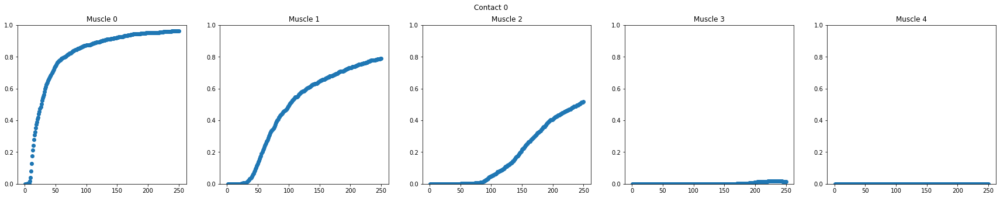

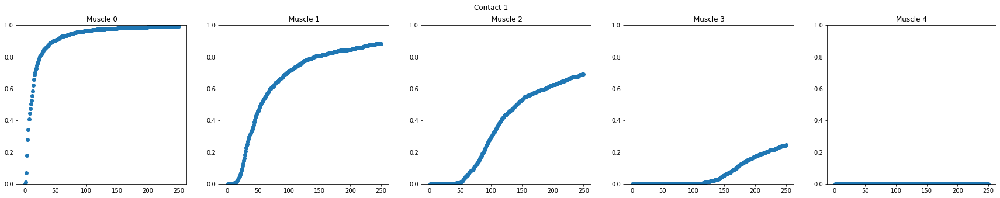

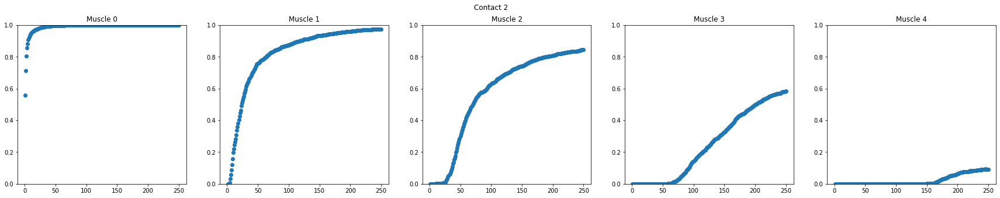

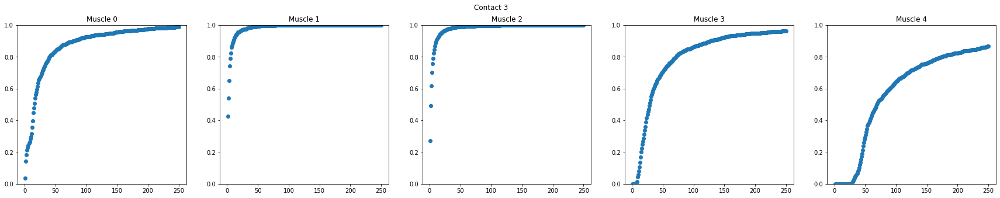

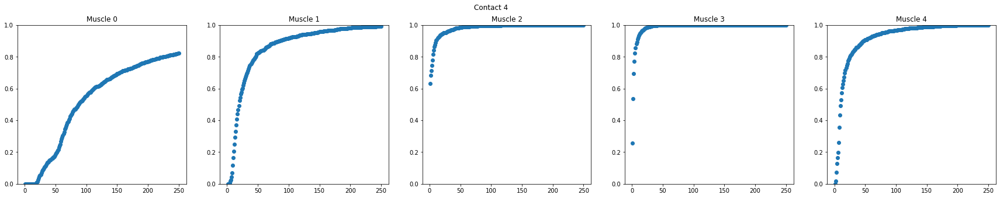

...

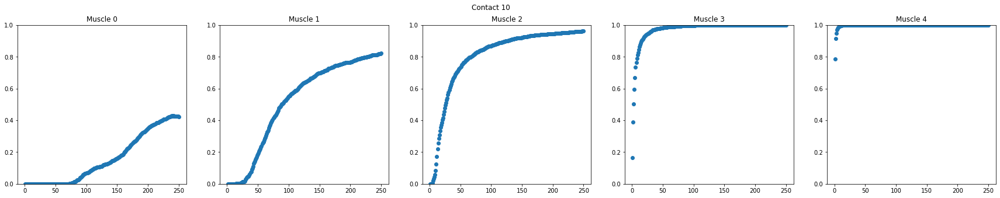

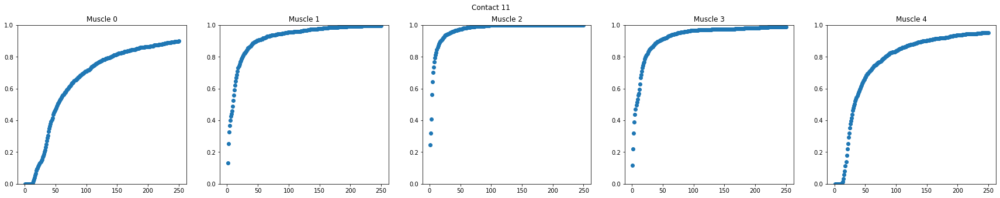

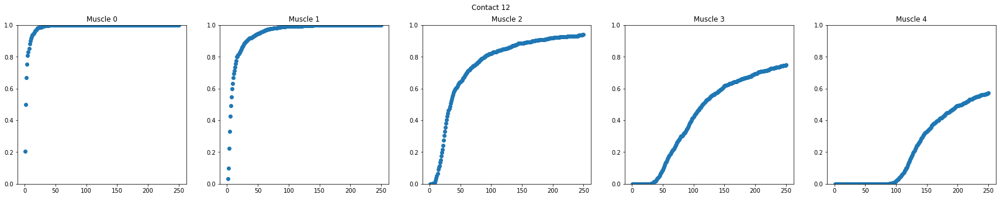

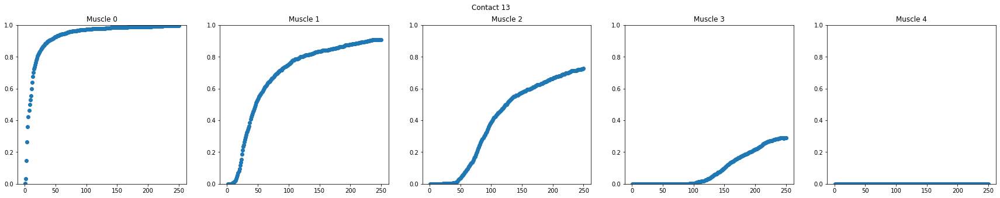

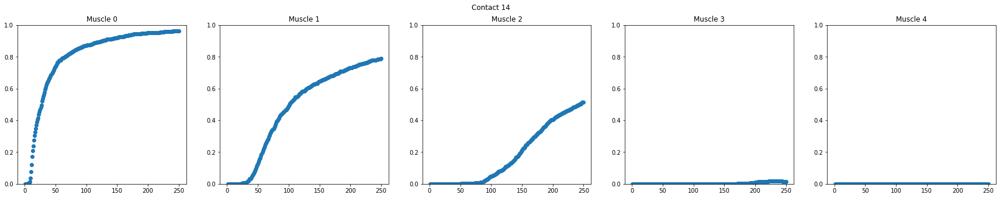

Pulse Amplitude: 1.5


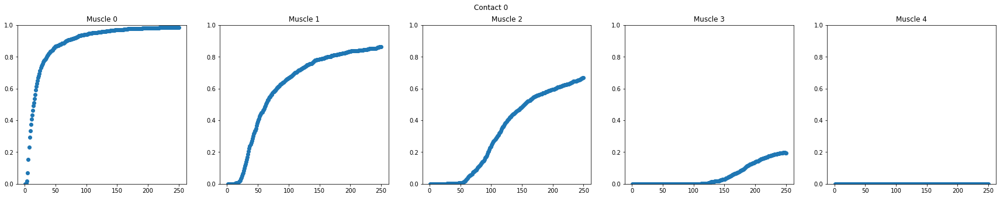

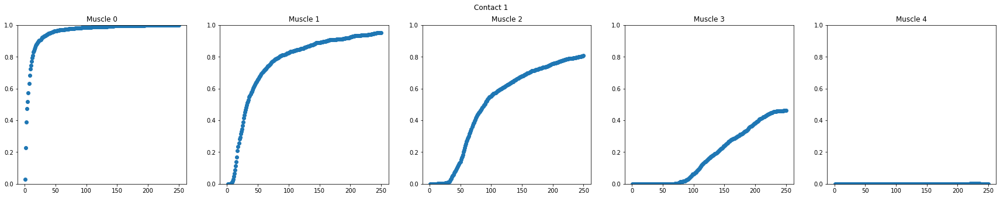

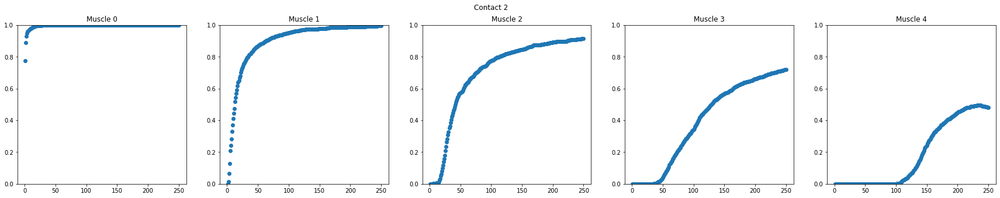

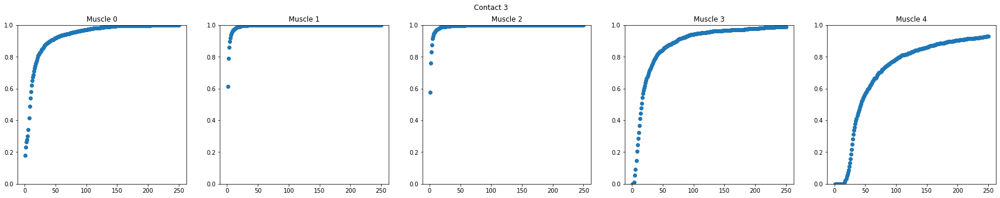

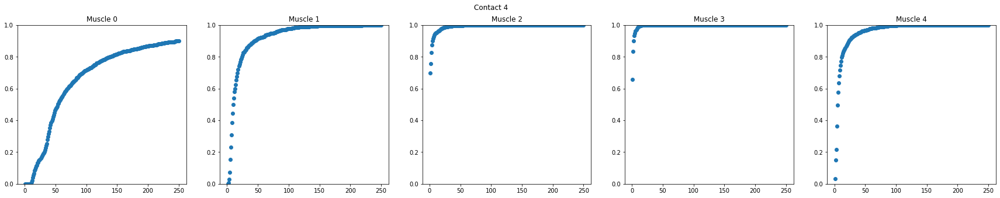

...

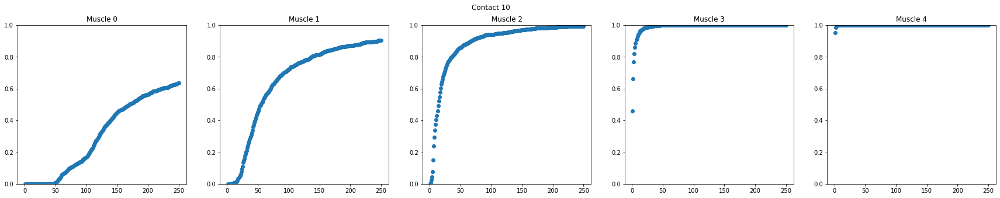

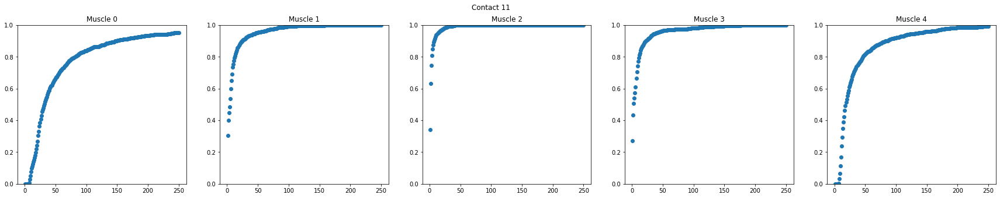

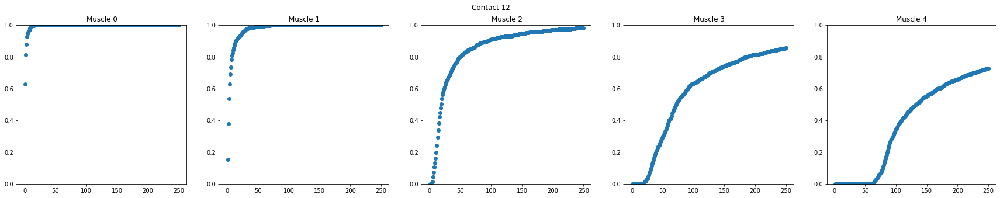

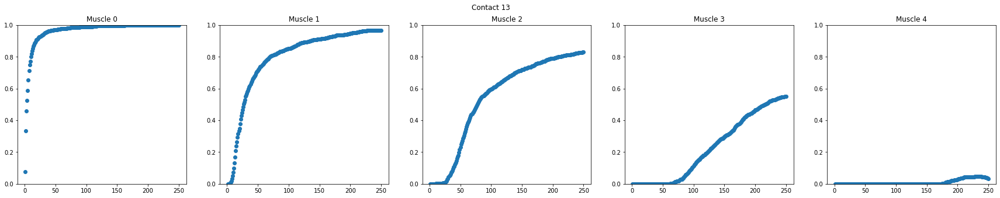

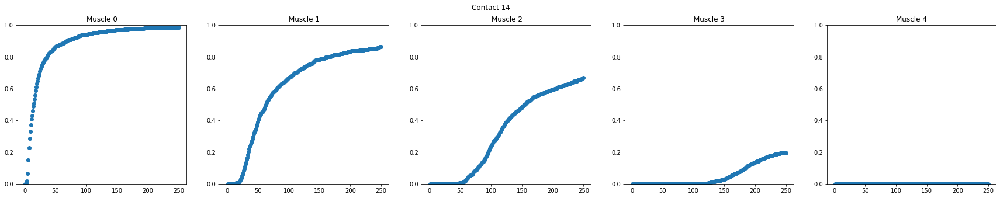

Pulse Amplitude: 2.0


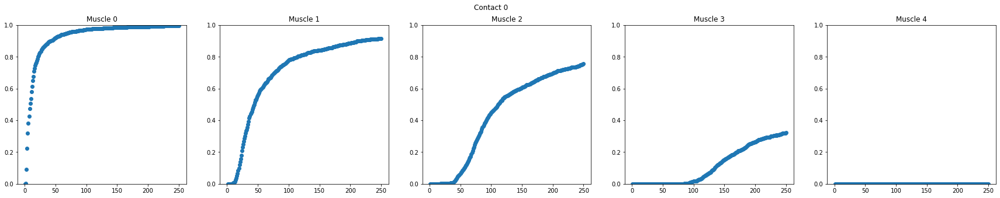

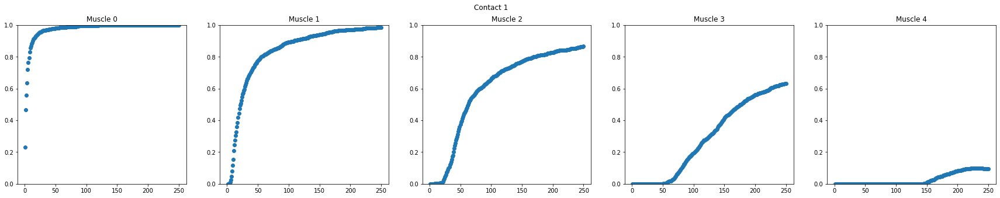

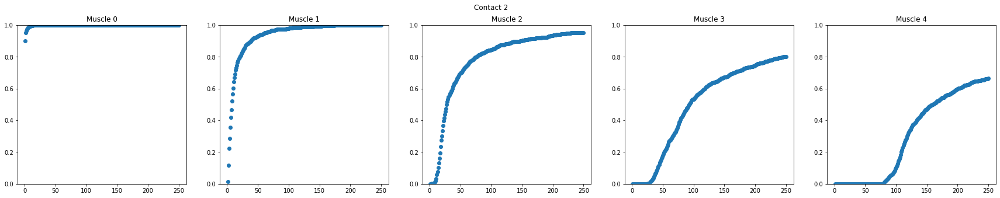

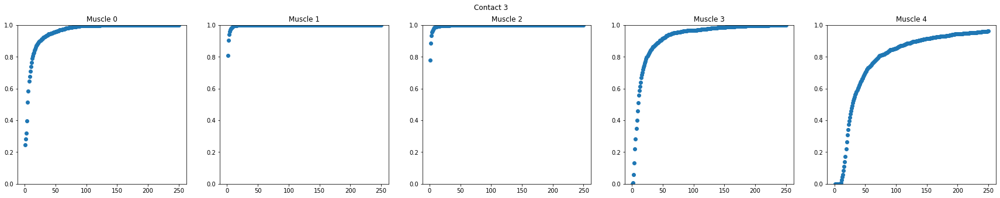

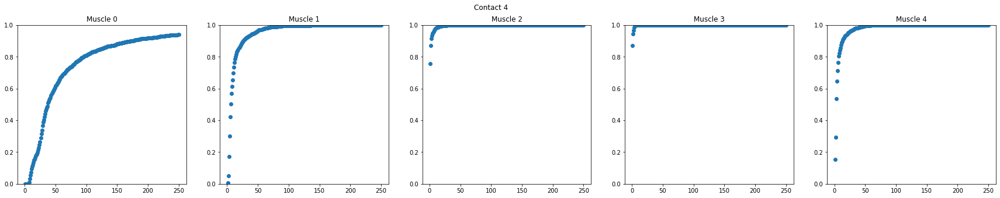

...

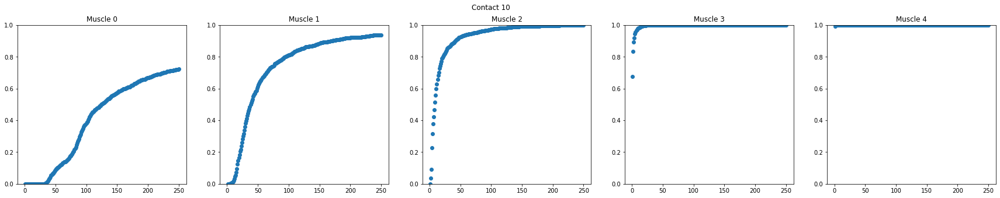

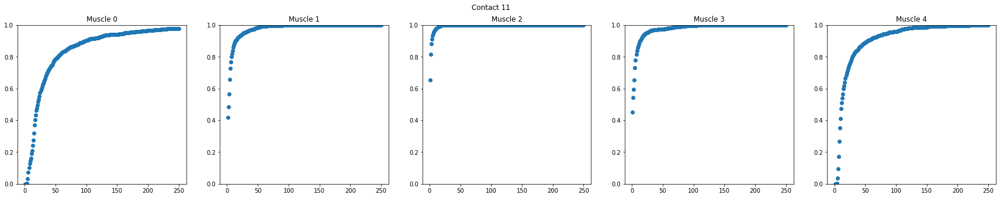

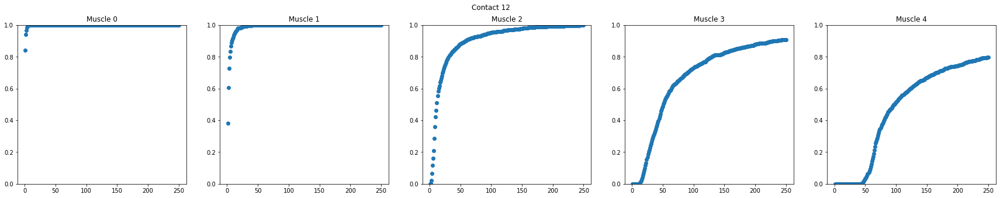

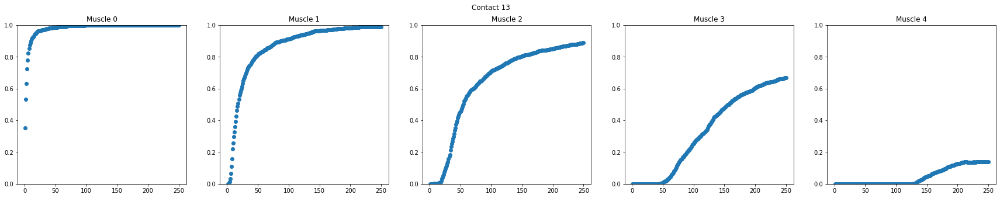

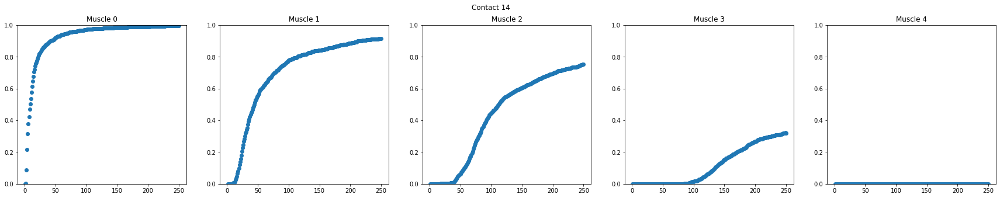

Pulse Amplitude: 2.5


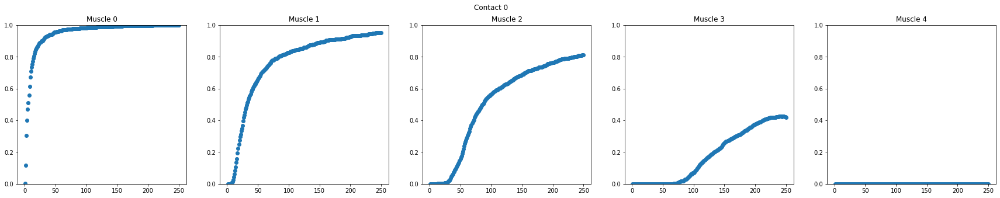

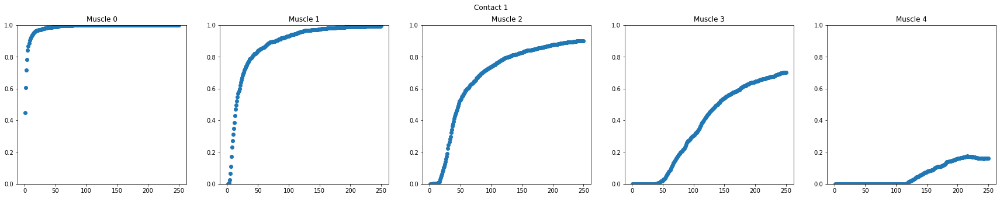

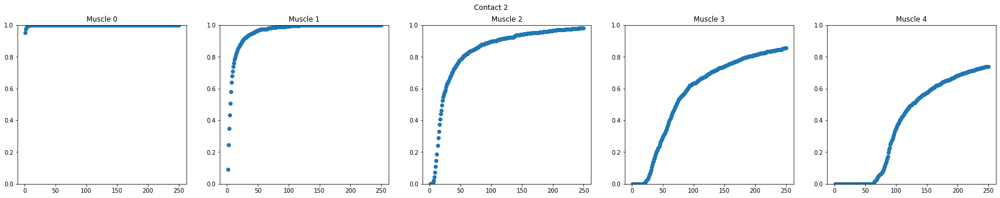

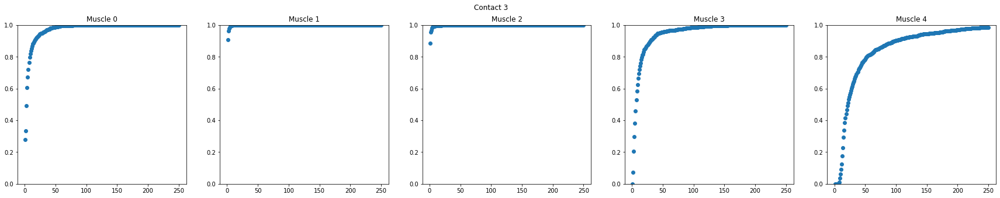

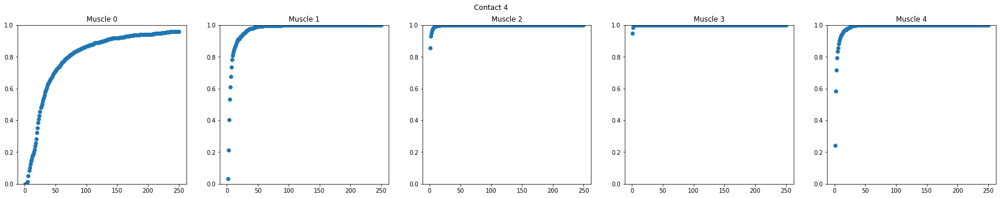

...

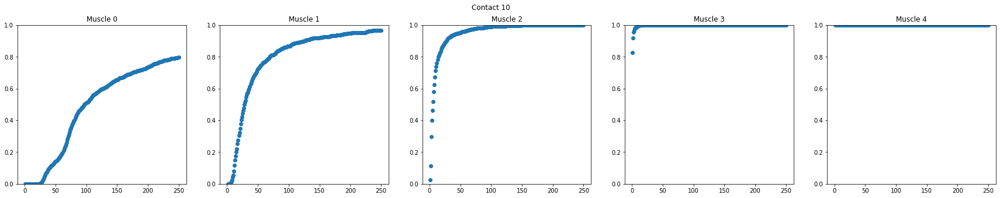

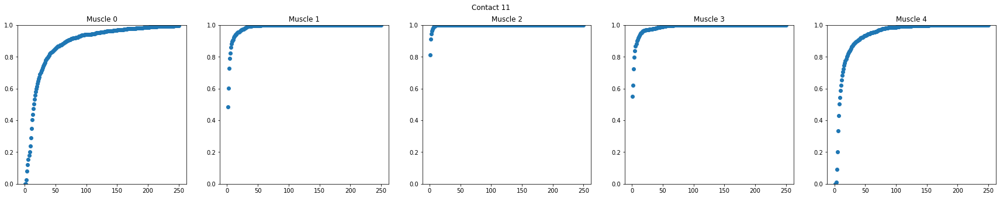

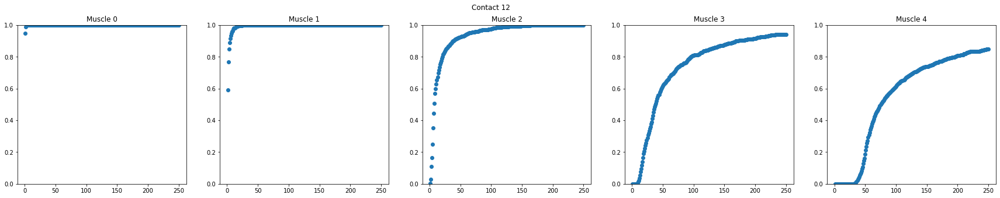

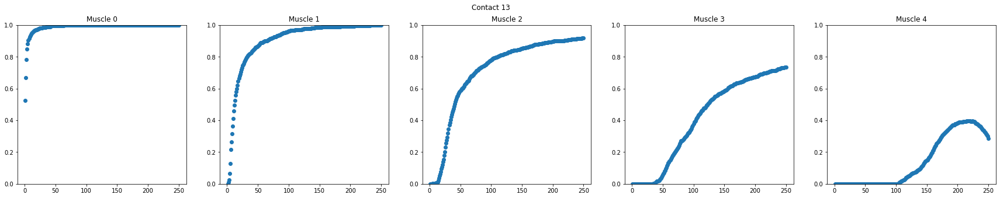

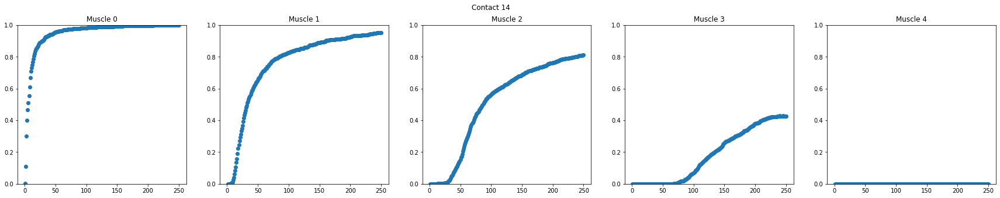

Pulse Amplitude: 3.0


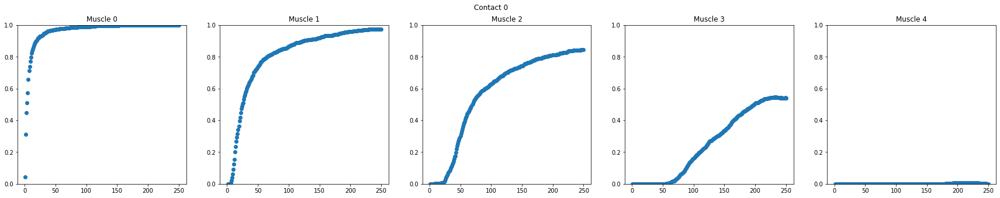

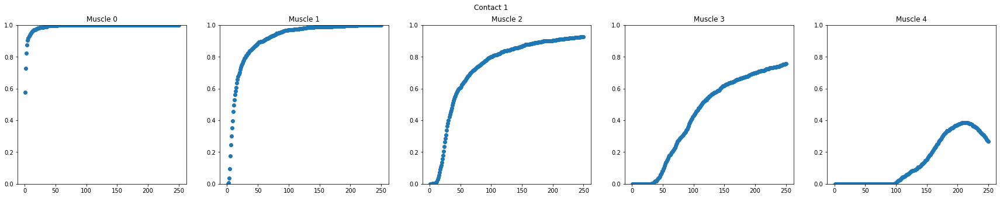

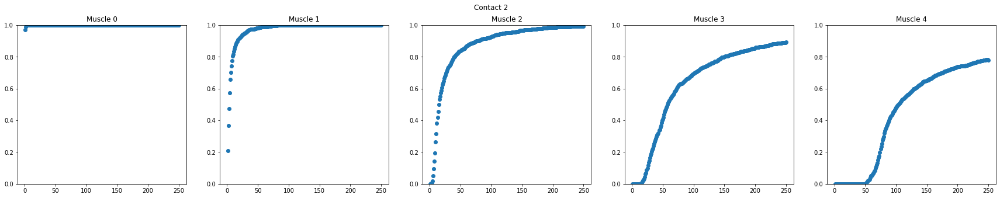

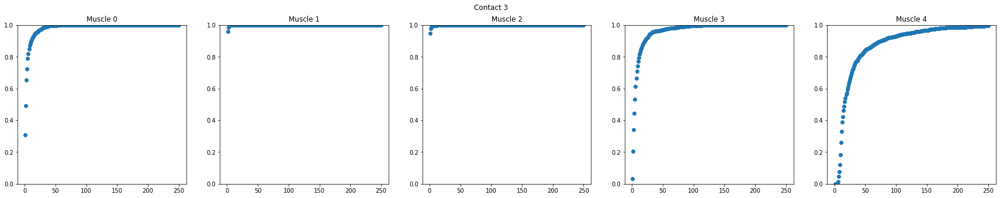

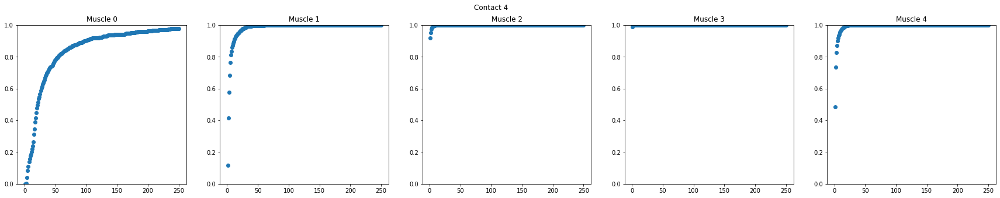

...

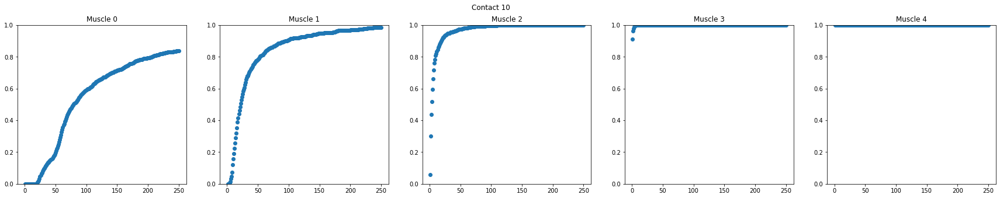

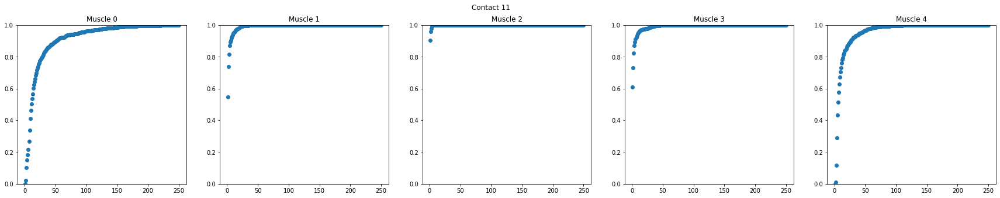

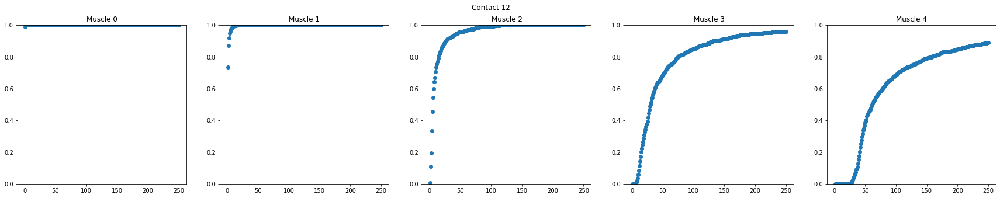

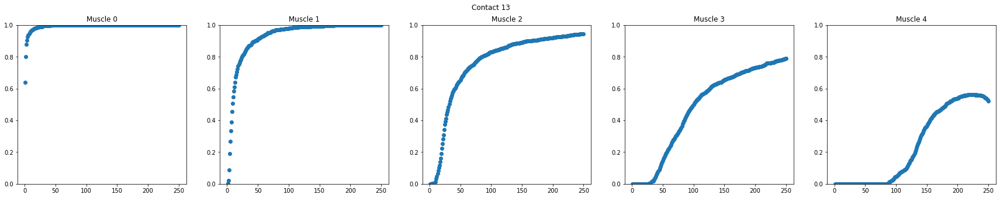

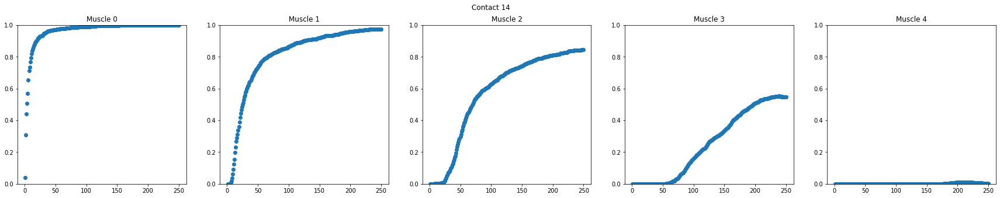

In [4]:
pw_x = np.arange(1,251)
# pulse_amplitudes = np.arange(1.0,3.5,0.5)
# for pulse_amplitude in pulse_amplitudes:
#     print('Pulse Amplitude: {}'.format(str(pulse_amplitude)))
#     for contact in range(15):
#         curves = get_curves_2(singlemuscle_singlecontact_sweeppw_5muscles_250pts, pulse_amplitude,contact)
#         fig, ax = plt.subplots(nrows = 1, ncols = 5)
#         fig.set_size_inches(30, 5)
#         fig.suptitle('Contact {}'.format(contact))

#         for muscle in range(5):
#             ax[muscle].set_title('Muscle {}'.format(muscle))
#             ax[muscle].set_ylim(0, 1)
#             ax[muscle].scatter(pw_x,curves[:,muscle])
#         plt.show()

## Muscle 2, Contact 8, Pulse Amplitude 2.0

In [5]:
m2_pa2_cont8 = get_curves_2(singlemuscle_singlecontact_sweeppw_5muscles_250pts, 2.0, 8)[:,2]

num_points = m2_pa2_cont8.shape[0]
noise = np.random.normal(loc=0, scale=0.1, size=num_points)
m2_pa2_cont8_noisy = m2_pa2_cont8 + noise

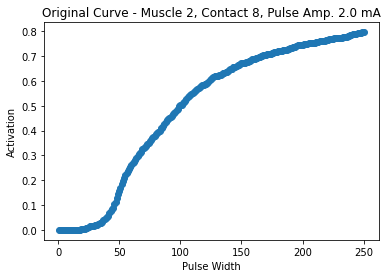

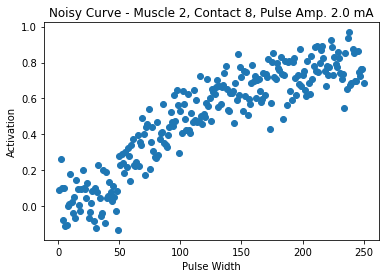

In [6]:
plt.scatter(pw_x, m2_pa2_cont8)
plt.title('Original Curve - Muscle 2, Contact 8, Pulse Amp. 2.0 mA')
plt.xlabel('Pulse Width')
plt.ylabel('Activation')
plt.show()
plt.scatter(pw_x, m2_pa2_cont8_noisy)
plt.title('Noisy Curve - Muscle 2, Contact 8, Pulse Amp. 2.0 mA')
plt.xlabel('Pulse Width')
plt.ylabel('Activation')
plt.show()

## Muscle 0, Contact 3, Pulse Amplitude 1.0

In [7]:
m0_pa1_cont3 = get_curves_2(singlemuscle_singlecontact_sweeppw_5muscles_250pts, 1.0, 3)[:,0]

num_points = m0_pa1_cont3.shape[0]
noise = np.random.normal(loc=0, scale=0.1, size=num_points)
m0_pa1_cont3_noisy = m0_pa1_cont3 + noise

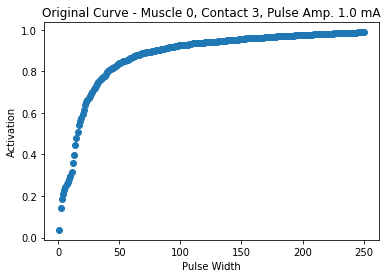

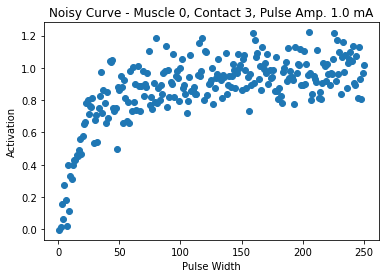

In [8]:
plt.scatter(pw_x, m0_pa1_cont3)
plt.title('Original Curve - Muscle 0, Contact 3, Pulse Amp. 1.0 mA')
plt.xlabel('Pulse Width')
plt.ylabel('Activation')
plt.show()
plt.scatter(pw_x, m0_pa1_cont3_noisy)
plt.title('Noisy Curve - Muscle 0, Contact 3, Pulse Amp. 1.0 mA')
plt.xlabel('Pulse Width')
plt.ylabel('Activation')
plt.show()

## Muscle 0, Contact 5, Pulse Amplitude 3.0

In [9]:
m0_pa3_cont5 = get_curves_2(singlemuscle_singlecontact_sweeppw_5muscles_250pts, 3.0, 5)[:,0]

num_points = m0_pa3_cont5.shape[0]
noise = np.random.normal(loc=0, scale=0.1, size=num_points)
m0_pa3_cont5_noisy = m0_pa3_cont5 + noise

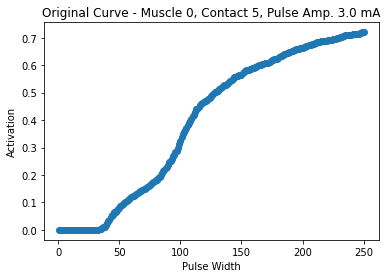

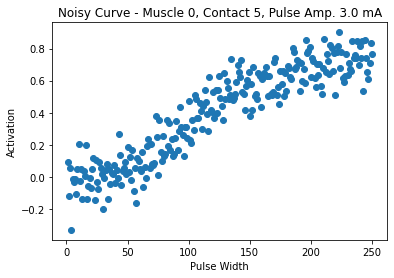

In [10]:
plt.scatter(pw_x, m0_pa3_cont5)
plt.title('Original Curve - Muscle 0, Contact 5, Pulse Amp. 3.0 mA')
plt.xlabel('Pulse Width')
plt.ylabel('Activation')
plt.show()
plt.scatter(pw_x, m0_pa3_cont5_noisy)
plt.title('Noisy Curve - Muscle 0, Contact 5, Pulse Amp. 3.0 mA')
plt.xlabel('Pulse Width')
plt.ylabel('Activation')
plt.show()

### Save arrays into csv

In [77]:
m2_pa2_cont8_noisy. shape, m0_pa1_cont3.shape, m0_pa3_cont5_noisy.shape

((250,), (250,), (250,))

In [91]:
m = np.concatenate((m2_pa2_cont8_noisy, m0_pa1_cont3_noisy, m0_pa3_cont5_noisy)).reshape((3,250))

In [92]:
(m[0] == m2_pa2_cont8_noisy).all(), (m[1] == m0_pa1_cont3_noisy).all(), (m[2] == m0_pa3_cont5_noisy).all()

(True, True, True)

In [97]:
m[0]

array([ 0.09297532,  0.26228656,  0.10184823, -0.07493642,  0.10130512,
       -0.11225587, -0.10579107,  0.00109249,  0.01023492,  0.18102783,
        0.02419938, -0.04010649,  0.05125892, -0.06274485,  0.14563914,
        0.09447556,  0.00929976, -0.02442092,  0.09531047,  0.20275312,
        0.09895105,  0.09706767,  0.04627355,  0.12872882, -0.0667949 ,
       -0.02932501,  0.01755085,  0.08767282, -0.08440885,  0.09899009,
       -0.12189159,  0.07758277,  0.22818435,  0.04652039, -0.05310275,
       -0.03835711,  0.20061474, -0.09134248,  0.18947434,  0.04397937,
        0.05695452,  0.13664554,  0.07691234,  0.02686135,  0.11509315,
        0.05339394, -0.02751374,  0.08346911, -0.13157509,  0.28228286,
        0.22797534,  0.29256451,  0.23824266,  0.18285517,  0.30151687,
        0.21619775,  0.32431212,  0.2772653 ,  0.14338792,  0.34219626,
        0.37189148,  0.23179629,  0.22257769,  0.24828426,  0.39526256,
        0.22633975,  0.35690569,  0.33953461,  0.49266363,  0.39

In [96]:
io.savemat('vlad_noisy_data.mat', {'vlad_noisy_data': m})

# Define Model

In [11]:
class ExactGPModel(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood):
        super(ExactGPModel, self).__init__(train_x, train_y, likelihood)
        self.mean_module = gpytorch.means.ConstantMean()
        self.covar_module = gpytorch.kernels.ScaleKernel(gpytorch.kernels.RBFKernel())

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

In [44]:
def plot_preds(model, likelihood, train_x, train_y, test_x, test_y, newest_point, true_test_y): 
    model.eval()
    likelihood.eval()
    with torch.no_grad():
        # Initialize plot
        f, ax = plt.subplots(1, 2, figsize=(20, 6))
        observed_train_pred = likelihood(model(train_x))
        observed_test_pred = likelihood(model(test_x))

        # Get upper and lower confidence bounds
        train_lower, train_upper = observed_train_pred.confidence_region()
        test_lower, test_upper = observed_test_pred.confidence_region()
        
        # Plot predictive means as blue line
        ax[0].plot(train_x.numpy(), observed_train_pred.mean.numpy(), 'b', label = 'Mean')
        ax[1].plot(test_x.numpy(), observed_test_pred.mean.numpy(), 'b', label = 'Mean')
        
        # Plot data as black stars
        ax[0].plot(train_x.numpy(), train_y.numpy(), 'k*', label = 'Train Data')
        ax[0].plot(newest_point[0], newest_point[1], 'k*', color = 'orange', label = 'Newest Point')
        ax[1].plot(test_x.numpy(), test_y.numpy(), 'k*', label = 'Test Data')

        # Shade between the lower and upper confidence bounds
        ax[0].fill_between(train_x.numpy(), train_lower.numpy(), train_upper.numpy(), alpha=0.5,)
        ax[1].fill_between(test_x.numpy(), test_lower.numpy(), test_upper.numpy(), alpha=0.5)
        ax[1].plot(test_x.numpy(), true_test_y, color = 'orange', label = 'True Funct.')

        ax[0].legend()
        ax[1].legend()
        
        plt.show()
    
        # x value (pulse width) at which posterior variance is maximized
        max_posterior_variance_test = np.argmax((test_upper - test_lower).numpy())
        
        return(observed_train_pred.mean.numpy(), observed_test_pred.mean.numpy(), max_posterior_variance_test)

In [63]:
def plot_rmses_and_noise(final_train_rmses, final_test_rmses, final_true_test_rmses, noise_estimates, num_points):
    f, ax = plt.subplots(2, 2, figsize=(20, 15))
    ax[0][0].plot(np.arange(1,num_points+1),final_train_rmses)
    ax[0][0].set_xlabel('Num Training Points')
    ax[0][0].set_ylabel('Train RMSE')
    ax[0][0].set_title('Train RMSE vs. Num Training Points')
    ax[0][0].set_xticks(np.arange(1,num_points+1))
    ax[0][1].plot(np.arange(1,num_points+1),final_test_rmses)
    ax[0][1].set_xlabel('Num Training Points')
    ax[0][1].set_ylabel('Test RMSE')
    ax[0][1].set_title('Test RMSE vs. Num Training Points')
    ax[0][1].set_xticks(np.arange(1,num_points+1))
    ax[1][0].plot(np.arange(1,num_points+1),final_true_test_rmses)
    ax[1][0].set_xlabel('Num Training Points')
    ax[1][0].set_ylabel('True Test RMSE')
    ax[1][0].set_title('True Underlying Function RMSE vs. Num Training Points')
    ax[1][0].set_xticks(np.arange(1,num_points+1))
    ax[1][1].scatter(np.arange(1,num_points+1),noise_estimates,label='Noise Estimates')
    ax[1][1].plot(np.arange(1,num_points+1), np.zeros(num_points)+0.01, color = 'red', label = 'True Noise')
    ax[1][1].set_xlabel('Num Training Points')
    ax[1][1].set_ylabel('Noise Estimate')
    ax[1][1].set_title('Noise Estimate vs. Num Training Points')
    ax[1][1].set_xticks(np.arange(1,num_points+1))
    ax[1][1].legend()
    plt.show()

In [52]:
def train(data_true, data, num_training_points, select_after_opt, num_epochs=501, lr = 0.1, lengthscale = 25):
    x = torch.from_numpy(pw_x-1).float()
    y = torch.from_numpy(data).float()
    data_true = torch.from_numpy(data_true).float()
    
    # first training instance will be drawn from the middle - x ranges from 0-250
    train_samples = [125]
    test_samples = np.delete(x, 125).numpy()
    
    #rmses comparing to noisy data
    final_train_rmses = []
    final_test_rmses = []
    noise_estimates = []
    #rmses comparing to true underlying function
    final_true_test_rmses = []
    
    #f, ax = plt.subplots(5, 4, figsize=(30, 30))
    for j in range(num_training_points):
        train_x, train_y, test_x, test_y, true_test_y = x[train_samples], y[train_samples], \
            x[test_samples], y[test_samples], data_true[test_samples]
        newest_point = (train_x[-1], train_y[-1])
        train_x, train_y = train_x[train_x.argsort()], train_y[train_x.argsort()]
        test_x, test_y = test_x[test_x.argsort()], test_y[test_x.argsort()]
        true_test_y = true_test_y[test_x.argsort()]

        likelihood = gpytorch.likelihoods.GaussianLikelihood()
        model = ExactGPModel(train_x, train_y, likelihood)

        #set lengthscale
        model.covar_module.base_kernel.lengthscale = 25

        # Use the adam optimizer
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)  # Includes GaussianLikelihood parameters

        # "Loss" for GPs - the marginal log likelihood
        mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)
        
        # Train the model
        for i in range(501):
            if i == 0:
                print('####################################################\n')
                print('BEFORE TRAINING')
                print('{} TRAINING POINTS'.format(len(train_samples)))
                print('lengthscale: %.3f   noise: %.3f' % (
                    model.covar_module.base_kernel.lengthscale.item(),
                    model.likelihood.noise.item()
                ))
                
                # find the point corresponding to the maximal posterior variance 
                # add it to the training set, remove from test set
                train_mean, test_mean, max_posterior_variance_test = plot_preds(model, likelihood, train_x, train_y, test_x, test_y, newest_point, true_test_y)
                if ((select_after_opt == False) or (j == 0)):
                    train_samples.append(max_posterior_variance_test)
                    test_samples = np.delete(test_samples, max_posterior_variance_test)

            model.train()
            likelihood.train()

            optimizer.zero_grad()

            output = model(train_x)
            loss = -mll(output, train_y)
            loss.backward()

            optimizer.step()
            
            # plot predictions for training and testing data every 50 epochs
            if i % 50 == 0:
                print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f   noise: %.3f' % (
                    i , 500, loss.item(),
                    model.covar_module.base_kernel.lengthscale.item(),
                    model.likelihood.noise.item()
                ))
                
                # save the RMSE and noise estimate on the last epoch
                if i == 500:
                    train_mean, test_mean, max_posterior_variance_test = \
                    plot_preds(model, likelihood, train_x, train_y, test_x, test_y, newest_point, true_test_y)

                    train_rmse = np.sqrt(np.mean((train_mean-train_y.numpy())**2))
                    test_rmse = np.sqrt(np.mean((test_mean-test_y.numpy())**2))
                    true_test_rmse = np.sqrt(np.mean((test_mean-true_test_y.numpy())**2))
                    
                    print('Train RMSE: {}, Test RMSE: {}, Noise: {}\n'.format(round(train_rmse, 5), round(test_rmse, 5), round(model.likelihood.noise.item(), 5)))
                    final_train_rmses.append(train_rmse)
                    final_test_rmses.append(test_rmse)
                    noise_estimates.append(model.likelihood.noise.item())
                    final_true_test_rmses.append(true_test_rmse)
                    # if not the first point, sample after training
                    if ((select_after_opt == True) and (j != 0)):
                        train_samples.append(max_posterior_variance_test)
                        test_samples = np.delete(test_samples, max_posterior_variance_test)
                    
    return(final_train_rmses, final_test_rmses, noise_estimates, final_true_test_rmses)

# Training, Selective Sampling, and Plotting Predictions

## Muscle 2, Contact 8, Pulse Amplitude 2.0

####################################################

BEFORE TRAINING
1 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


/var/folders/c0/0rqzqv5n0bg36m4j1jc_zv3w0000gn/T/ipykernel_9540/3709150696.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k*" (-> color='k'). The keyword argument will take precedence.
  ax[0].plot(newest_point[0], newest_point[1], 'k*', color = 'orange', label = 'Newest Point')


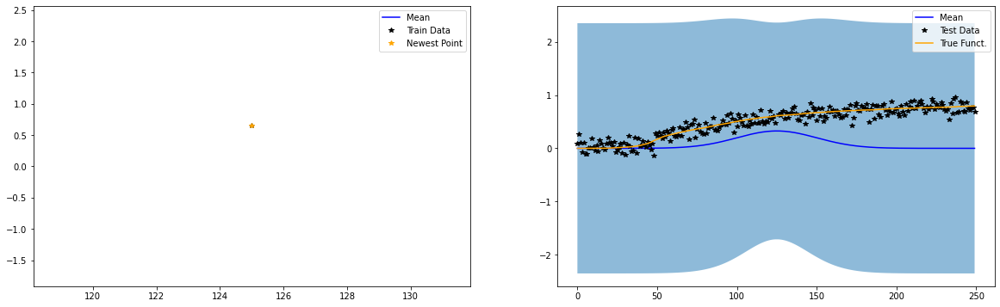

Iter 0/500 - Loss: 1.236   lengthscale: 25.000   noise: 0.644
Iter 50/500 - Loss: -1.370   lengthscale: 25.000   noise: 0.005
Iter 100/500 - Loss: -3.050   lengthscale: 25.000   noise: 0.000
Iter 150/500 - Loss: -3.505   lengthscale: 25.000   noise: 0.000
Iter 200/500 - Loss: -3.636   lengthscale: 25.000   noise: 0.000
Iter 250/500 - Loss: -3.630   lengthscale: 25.000   noise: 0.000
Iter 300/500 - Loss: -3.652   lengthscale: 25.000   noise: 0.000
Iter 350/500 - Loss: -3.653   lengthscale: 25.000   noise: 0.000
Iter 400/500 - Loss: -3.665   lengthscale: 25.000   noise: 0.000
Iter 450/500 - Loss: -3.678   lengthscale: 25.000   noise: 0.000
Iter 500/500 - Loss: -3.678   lengthscale: 25.000   noise: 0.000


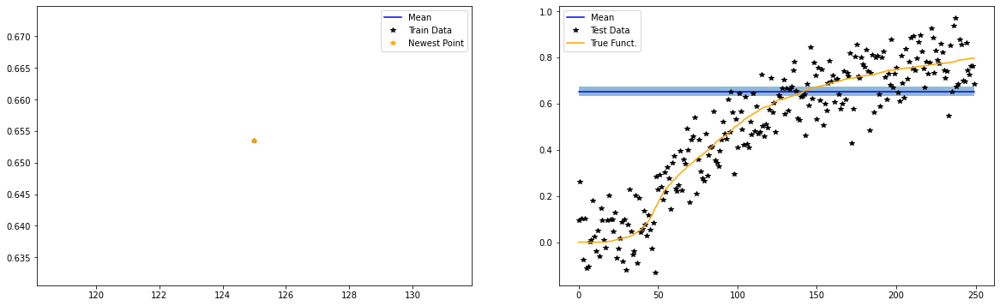

Train RMSE: 0.0008299999753944576, Test RMSE: 0.323170006275177, Noise: 0.0001

####################################################

BEFORE TRAINING
2 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


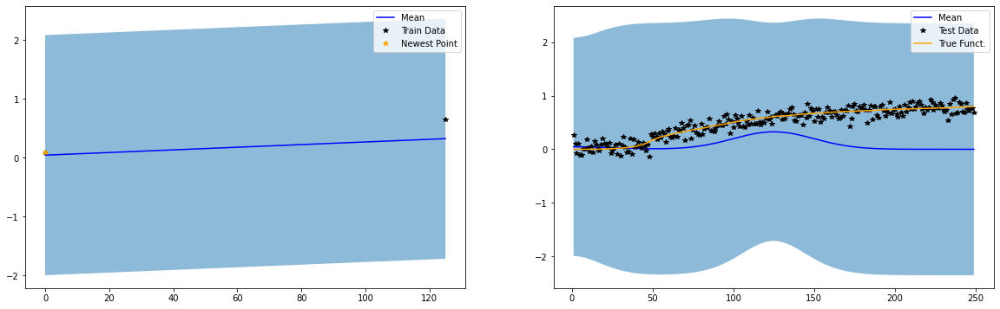

Iter 0/500 - Loss: 1.161   lengthscale: 25.080   noise: 0.644
Iter 50/500 - Loss: 0.154   lengthscale: 21.249   noise: 0.034
Iter 100/500 - Loss: 0.147   lengthscale: 20.399   noise: 0.040
Iter 150/500 - Loss: 0.147   lengthscale: 20.127   noise: 0.039
Iter 200/500 - Loss: 0.147   lengthscale: 19.927   noise: 0.039
Iter 250/500 - Loss: 0.147   lengthscale: 19.768   noise: 0.039
Iter 300/500 - Loss: 0.147   lengthscale: 19.638   noise: 0.039
Iter 350/500 - Loss: 0.147   lengthscale: 19.528   noise: 0.039
Iter 400/500 - Loss: 0.147   lengthscale: 19.432   noise: 0.039
Iter 450/500 - Loss: 0.147   lengthscale: 19.349   noise: 0.039
Iter 500/500 - Loss: 0.147   lengthscale: 19.274   noise: 0.039


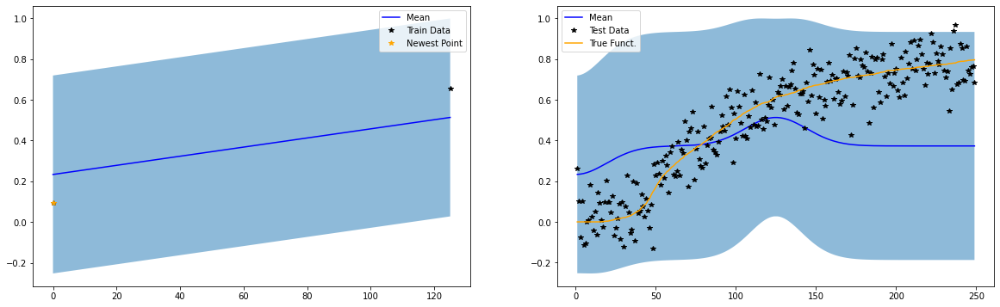

Train RMSE: 0.14032000303268433, Test RMSE: 0.2788099944591522, Noise: 0.03933

####################################################

BEFORE TRAINING
3 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


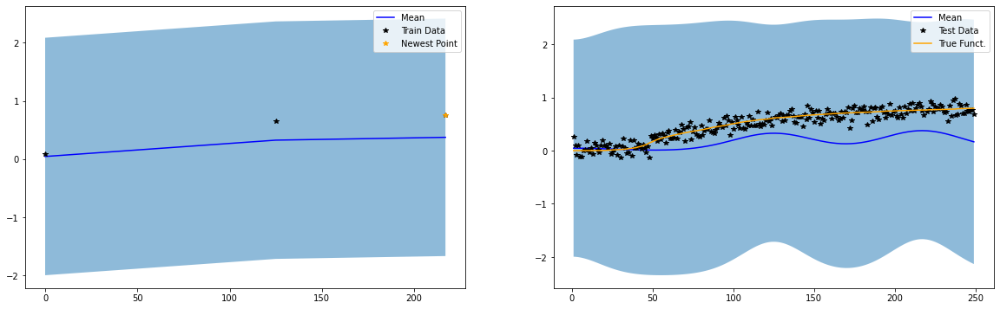

Iter 0/500 - Loss: 1.202   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.185   lengthscale: 30.370   noise: 0.038
Iter 100/500 - Loss: 0.177   lengthscale: 38.136   noise: 0.040
Iter 150/500 - Loss: 0.171   lengthscale: 46.023   noise: 0.033
Iter 200/500 - Loss: 0.162   lengthscale: 53.414   noise: 0.021
Iter 250/500 - Loss: 0.151   lengthscale: 60.730   noise: 0.011
Iter 300/500 - Loss: 0.140   lengthscale: 67.752   noise: 0.006
Iter 350/500 - Loss: 0.132   lengthscale: 73.922   noise: 0.003
Iter 400/500 - Loss: 0.127   lengthscale: 78.935   noise: 0.002
Iter 450/500 - Loss: 0.123   lengthscale: 82.780   noise: 0.002
Iter 500/500 - Loss: 0.122   lengthscale: 85.598   noise: 0.001


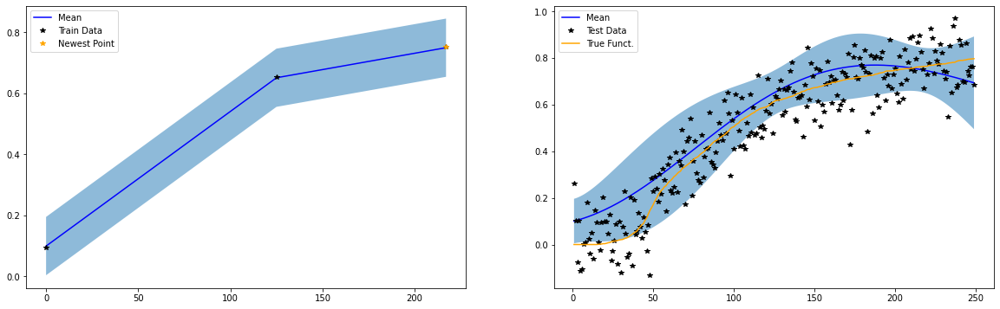

Train RMSE: 0.00406000018119812, Test RMSE: 0.11951000243425369, Noise: 0.00115

####################################################

BEFORE TRAINING
4 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


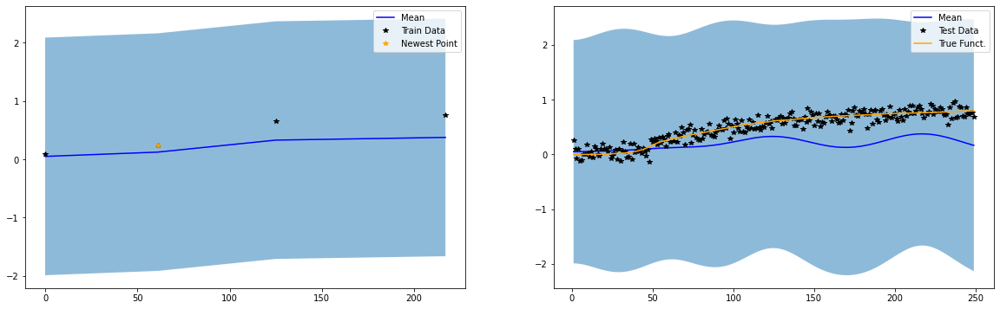

Iter 0/500 - Loss: 1.177   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.131   lengthscale: 30.850   noise: 0.031
Iter 100/500 - Loss: 0.102   lengthscale: 38.046   noise: 0.024
Iter 150/500 - Loss: 0.048   lengthscale: 46.283   noise: 0.009
Iter 200/500 - Loss: -0.015   lengthscale: 54.445   noise: 0.003
Iter 250/500 - Loss: -0.067   lengthscale: 61.625   noise: 0.001
Iter 300/500 - Loss: -0.104   lengthscale: 67.596   noise: 0.001
Iter 350/500 - Loss: -0.125   lengthscale: 72.254   noise: 0.000
Iter 400/500 - Loss: -0.136   lengthscale: 75.594   noise: 0.000
Iter 450/500 - Loss: -0.140   lengthscale: 77.774   noise: 0.000
Iter 500/500 - Loss: -0.142   lengthscale: 79.067   noise: 0.000


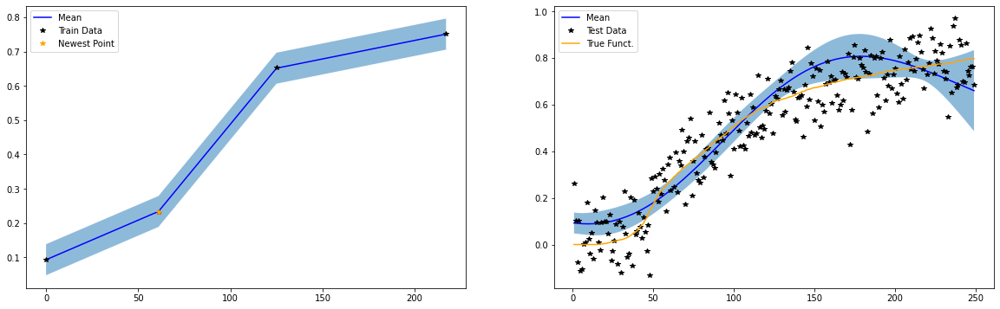

Train RMSE: 0.001509999972768128, Test RMSE: 0.11646000295877457, Noise: 0.00026

####################################################

BEFORE TRAINING
5 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


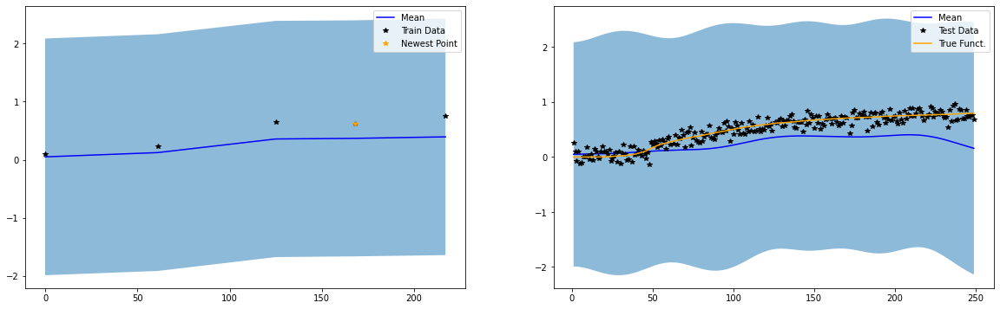

Iter 0/500 - Loss: 1.173   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.022   lengthscale: 30.873   noise: 0.020
Iter 100/500 - Loss: -0.050   lengthscale: 37.536   noise: 0.009
Iter 150/500 - Loss: -0.088   lengthscale: 43.283   noise: 0.004
Iter 200/500 - Loss: -0.105   lengthscale: 47.613   noise: 0.004
Iter 250/500 - Loss: -0.117   lengthscale: 51.079   noise: 0.005
Iter 300/500 - Loss: -0.131   lengthscale: 54.949   noise: 0.008
Iter 350/500 - Loss: -0.144   lengthscale: 59.039   noise: 0.008
Iter 400/500 - Loss: -0.156   lengthscale: 63.004   noise: 0.009
Iter 450/500 - Loss: -0.166   lengthscale: 66.791   noise: 0.009
Iter 500/500 - Loss: -0.175   lengthscale: 70.379   noise: 0.009


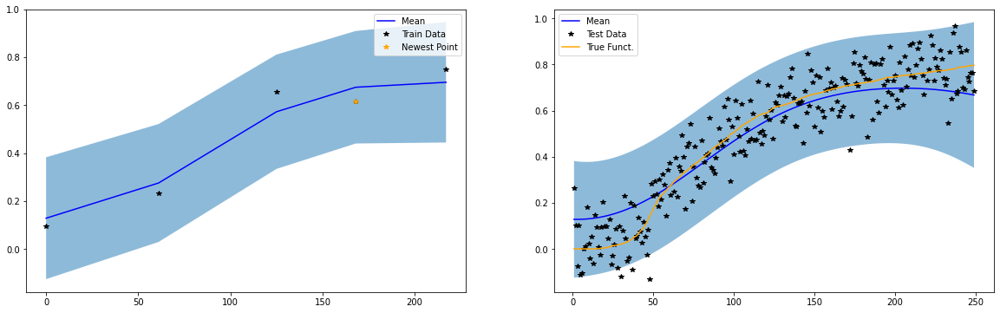

Train RMSE: 0.05683999881148338, Test RMSE: 0.1140500009059906, Noise: 0.00912

####################################################

BEFORE TRAINING
6 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


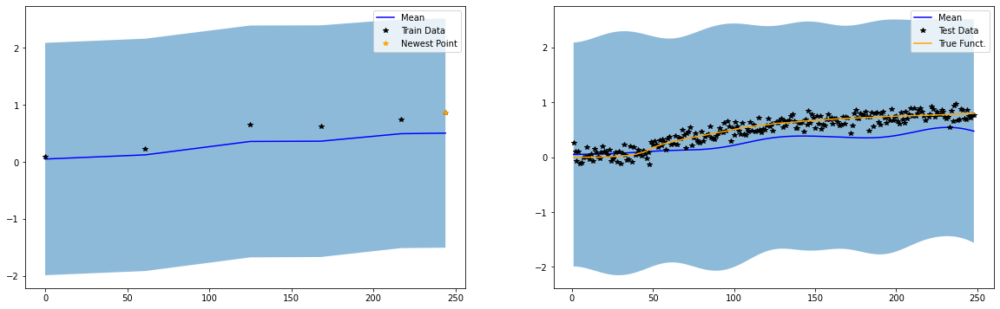

Iter 0/500 - Loss: 1.180   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.021   lengthscale: 30.794   noise: 0.017
Iter 100/500 - Loss: -0.101   lengthscale: 37.854   noise: 0.004
Iter 150/500 - Loss: -0.187   lengthscale: 44.355   noise: 0.001
Iter 200/500 - Loss: -0.246   lengthscale: 49.809   noise: 0.001
Iter 250/500 - Loss: -0.275   lengthscale: 53.716   noise: 0.000
Iter 300/500 - Loss: -0.284   lengthscale: 55.853   noise: 0.000
Iter 350/500 - Loss: -0.286   lengthscale: 56.688   noise: 0.000
Iter 400/500 - Loss: -0.287   lengthscale: 56.916   noise: 0.000
Iter 450/500 - Loss: -0.288   lengthscale: 56.956   noise: 0.000
Iter 500/500 - Loss: -0.288   lengthscale: 56.955   noise: 0.000


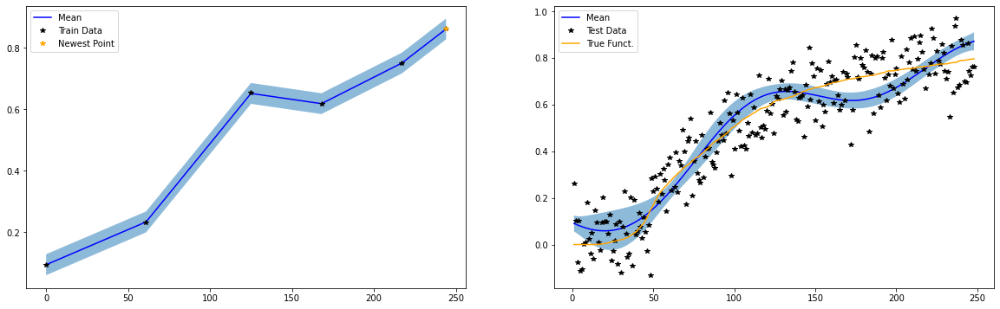

Train RMSE: 0.0011500000255182385, Test RMSE: 0.10790999978780746, Noise: 0.00015

####################################################

BEFORE TRAINING
7 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


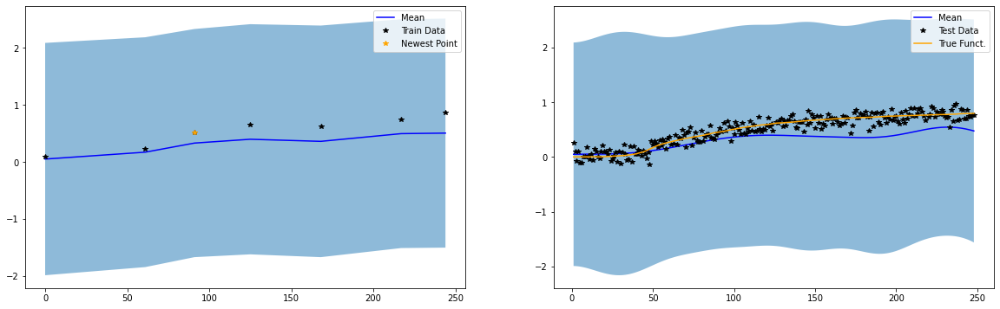

Iter 0/500 - Loss: 1.166   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.066   lengthscale: 30.666   noise: 0.015
Iter 100/500 - Loss: -0.250   lengthscale: 38.099   noise: 0.003
Iter 150/500 - Loss: -0.385   lengthscale: 44.961   noise: 0.001
Iter 200/500 - Loss: -0.471   lengthscale: 50.542   noise: 0.000
Iter 250/500 - Loss: -0.512   lengthscale: 54.512   noise: 0.000
Iter 300/500 - Loss: -0.526   lengthscale: 56.904   noise: 0.000
Iter 350/500 - Loss: -0.530   lengthscale: 58.125   noise: 0.000
Iter 400/500 - Loss: -0.532   lengthscale: 58.665   noise: 0.000
Iter 450/500 - Loss: -0.532   lengthscale: 58.877   noise: 0.000
Iter 500/500 - Loss: -0.533   lengthscale: 58.953   noise: 0.000


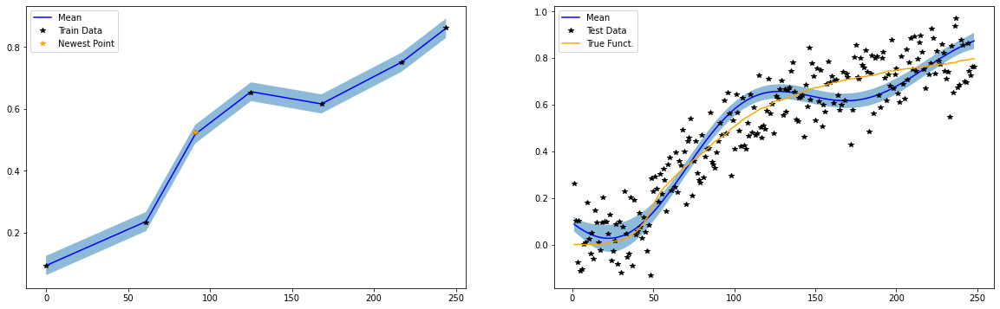

Train RMSE: 0.0024300001095980406, Test RMSE: 0.10931000113487244, Noise: 0.00012

####################################################

BEFORE TRAINING
8 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


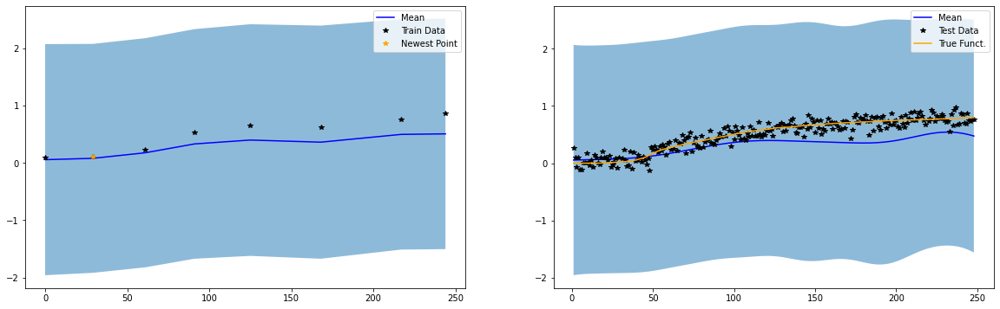

Iter 0/500 - Loss: 1.148   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.178   lengthscale: 30.830   noise: 0.010
Iter 100/500 - Loss: -0.410   lengthscale: 38.064   noise: 0.001
Iter 150/500 - Loss: -0.527   lengthscale: 44.132   noise: 0.001
Iter 200/500 - Loss: -0.589   lengthscale: 48.902   noise: 0.001
Iter 250/500 - Loss: -0.624   lengthscale: 52.610   noise: 0.001
Iter 300/500 - Loss: -0.640   lengthscale: 55.224   noise: 0.001
Iter 350/500 - Loss: -0.646   lengthscale: 56.886   noise: 0.001
Iter 400/500 - Loss: -0.648   lengthscale: 57.859   noise: 0.001
Iter 450/500 - Loss: -0.648   lengthscale: 58.392   noise: 0.001
Iter 500/500 - Loss: -0.648   lengthscale: 58.666   noise: 0.001


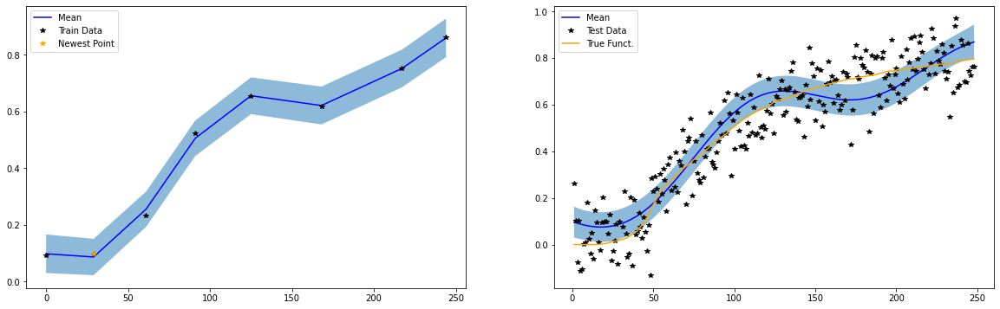

Train RMSE: 0.011579999700188637, Test RMSE: 0.10841000080108643, Noise: 0.0006

####################################################

BEFORE TRAINING
9 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


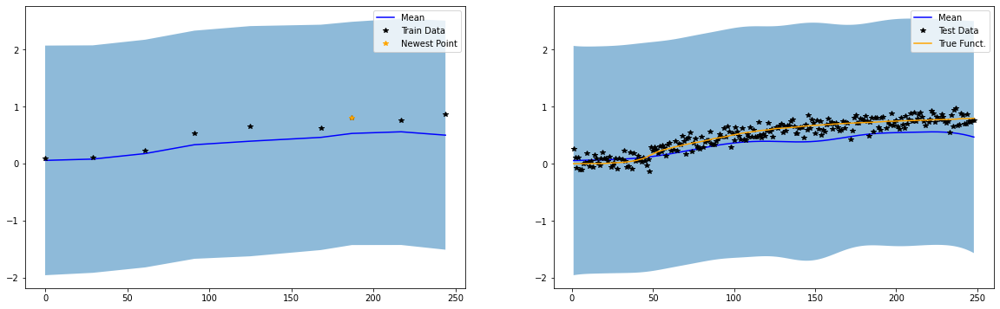

Iter 0/500 - Loss: 1.139   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.190   lengthscale: 30.787   noise: 0.010
Iter 100/500 - Loss: -0.301   lengthscale: 37.299   noise: 0.005
Iter 150/500 - Loss: -0.361   lengthscale: 42.618   noise: 0.005
Iter 200/500 - Loss: -0.403   lengthscale: 47.110   noise: 0.005
Iter 250/500 - Loss: -0.431   lengthscale: 50.894   noise: 0.005
Iter 300/500 - Loss: -0.449   lengthscale: 54.064   noise: 0.004
Iter 350/500 - Loss: -0.461   lengthscale: 56.713   noise: 0.004
Iter 400/500 - Loss: -0.469   lengthscale: 58.930   noise: 0.004
Iter 450/500 - Loss: -0.474   lengthscale: 60.793   noise: 0.004
Iter 500/500 - Loss: -0.478   lengthscale: 62.366   noise: 0.004


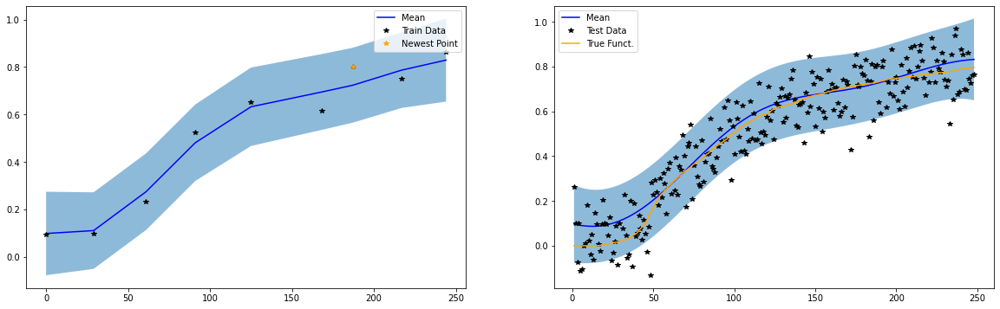

Train RMSE: 0.045559998601675034, Test RMSE: 0.1014999970793724, Noise: 0.00441

####################################################

BEFORE TRAINING
10 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


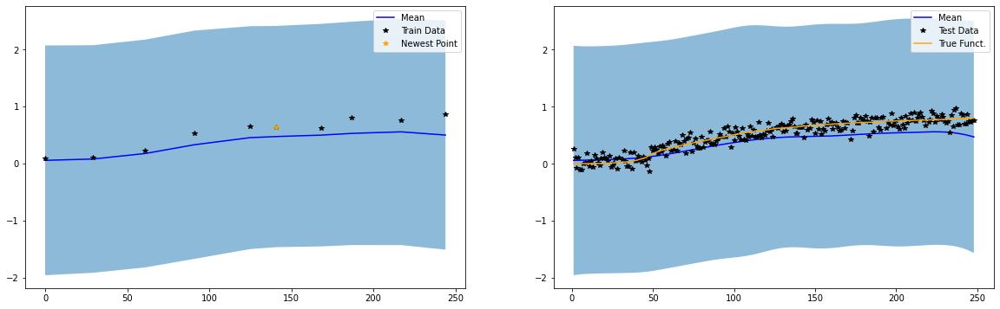

Iter 0/500 - Loss: 1.123   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.280   lengthscale: 30.748   noise: 0.009
Iter 100/500 - Loss: -0.414   lengthscale: 37.173   noise: 0.003
Iter 150/500 - Loss: -0.471   lengthscale: 42.338   noise: 0.004
Iter 200/500 - Loss: -0.510   lengthscale: 46.771   noise: 0.004
Iter 250/500 - Loss: -0.537   lengthscale: 50.526   noise: 0.004
Iter 300/500 - Loss: -0.555   lengthscale: 53.666   noise: 0.004
Iter 350/500 - Loss: -0.567   lengthscale: 56.281   noise: 0.004
Iter 400/500 - Loss: -0.574   lengthscale: 58.460   noise: 0.004
Iter 450/500 - Loss: -0.579   lengthscale: 60.285   noise: 0.004
Iter 500/500 - Loss: -0.582   lengthscale: 61.824   noise: 0.004


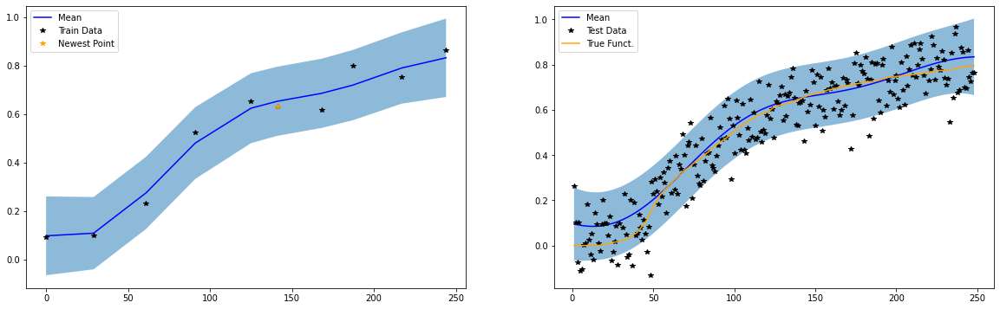

Train RMSE: 0.0434500016272068, Test RMSE: 0.10035999864339828, Noise: 0.00374

####################################################

BEFORE TRAINING
11 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


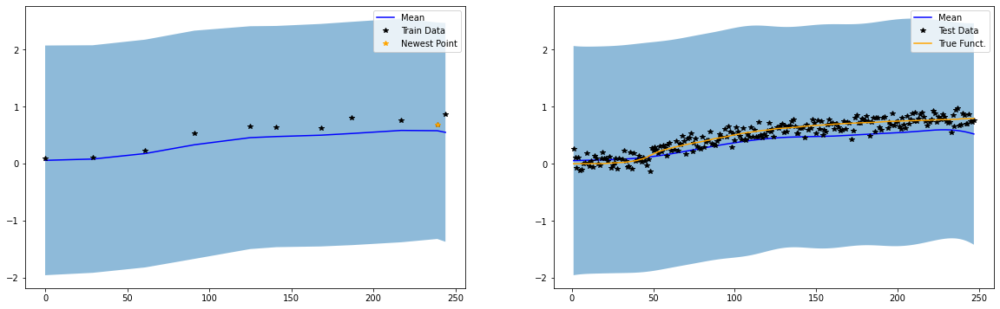

Iter 0/500 - Loss: 1.106   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.322   lengthscale: 30.728   noise: 0.009
Iter 100/500 - Loss: -0.415   lengthscale: 37.123   noise: 0.006
Iter 150/500 - Loss: -0.460   lengthscale: 42.051   noise: 0.006
Iter 200/500 - Loss: -0.490   lengthscale: 46.172   noise: 0.006
Iter 250/500 - Loss: -0.511   lengthscale: 49.692   noise: 0.006
Iter 300/500 - Loss: -0.525   lengthscale: 52.728   noise: 0.006
Iter 350/500 - Loss: -0.536   lengthscale: 55.377   noise: 0.006
Iter 400/500 - Loss: -0.543   lengthscale: 57.720   noise: 0.006
Iter 450/500 - Loss: -0.549   lengthscale: 59.820   noise: 0.006
Iter 500/500 - Loss: -0.553   lengthscale: 61.724   noise: 0.006


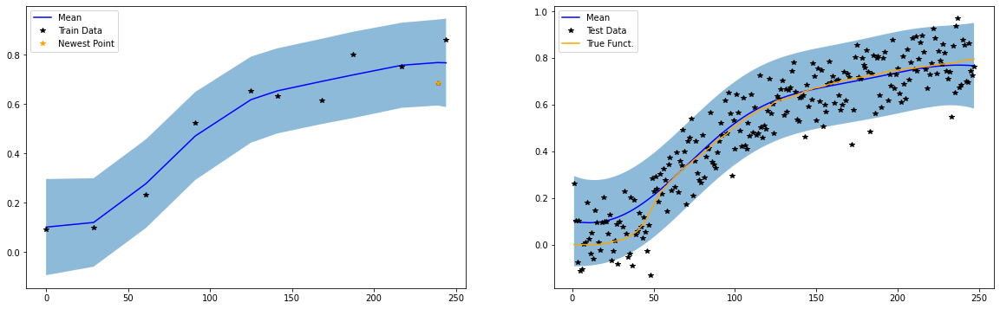

Train RMSE: 0.056770000606775284, Test RMSE: 0.10055000334978104, Noise: 0.00556

####################################################

BEFORE TRAINING
12 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


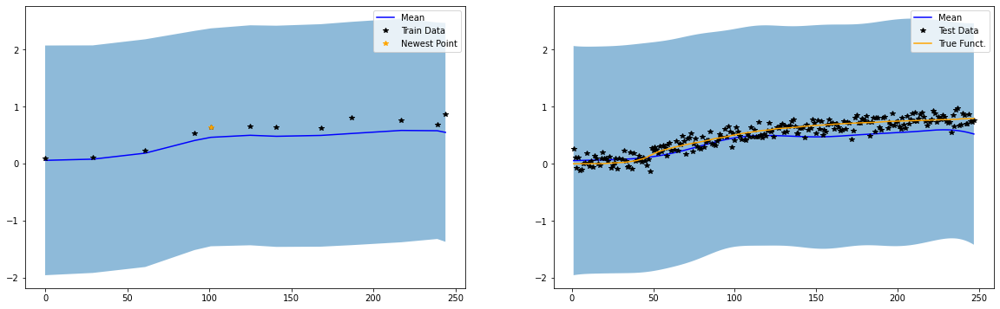

Iter 0/500 - Loss: 1.094   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.380   lengthscale: 30.668   noise: 0.008
Iter 100/500 - Loss: -0.474   lengthscale: 36.820   noise: 0.005
Iter 150/500 - Loss: -0.507   lengthscale: 41.391   noise: 0.005
Iter 200/500 - Loss: -0.527   lengthscale: 45.100   noise: 0.005
Iter 250/500 - Loss: -0.540   lengthscale: 48.161   noise: 0.005
Iter 300/500 - Loss: -0.548   lengthscale: 50.675   noise: 0.005
Iter 350/500 - Loss: -0.553   lengthscale: 52.736   noise: 0.005
Iter 400/500 - Loss: -0.556   lengthscale: 54.432   noise: 0.005
Iter 450/500 - Loss: -0.558   lengthscale: 55.836   noise: 0.005
Iter 500/500 - Loss: -0.560   lengthscale: 57.005   noise: 0.006


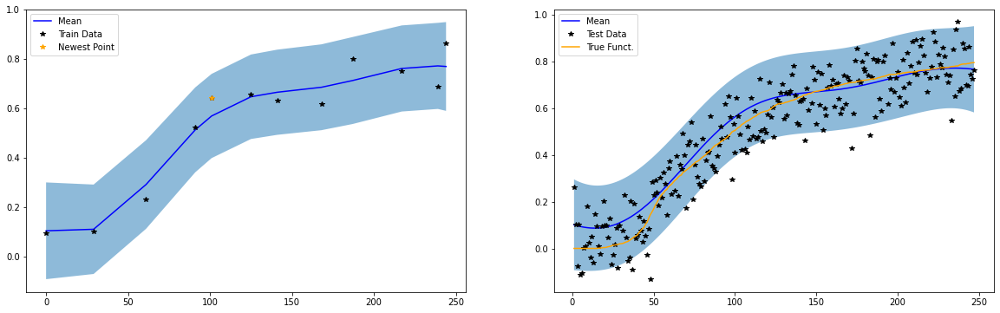

Train RMSE: 0.057020001113414764, Test RMSE: 0.10337000340223312, Noise: 0.00553

####################################################

BEFORE TRAINING
13 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


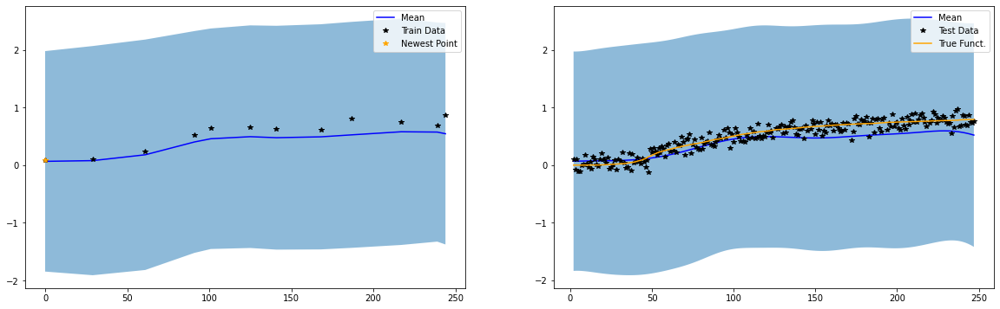

Iter 0/500 - Loss: 1.081   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.446   lengthscale: 30.694   noise: 0.008
Iter 100/500 - Loss: -0.546   lengthscale: 36.608   noise: 0.004
Iter 150/500 - Loss: -0.575   lengthscale: 41.110   noise: 0.004
Iter 200/500 - Loss: -0.595   lengthscale: 44.890   noise: 0.005
Iter 250/500 - Loss: -0.608   lengthscale: 48.079   noise: 0.005
Iter 300/500 - Loss: -0.616   lengthscale: 50.700   noise: 0.005
Iter 350/500 - Loss: -0.621   lengthscale: 52.820   noise: 0.005
Iter 400/500 - Loss: -0.624   lengthscale: 54.524   noise: 0.005
Iter 450/500 - Loss: -0.625   lengthscale: 55.895   noise: 0.005
Iter 500/500 - Loss: -0.627   lengthscale: 57.002   noise: 0.005


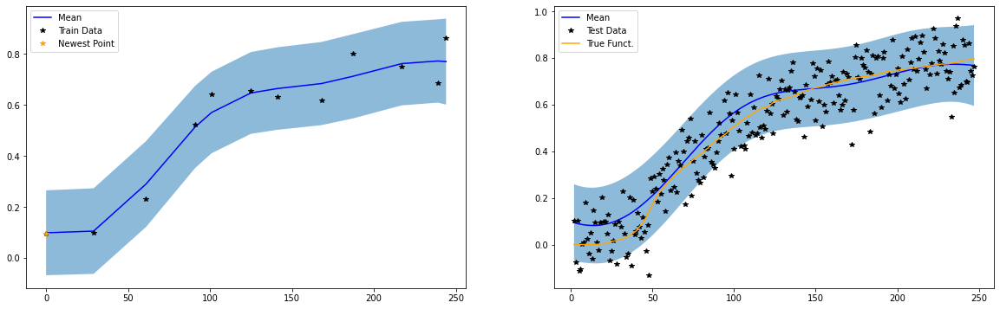

Train RMSE: 0.054269999265670776, Test RMSE: 0.10266000032424927, Noise: 0.00485

####################################################

BEFORE TRAINING
14 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


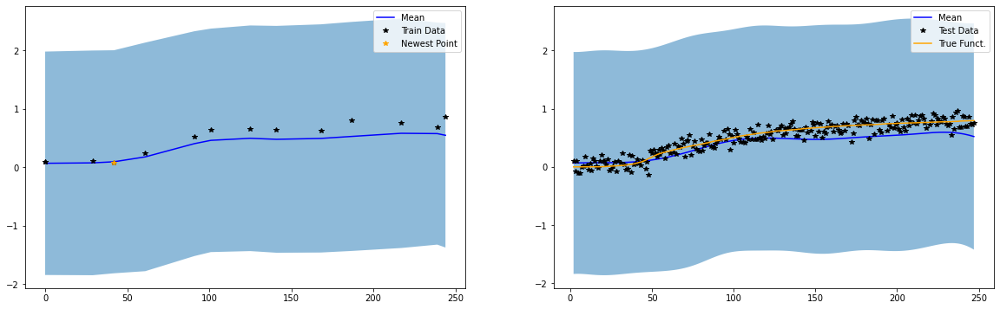

Iter 0/500 - Loss: 1.070   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.492   lengthscale: 30.712   noise: 0.007
Iter 100/500 - Loss: -0.601   lengthscale: 36.590   noise: 0.004
Iter 150/500 - Loss: -0.627   lengthscale: 40.839   noise: 0.004
Iter 200/500 - Loss: -0.642   lengthscale: 44.178   noise: 0.004
Iter 250/500 - Loss: -0.651   lengthscale: 46.848   noise: 0.004
Iter 300/500 - Loss: -0.656   lengthscale: 48.924   noise: 0.004
Iter 350/500 - Loss: -0.658   lengthscale: 50.485   noise: 0.004
Iter 400/500 - Loss: -0.659   lengthscale: 51.627   noise: 0.004
Iter 450/500 - Loss: -0.660   lengthscale: 52.441   noise: 0.004
Iter 500/500 - Loss: -0.660   lengthscale: 53.010   noise: 0.004


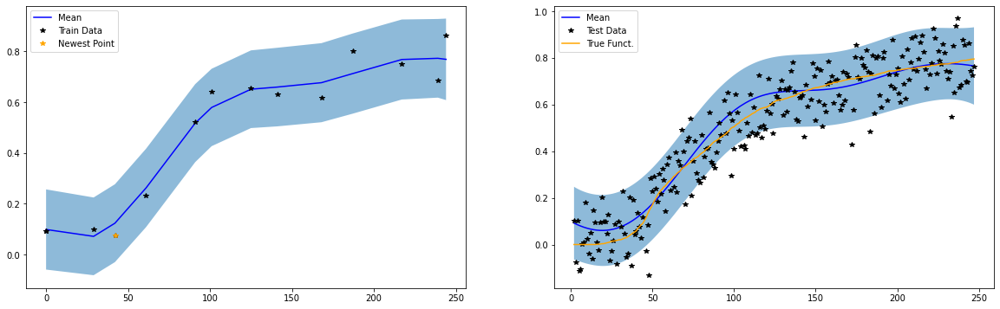

Train RMSE: 0.05119000002741814, Test RMSE: 0.10107000172138214, Noise: 0.00433

####################################################

BEFORE TRAINING
15 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


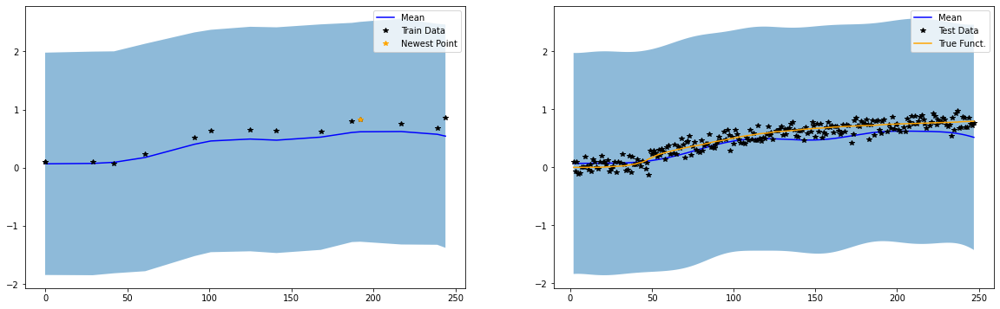

Iter 0/500 - Loss: 1.062   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.531   lengthscale: 30.667   noise: 0.007
Iter 100/500 - Loss: -0.636   lengthscale: 35.554   noise: 0.003
Iter 150/500 - Loss: -0.650   lengthscale: 39.075   noise: 0.004
Iter 200/500 - Loss: -0.659   lengthscale: 42.019   noise: 0.004
Iter 250/500 - Loss: -0.664   lengthscale: 44.478   noise: 0.004
Iter 300/500 - Loss: -0.668   lengthscale: 46.436   noise: 0.004
Iter 350/500 - Loss: -0.669   lengthscale: 47.902   noise: 0.004
Iter 400/500 - Loss: -0.670   lengthscale: 48.942   noise: 0.004
Iter 450/500 - Loss: -0.670   lengthscale: 49.648   noise: 0.004
Iter 500/500 - Loss: -0.670   lengthscale: 50.110   noise: 0.004


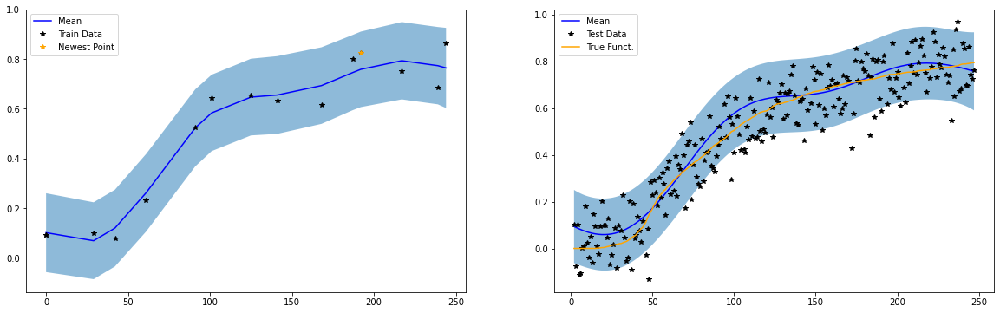

Train RMSE: 0.05180000141263008, Test RMSE: 0.10187999904155731, Noise: 0.00436

####################################################

BEFORE TRAINING
16 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


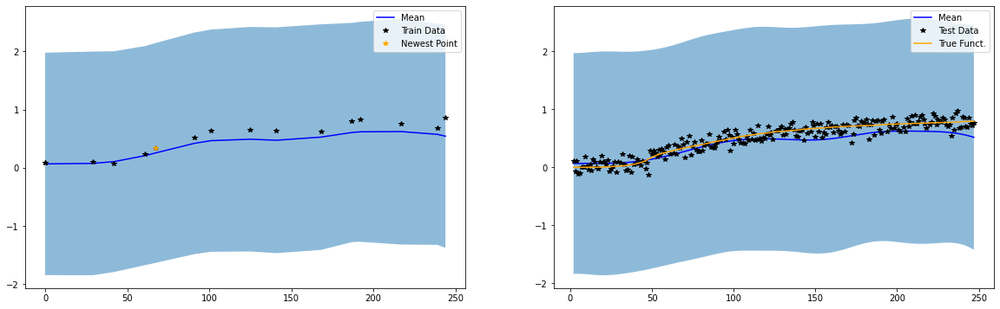

Iter 0/500 - Loss: 1.052   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.576   lengthscale: 30.651   noise: 0.007
Iter 100/500 - Loss: -0.687   lengthscale: 35.651   noise: 0.003
Iter 150/500 - Loss: -0.707   lengthscale: 39.695   noise: 0.003
Iter 200/500 - Loss: -0.718   lengthscale: 42.955   noise: 0.004
Iter 250/500 - Loss: -0.724   lengthscale: 45.411   noise: 0.004
Iter 300/500 - Loss: -0.727   lengthscale: 47.194   noise: 0.004
Iter 350/500 - Loss: -0.728   lengthscale: 48.439   noise: 0.004
Iter 400/500 - Loss: -0.728   lengthscale: 49.279   noise: 0.004
Iter 450/500 - Loss: -0.729   lengthscale: 49.825   noise: 0.004
Iter 500/500 - Loss: -0.729   lengthscale: 50.167   noise: 0.004


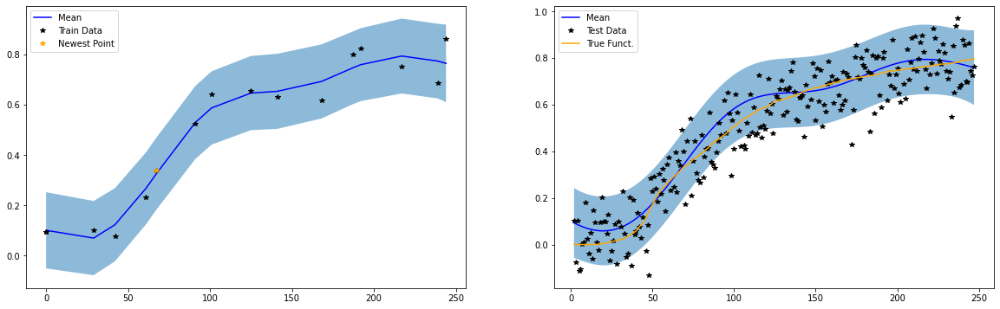

Train RMSE: 0.05017999932169914, Test RMSE: 0.10239999741315842, Noise: 0.00398

####################################################

BEFORE TRAINING
17 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


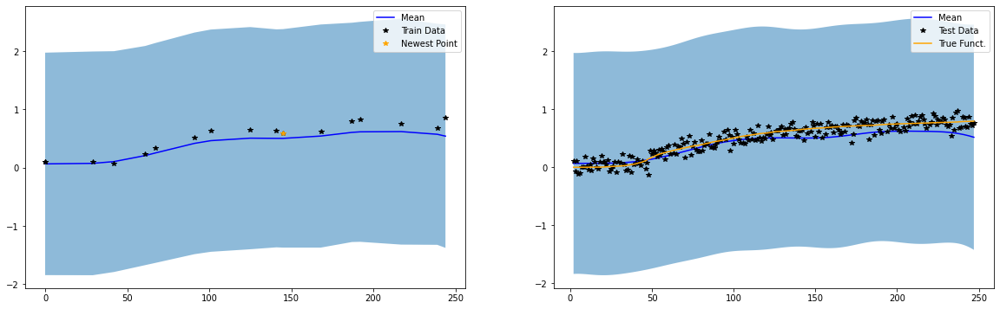

Iter 0/500 - Loss: 1.043   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.621   lengthscale: 30.621   noise: 0.007
Iter 100/500 - Loss: -0.746   lengthscale: 35.159   noise: 0.003
Iter 150/500 - Loss: -0.758   lengthscale: 38.446   noise: 0.003
Iter 200/500 - Loss: -0.764   lengthscale: 41.032   noise: 0.003
Iter 250/500 - Loss: -0.767   lengthscale: 42.835   noise: 0.003
Iter 300/500 - Loss: -0.768   lengthscale: 44.013   noise: 0.003
Iter 350/500 - Loss: -0.768   lengthscale: 44.744   noise: 0.003
Iter 400/500 - Loss: -0.768   lengthscale: 45.174   noise: 0.003
Iter 450/500 - Loss: -0.768   lengthscale: 45.412   noise: 0.003
Iter 500/500 - Loss: -0.768   lengthscale: 45.536   noise: 0.003


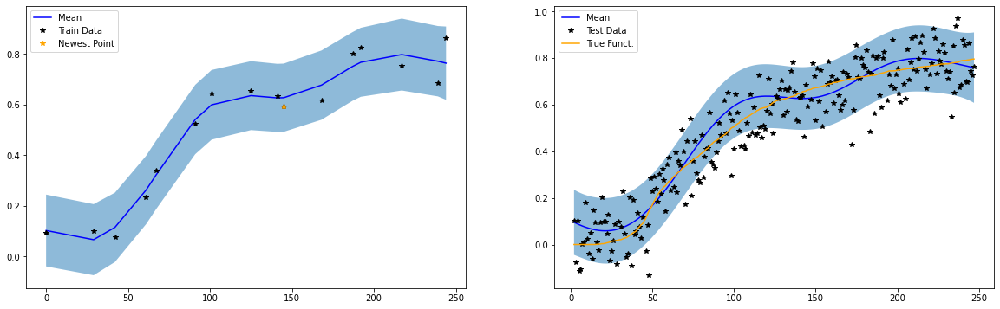

Train RMSE: 0.04633000120520592, Test RMSE: 0.10380999743938446, Noise: 0.00345

####################################################

BEFORE TRAINING
18 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


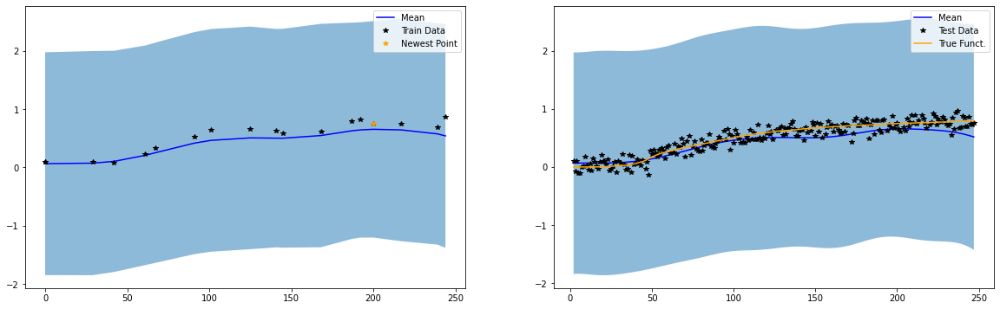

Iter 0/500 - Loss: 1.035   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.662   lengthscale: 30.606   noise: 0.007
Iter 100/500 - Loss: -0.795   lengthscale: 35.614   noise: 0.003
Iter 150/500 - Loss: -0.808   lengthscale: 39.026   noise: 0.003
Iter 200/500 - Loss: -0.814   lengthscale: 41.471   noise: 0.003
Iter 250/500 - Loss: -0.816   lengthscale: 43.169   noise: 0.003
Iter 300/500 - Loss: -0.817   lengthscale: 44.316   noise: 0.003
Iter 350/500 - Loss: -0.817   lengthscale: 45.064   noise: 0.003
Iter 400/500 - Loss: -0.817   lengthscale: 45.530   noise: 0.003
Iter 450/500 - Loss: -0.817   lengthscale: 45.806   noise: 0.003
Iter 500/500 - Loss: -0.818   lengthscale: 45.962   noise: 0.003


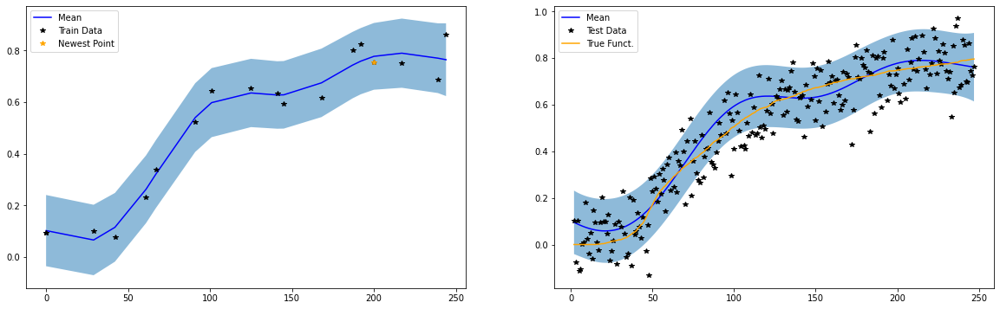

Train RMSE: 0.04577000066637993, Test RMSE: 0.10345999896526337, Noise: 0.00326

####################################################

BEFORE TRAINING
19 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


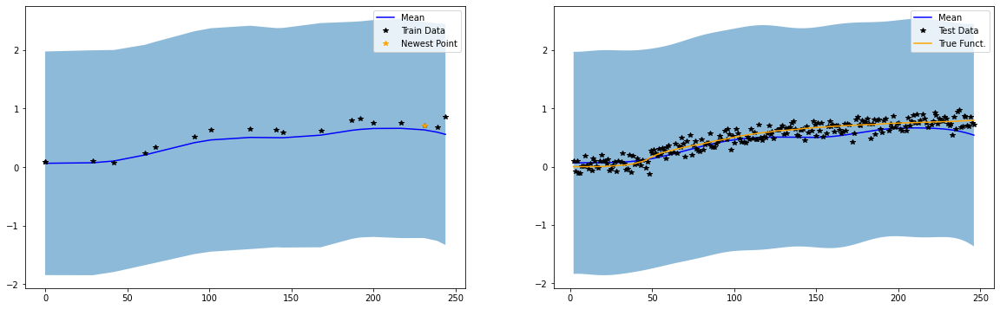

Iter 0/500 - Loss: 1.026   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.696   lengthscale: 30.579   noise: 0.006
Iter 100/500 - Loss: -0.837   lengthscale: 34.841   noise: 0.002
Iter 150/500 - Loss: -0.842   lengthscale: 37.081   noise: 0.002
Iter 200/500 - Loss: -0.844   lengthscale: 38.537   noise: 0.003
Iter 250/500 - Loss: -0.845   lengthscale: 39.482   noise: 0.003
Iter 300/500 - Loss: -0.845   lengthscale: 40.067   noise: 0.003
Iter 350/500 - Loss: -0.845   lengthscale: 40.413   noise: 0.003
Iter 400/500 - Loss: -0.845   lengthscale: 40.607   noise: 0.003
Iter 450/500 - Loss: -0.845   lengthscale: 40.709   noise: 0.003
Iter 500/500 - Loss: -0.845   lengthscale: 40.760   noise: 0.003


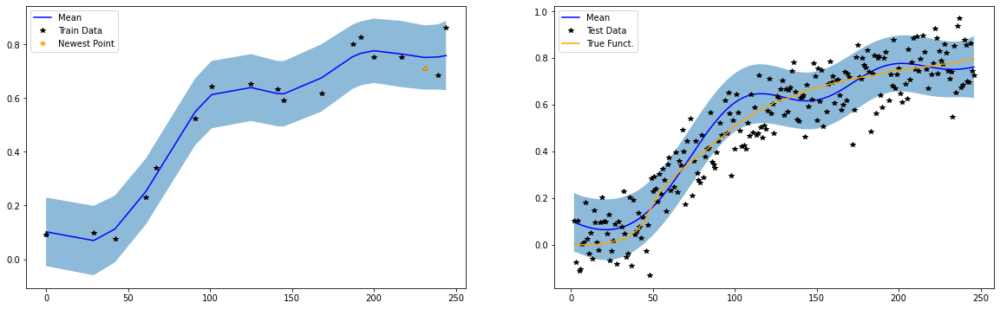

Train RMSE: 0.0414699986577034, Test RMSE: 0.10656999796628952, Noise: 0.00277

####################################################

BEFORE TRAINING
20 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


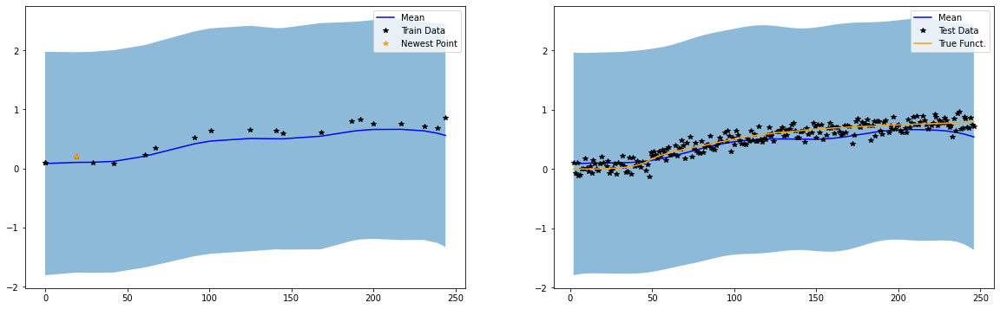

Iter 0/500 - Loss: 1.019   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.685   lengthscale: 30.527   noise: 0.007
Iter 100/500 - Loss: -0.780   lengthscale: 33.853   noise: 0.003
Iter 150/500 - Loss: -0.786   lengthscale: 36.511   noise: 0.003
Iter 200/500 - Loss: -0.789   lengthscale: 38.499   noise: 0.003
Iter 250/500 - Loss: -0.790   lengthscale: 39.511   noise: 0.004
Iter 300/500 - Loss: -0.790   lengthscale: 39.949   noise: 0.004
Iter 350/500 - Loss: -0.790   lengthscale: 40.124   noise: 0.004
Iter 400/500 - Loss: -0.790   lengthscale: 40.188   noise: 0.004
Iter 450/500 - Loss: -0.790   lengthscale: 40.209   noise: 0.004
Iter 500/500 - Loss: -0.790   lengthscale: 40.215   noise: 0.004


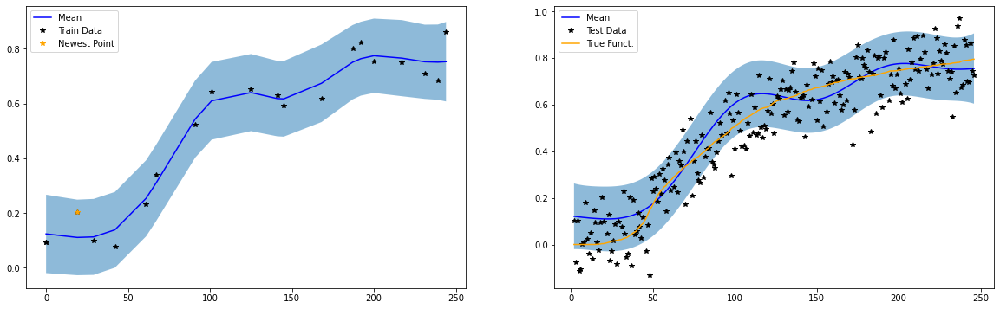

Train RMSE: 0.04809999838471413, Test RMSE: 0.10935000330209732, Noise: 0.00359



In [53]:
final_train_rmses, final_test_rmses, noise_estimates, final_true_test_rmses = train(m2_pa2_cont8, m2_pa2_cont8_noisy, 20, False)

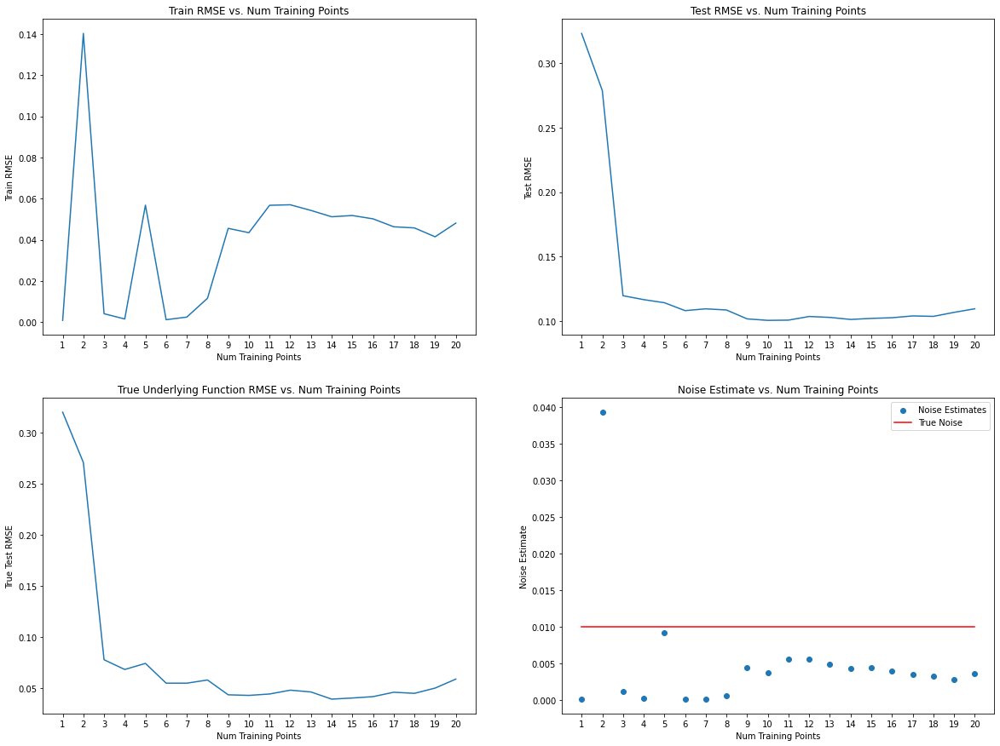

In [64]:
plot_rmses_and_noise(final_train_rmses, final_test_rmses, final_true_test_rmses, noise_estimates, 20)

####################################################

BEFORE TRAINING
1 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


/var/folders/c0/0rqzqv5n0bg36m4j1jc_zv3w0000gn/T/ipykernel_9540/3709150696.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k*" (-> color='k'). The keyword argument will take precedence.
  ax[0].plot(newest_point[0], newest_point[1], 'k*', color = 'orange', label = 'Newest Point')


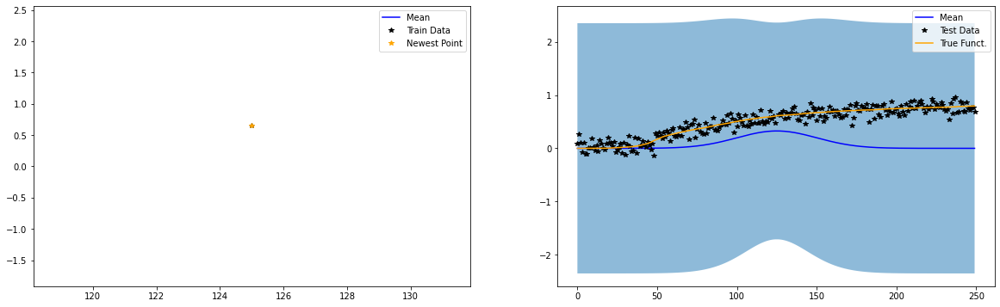

Iter 0/500 - Loss: 1.236   lengthscale: 25.000   noise: 0.644
Iter 50/500 - Loss: -1.370   lengthscale: 25.000   noise: 0.005
Iter 100/500 - Loss: -3.050   lengthscale: 25.000   noise: 0.000
Iter 150/500 - Loss: -3.505   lengthscale: 25.000   noise: 0.000
Iter 200/500 - Loss: -3.636   lengthscale: 25.000   noise: 0.000
Iter 250/500 - Loss: -3.630   lengthscale: 25.000   noise: 0.000
Iter 300/500 - Loss: -3.652   lengthscale: 25.000   noise: 0.000
Iter 350/500 - Loss: -3.653   lengthscale: 25.000   noise: 0.000
Iter 400/500 - Loss: -3.665   lengthscale: 25.000   noise: 0.000
Iter 450/500 - Loss: -3.678   lengthscale: 25.000   noise: 0.000
Iter 500/500 - Loss: -3.678   lengthscale: 25.000   noise: 0.000


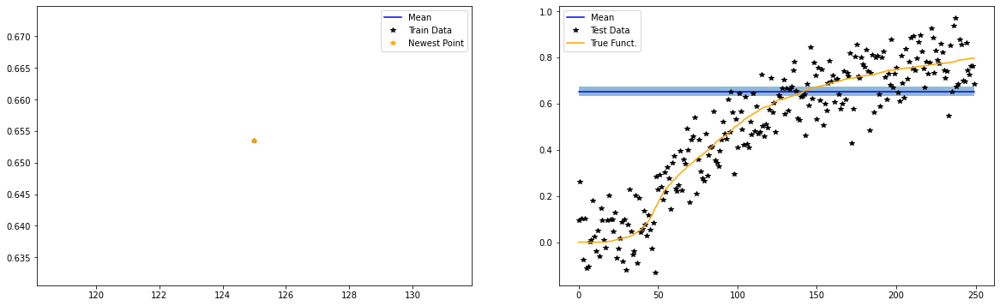

Train RMSE: 0.0008299999753944576, Test RMSE: 0.323170006275177, Noise: 0.0001

####################################################

BEFORE TRAINING
2 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


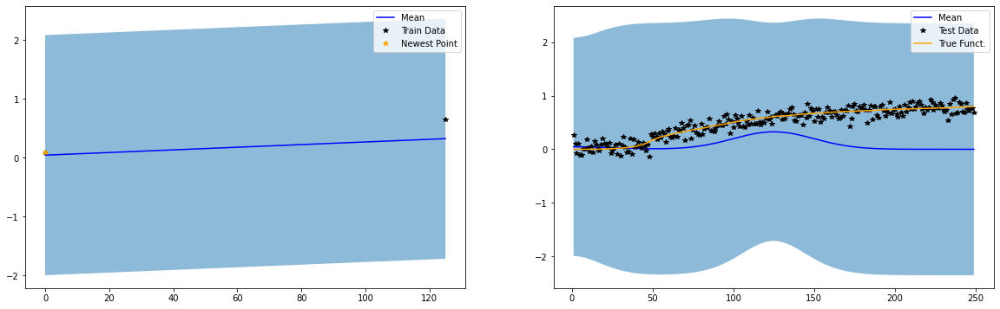

Iter 0/500 - Loss: 1.161   lengthscale: 25.080   noise: 0.644
Iter 50/500 - Loss: 0.154   lengthscale: 21.249   noise: 0.034
Iter 100/500 - Loss: 0.147   lengthscale: 20.399   noise: 0.040
Iter 150/500 - Loss: 0.147   lengthscale: 20.127   noise: 0.039
Iter 200/500 - Loss: 0.147   lengthscale: 19.927   noise: 0.039
Iter 250/500 - Loss: 0.147   lengthscale: 19.768   noise: 0.039
Iter 300/500 - Loss: 0.147   lengthscale: 19.638   noise: 0.039
Iter 350/500 - Loss: 0.147   lengthscale: 19.528   noise: 0.039
Iter 400/500 - Loss: 0.147   lengthscale: 19.432   noise: 0.039
Iter 450/500 - Loss: 0.147   lengthscale: 19.349   noise: 0.039
Iter 500/500 - Loss: 0.147   lengthscale: 19.274   noise: 0.039


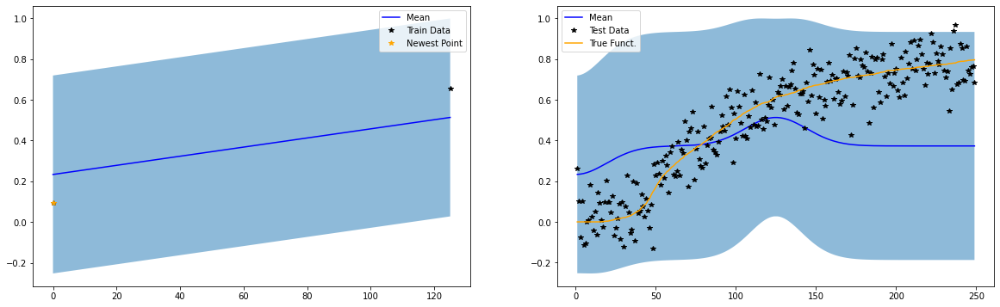

Train RMSE: 0.14032000303268433, Test RMSE: 0.2788099944591522, Noise: 0.03933

####################################################

BEFORE TRAINING
3 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


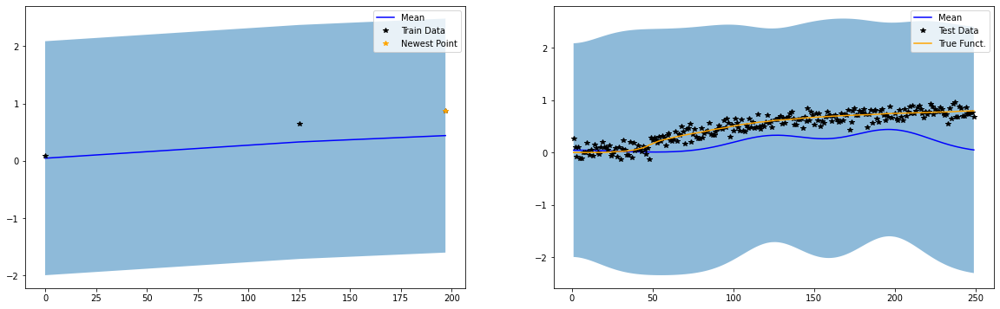

Iter 0/500 - Loss: 1.226   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.307   lengthscale: 29.986   noise: 0.052
Iter 100/500 - Loss: 0.300   lengthscale: 36.719   noise: 0.046
Iter 150/500 - Loss: 0.286   lengthscale: 44.006   noise: 0.029
Iter 200/500 - Loss: 0.266   lengthscale: 51.607   noise: 0.014
Iter 250/500 - Loss: 0.245   lengthscale: 59.202   noise: 0.007
Iter 300/500 - Loss: 0.224   lengthscale: 66.502   noise: 0.003
Iter 350/500 - Loss: 0.205   lengthscale: 73.323   noise: 0.002
Iter 400/500 - Loss: 0.189   lengthscale: 79.580   noise: 0.001
Iter 450/500 - Loss: 0.176   lengthscale: 85.278   noise: 0.001
Iter 500/500 - Loss: 0.165   lengthscale: 90.468   noise: 0.001


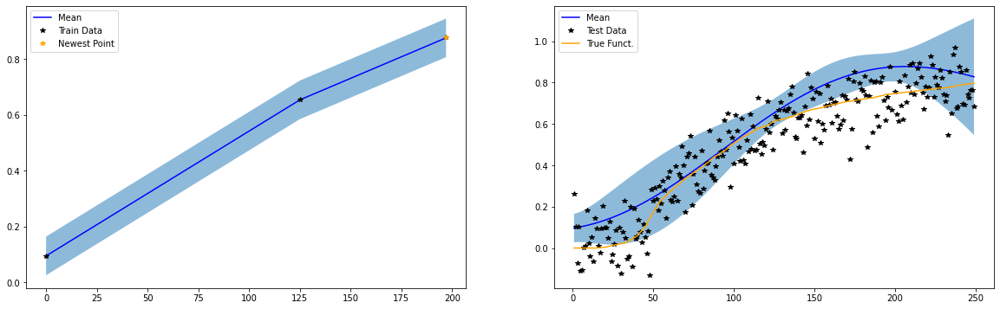

Train RMSE: 0.001820000004954636, Test RMSE: 0.13235999643802643, Noise: 0.0006

####################################################

BEFORE TRAINING
4 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


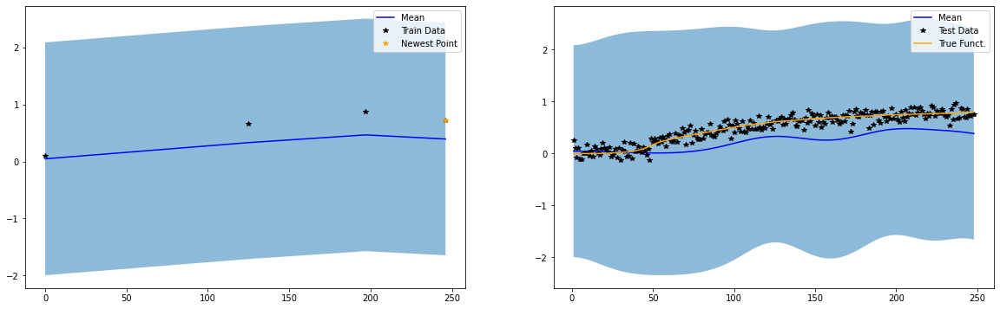

Iter 0/500 - Loss: 1.229   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.187   lengthscale: 30.184   noise: 0.034
Iter 100/500 - Loss: 0.152   lengthscale: 36.815   noise: 0.019
Iter 150/500 - Loss: 0.105   lengthscale: 44.101   noise: 0.007
Iter 200/500 - Loss: 0.059   lengthscale: 51.199   noise: 0.003
Iter 250/500 - Loss: 0.020   lengthscale: 57.724   noise: 0.001
Iter 300/500 - Loss: -0.012   lengthscale: 63.612   noise: 0.001
Iter 350/500 - Loss: -0.037   lengthscale: 68.826   noise: 0.001
Iter 400/500 - Loss: -0.055   lengthscale: 73.323   noise: 0.000
Iter 450/500 - Loss: -0.067   lengthscale: 77.084   noise: 0.000
Iter 500/500 - Loss: -0.075   lengthscale: 80.125   noise: 0.000


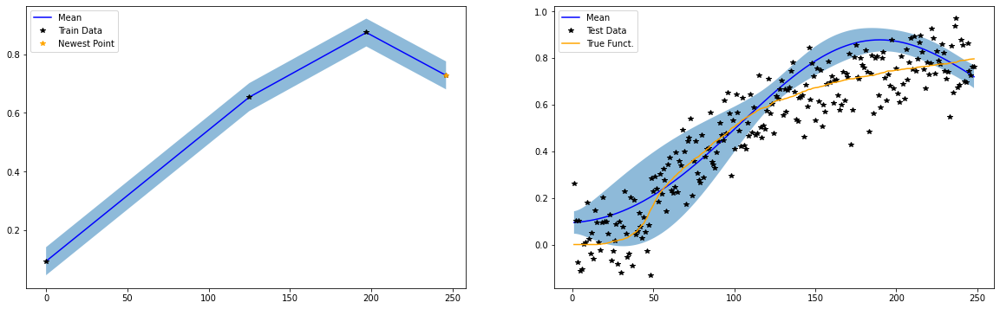

Train RMSE: 0.0015800000401213765, Test RMSE: 0.13022999465465546, Noise: 0.00029

####################################################

BEFORE TRAINING
5 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


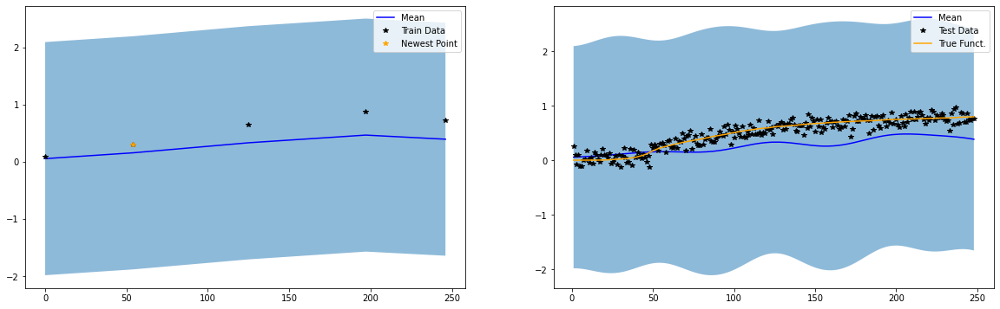

Iter 0/500 - Loss: 1.206   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.120   lengthscale: 31.049   noise: 0.025
Iter 100/500 - Loss: 0.037   lengthscale: 37.805   noise: 0.008
Iter 150/500 - Loss: -0.033   lengthscale: 44.331   noise: 0.003
Iter 200/500 - Loss: -0.092   lengthscale: 50.411   noise: 0.001
Iter 250/500 - Loss: -0.142   lengthscale: 56.048   noise: 0.001
Iter 300/500 - Loss: -0.185   lengthscale: 61.257   noise: 0.001
Iter 350/500 - Loss: -0.220   lengthscale: 66.025   noise: 0.000
Iter 400/500 - Loss: -0.247   lengthscale: 70.336   noise: 0.000
Iter 450/500 - Loss: -0.268   lengthscale: 74.186   noise: 0.000
Iter 500/500 - Loss: -0.284   lengthscale: 77.585   noise: 0.000


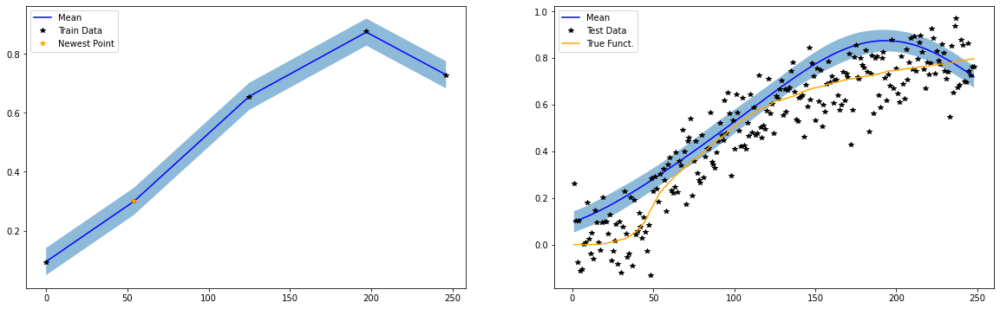

Train RMSE: 0.0025100000202655792, Test RMSE: 0.13686999678611755, Noise: 0.00027

####################################################

BEFORE TRAINING
6 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


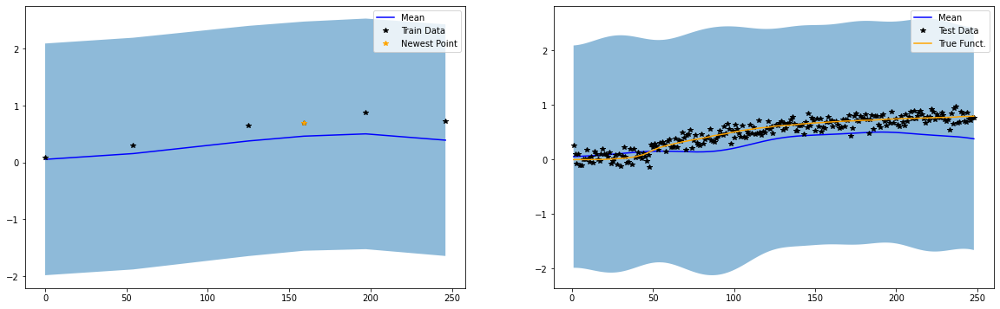

Iter 0/500 - Loss: 1.192   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.005   lengthscale: 30.856   noise: 0.017
Iter 100/500 - Loss: -0.121   lengthscale: 37.662   noise: 0.004
Iter 150/500 - Loss: -0.182   lengthscale: 43.276   noise: 0.002
Iter 200/500 - Loss: -0.207   lengthscale: 47.248   noise: 0.002
Iter 250/500 - Loss: -0.225   lengthscale: 50.474   noise: 0.003
Iter 300/500 - Loss: -0.246   lengthscale: 54.164   noise: 0.004
Iter 350/500 - Loss: -0.265   lengthscale: 57.945   noise: 0.004
Iter 400/500 - Loss: -0.283   lengthscale: 61.668   noise: 0.004
Iter 450/500 - Loss: -0.299   lengthscale: 65.317   noise: 0.004
Iter 500/500 - Loss: -0.314   lengthscale: 68.889   noise: 0.004


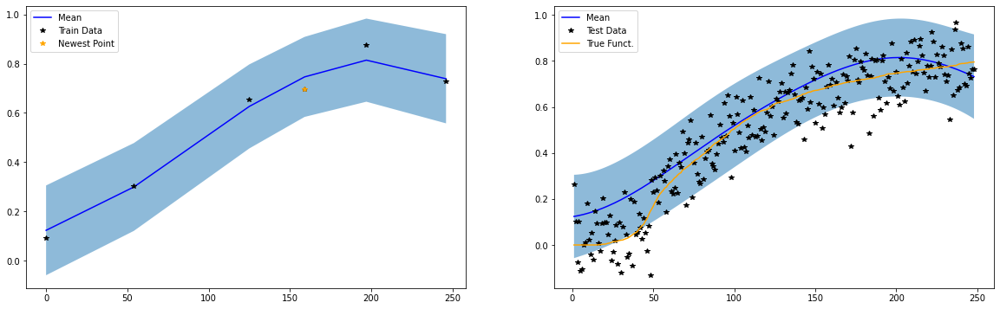

Train RMSE: 0.03728000074625015, Test RMSE: 0.12210000306367874, Noise: 0.00448

####################################################

BEFORE TRAINING
7 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


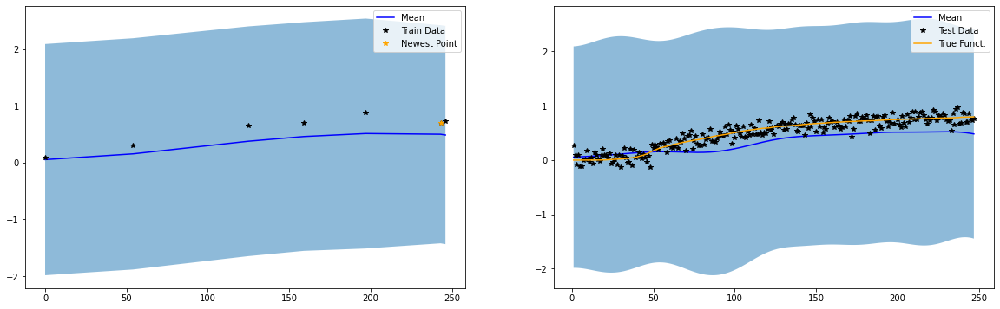

Iter 0/500 - Loss: 1.162   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.145   lengthscale: 30.856   noise: 0.012
Iter 100/500 - Loss: -0.342   lengthscale: 37.499   noise: 0.001
Iter 150/500 - Loss: -0.373   lengthscale: 42.141   noise: 0.001
Iter 200/500 - Loss: -0.388   lengthscale: 45.542   noise: 0.002
Iter 250/500 - Loss: -0.397   lengthscale: 48.223   noise: 0.002
Iter 300/500 - Loss: -0.404   lengthscale: 50.655   noise: 0.002
Iter 350/500 - Loss: -0.412   lengthscale: 53.268   noise: 0.002
Iter 400/500 - Loss: -0.421   lengthscale: 56.306   noise: 0.003
Iter 450/500 - Loss: -0.432   lengthscale: 59.756   noise: 0.003
Iter 500/500 - Loss: -0.445   lengthscale: 63.454   noise: 0.003


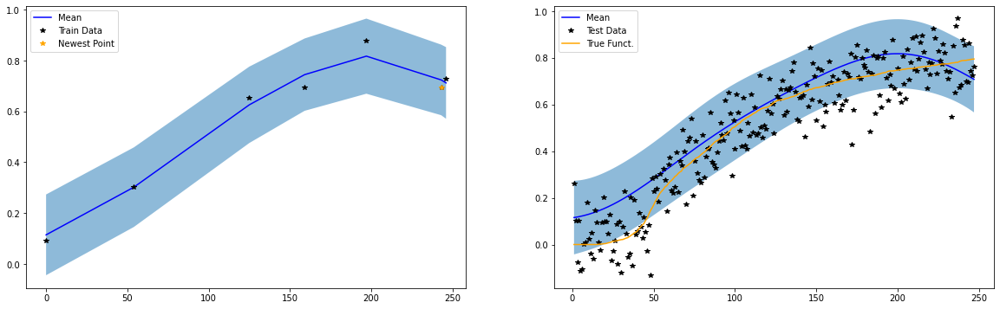

Train RMSE: 0.034460000693798065, Test RMSE: 0.1222200021147728, Noise: 0.00333

####################################################

BEFORE TRAINING
8 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


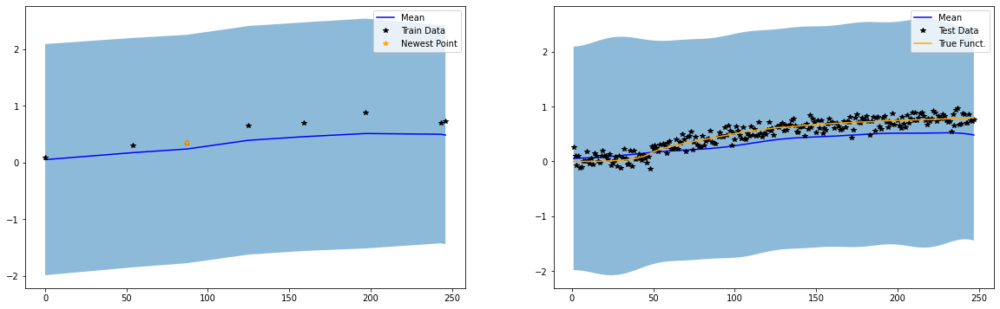

Iter 0/500 - Loss: 1.149   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.181   lengthscale: 30.787   noise: 0.011
Iter 100/500 - Loss: -0.310   lengthscale: 35.950   noise: 0.002
Iter 150/500 - Loss: -0.311   lengthscale: 35.913   noise: 0.002
Iter 200/500 - Loss: -0.311   lengthscale: 35.574   noise: 0.002
Iter 250/500 - Loss: -0.311   lengthscale: 35.304   noise: 0.002
Iter 300/500 - Loss: -0.311   lengthscale: 35.123   noise: 0.002
Iter 350/500 - Loss: -0.311   lengthscale: 35.028   noise: 0.002
Iter 400/500 - Loss: -0.311   lengthscale: 34.987   noise: 0.002
Iter 450/500 - Loss: -0.311   lengthscale: 34.973   noise: 0.002
Iter 500/500 - Loss: -0.311   lengthscale: 34.969   noise: 0.002


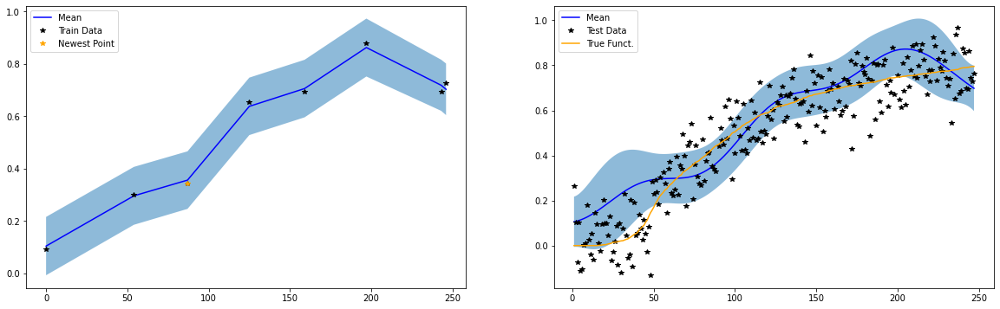

Train RMSE: 0.01614999957382679, Test RMSE: 0.13118000328540802, Noise: 0.00157

####################################################

BEFORE TRAINING
9 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


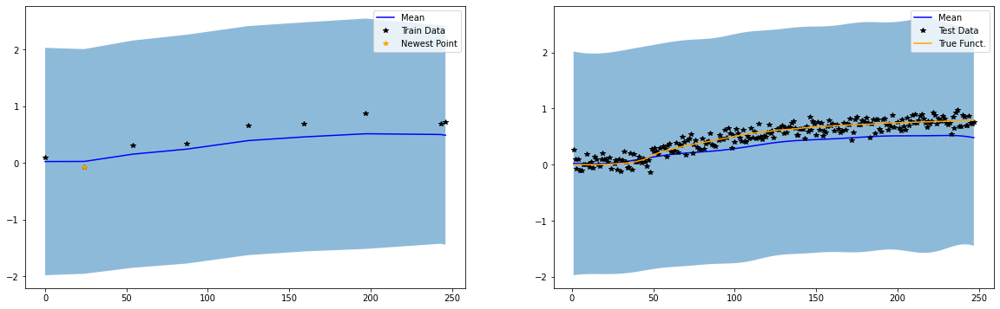

Iter 0/500 - Loss: 1.134   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.115   lengthscale: 30.751   noise: 0.011
Iter 100/500 - Loss: -0.144   lengthscale: 32.125   noise: 0.005
Iter 150/500 - Loss: -0.149   lengthscale: 30.391   noise: 0.004
Iter 200/500 - Loss: -0.171   lengthscale: 27.578   noise: 0.002
Iter 250/500 - Loss: -0.179   lengthscale: 26.713   noise: 0.001
Iter 300/500 - Loss: -0.179   lengthscale: 26.505   noise: 0.001
Iter 350/500 - Loss: -0.179   lengthscale: 26.451   noise: 0.001
Iter 400/500 - Loss: -0.179   lengthscale: 26.437   noise: 0.001
Iter 450/500 - Loss: -0.179   lengthscale: 26.433   noise: 0.001
Iter 500/500 - Loss: -0.179   lengthscale: 26.432   noise: 0.001


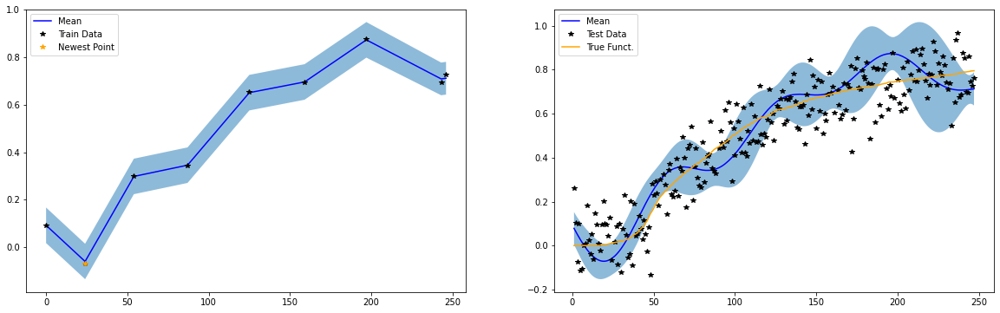

Train RMSE: 0.00773000018671155, Test RMSE: 0.118709996342659, Noise: 0.0007

####################################################

BEFORE TRAINING
10 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


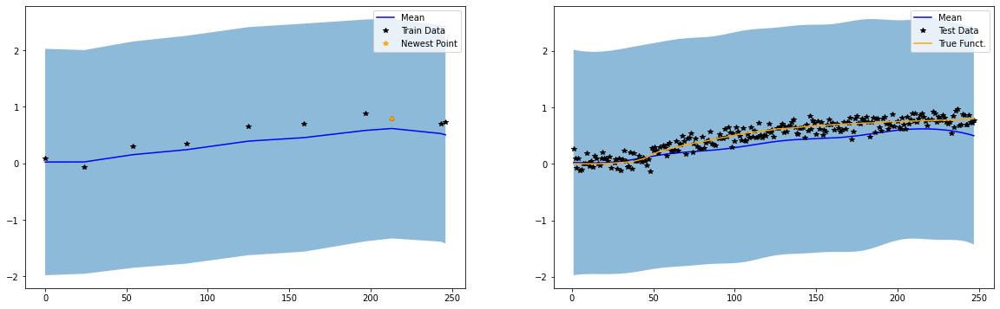

Iter 0/500 - Loss: 1.120   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.208   lengthscale: 30.692   noise: 0.009
Iter 100/500 - Loss: -0.251   lengthscale: 31.048   noise: 0.004
Iter 150/500 - Loss: -0.280   lengthscale: 28.094   noise: 0.002
Iter 200/500 - Loss: -0.300   lengthscale: 27.449   noise: 0.001
Iter 250/500 - Loss: -0.303   lengthscale: 27.420   noise: 0.000
Iter 300/500 - Loss: -0.303   lengthscale: 27.416   noise: 0.000
Iter 350/500 - Loss: -0.303   lengthscale: 27.415   noise: 0.000
Iter 400/500 - Loss: -0.303   lengthscale: 27.415   noise: 0.000
Iter 450/500 - Loss: -0.303   lengthscale: 27.415   noise: 0.000
Iter 500/500 - Loss: -0.303   lengthscale: 27.415   noise: 0.000


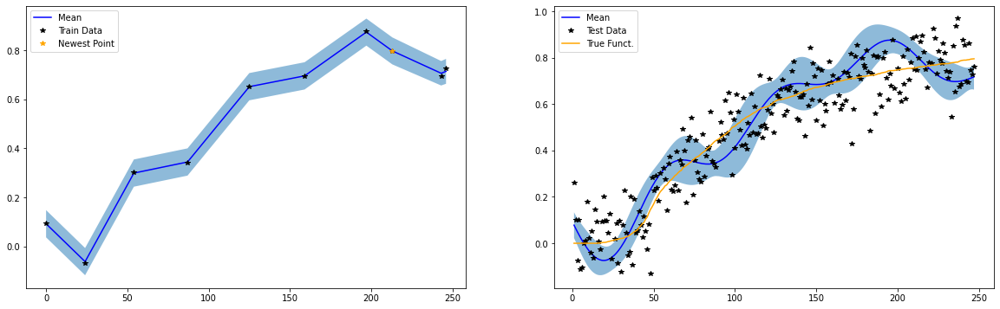

Train RMSE: 0.005890000145882368, Test RMSE: 0.12037000060081482, Noise: 0.00039

####################################################

BEFORE TRAINING
11 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


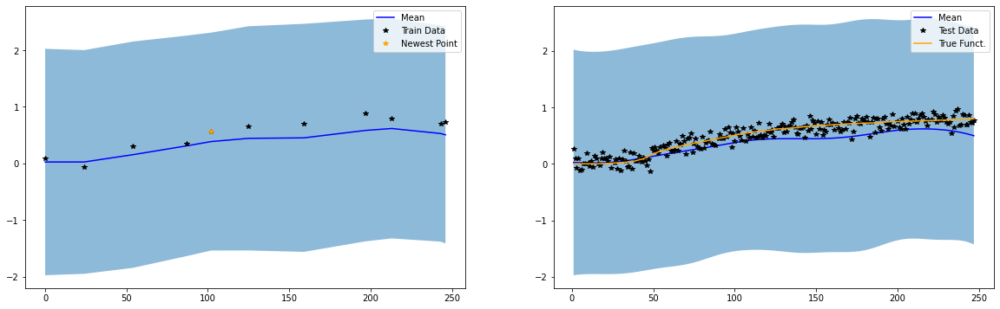

Iter 0/500 - Loss: 1.107   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.265   lengthscale: 30.675   noise: 0.009
Iter 100/500 - Loss: -0.304   lengthscale: 33.913   noise: 0.006
Iter 150/500 - Loss: -0.327   lengthscale: 38.488   noise: 0.007
Iter 200/500 - Loss: -0.362   lengthscale: 44.290   noise: 0.008
Iter 250/500 - Loss: -0.391   lengthscale: 49.574   noise: 0.008
Iter 300/500 - Loss: -0.411   lengthscale: 53.945   noise: 0.008
Iter 350/500 - Loss: -0.424   lengthscale: 57.602   noise: 0.008
Iter 400/500 - Loss: -0.433   lengthscale: 60.798   noise: 0.008
Iter 450/500 - Loss: -0.441   lengthscale: 63.713   noise: 0.008
Iter 500/500 - Loss: -0.447   lengthscale: 66.460   noise: 0.008


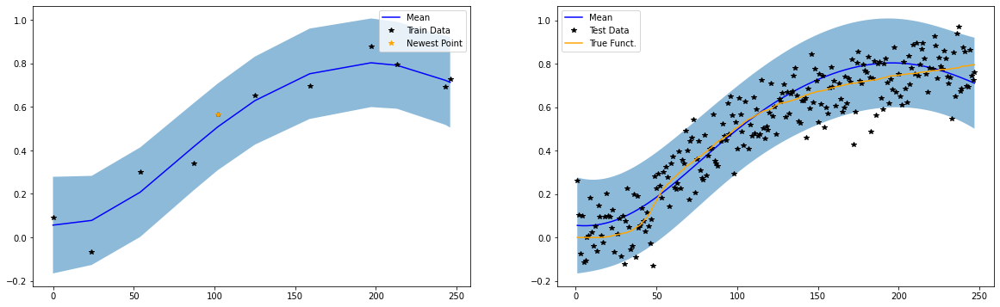

Train RMSE: 0.06767000257968903, Test RMSE: 0.10758999735116959, Noise: 0.00758

####################################################

BEFORE TRAINING
12 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


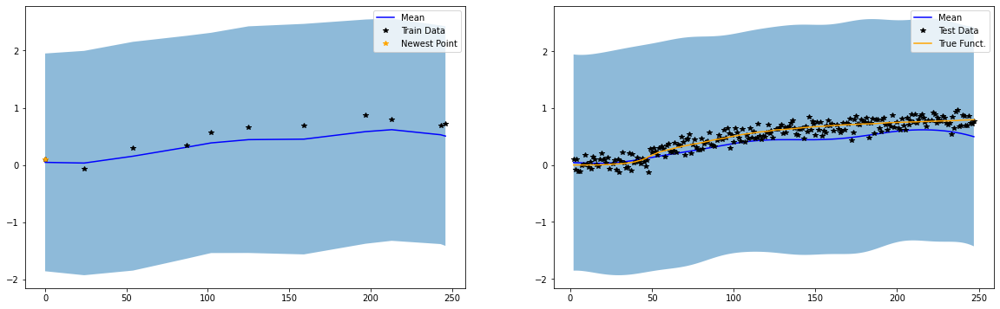

Iter 0/500 - Loss: 1.092   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.348   lengthscale: 30.686   noise: 0.008
Iter 100/500 - Loss: -0.398   lengthscale: 31.022   noise: 0.003
Iter 150/500 - Loss: -0.415   lengthscale: 28.065   noise: 0.002
Iter 200/500 - Loss: -0.476   lengthscale: 24.518   noise: 0.001
Iter 250/500 - Loss: -0.512   lengthscale: 23.860   noise: 0.000
Iter 300/500 - Loss: -0.525   lengthscale: 23.614   noise: 0.000
Iter 350/500 - Loss: -0.530   lengthscale: 23.516   noise: 0.000
Iter 400/500 - Loss: -0.533   lengthscale: 23.470   noise: 0.000
Iter 450/500 - Loss: -0.535   lengthscale: 23.445   noise: 0.000
Iter 500/500 - Loss: -0.536   lengthscale: 23.430   noise: 0.000


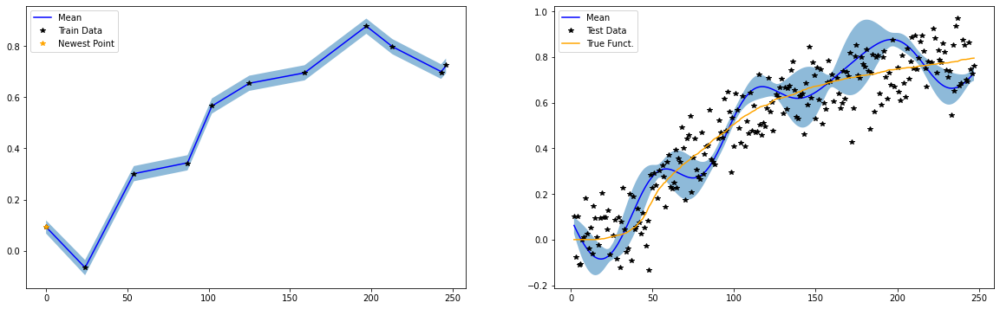

Train RMSE: 0.002199999988079071, Test RMSE: 0.12755000591278076, Noise: 0.00011

####################################################

BEFORE TRAINING
13 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


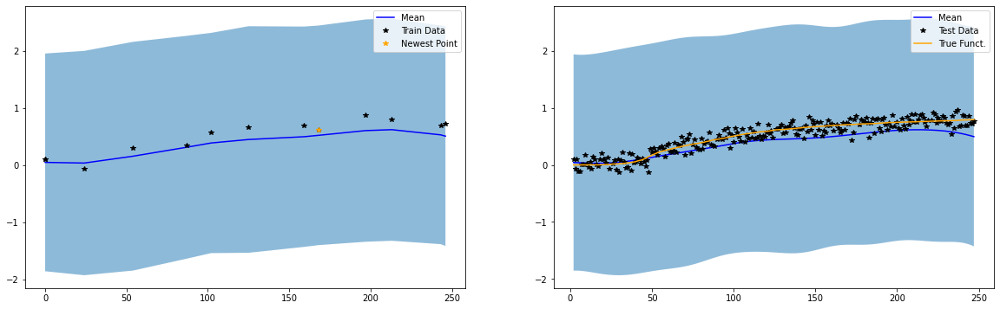

Iter 0/500 - Loss: 1.080   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.378   lengthscale: 30.609   noise: 0.008
Iter 100/500 - Loss: -0.411   lengthscale: 31.899   noise: 0.005
Iter 150/500 - Loss: -0.411   lengthscale: 32.683   noise: 0.005
Iter 200/500 - Loss: -0.412   lengthscale: 33.612   noise: 0.005
Iter 250/500 - Loss: -0.413   lengthscale: 35.203   noise: 0.006
Iter 300/500 - Loss: -0.422   lengthscale: 38.843   noise: 0.007
Iter 350/500 - Loss: -0.446   lengthscale: 45.445   noise: 0.007
Iter 400/500 - Loss: -0.466   lengthscale: 51.598   noise: 0.008
Iter 450/500 - Loss: -0.475   lengthscale: 55.899   noise: 0.008
Iter 500/500 - Loss: -0.480   lengthscale: 59.049   noise: 0.008


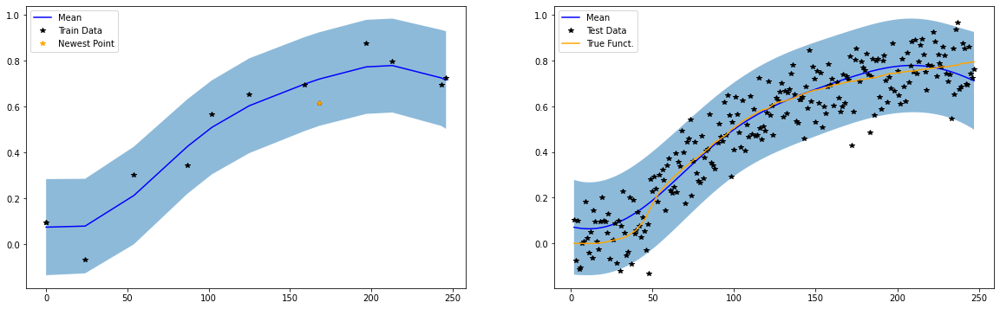

Train RMSE: 0.07101999968290329, Test RMSE: 0.10010000318288803, Noise: 0.0079

####################################################

BEFORE TRAINING
14 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


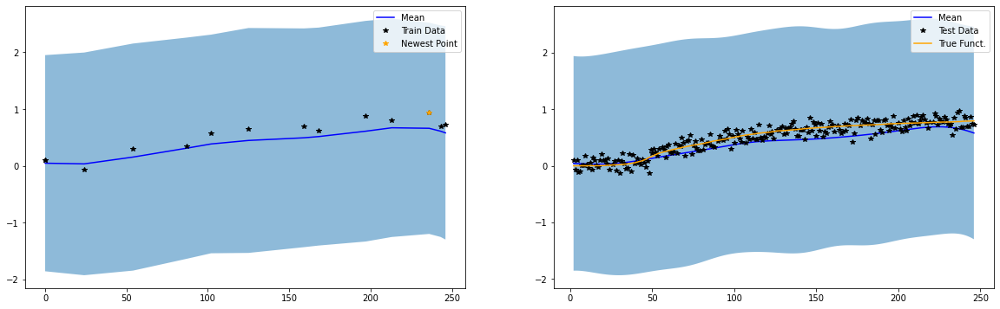

Iter 0/500 - Loss: 1.071   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.327   lengthscale: 30.616   noise: 0.009
Iter 100/500 - Loss: -0.355   lengthscale: 35.399   noise: 0.009
Iter 150/500 - Loss: -0.373   lengthscale: 39.679   noise: 0.009
Iter 200/500 - Loss: -0.389   lengthscale: 43.868   noise: 0.009
Iter 250/500 - Loss: -0.402   lengthscale: 47.803   noise: 0.009
Iter 300/500 - Loss: -0.412   lengthscale: 51.229   noise: 0.009
Iter 350/500 - Loss: -0.418   lengthscale: 54.098   noise: 0.010
Iter 400/500 - Loss: -0.422   lengthscale: 56.505   noise: 0.010
Iter 450/500 - Loss: -0.425   lengthscale: 58.575   noise: 0.010
Iter 500/500 - Loss: -0.427   lengthscale: 60.415   noise: 0.010


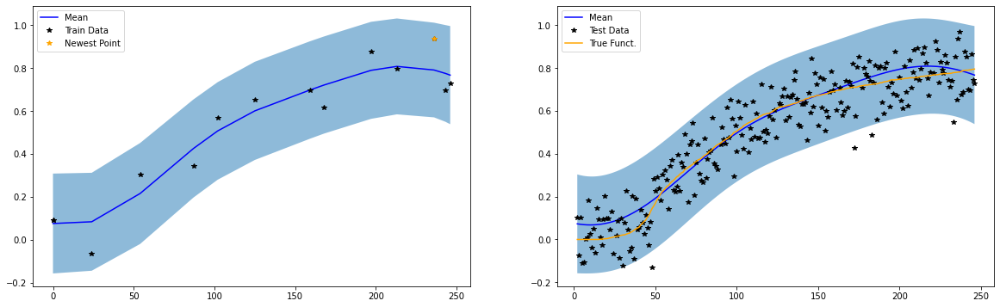

Train RMSE: 0.08113999664783478, Test RMSE: 0.10083000361919403, Noise: 0.00978

####################################################

BEFORE TRAINING
15 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


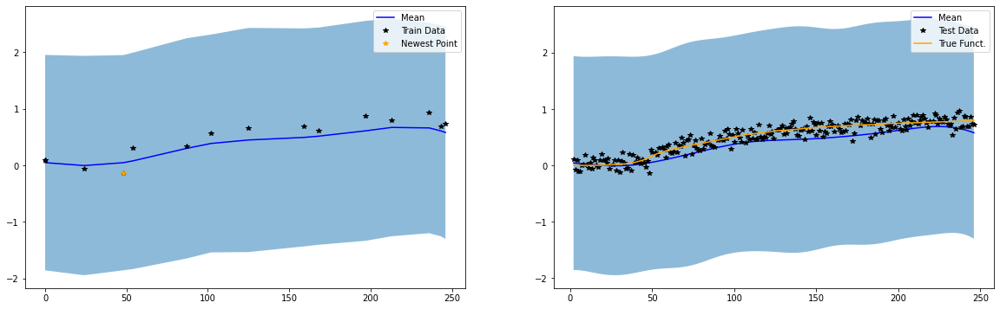

Iter 0/500 - Loss: 1.063   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.174   lengthscale: 30.757   noise: 0.012
Iter 100/500 - Loss: -0.223   lengthscale: 36.381   noise: 0.014
Iter 150/500 - Loss: -0.246   lengthscale: 40.547   noise: 0.014
Iter 200/500 - Loss: -0.260   lengthscale: 43.879   noise: 0.014
Iter 250/500 - Loss: -0.268   lengthscale: 46.545   noise: 0.014
Iter 300/500 - Loss: -0.272   lengthscale: 48.661   noise: 0.014
Iter 350/500 - Loss: -0.275   lengthscale: 50.334   noise: 0.014
Iter 400/500 - Loss: -0.276   lengthscale: 51.662   noise: 0.014
Iter 450/500 - Loss: -0.277   lengthscale: 52.723   noise: 0.014
Iter 500/500 - Loss: -0.278   lengthscale: 53.578   noise: 0.014


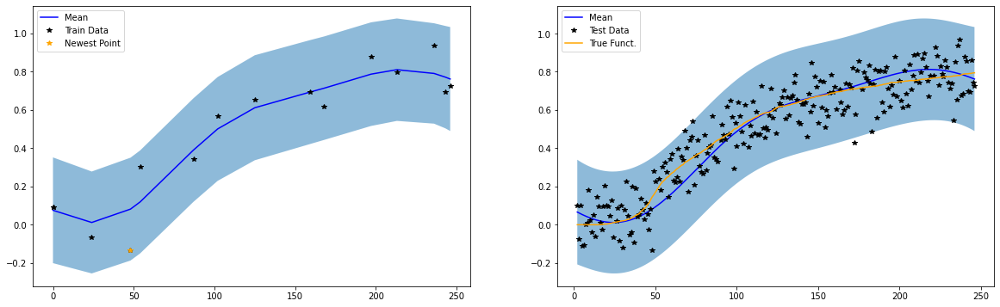

Train RMSE: 0.09662000089883804, Test RMSE: 0.10480000078678131, Noise: 0.01381

####################################################

BEFORE TRAINING
16 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


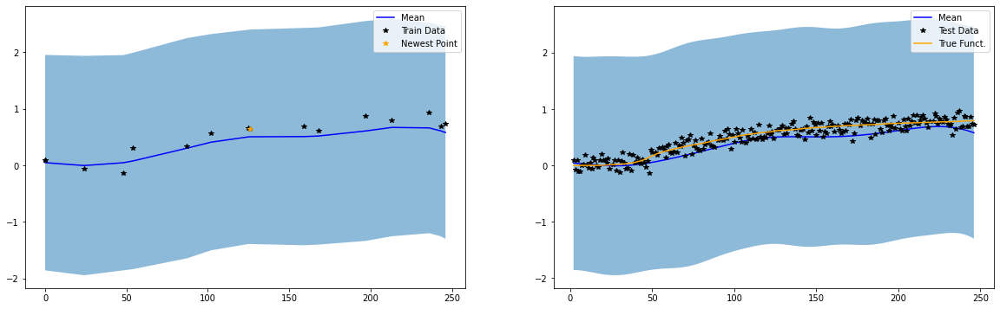

Iter 0/500 - Loss: 1.055   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.226   lengthscale: 30.741   noise: 0.011
Iter 100/500 - Loss: -0.273   lengthscale: 36.405   noise: 0.012
Iter 150/500 - Loss: -0.296   lengthscale: 40.600   noise: 0.012
Iter 200/500 - Loss: -0.310   lengthscale: 43.952   noise: 0.012
Iter 250/500 - Loss: -0.318   lengthscale: 46.626   noise: 0.012
Iter 300/500 - Loss: -0.323   lengthscale: 48.732   noise: 0.012
Iter 350/500 - Loss: -0.325   lengthscale: 50.377   noise: 0.012
Iter 400/500 - Loss: -0.327   lengthscale: 51.661   noise: 0.012
Iter 450/500 - Loss: -0.327   lengthscale: 52.665   noise: 0.012
Iter 500/500 - Loss: -0.328   lengthscale: 53.454   noise: 0.013


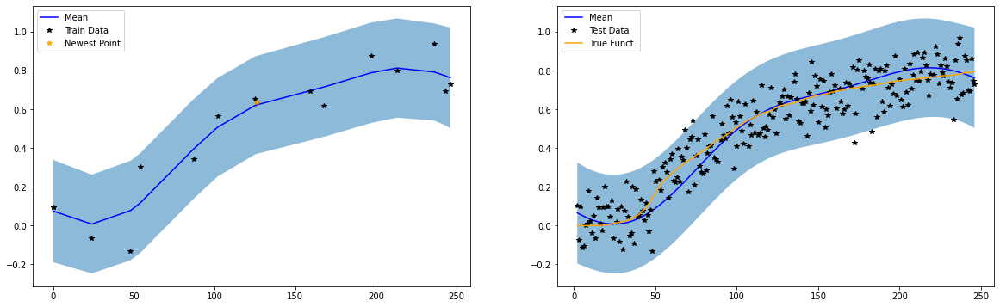

Train RMSE: 0.09290000051259995, Test RMSE: 0.10548999905586243, Noise: 0.01255

####################################################

BEFORE TRAINING
17 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


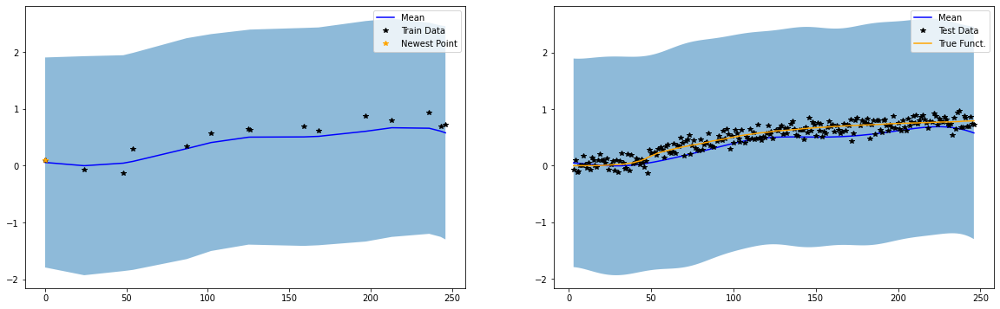

Iter 0/500 - Loss: 1.044   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.278   lengthscale: 30.748   noise: 0.010
Iter 100/500 - Loss: -0.323   lengthscale: 36.418   noise: 0.011
Iter 150/500 - Loss: -0.345   lengthscale: 40.597   noise: 0.011
Iter 200/500 - Loss: -0.358   lengthscale: 43.920   noise: 0.011
Iter 250/500 - Loss: -0.366   lengthscale: 46.550   noise: 0.011
Iter 300/500 - Loss: -0.370   lengthscale: 48.589   noise: 0.011
Iter 350/500 - Loss: -0.372   lengthscale: 50.148   noise: 0.011
Iter 400/500 - Loss: -0.373   lengthscale: 51.330   noise: 0.011
Iter 450/500 - Loss: -0.374   lengthscale: 52.221   noise: 0.011
Iter 500/500 - Loss: -0.374   lengthscale: 52.890   noise: 0.011


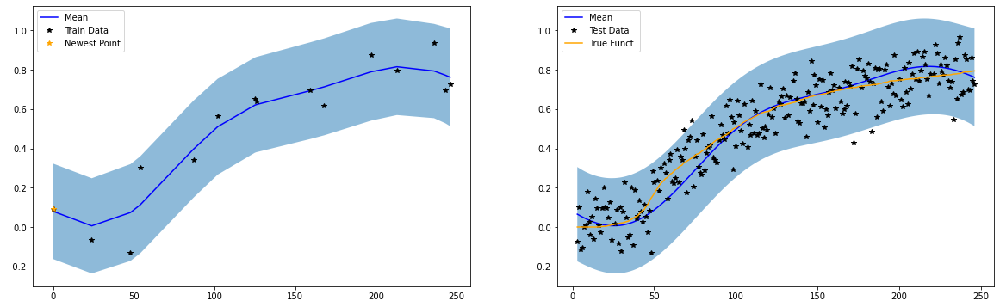

Train RMSE: 0.08951999992132187, Test RMSE: 0.10606999695301056, Noise: 0.01147

####################################################

BEFORE TRAINING
18 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


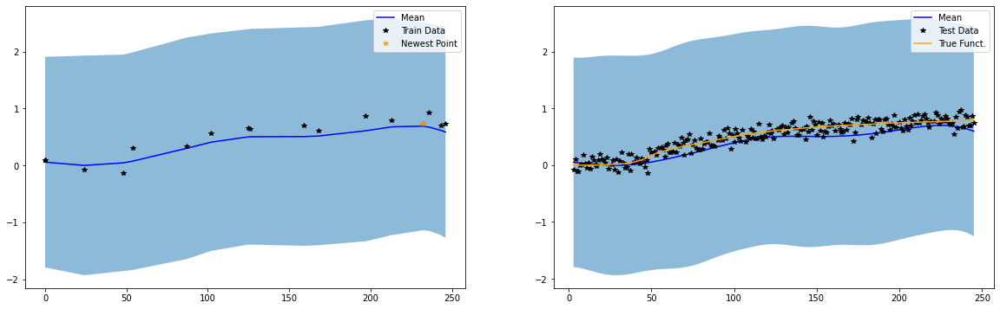

Iter 0/500 - Loss: 1.034   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.316   lengthscale: 30.739   noise: 0.010
Iter 100/500 - Loss: -0.360   lengthscale: 36.441   noise: 0.011
Iter 150/500 - Loss: -0.383   lengthscale: 40.661   noise: 0.011
Iter 200/500 - Loss: -0.396   lengthscale: 44.034   noise: 0.011
Iter 250/500 - Loss: -0.404   lengthscale: 46.716   noise: 0.011
Iter 300/500 - Loss: -0.408   lengthscale: 48.814   noise: 0.011
Iter 350/500 - Loss: -0.410   lengthscale: 50.433   noise: 0.011
Iter 400/500 - Loss: -0.412   lengthscale: 51.676   noise: 0.011
Iter 450/500 - Loss: -0.412   lengthscale: 52.627   noise: 0.011
Iter 500/500 - Loss: -0.413   lengthscale: 53.354   noise: 0.011


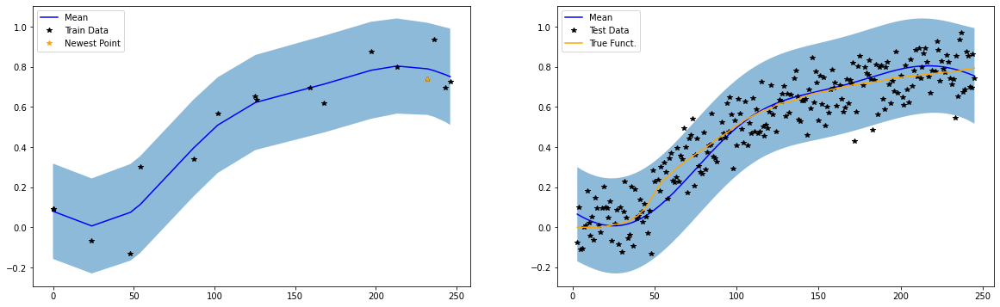

Train RMSE: 0.0887100026011467, Test RMSE: 0.10582999885082245, Noise: 0.01101

####################################################

BEFORE TRAINING
19 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


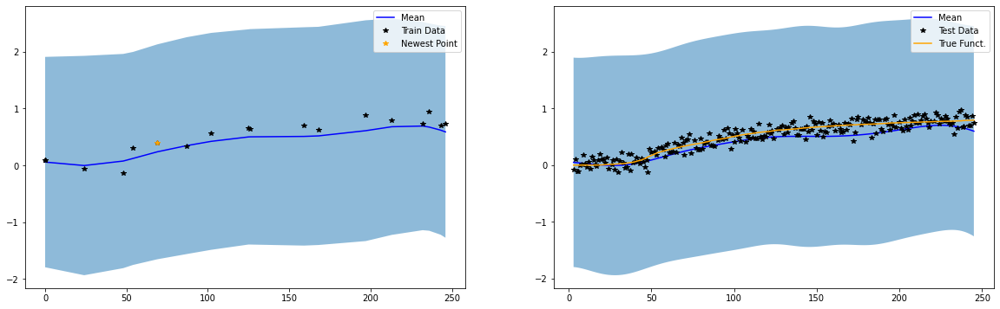

Iter 0/500 - Loss: 1.028   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.326   lengthscale: 30.650   noise: 0.010
Iter 100/500 - Loss: -0.361   lengthscale: 36.051   noise: 0.011
Iter 150/500 - Loss: -0.380   lengthscale: 40.206   noise: 0.011
Iter 200/500 - Loss: -0.391   lengthscale: 43.602   noise: 0.012
Iter 250/500 - Loss: -0.398   lengthscale: 46.329   noise: 0.012
Iter 300/500 - Loss: -0.402   lengthscale: 48.456   noise: 0.012
Iter 350/500 - Loss: -0.404   lengthscale: 50.085   noise: 0.012
Iter 400/500 - Loss: -0.405   lengthscale: 51.323   noise: 0.012
Iter 450/500 - Loss: -0.406   lengthscale: 52.261   noise: 0.012
Iter 500/500 - Loss: -0.406   lengthscale: 52.971   noise: 0.012


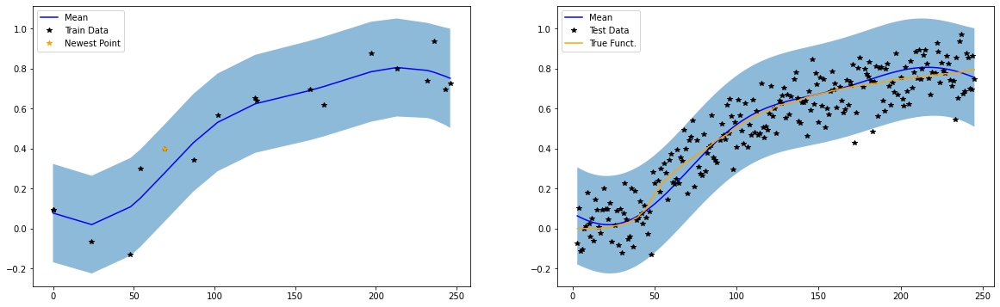

Train RMSE: 0.092739999294281, Test RMSE: 0.10121999680995941, Noise: 0.01178

####################################################

BEFORE TRAINING
20 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


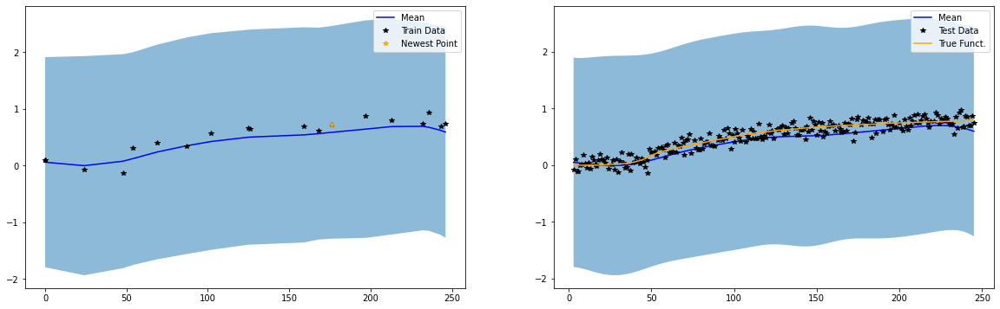

Iter 0/500 - Loss: 1.022   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.366   lengthscale: 30.640   noise: 0.010
Iter 100/500 - Loss: -0.401   lengthscale: 36.032   noise: 0.011
Iter 150/500 - Loss: -0.419   lengthscale: 40.161   noise: 0.011
Iter 200/500 - Loss: -0.430   lengthscale: 43.532   noise: 0.011
Iter 250/500 - Loss: -0.437   lengthscale: 46.240   noise: 0.011
Iter 300/500 - Loss: -0.441   lengthscale: 48.348   noise: 0.011
Iter 350/500 - Loss: -0.442   lengthscale: 49.950   noise: 0.011
Iter 400/500 - Loss: -0.443   lengthscale: 51.150   noise: 0.011
Iter 450/500 - Loss: -0.444   lengthscale: 52.040   noise: 0.011
Iter 500/500 - Loss: -0.444   lengthscale: 52.697   noise: 0.011


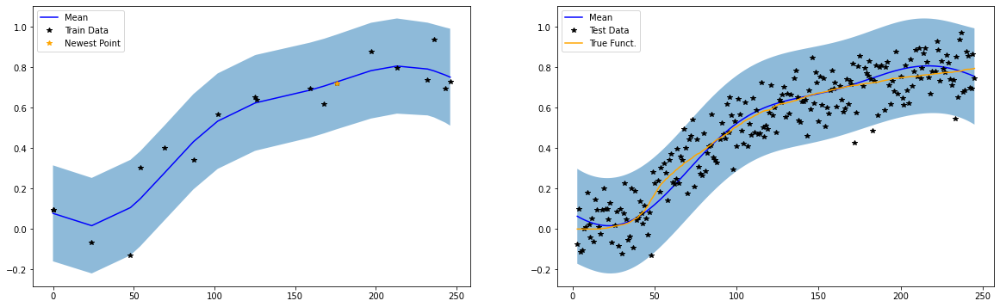

Train RMSE: 0.08997000008821487, Test RMSE: 0.10110999643802643, Noise: 0.01096



In [65]:
final_train_rmses, final_test_rmses, noise_estimates, final_true_test_rmses = train(m2_pa2_cont8, m2_pa2_cont8_noisy, 20, True)

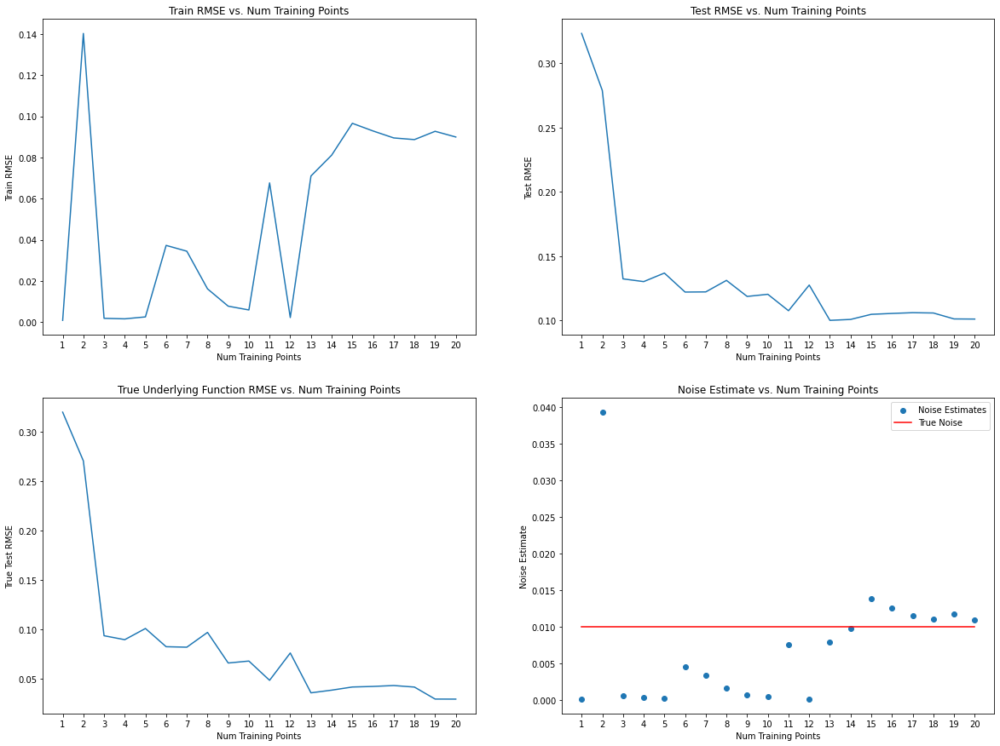

In [66]:
plot_rmses_and_noise(final_train_rmses, final_test_rmses, final_true_test_rmses, noise_estimates, 20)

## Muscle 0, contact 3, pulse amplitude 1.0

####################################################

BEFORE TRAINING
1 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


/var/folders/c0/0rqzqv5n0bg36m4j1jc_zv3w0000gn/T/ipykernel_9540/3709150696.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k*" (-> color='k'). The keyword argument will take precedence.
  ax[0].plot(newest_point[0], newest_point[1], 'k*', color = 'orange', label = 'Newest Point')


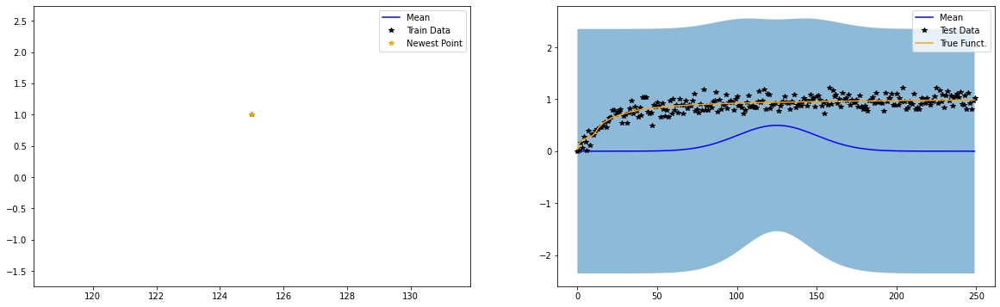

Iter 0/500 - Loss: 1.441   lengthscale: 25.000   noise: 0.644
Iter 50/500 - Loss: -1.408   lengthscale: 25.000   noise: 0.004
Iter 100/500 - Loss: -3.306   lengthscale: 25.000   noise: 0.000
Iter 150/500 - Loss: -3.612   lengthscale: 25.000   noise: 0.000
Iter 200/500 - Loss: -3.557   lengthscale: 25.000   noise: 0.000
Iter 250/500 - Loss: -3.632   lengthscale: 25.000   noise: 0.000
Iter 300/500 - Loss: -3.621   lengthscale: 25.000   noise: 0.000
Iter 350/500 - Loss: -3.675   lengthscale: 25.000   noise: 0.000
Iter 400/500 - Loss: -3.669   lengthscale: 25.000   noise: 0.000
Iter 450/500 - Loss: -3.640   lengthscale: 25.000   noise: 0.000
Iter 500/500 - Loss: -3.677   lengthscale: 25.000   noise: 0.000


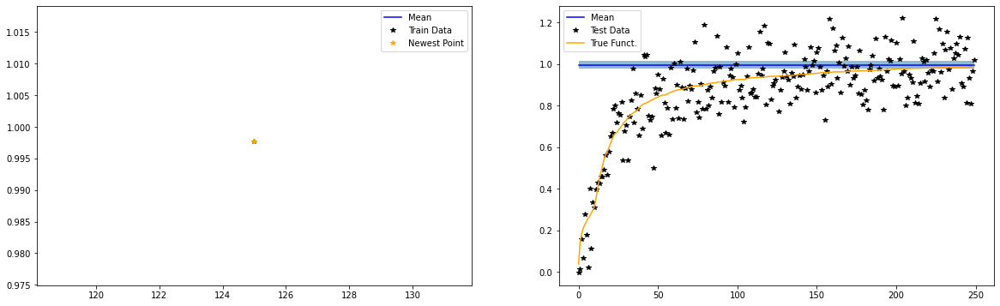

Train RMSE: 0.0006200000061653554, Test RMSE: 0.2502500116825104, Noise: 0.0001

####################################################

BEFORE TRAINING
2 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


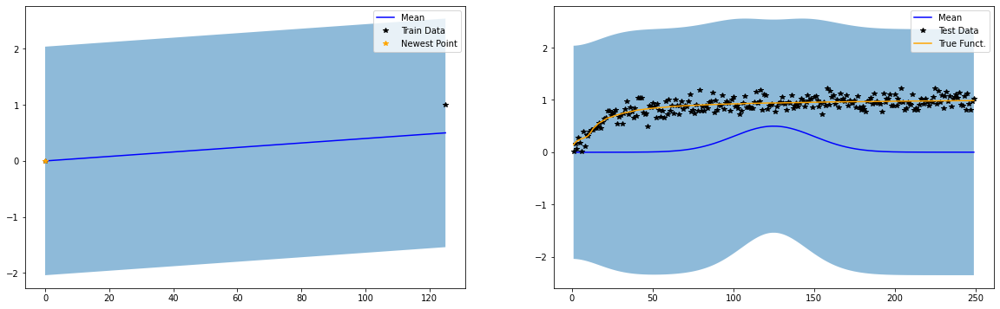

Iter 0/500 - Loss: 1.262   lengthscale: 24.978   noise: 0.644
Iter 50/500 - Loss: 0.731   lengthscale: 21.302   noise: 0.138
Iter 100/500 - Loss: 0.728   lengthscale: 20.705   noise: 0.125
Iter 150/500 - Loss: 0.728   lengthscale: 20.418   noise: 0.126
Iter 200/500 - Loss: 0.728   lengthscale: 20.203   noise: 0.126
Iter 250/500 - Loss: 0.728   lengthscale: 20.033   noise: 0.126
Iter 300/500 - Loss: 0.728   lengthscale: 19.893   noise: 0.126
Iter 350/500 - Loss: 0.728   lengthscale: 19.774   noise: 0.126
Iter 400/500 - Loss: 0.728   lengthscale: 19.671   noise: 0.126
Iter 450/500 - Loss: 0.728   lengthscale: 19.580   noise: 0.126
Iter 500/500 - Loss: 0.728   lengthscale: 19.500   noise: 0.126


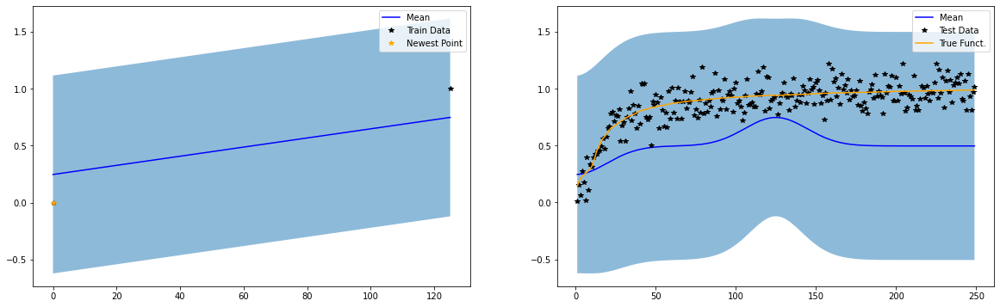

Train RMSE: 0.2505800127983093, Test RMSE: 0.3917500078678131, Noise: 0.12553

####################################################

BEFORE TRAINING
3 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


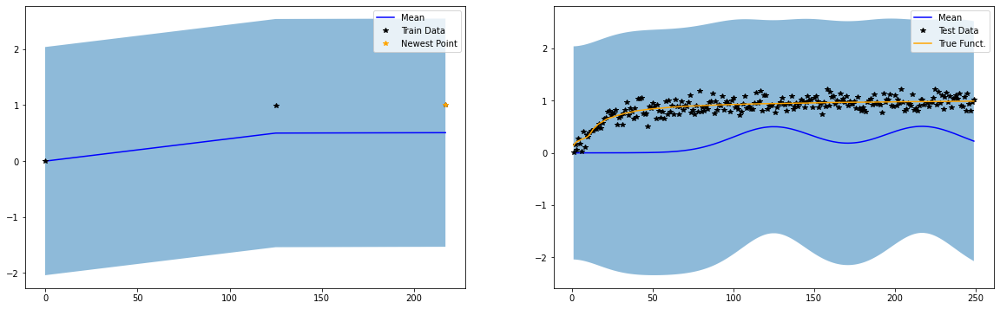

Iter 0/500 - Loss: 1.325   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.679   lengthscale: 30.308   noise: 0.125
Iter 100/500 - Loss: 0.672   lengthscale: 37.923   noise: 0.104
Iter 150/500 - Loss: 0.666   lengthscale: 45.650   noise: 0.079
Iter 200/500 - Loss: 0.658   lengthscale: 52.427   noise: 0.043
Iter 250/500 - Loss: 0.652   lengthscale: 58.051   noise: 0.022
Iter 300/500 - Loss: 0.648   lengthscale: 62.212   noise: 0.013
Iter 350/500 - Loss: 0.646   lengthscale: 64.894   noise: 0.008
Iter 400/500 - Loss: 0.646   lengthscale: 66.408   noise: 0.006
Iter 450/500 - Loss: 0.645   lengthscale: 67.173   noise: 0.005
Iter 500/500 - Loss: 0.645   lengthscale: 67.535   noise: 0.004


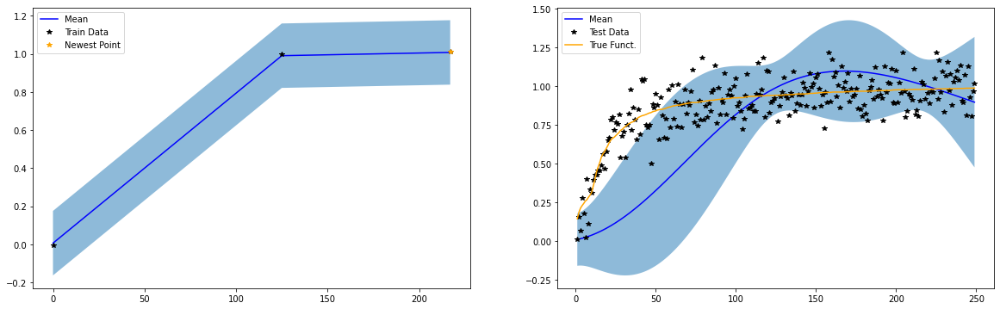

Train RMSE: 0.007670000195503235, Test RMSE: 0.29385998845100403, Noise: 0.00361

####################################################

BEFORE TRAINING
4 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


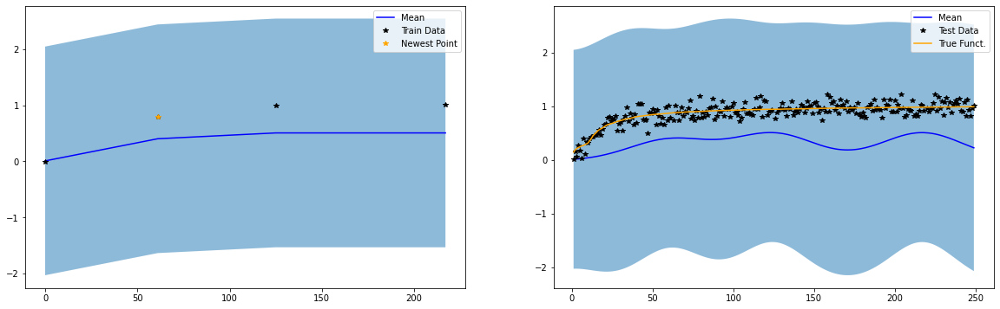

Iter 0/500 - Loss: 1.317   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.544   lengthscale: 24.299   noise: 0.098
Iter 100/500 - Loss: 0.540   lengthscale: 20.312   noise: 0.090
Iter 150/500 - Loss: 0.540   lengthscale: 17.977   noise: 0.091
Iter 200/500 - Loss: 0.540   lengthscale: 16.719   noise: 0.092
Iter 250/500 - Loss: 0.540   lengthscale: 15.940   noise: 0.092
Iter 300/500 - Loss: 0.540   lengthscale: 15.400   noise: 0.092
Iter 350/500 - Loss: 0.540   lengthscale: 14.996   noise: 0.092
Iter 400/500 - Loss: 0.540   lengthscale: 14.678   noise: 0.092
Iter 450/500 - Loss: 0.540   lengthscale: 14.419   noise: 0.092
Iter 500/500 - Loss: 0.540   lengthscale: 14.202   noise: 0.092


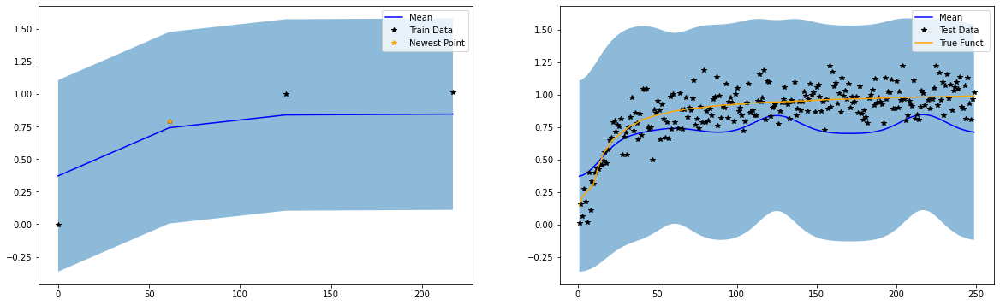

Train RMSE: 0.2216300070285797, Test RMSE: 0.21469999849796295, Noise: 0.09202

####################################################

BEFORE TRAINING
5 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


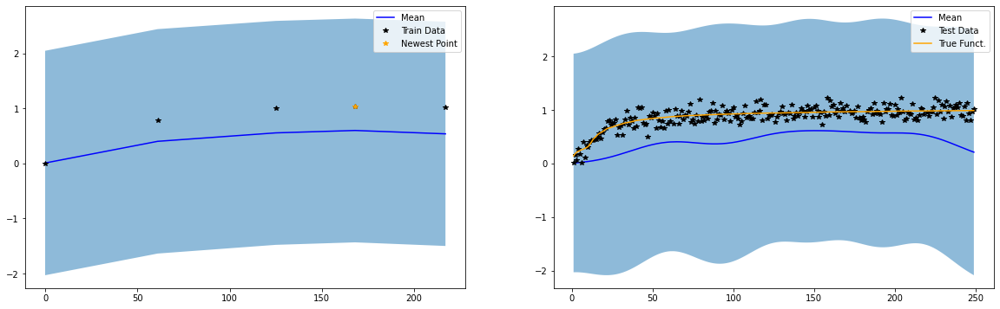

Iter 0/500 - Loss: 1.321   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.458   lengthscale: 29.852   noise: 0.059
Iter 100/500 - Loss: 0.415   lengthscale: 35.941   noise: 0.020
Iter 150/500 - Loss: 0.371   lengthscale: 42.577   noise: 0.007
Iter 200/500 - Loss: 0.335   lengthscale: 48.776   noise: 0.003
Iter 250/500 - Loss: 0.309   lengthscale: 54.046   noise: 0.001
Iter 300/500 - Loss: 0.293   lengthscale: 58.299   noise: 0.001
Iter 350/500 - Loss: 0.284   lengthscale: 61.633   noise: 0.001
Iter 400/500 - Loss: 0.279   lengthscale: 64.194   noise: 0.000
Iter 450/500 - Loss: 0.276   lengthscale: 66.126   noise: 0.000
Iter 500/500 - Loss: 0.274   lengthscale: 67.555   noise: 0.000


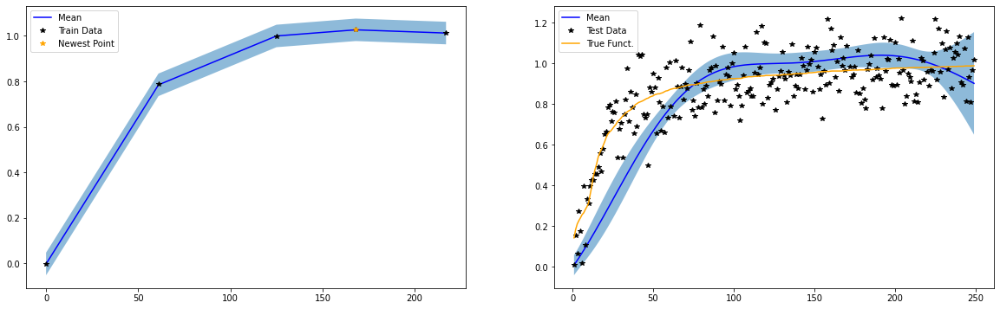

Train RMSE: 0.0016499999910593033, Test RMSE: 0.17510999739170074, Noise: 0.00031

####################################################

BEFORE TRAINING
6 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


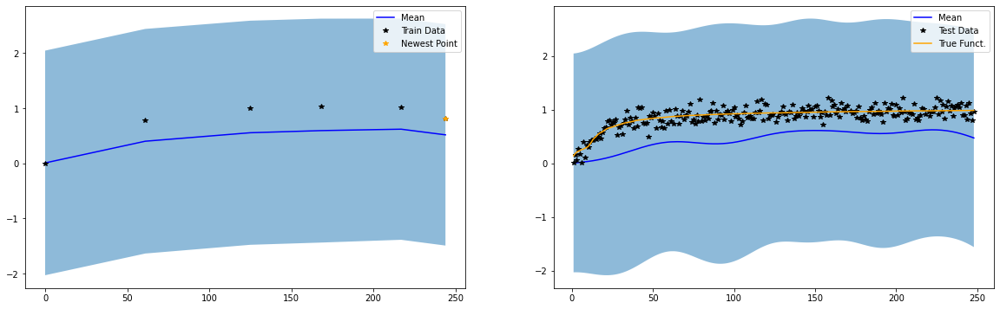

Iter 0/500 - Loss: 1.293   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.343   lengthscale: 29.943   noise: 0.039
Iter 100/500 - Loss: 0.270   lengthscale: 36.516   noise: 0.009
Iter 150/500 - Loss: 0.206   lengthscale: 43.234   noise: 0.003
Iter 200/500 - Loss: 0.159   lengthscale: 49.204   noise: 0.001
Iter 250/500 - Loss: 0.128   lengthscale: 54.165   noise: 0.001
Iter 300/500 - Loss: 0.109   lengthscale: 58.065   noise: 0.000
Iter 350/500 - Loss: 0.099   lengthscale: 60.973   noise: 0.000
Iter 400/500 - Loss: 0.094   lengthscale: 63.035   noise: 0.000
Iter 450/500 - Loss: 0.092   lengthscale: 64.425   noise: 0.000
Iter 500/500 - Loss: 0.091   lengthscale: 65.317   noise: 0.000


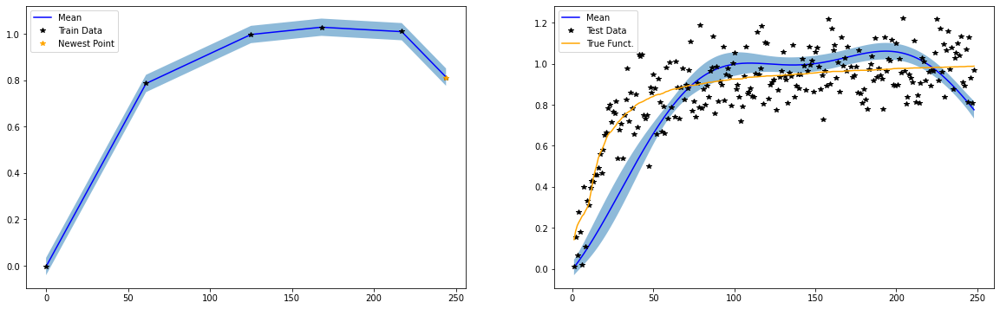

Train RMSE: 0.0014299999456852674, Test RMSE: 0.185479998588562, Noise: 0.00018

####################################################

BEFORE TRAINING
7 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


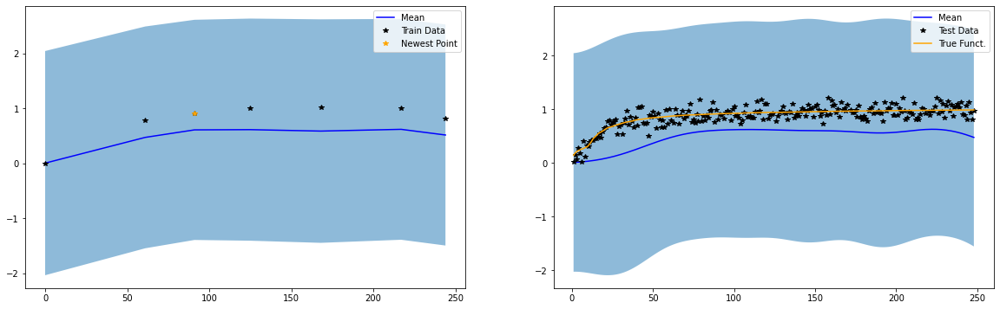

Iter 0/500 - Loss: 1.273   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.234   lengthscale: 30.086   noise: 0.026
Iter 100/500 - Loss: 0.097   lengthscale: 37.112   noise: 0.004
Iter 150/500 - Loss: 0.022   lengthscale: 43.166   noise: 0.001
Iter 200/500 - Loss: -0.012   lengthscale: 47.719   noise: 0.001
Iter 250/500 - Loss: -0.038   lengthscale: 51.683   noise: 0.001
Iter 300/500 - Loss: -0.065   lengthscale: 55.917   noise: 0.002
Iter 350/500 - Loss: -0.088   lengthscale: 59.944   noise: 0.002
Iter 400/500 - Loss: -0.105   lengthscale: 63.520   noise: 0.001
Iter 450/500 - Loss: -0.118   lengthscale: 66.598   noise: 0.001
Iter 500/500 - Loss: -0.126   lengthscale: 69.193   noise: 0.001


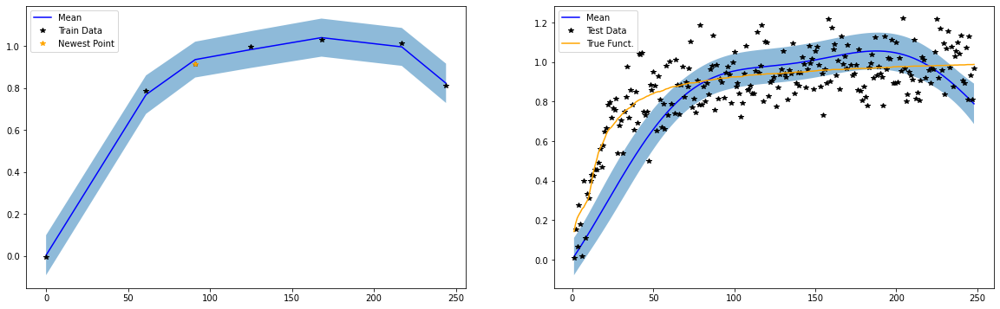

Train RMSE: 0.015169999562203884, Test RMSE: 0.17696000635623932, Noise: 0.00114

####################################################

BEFORE TRAINING
8 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


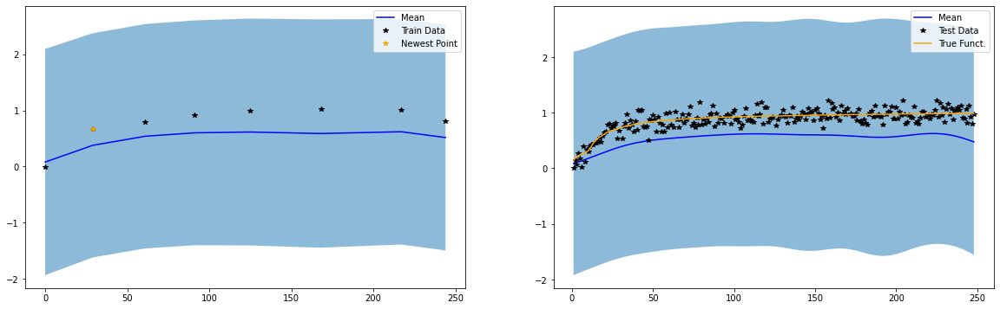

Iter 0/500 - Loss: 1.256   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.218   lengthscale: 29.458   noise: 0.036
Iter 100/500 - Loss: 0.200   lengthscale: 34.197   noise: 0.028
Iter 150/500 - Loss: 0.188   lengthscale: 38.810   noise: 0.028
Iter 200/500 - Loss: 0.177   lengthscale: 43.088   noise: 0.027
Iter 250/500 - Loss: 0.169   lengthscale: 47.008   noise: 0.026
Iter 300/500 - Loss: 0.163   lengthscale: 50.547   noise: 0.026
Iter 350/500 - Loss: 0.158   lengthscale: 53.687   noise: 0.025
Iter 400/500 - Loss: 0.155   lengthscale: 56.442   noise: 0.025
Iter 450/500 - Loss: 0.152   lengthscale: 58.856   noise: 0.025
Iter 500/500 - Loss: 0.150   lengthscale: 60.986   noise: 0.025


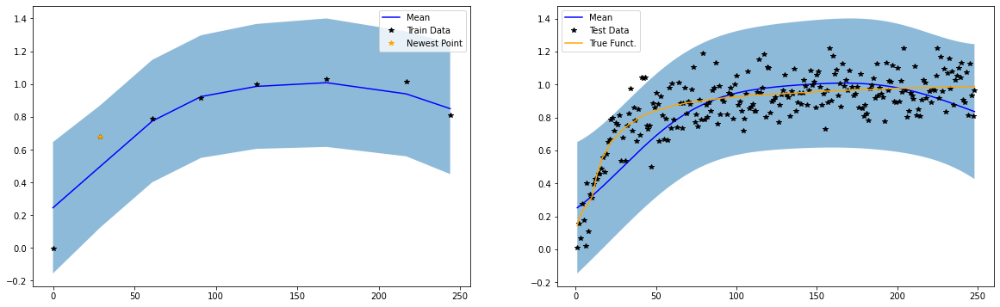

Train RMSE: 0.11296000331640244, Test RMSE: 0.14733000099658966, Noise: 0.02485

####################################################

BEFORE TRAINING
9 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


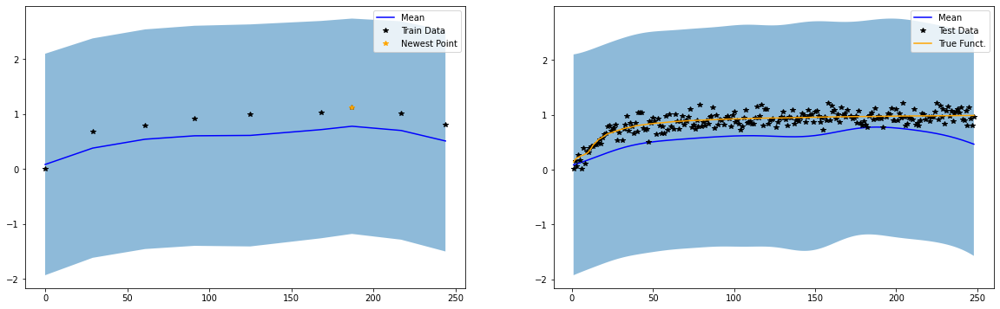

Iter 0/500 - Loss: 1.241   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.147   lengthscale: 29.562   noise: 0.024
Iter 100/500 - Loss: 0.110   lengthscale: 34.084   noise: 0.009
Iter 150/500 - Loss: 0.105   lengthscale: 36.570   noise: 0.008
Iter 200/500 - Loss: 0.103   lengthscale: 38.441   noise: 0.009
Iter 250/500 - Loss: 0.095   lengthscale: 41.725   noise: 0.013
Iter 300/500 - Loss: 0.085   lengthscale: 46.270   noise: 0.015
Iter 350/500 - Loss: 0.076   lengthscale: 50.693   noise: 0.015
Iter 400/500 - Loss: 0.070   lengthscale: 54.425   noise: 0.015
Iter 450/500 - Loss: 0.066   lengthscale: 57.342   noise: 0.014
Iter 500/500 - Loss: 0.064   lengthscale: 59.520   noise: 0.014


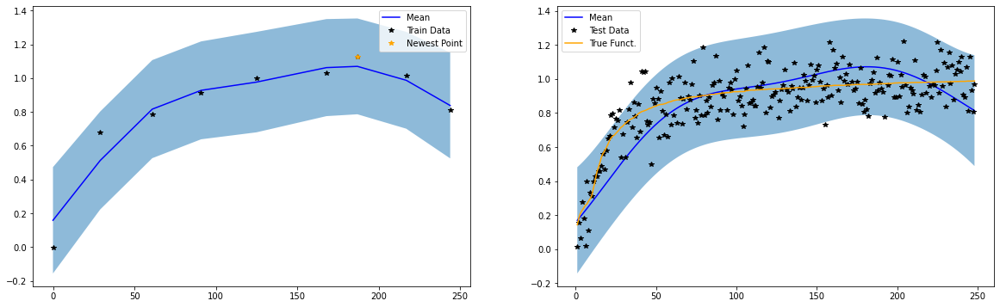

Train RMSE: 0.08206000179052353, Test RMSE: 0.14760999381542206, Noise: 0.01424

####################################################

BEFORE TRAINING
10 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


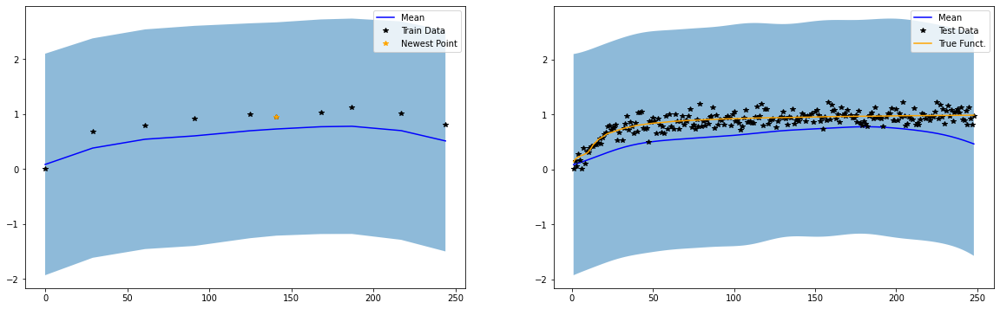

Iter 0/500 - Loss: 1.218   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.056   lengthscale: 29.579   noise: 0.018
Iter 100/500 - Loss: -0.051   lengthscale: 33.680   noise: 0.003
Iter 150/500 - Loss: -0.125   lengthscale: 35.858   noise: 0.001
Iter 200/500 - Loss: -0.158   lengthscale: 37.870   noise: 0.000
Iter 250/500 - Loss: -0.168   lengthscale: 38.489   noise: 0.000
Iter 300/500 - Loss: -0.172   lengthscale: 38.693   noise: 0.000
Iter 350/500 - Loss: -0.174   lengthscale: 38.786   noise: 0.000
Iter 400/500 - Loss: -0.175   lengthscale: 38.837   noise: 0.000
Iter 450/500 - Loss: -0.176   lengthscale: 38.869   noise: 0.000
Iter 500/500 - Loss: -0.176   lengthscale: 38.891   noise: 0.000


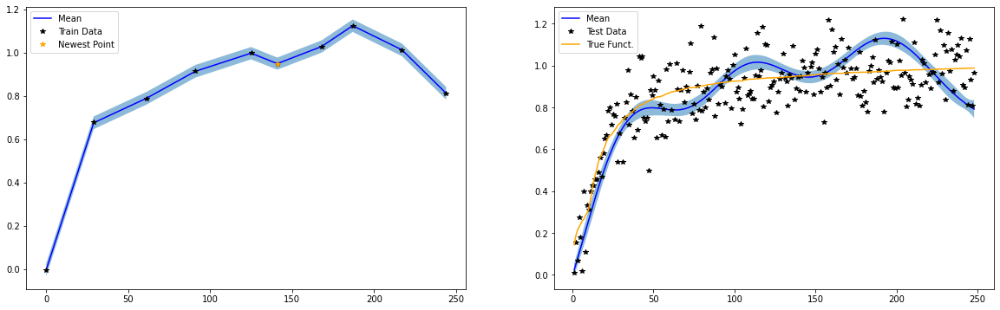

Train RMSE: 0.0008999999845400453, Test RMSE: 0.1412999927997589, Noise: 0.00011

####################################################

BEFORE TRAINING
11 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


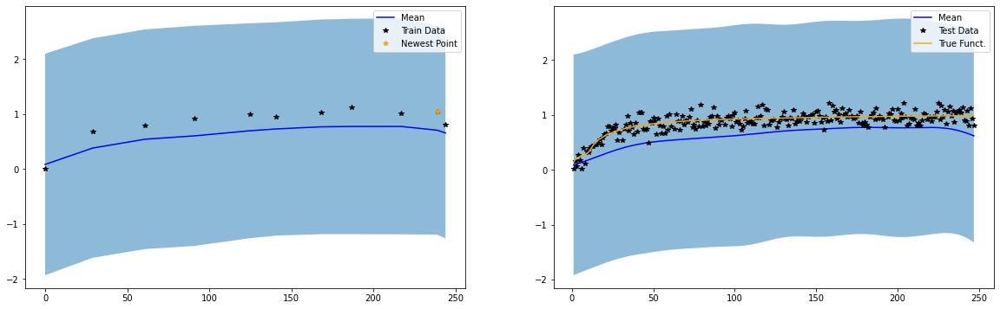

Iter 0/500 - Loss: 1.201   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.031   lengthscale: 29.655   noise: 0.019
Iter 100/500 - Loss: -0.001   lengthscale: 34.395   noise: 0.011
Iter 150/500 - Loss: -0.013   lengthscale: 38.433   noise: 0.013
Iter 200/500 - Loss: -0.024   lengthscale: 42.538   noise: 0.013
Iter 250/500 - Loss: -0.035   lengthscale: 46.636   noise: 0.014
Iter 300/500 - Loss: -0.044   lengthscale: 50.495   noise: 0.014
Iter 350/500 - Loss: -0.051   lengthscale: 53.938   noise: 0.014
Iter 400/500 - Loss: -0.056   lengthscale: 56.873   noise: 0.013
Iter 450/500 - Loss: -0.059   lengthscale: 59.287   noise: 0.013
Iter 500/500 - Loss: -0.061   lengthscale: 61.220   noise: 0.013


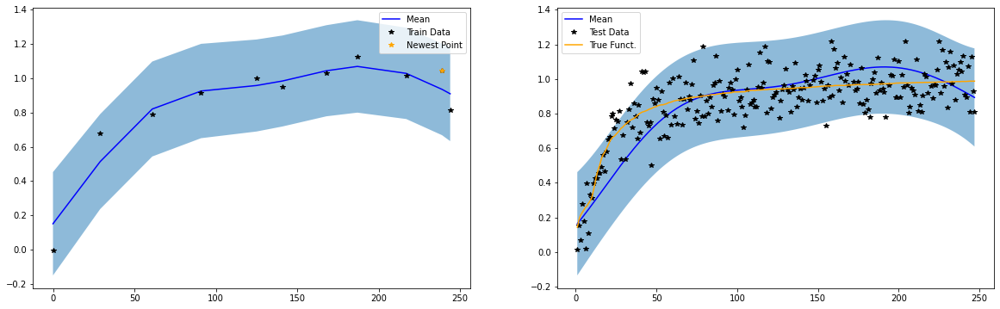

Train RMSE: 0.08517000079154968, Test RMSE: 0.14316000044345856, Noise: 0.01298

####################################################

BEFORE TRAINING
12 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


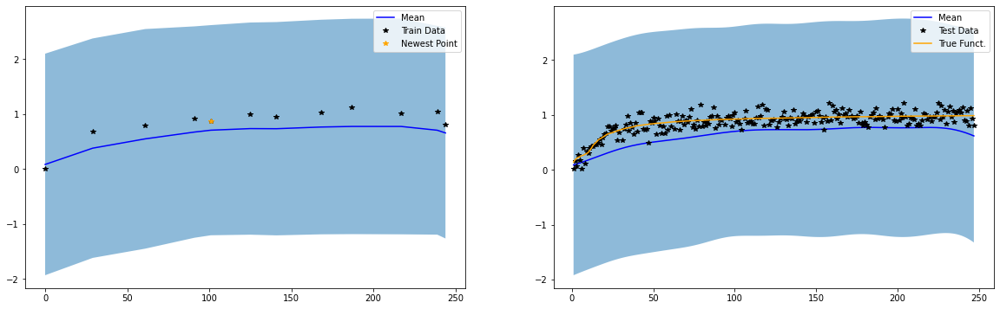

Iter 0/500 - Loss: 1.181   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.042   lengthscale: 29.681   noise: 0.016
Iter 100/500 - Loss: -0.085   lengthscale: 34.764   noise: 0.009
Iter 150/500 - Loss: -0.097   lengthscale: 38.779   noise: 0.010
Iter 200/500 - Loss: -0.107   lengthscale: 42.484   noise: 0.010
Iter 250/500 - Loss: -0.116   lengthscale: 46.124   noise: 0.011
Iter 300/500 - Loss: -0.124   lengthscale: 49.628   noise: 0.011
Iter 350/500 - Loss: -0.130   lengthscale: 52.868   noise: 0.011
Iter 400/500 - Loss: -0.134   lengthscale: 55.740   noise: 0.011
Iter 450/500 - Loss: -0.138   lengthscale: 58.187   noise: 0.011
Iter 500/500 - Loss: -0.140   lengthscale: 60.202   noise: 0.010


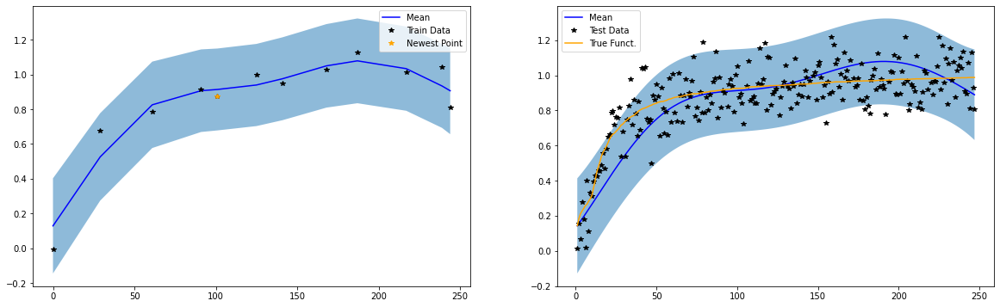

Train RMSE: 0.07734999805688858, Test RMSE: 0.14203999936580658, Noise: 0.01049

####################################################

BEFORE TRAINING
13 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


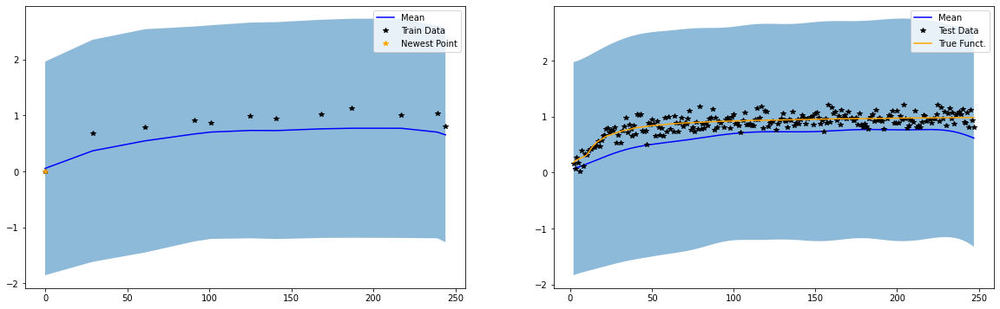

Iter 0/500 - Loss: 1.162   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.113   lengthscale: 29.556   noise: 0.010
Iter 100/500 - Loss: -0.152   lengthscale: 34.502   noise: 0.007
Iter 150/500 - Loss: -0.159   lengthscale: 37.774   noise: 0.007
Iter 200/500 - Loss: -0.163   lengthscale: 40.317   noise: 0.007
Iter 250/500 - Loss: -0.166   lengthscale: 42.693   noise: 0.007
Iter 300/500 - Loss: -0.169   lengthscale: 45.203   noise: 0.007
Iter 350/500 - Loss: -0.172   lengthscale: 47.958   noise: 0.008
Iter 400/500 - Loss: -0.176   lengthscale: 50.914   noise: 0.008
Iter 450/500 - Loss: -0.180   lengthscale: 53.940   noise: 0.008
Iter 500/500 - Loss: -0.183   lengthscale: 56.860   noise: 0.008


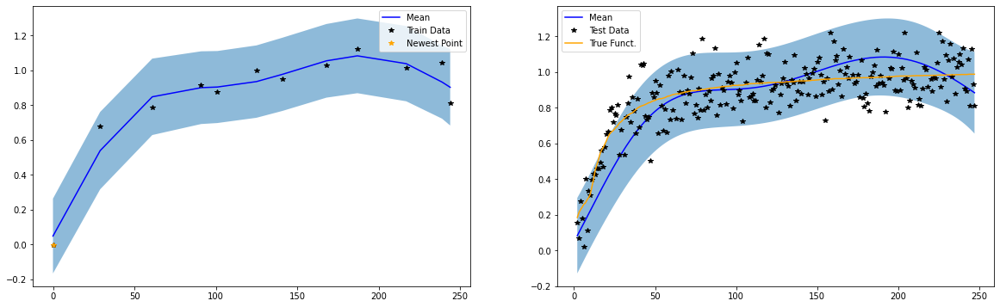

Train RMSE: 0.06655000150203705, Test RMSE: 0.14222000539302826, Noise: 0.00792

####################################################

BEFORE TRAINING
14 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


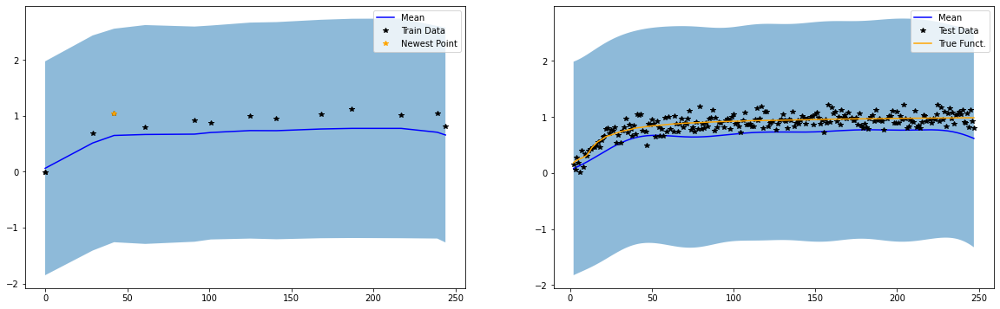

Iter 0/500 - Loss: 1.156   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.054   lengthscale: 27.589   noise: 0.011
Iter 100/500 - Loss: -0.062   lengthscale: 27.407   noise: 0.010
Iter 150/500 - Loss: -0.062   lengthscale: 27.329   noise: 0.009
Iter 200/500 - Loss: -0.062   lengthscale: 27.325   noise: 0.009
Iter 250/500 - Loss: -0.062   lengthscale: 27.325   noise: 0.009
Iter 300/500 - Loss: -0.062   lengthscale: 27.325   noise: 0.009
Iter 350/500 - Loss: -0.062   lengthscale: 27.325   noise: 0.009
Iter 400/500 - Loss: -0.062   lengthscale: 27.325   noise: 0.009
Iter 450/500 - Loss: -0.062   lengthscale: 27.325   noise: 0.009
Iter 500/500 - Loss: -0.062   lengthscale: 27.325   noise: 0.009


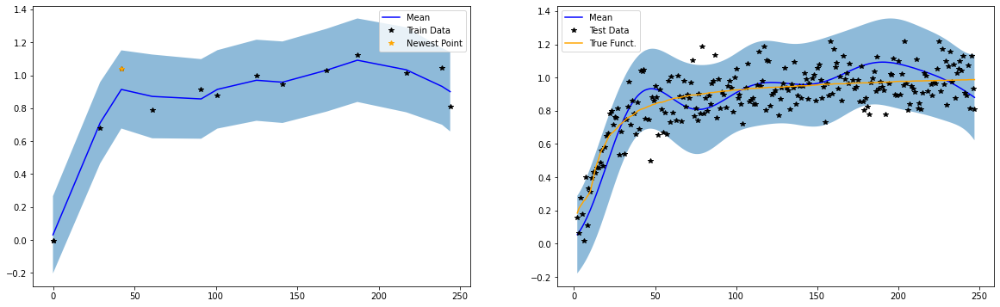

Train RMSE: 0.06174999848008156, Test RMSE: 0.13473999500274658, Noise: 0.00936

####################################################

BEFORE TRAINING
15 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


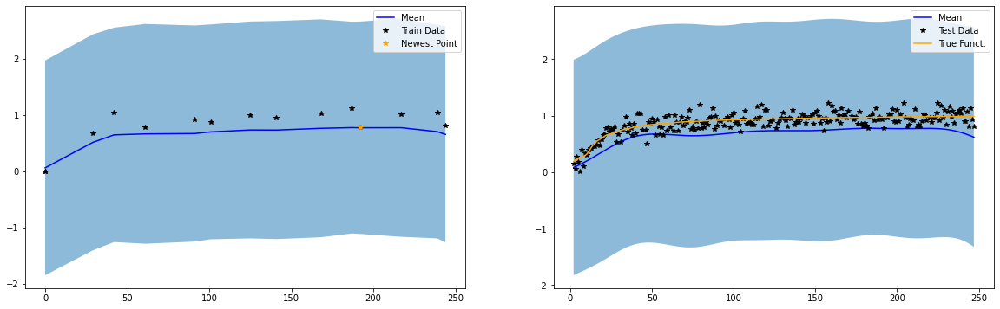

Iter 0/500 - Loss: 1.139   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.019   lengthscale: 27.274   noise: 0.015
Iter 100/500 - Loss: 0.016   lengthscale: 26.709   noise: 0.017
Iter 150/500 - Loss: 0.016   lengthscale: 26.405   noise: 0.017
Iter 200/500 - Loss: 0.016   lengthscale: 26.364   noise: 0.017
Iter 250/500 - Loss: 0.016   lengthscale: 26.363   noise: 0.017
Iter 300/500 - Loss: 0.016   lengthscale: 26.363   noise: 0.017
Iter 350/500 - Loss: 0.016   lengthscale: 26.363   noise: 0.017
Iter 400/500 - Loss: 0.016   lengthscale: 26.363   noise: 0.017
Iter 450/500 - Loss: 0.016   lengthscale: 26.363   noise: 0.017
Iter 500/500 - Loss: 0.016   lengthscale: 26.363   noise: 0.017


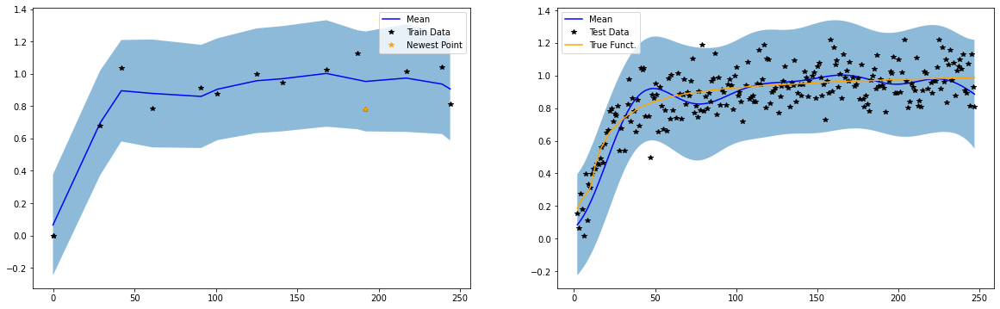

Train RMSE: 0.09053999930620193, Test RMSE: 0.12178999930620193, Noise: 0.01682

####################################################

BEFORE TRAINING
16 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


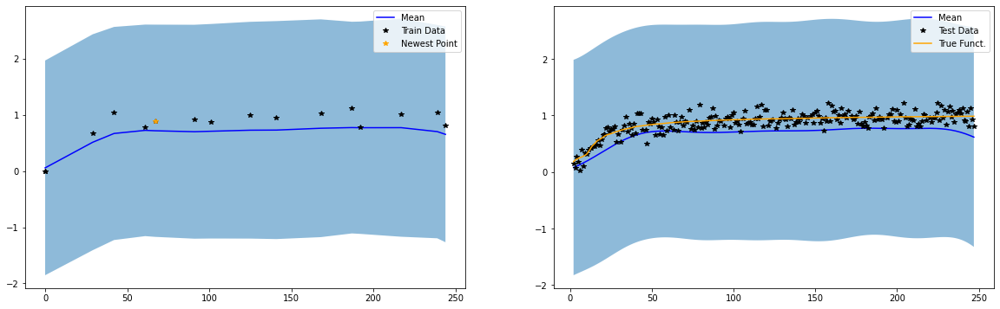

Iter 0/500 - Loss: 1.127   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.037   lengthscale: 27.540   noise: 0.014
Iter 100/500 - Loss: -0.039   lengthscale: 27.943   noise: 0.015
Iter 150/500 - Loss: -0.039   lengthscale: 27.946   noise: 0.015
Iter 200/500 - Loss: -0.039   lengthscale: 27.948   noise: 0.015
Iter 250/500 - Loss: -0.039   lengthscale: 27.948   noise: 0.015
Iter 300/500 - Loss: -0.039   lengthscale: 27.948   noise: 0.015
Iter 350/500 - Loss: -0.039   lengthscale: 27.948   noise: 0.015
Iter 400/500 - Loss: -0.039   lengthscale: 27.948   noise: 0.015
Iter 450/500 - Loss: -0.039   lengthscale: 27.948   noise: 0.015
Iter 500/500 - Loss: -0.039   lengthscale: 27.948   noise: 0.015


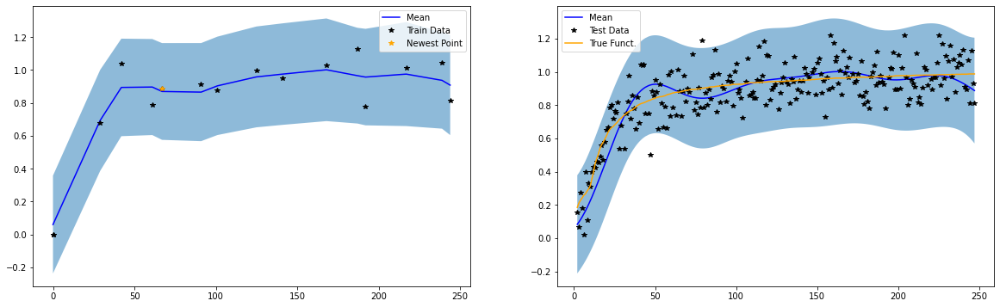

Train RMSE: 0.08882000297307968, Test RMSE: 0.12151999771595001, Noise: 0.01523

####################################################

BEFORE TRAINING
17 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


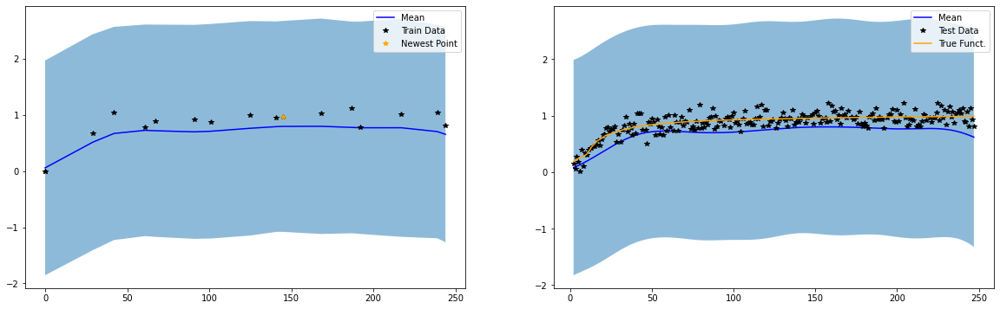

Iter 0/500 - Loss: 1.114   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.091   lengthscale: 27.655   noise: 0.013
Iter 100/500 - Loss: -0.093   lengthscale: 27.987   noise: 0.014
Iter 150/500 - Loss: -0.093   lengthscale: 27.986   noise: 0.014
Iter 200/500 - Loss: -0.093   lengthscale: 27.987   noise: 0.014
Iter 250/500 - Loss: -0.093   lengthscale: 27.987   noise: 0.014
Iter 300/500 - Loss: -0.093   lengthscale: 27.987   noise: 0.014
Iter 350/500 - Loss: -0.093   lengthscale: 27.987   noise: 0.014
Iter 400/500 - Loss: -0.093   lengthscale: 27.987   noise: 0.014
Iter 450/500 - Loss: -0.093   lengthscale: 27.987   noise: 0.014
Iter 500/500 - Loss: -0.093   lengthscale: 27.987   noise: 0.014


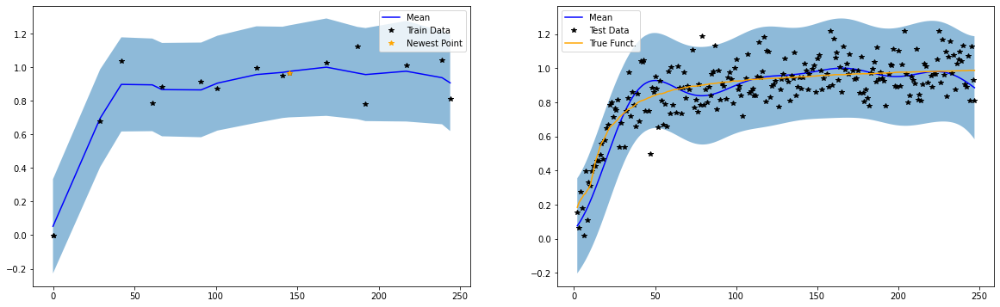

Train RMSE: 0.08495999872684479, Test RMSE: 0.12073999643325806, Noise: 0.01354

####################################################

BEFORE TRAINING
18 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


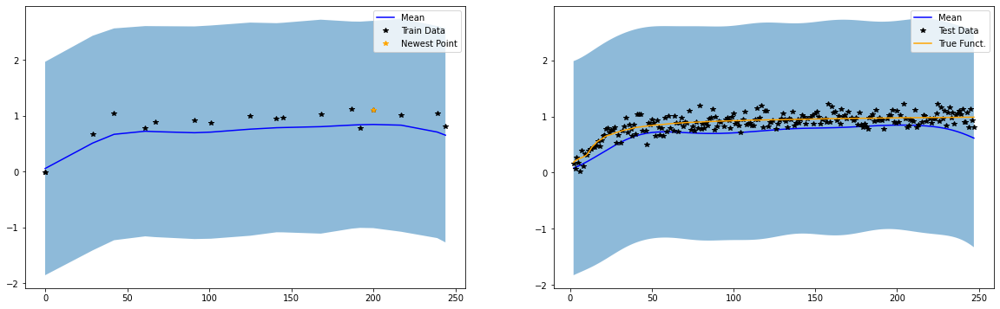

Iter 0/500 - Loss: 1.105   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.113   lengthscale: 28.065   noise: 0.013
Iter 100/500 - Loss: -0.116   lengthscale: 30.272   noise: 0.014
Iter 150/500 - Loss: -0.117   lengthscale: 30.959   noise: 0.014
Iter 200/500 - Loss: -0.117   lengthscale: 31.192   noise: 0.014
Iter 250/500 - Loss: -0.117   lengthscale: 31.255   noise: 0.014
Iter 300/500 - Loss: -0.117   lengthscale: 31.268   noise: 0.014
Iter 350/500 - Loss: -0.117   lengthscale: 31.270   noise: 0.014
Iter 400/500 - Loss: -0.117   lengthscale: 31.270   noise: 0.014
Iter 450/500 - Loss: -0.117   lengthscale: 31.270   noise: 0.014
Iter 500/500 - Loss: -0.117   lengthscale: 31.270   noise: 0.014


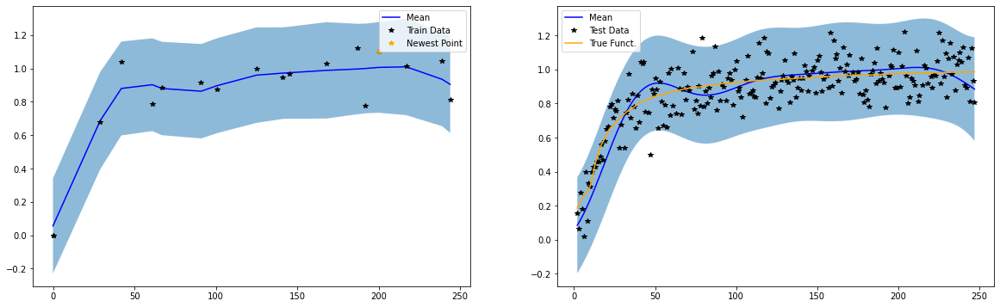

Train RMSE: 0.09018000215291977, Test RMSE: 0.12071999907493591, Noise: 0.01399

####################################################

BEFORE TRAINING
19 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


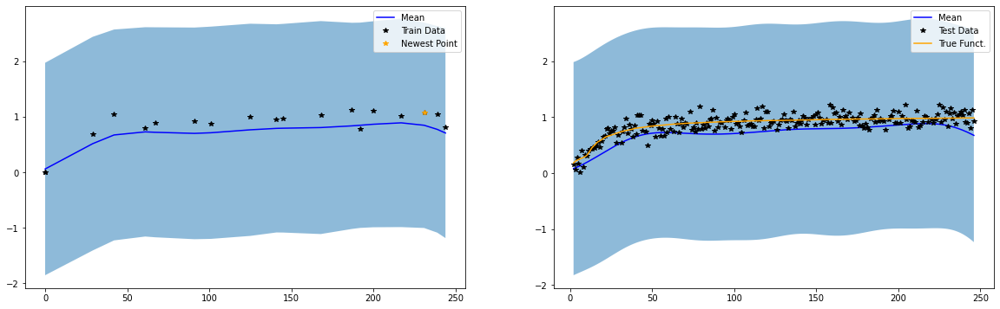

Iter 0/500 - Loss: 1.095   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.152   lengthscale: 28.047   noise: 0.012
Iter 100/500 - Loss: -0.155   lengthscale: 29.809   noise: 0.013
Iter 150/500 - Loss: -0.155   lengthscale: 30.218   noise: 0.013
Iter 200/500 - Loss: -0.155   lengthscale: 30.312   noise: 0.013
Iter 250/500 - Loss: -0.155   lengthscale: 30.325   noise: 0.013
Iter 300/500 - Loss: -0.155   lengthscale: 30.325   noise: 0.013
Iter 350/500 - Loss: -0.155   lengthscale: 30.325   noise: 0.013
Iter 400/500 - Loss: -0.155   lengthscale: 30.325   noise: 0.013
Iter 450/500 - Loss: -0.155   lengthscale: 30.325   noise: 0.013
Iter 500/500 - Loss: -0.155   lengthscale: 30.325   noise: 0.013


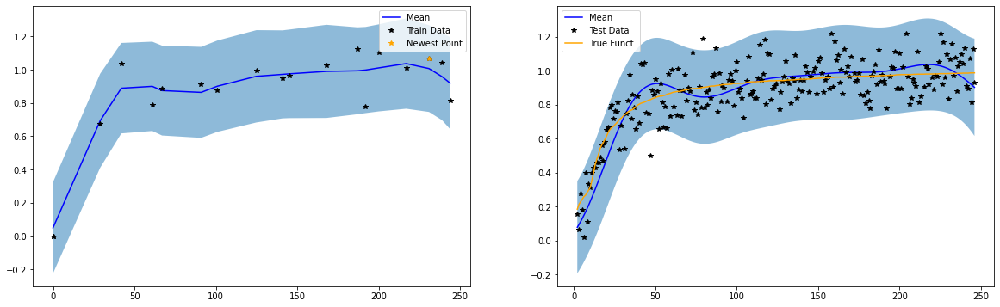

Train RMSE: 0.08703000098466873, Test RMSE: 0.12111999839544296, Noise: 0.0129

####################################################

BEFORE TRAINING
20 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


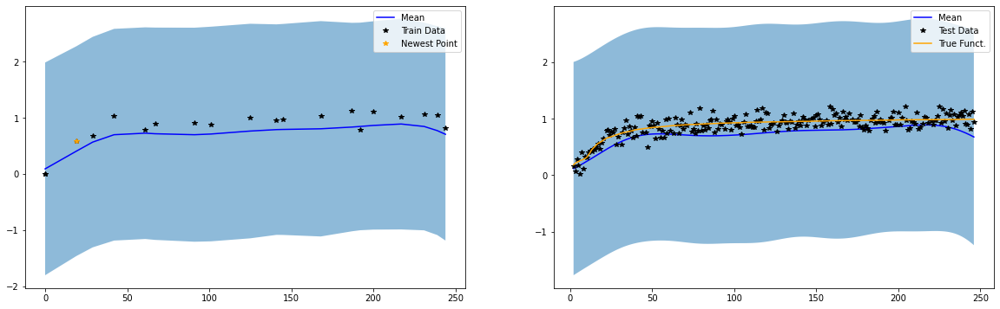

Iter 0/500 - Loss: 1.086   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.174   lengthscale: 28.079   noise: 0.012
Iter 100/500 - Loss: -0.179   lengthscale: 31.166   noise: 0.013
Iter 150/500 - Loss: -0.180   lengthscale: 32.161   noise: 0.013
Iter 200/500 - Loss: -0.180   lengthscale: 32.529   noise: 0.013
Iter 250/500 - Loss: -0.180   lengthscale: 32.650   noise: 0.013
Iter 300/500 - Loss: -0.180   lengthscale: 32.683   noise: 0.013
Iter 350/500 - Loss: -0.180   lengthscale: 32.690   noise: 0.013
Iter 400/500 - Loss: -0.180   lengthscale: 32.691   noise: 0.013
Iter 450/500 - Loss: -0.180   lengthscale: 32.691   noise: 0.013
Iter 500/500 - Loss: -0.180   lengthscale: 32.691   noise: 0.013


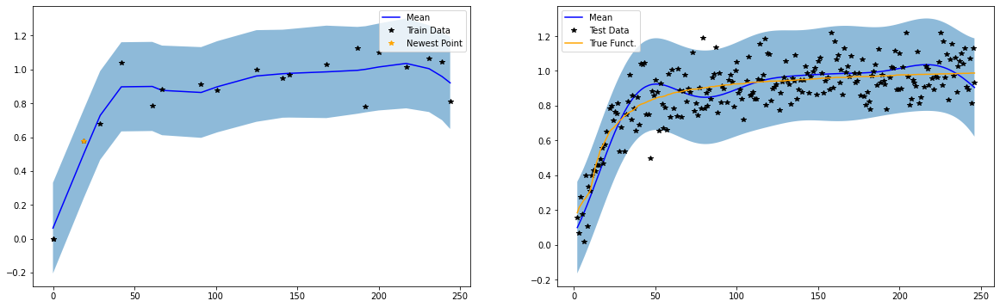

Train RMSE: 0.08765999972820282, Test RMSE: 0.11765000224113464, Noise: 0.01254



In [68]:
final_train_rmses, final_test_rmses, noise_estimates, final_true_test_rmses = train(m0_pa1_cont3, m0_pa1_cont3_noisy, 20, False)

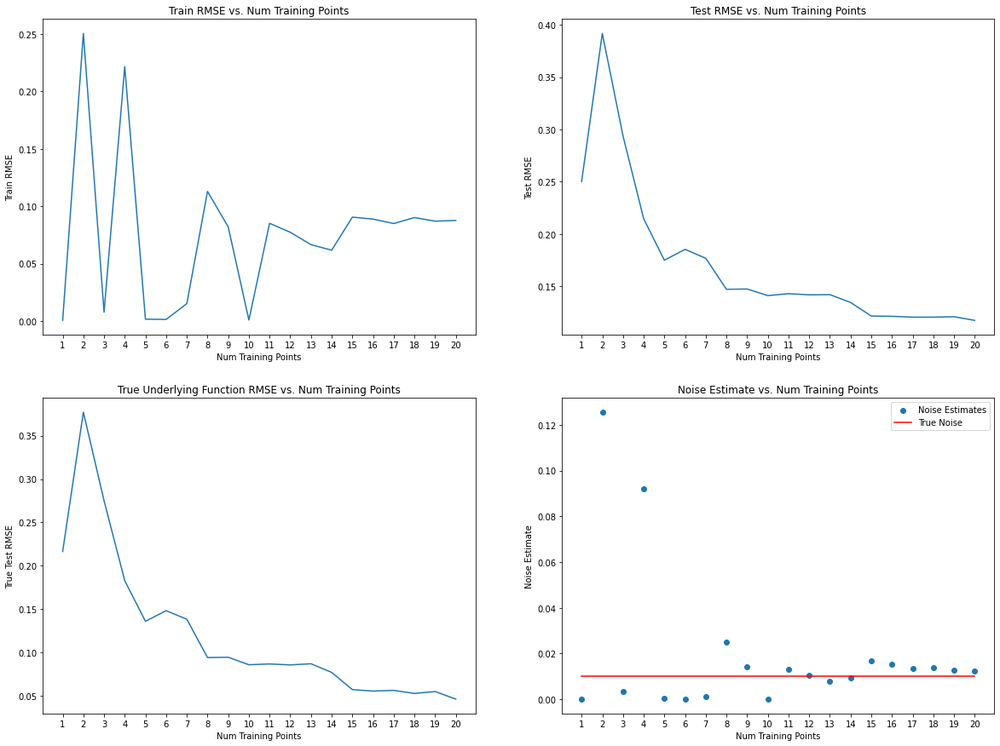

In [69]:
plot_rmses_and_noise(final_train_rmses, final_test_rmses, final_true_test_rmses, noise_estimates, 20)

####################################################

BEFORE TRAINING
1 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


/var/folders/c0/0rqzqv5n0bg36m4j1jc_zv3w0000gn/T/ipykernel_9540/3709150696.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k*" (-> color='k'). The keyword argument will take precedence.
  ax[0].plot(newest_point[0], newest_point[1], 'k*', color = 'orange', label = 'Newest Point')


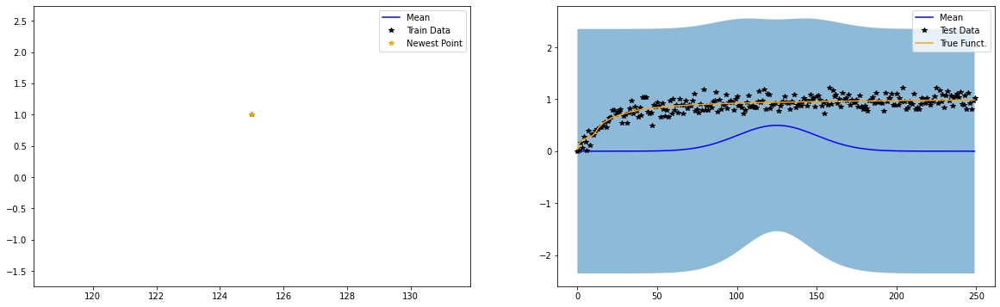

Iter 0/500 - Loss: 1.441   lengthscale: 25.000   noise: 0.644
Iter 50/500 - Loss: -1.408   lengthscale: 25.000   noise: 0.004
Iter 100/500 - Loss: -3.306   lengthscale: 25.000   noise: 0.000
Iter 150/500 - Loss: -3.612   lengthscale: 25.000   noise: 0.000
Iter 200/500 - Loss: -3.557   lengthscale: 25.000   noise: 0.000
Iter 250/500 - Loss: -3.632   lengthscale: 25.000   noise: 0.000
Iter 300/500 - Loss: -3.621   lengthscale: 25.000   noise: 0.000
Iter 350/500 - Loss: -3.675   lengthscale: 25.000   noise: 0.000
Iter 400/500 - Loss: -3.669   lengthscale: 25.000   noise: 0.000
Iter 450/500 - Loss: -3.640   lengthscale: 25.000   noise: 0.000
Iter 500/500 - Loss: -3.677   lengthscale: 25.000   noise: 0.000


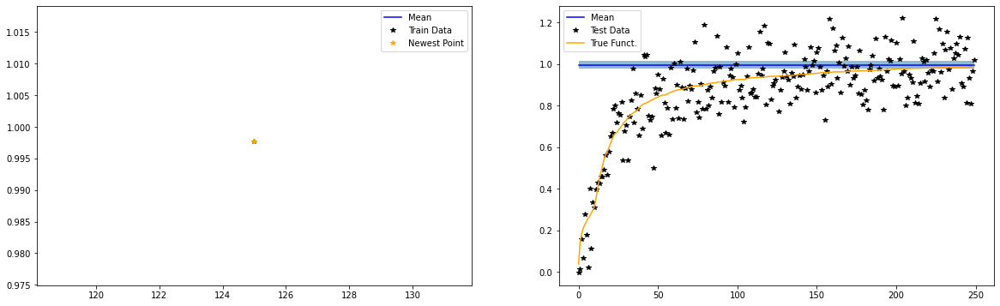

Train RMSE: 0.0006200000061653554, Test RMSE: 0.2502500116825104, Noise: 0.0001

####################################################

BEFORE TRAINING
2 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


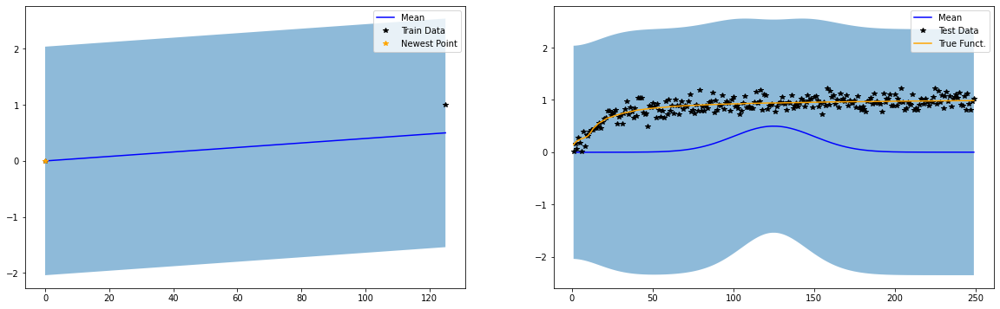

Iter 0/500 - Loss: 1.262   lengthscale: 24.978   noise: 0.644
Iter 50/500 - Loss: 0.731   lengthscale: 21.302   noise: 0.138
Iter 100/500 - Loss: 0.728   lengthscale: 20.705   noise: 0.125
Iter 150/500 - Loss: 0.728   lengthscale: 20.418   noise: 0.126
Iter 200/500 - Loss: 0.728   lengthscale: 20.203   noise: 0.126
Iter 250/500 - Loss: 0.728   lengthscale: 20.033   noise: 0.126
Iter 300/500 - Loss: 0.728   lengthscale: 19.893   noise: 0.126
Iter 350/500 - Loss: 0.728   lengthscale: 19.774   noise: 0.126
Iter 400/500 - Loss: 0.728   lengthscale: 19.671   noise: 0.126
Iter 450/500 - Loss: 0.728   lengthscale: 19.580   noise: 0.126
Iter 500/500 - Loss: 0.728   lengthscale: 19.500   noise: 0.126


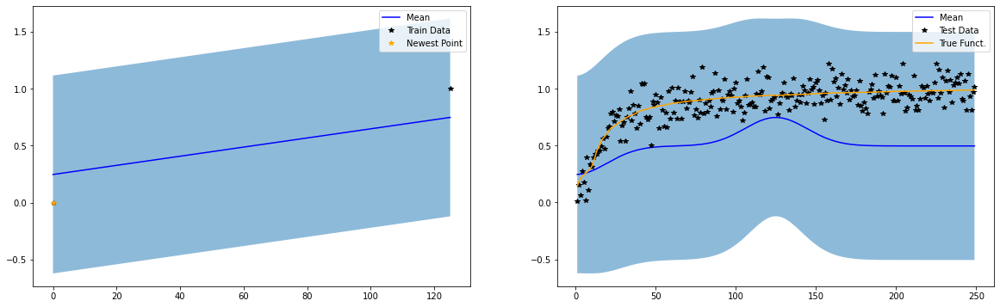

Train RMSE: 0.2505800127983093, Test RMSE: 0.3917500078678131, Noise: 0.12553

####################################################

BEFORE TRAINING
3 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


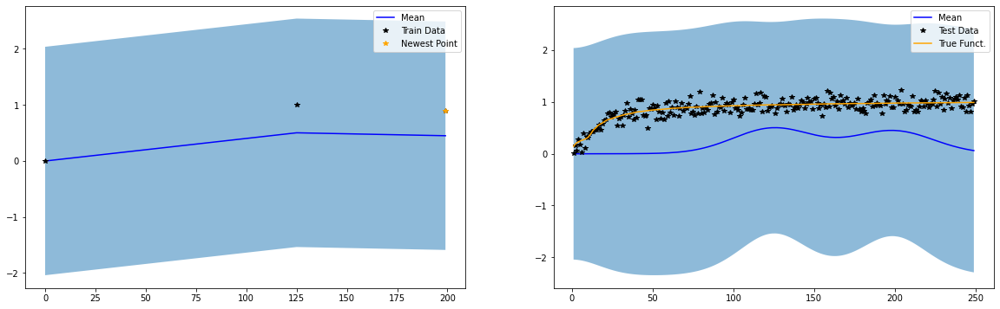

Iter 0/500 - Loss: 1.296   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.618   lengthscale: 30.158   noise: 0.108
Iter 100/500 - Loss: 0.606   lengthscale: 36.857   noise: 0.076
Iter 150/500 - Loss: 0.589   lengthscale: 44.052   noise: 0.039
Iter 200/500 - Loss: 0.572   lengthscale: 50.405   noise: 0.017
Iter 250/500 - Loss: 0.564   lengthscale: 54.934   noise: 0.009
Iter 300/500 - Loss: 0.561   lengthscale: 57.699   noise: 0.006
Iter 350/500 - Loss: 0.560   lengthscale: 59.193   noise: 0.004
Iter 400/500 - Loss: 0.559   lengthscale: 59.919   noise: 0.003
Iter 450/500 - Loss: 0.559   lengthscale: 60.239   noise: 0.002
Iter 500/500 - Loss: 0.559   lengthscale: 60.372   noise: 0.002


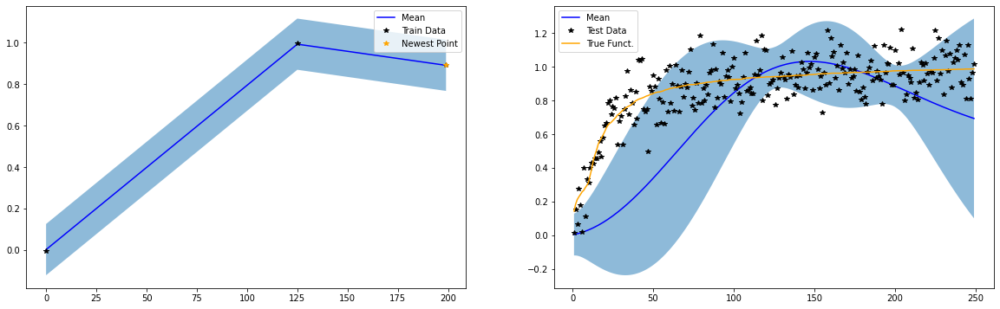

Train RMSE: 0.004350000061094761, Test RMSE: 0.2978299856185913, Noise: 0.00192

####################################################

BEFORE TRAINING
4 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


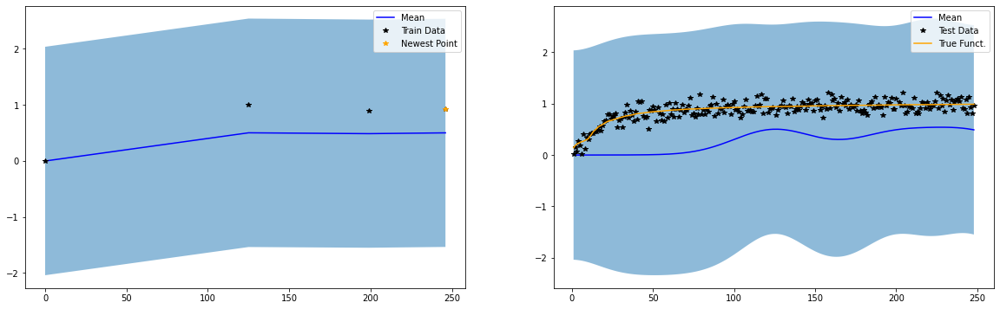

Iter 0/500 - Loss: 1.308   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.517   lengthscale: 29.833   noise: 0.077
Iter 100/500 - Loss: 0.489   lengthscale: 36.159   noise: 0.035
Iter 150/500 - Loss: 0.452   lengthscale: 43.284   noise: 0.012
Iter 200/500 - Loss: 0.424   lengthscale: 49.556   noise: 0.005
Iter 250/500 - Loss: 0.409   lengthscale: 54.322   noise: 0.003
Iter 300/500 - Loss: 0.402   lengthscale: 57.606   noise: 0.002
Iter 350/500 - Loss: 0.400   lengthscale: 59.673   noise: 0.001
Iter 400/500 - Loss: 0.399   lengthscale: 60.860   noise: 0.001
Iter 450/500 - Loss: 0.398   lengthscale: 61.479   noise: 0.001
Iter 500/500 - Loss: 0.398   lengthscale: 61.768   noise: 0.001


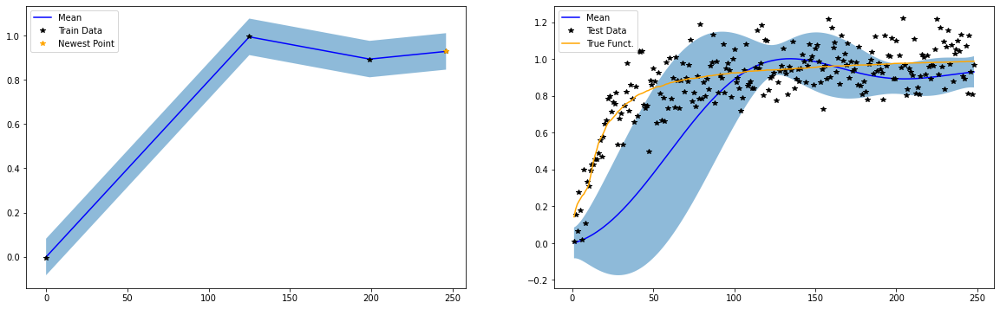

Train RMSE: 0.002689999993890524, Test RMSE: 0.26816999912261963, Noise: 0.00086

####################################################

BEFORE TRAINING
5 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


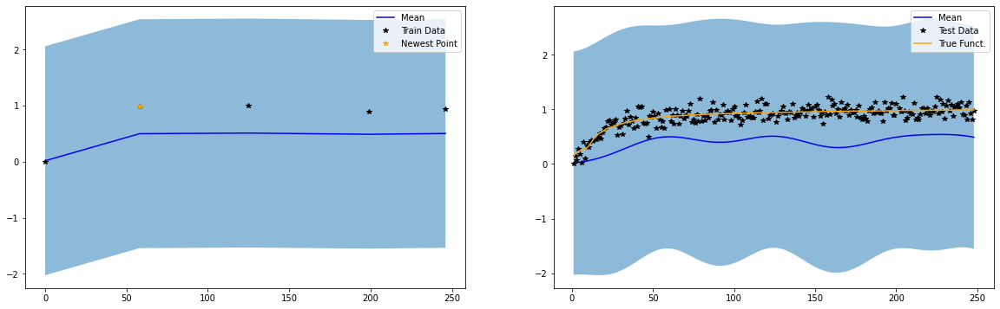

Iter 0/500 - Loss: 1.331   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.466   lengthscale: 24.030   noise: 0.085
Iter 100/500 - Loss: 0.462   lengthscale: 20.379   noise: 0.081
Iter 150/500 - Loss: 0.461   lengthscale: 18.363   noise: 0.082
Iter 200/500 - Loss: 0.461   lengthscale: 17.317   noise: 0.082
Iter 250/500 - Loss: 0.461   lengthscale: 16.722   noise: 0.082
Iter 300/500 - Loss: 0.461   lengthscale: 16.355   noise: 0.081
Iter 350/500 - Loss: 0.461   lengthscale: 16.118   noise: 0.081
Iter 400/500 - Loss: 0.461   lengthscale: 15.961   noise: 0.081
Iter 450/500 - Loss: 0.461   lengthscale: 15.857   noise: 0.081
Iter 500/500 - Loss: 0.461   lengthscale: 15.788   noise: 0.080


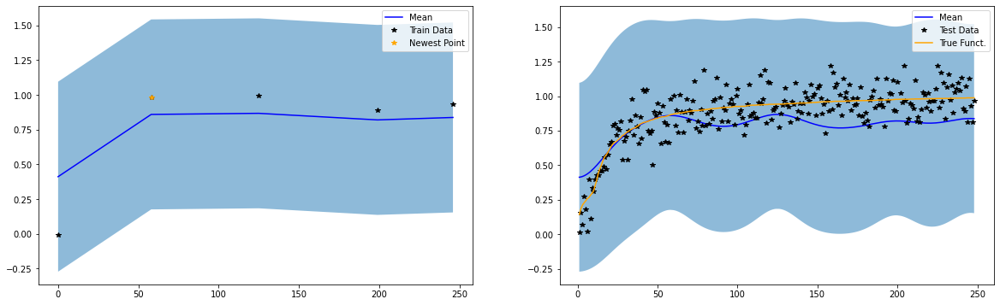

Train RMSE: 0.20909999310970306, Test RMSE: 0.17527000606060028, Noise: 0.08024

####################################################

BEFORE TRAINING
6 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


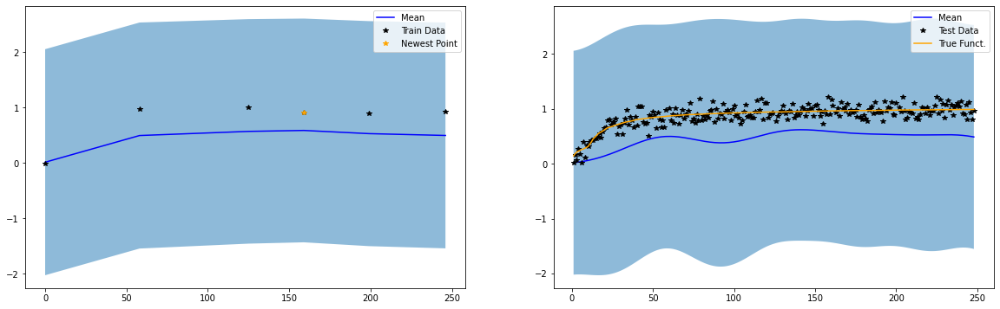

Iter 0/500 - Loss: 1.307   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.370   lengthscale: 27.571   noise: 0.055
Iter 100/500 - Loss: 0.360   lengthscale: 29.830   noise: 0.029
Iter 150/500 - Loss: 0.336   lengthscale: 35.883   noise: 0.011
Iter 200/500 - Loss: 0.296   lengthscale: 44.267   noise: 0.003
Iter 250/500 - Loss: 0.265   lengthscale: 51.357   noise: 0.001
Iter 300/500 - Loss: 0.250   lengthscale: 56.259   noise: 0.001
Iter 350/500 - Loss: 0.244   lengthscale: 59.547   noise: 0.000
Iter 400/500 - Loss: 0.241   lengthscale: 61.794   noise: 0.000
Iter 450/500 - Loss: 0.240   lengthscale: 63.355   noise: 0.000
Iter 500/500 - Loss: 0.239   lengthscale: 64.450   noise: 0.000


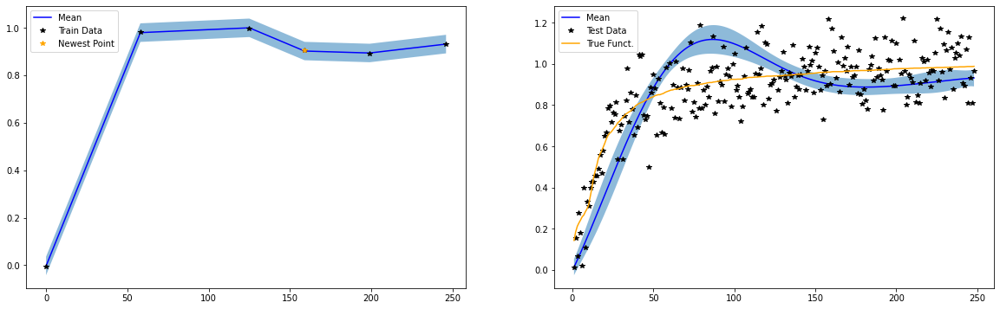

Train RMSE: 0.0014600000577047467, Test RMSE: 0.16774000227451324, Noise: 0.00019

####################################################

BEFORE TRAINING
7 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


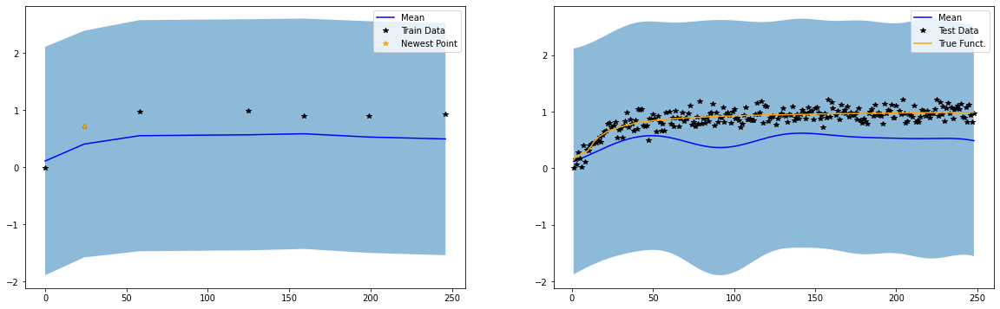

Iter 0/500 - Loss: 1.282   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.301   lengthscale: 27.157   noise: 0.065
Iter 100/500 - Loss: 0.300   lengthscale: 26.500   noise: 0.072
Iter 150/500 - Loss: 0.300   lengthscale: 25.998   noise: 0.073
Iter 200/500 - Loss: 0.300   lengthscale: 25.608   noise: 0.073
Iter 250/500 - Loss: 0.300   lengthscale: 25.303   noise: 0.073
Iter 300/500 - Loss: 0.300   lengthscale: 25.076   noise: 0.073
Iter 350/500 - Loss: 0.300   lengthscale: 24.916   noise: 0.073
Iter 400/500 - Loss: 0.300   lengthscale: 24.811   noise: 0.073
Iter 450/500 - Loss: 0.300   lengthscale: 24.746   noise: 0.073
Iter 500/500 - Loss: 0.300   lengthscale: 24.709   noise: 0.073


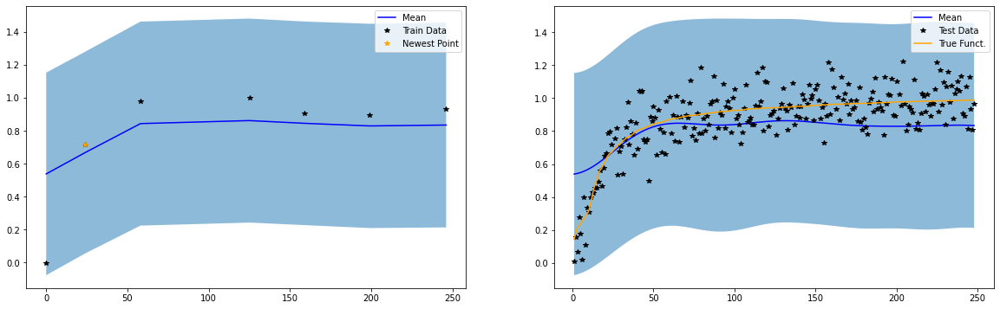

Train RMSE: 0.22390000522136688, Test RMSE: 0.16756999492645264, Noise: 0.07266

####################################################

BEFORE TRAINING
8 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


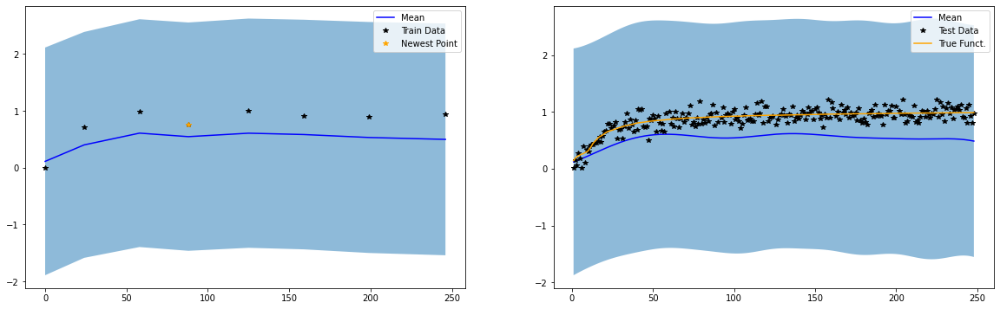

Iter 0/500 - Loss: 1.259   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.239   lengthscale: 26.956   noise: 0.056
Iter 100/500 - Loss: 0.235   lengthscale: 25.825   noise: 0.067
Iter 150/500 - Loss: 0.235   lengthscale: 25.104   noise: 0.068
Iter 200/500 - Loss: 0.235   lengthscale: 24.564   noise: 0.069
Iter 250/500 - Loss: 0.235   lengthscale: 24.132   noise: 0.068
Iter 300/500 - Loss: 0.235   lengthscale: 23.786   noise: 0.068
Iter 350/500 - Loss: 0.235   lengthscale: 23.518   noise: 0.068
Iter 400/500 - Loss: 0.235   lengthscale: 23.318   noise: 0.068
Iter 450/500 - Loss: 0.235   lengthscale: 23.178   noise: 0.067
Iter 500/500 - Loss: 0.235   lengthscale: 23.084   noise: 0.067


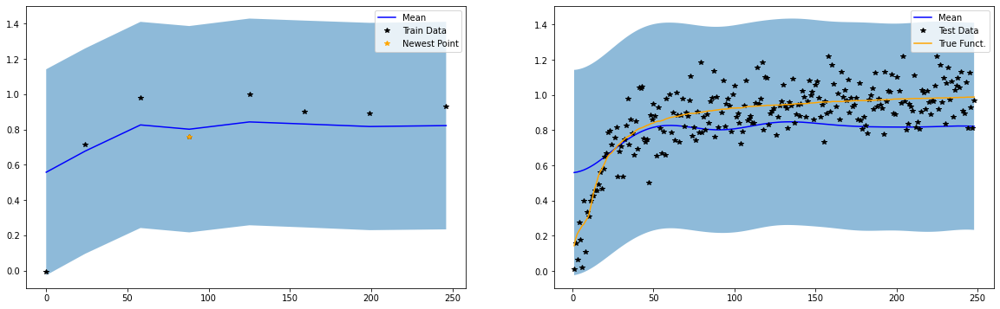

Train RMSE: 0.22071999311447144, Test RMSE: 0.17826999723911285, Noise: 0.06722

####################################################

BEFORE TRAINING
9 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


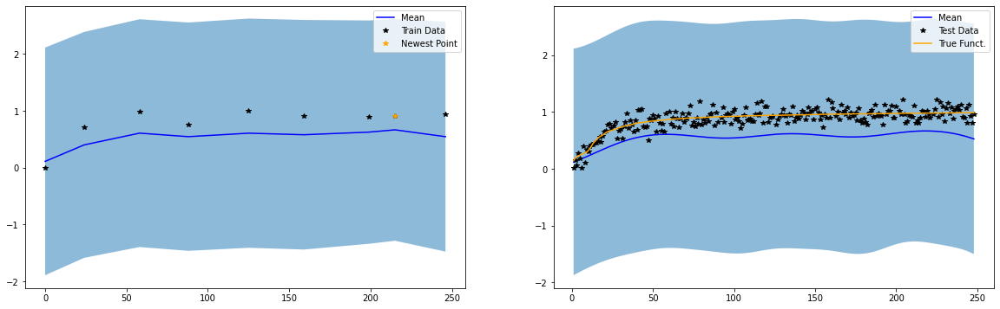

Iter 0/500 - Loss: 1.234   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.176   lengthscale: 27.310   noise: 0.040
Iter 100/500 - Loss: 0.171   lengthscale: 25.913   noise: 0.037
Iter 150/500 - Loss: 0.170   lengthscale: 24.399   noise: 0.031
Iter 200/500 - Loss: 0.168   lengthscale: 23.178   noise: 0.024
Iter 250/500 - Loss: 0.167   lengthscale: 22.381   noise: 0.018
Iter 300/500 - Loss: 0.166   lengthscale: 21.972   noise: 0.014
Iter 350/500 - Loss: 0.165   lengthscale: 21.965   noise: 0.010
Iter 400/500 - Loss: 0.164   lengthscale: 22.455   noise: 0.007
Iter 450/500 - Loss: 0.163   lengthscale: 23.661   noise: 0.005
Iter 500/500 - Loss: 0.160   lengthscale: 25.980   noise: 0.003


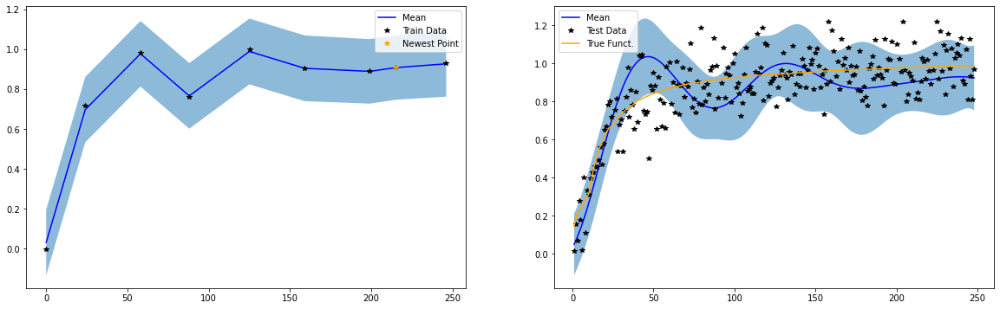

Train RMSE: 0.014510000124573708, Test RMSE: 0.14408999681472778, Noise: 0.00347

####################################################

BEFORE TRAINING
10 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


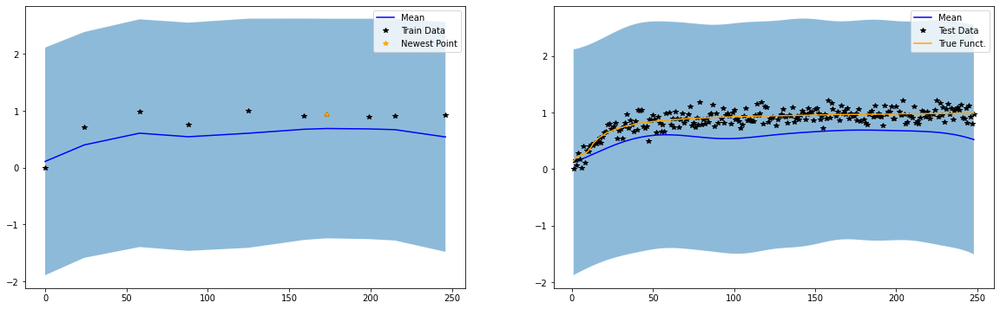

Iter 0/500 - Loss: 1.212   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.111   lengthscale: 27.656   noise: 0.029
Iter 100/500 - Loss: 0.070   lengthscale: 26.892   noise: 0.011
Iter 150/500 - Loss: 0.019   lengthscale: 29.748   noise: 0.002
Iter 200/500 - Loss: 0.006   lengthscale: 31.087   noise: 0.001
Iter 250/500 - Loss: 0.004   lengthscale: 30.200   noise: 0.001
Iter 300/500 - Loss: 0.003   lengthscale: 29.847   noise: 0.001
Iter 350/500 - Loss: 0.003   lengthscale: 29.613   noise: 0.001
Iter 400/500 - Loss: 0.003   lengthscale: 29.445   noise: 0.000
Iter 450/500 - Loss: 0.003   lengthscale: 29.318   noise: 0.000
Iter 500/500 - Loss: 0.002   lengthscale: 29.218   noise: 0.000


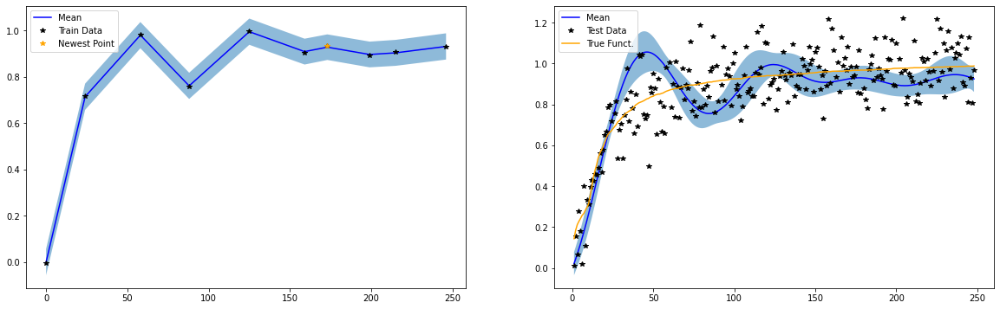

Train RMSE: 0.0036700000055134296, Test RMSE: 0.144119992852211, Noise: 0.0004

####################################################

BEFORE TRAINING
11 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


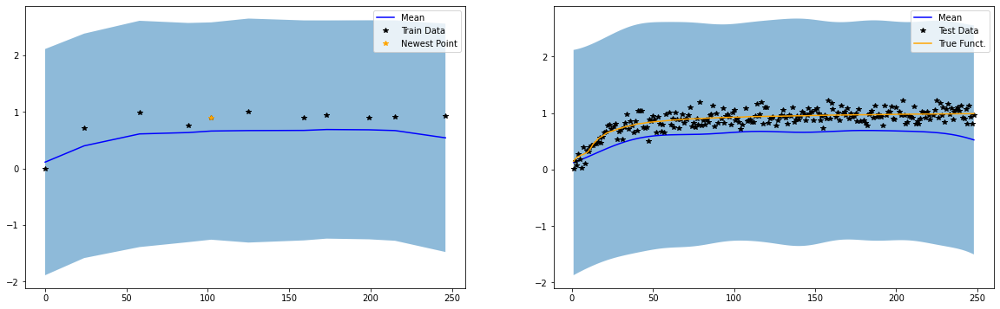

Iter 0/500 - Loss: 1.192   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.043   lengthscale: 27.928   noise: 0.023
Iter 100/500 - Loss: -0.077   lengthscale: 29.058   noise: 0.004
Iter 150/500 - Loss: -0.151   lengthscale: 31.007   noise: 0.001
Iter 200/500 - Loss: -0.167   lengthscale: 30.749   noise: 0.000
Iter 250/500 - Loss: -0.172   lengthscale: 30.752   noise: 0.000
Iter 300/500 - Loss: -0.175   lengthscale: 30.768   noise: 0.000
Iter 350/500 - Loss: -0.176   lengthscale: 30.780   noise: 0.000
Iter 400/500 - Loss: -0.177   lengthscale: 30.788   noise: 0.000
Iter 450/500 - Loss: -0.178   lengthscale: 30.794   noise: 0.000
Iter 500/500 - Loss: -0.178   lengthscale: 30.798   noise: 0.000


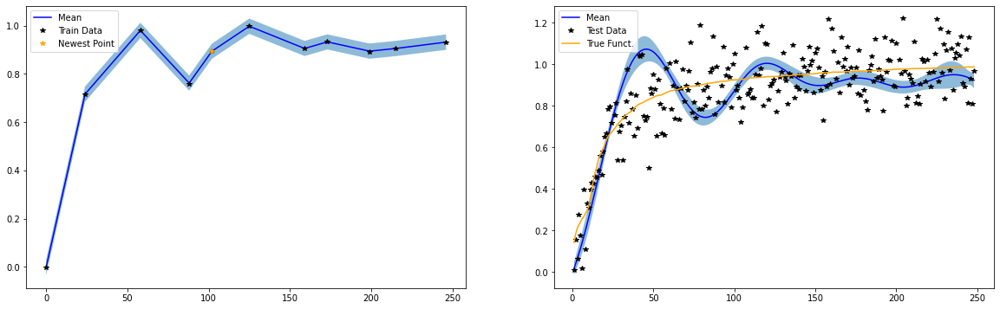

Train RMSE: 0.0014799999771639705, Test RMSE: 0.14755000174045563, Noise: 0.00013

####################################################

BEFORE TRAINING
12 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


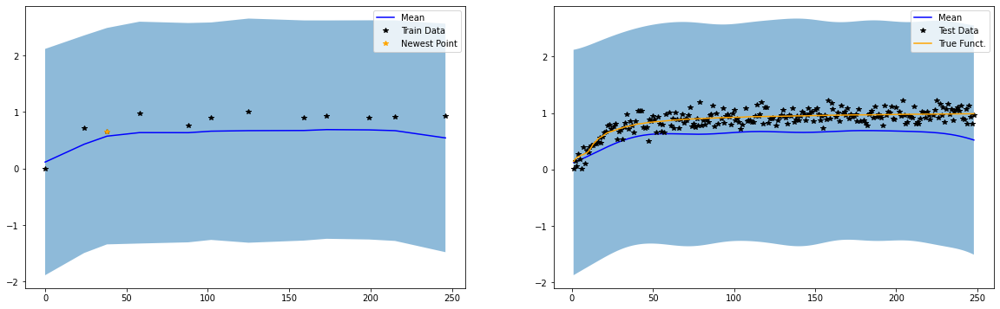

Iter 0/500 - Loss: 1.171   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.009   lengthscale: 28.914   noise: 0.023
Iter 100/500 - Loss: -0.013   lengthscale: 32.761   noise: 0.019
Iter 150/500 - Loss: -0.017   lengthscale: 35.479   noise: 0.018
Iter 200/500 - Loss: -0.017   lengthscale: 36.893   noise: 0.018
Iter 250/500 - Loss: -0.017   lengthscale: 37.557   noise: 0.018
Iter 300/500 - Loss: -0.018   lengthscale: 37.837   noise: 0.018
Iter 350/500 - Loss: -0.018   lengthscale: 37.942   noise: 0.018
Iter 400/500 - Loss: -0.018   lengthscale: 37.976   noise: 0.018
Iter 450/500 - Loss: -0.018   lengthscale: 37.986   noise: 0.018
Iter 500/500 - Loss: -0.018   lengthscale: 37.988   noise: 0.018


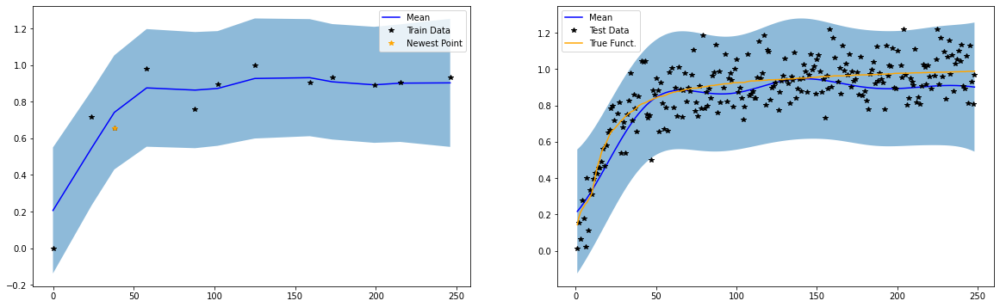

Train RMSE: 0.095490001142025, Test RMSE: 0.1266299933195114, Noise: 0.0176

####################################################

BEFORE TRAINING
13 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


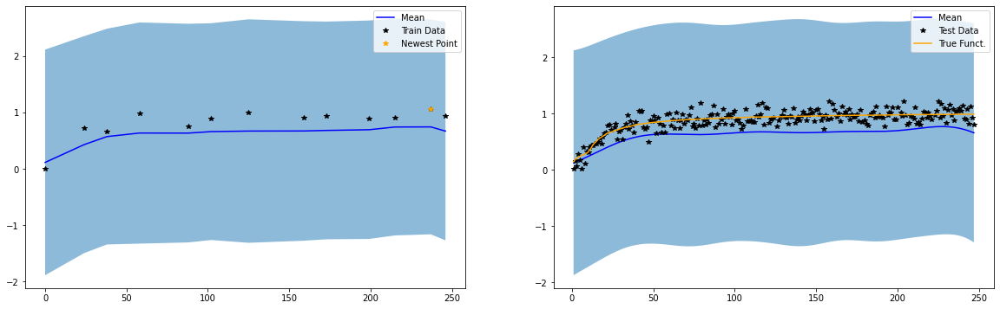

Iter 0/500 - Loss: 1.159   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.025   lengthscale: 28.905   noise: 0.020
Iter 100/500 - Loss: -0.051   lengthscale: 33.175   noise: 0.017
Iter 150/500 - Loss: -0.055   lengthscale: 36.020   noise: 0.016
Iter 200/500 - Loss: -0.055   lengthscale: 37.473   noise: 0.015
Iter 250/500 - Loss: -0.056   lengthscale: 38.113   noise: 0.015
Iter 300/500 - Loss: -0.056   lengthscale: 38.356   noise: 0.015
Iter 350/500 - Loss: -0.056   lengthscale: 38.434   noise: 0.015
Iter 400/500 - Loss: -0.056   lengthscale: 38.455   noise: 0.015
Iter 450/500 - Loss: -0.056   lengthscale: 38.460   noise: 0.015
Iter 500/500 - Loss: -0.056   lengthscale: 38.461   noise: 0.015


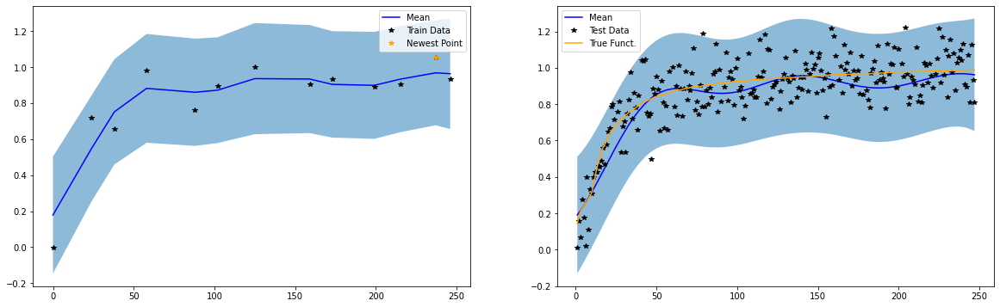

Train RMSE: 0.09014999866485596, Test RMSE: 0.12246000021696091, Noise: 0.01531

####################################################

BEFORE TRAINING
14 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


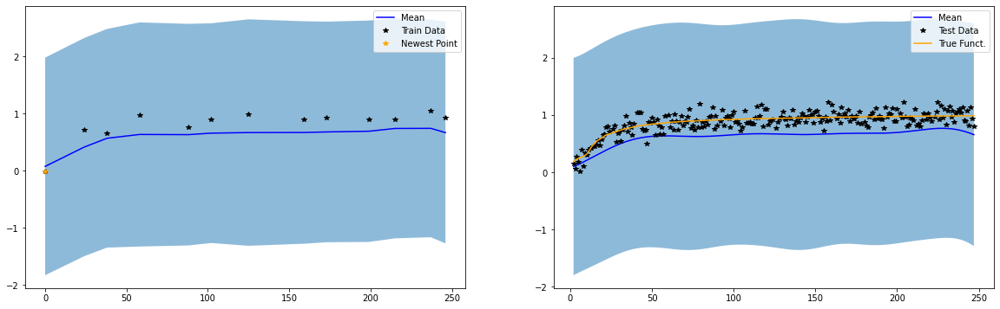

Iter 0/500 - Loss: 1.143   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.060   lengthscale: 28.784   noise: 0.013
Iter 100/500 - Loss: -0.079   lengthscale: 34.078   noise: 0.012
Iter 150/500 - Loss: -0.085   lengthscale: 37.291   noise: 0.012
Iter 200/500 - Loss: -0.087   lengthscale: 38.995   noise: 0.011
Iter 250/500 - Loss: -0.087   lengthscale: 39.753   noise: 0.011
Iter 300/500 - Loss: -0.087   lengthscale: 40.039   noise: 0.011
Iter 350/500 - Loss: -0.087   lengthscale: 40.130   noise: 0.011
Iter 400/500 - Loss: -0.087   lengthscale: 40.154   noise: 0.011
Iter 450/500 - Loss: -0.087   lengthscale: 40.159   noise: 0.011
Iter 500/500 - Loss: -0.087   lengthscale: 40.160   noise: 0.011


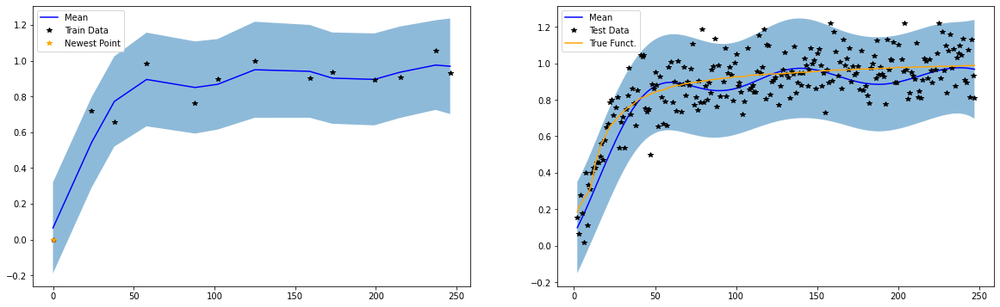

Train RMSE: 0.07660999894142151, Test RMSE: 0.12364999949932098, Noise: 0.01121

####################################################

BEFORE TRAINING
15 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


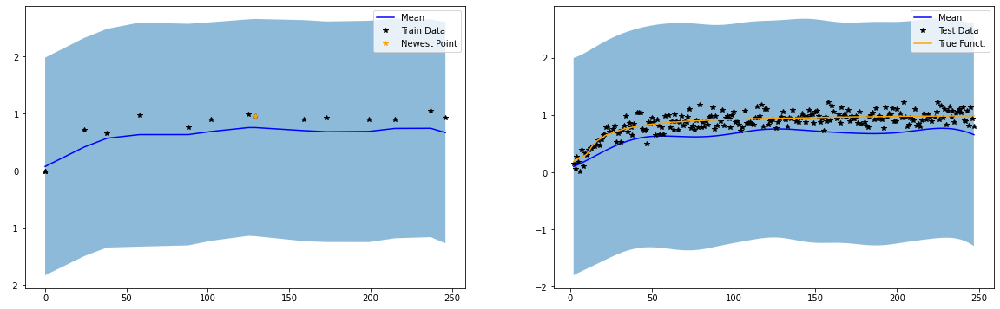

Iter 0/500 - Loss: 1.131   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.123   lengthscale: 28.846   noise: 0.012
Iter 100/500 - Loss: -0.145   lengthscale: 34.339   noise: 0.011
Iter 150/500 - Loss: -0.153   lengthscale: 37.883   noise: 0.010
Iter 200/500 - Loss: -0.155   lengthscale: 39.855   noise: 0.010
Iter 250/500 - Loss: -0.156   lengthscale: 40.772   noise: 0.010
Iter 300/500 - Loss: -0.156   lengthscale: 41.133   noise: 0.010
Iter 350/500 - Loss: -0.156   lengthscale: 41.253   noise: 0.010
Iter 400/500 - Loss: -0.156   lengthscale: 41.286   noise: 0.010
Iter 450/500 - Loss: -0.156   lengthscale: 41.294   noise: 0.010
Iter 500/500 - Loss: -0.156   lengthscale: 41.295   noise: 0.010


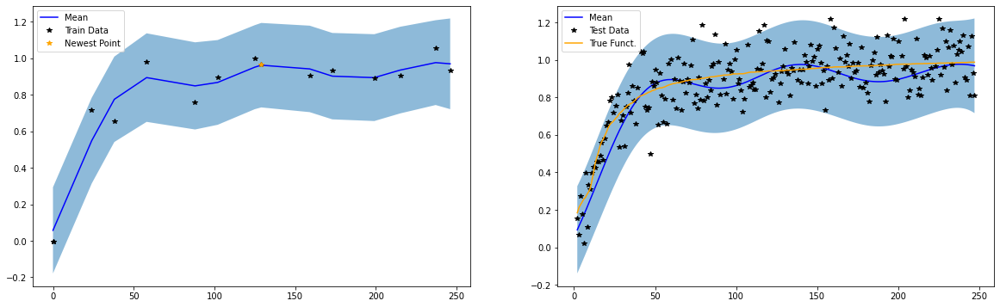

Train RMSE: 0.07254000008106232, Test RMSE: 0.12317000329494476, Noise: 0.00963

####################################################

BEFORE TRAINING
16 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


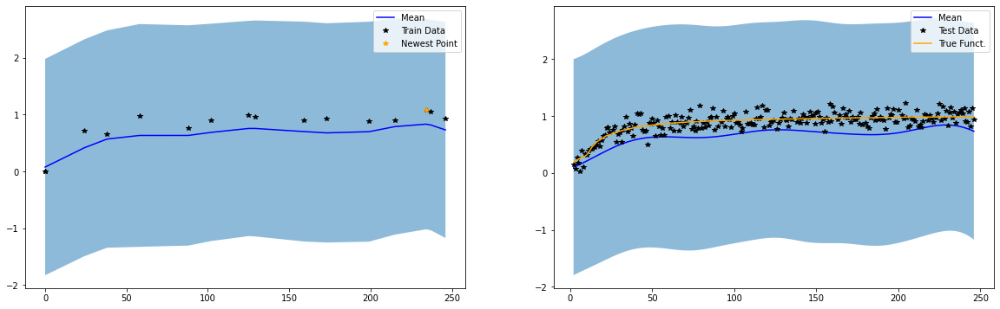

Iter 0/500 - Loss: 1.118   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.168   lengthscale: 28.815   noise: 0.011
Iter 100/500 - Loss: -0.189   lengthscale: 34.178   noise: 0.010
Iter 150/500 - Loss: -0.197   lengthscale: 37.914   noise: 0.009
Iter 200/500 - Loss: -0.199   lengthscale: 39.939   noise: 0.009
Iter 250/500 - Loss: -0.199   lengthscale: 40.804   noise: 0.009
Iter 300/500 - Loss: -0.199   lengthscale: 41.101   noise: 0.009
Iter 350/500 - Loss: -0.199   lengthscale: 41.183   noise: 0.009
Iter 400/500 - Loss: -0.199   lengthscale: 41.201   noise: 0.009
Iter 450/500 - Loss: -0.199   lengthscale: 41.204   noise: 0.009
Iter 500/500 - Loss: -0.199   lengthscale: 41.205   noise: 0.009


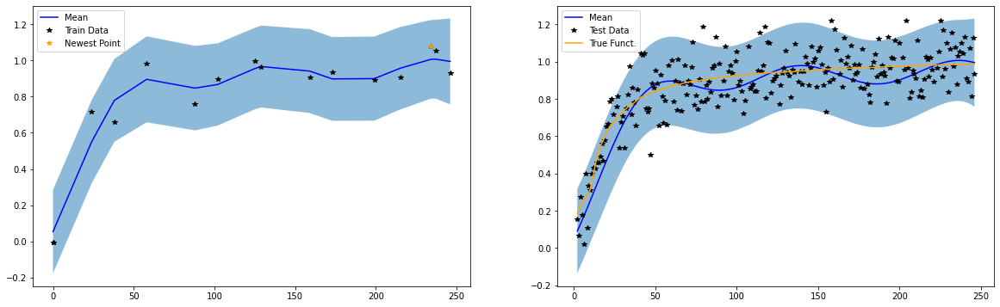

Train RMSE: 0.07209999859333038, Test RMSE: 0.122359998524189, Noise: 0.00916

####################################################

BEFORE TRAINING
17 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


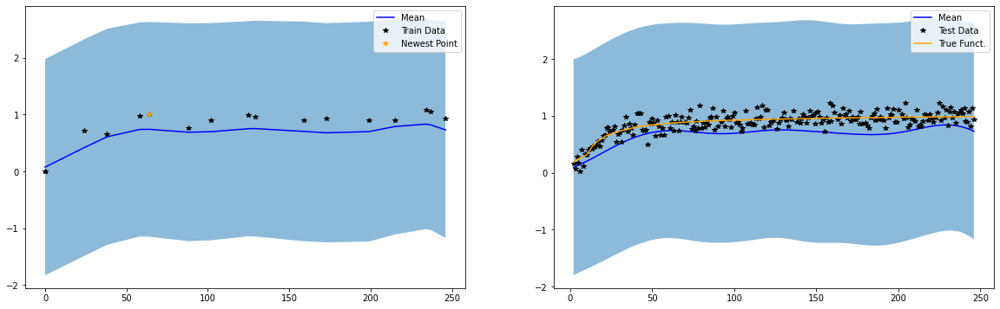

Iter 0/500 - Loss: 1.110   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.195   lengthscale: 28.922   noise: 0.011
Iter 100/500 - Loss: -0.216   lengthscale: 34.300   noise: 0.010
Iter 150/500 - Loss: -0.226   lengthscale: 38.405   noise: 0.010
Iter 200/500 - Loss: -0.228   lengthscale: 40.496   noise: 0.009
Iter 250/500 - Loss: -0.229   lengthscale: 41.320   noise: 0.009
Iter 300/500 - Loss: -0.229   lengthscale: 41.582   noise: 0.009
Iter 350/500 - Loss: -0.229   lengthscale: 41.649   noise: 0.009
Iter 400/500 - Loss: -0.229   lengthscale: 41.662   noise: 0.009
Iter 450/500 - Loss: -0.229   lengthscale: 41.664   noise: 0.009
Iter 500/500 - Loss: -0.229   lengthscale: 41.664   noise: 0.009


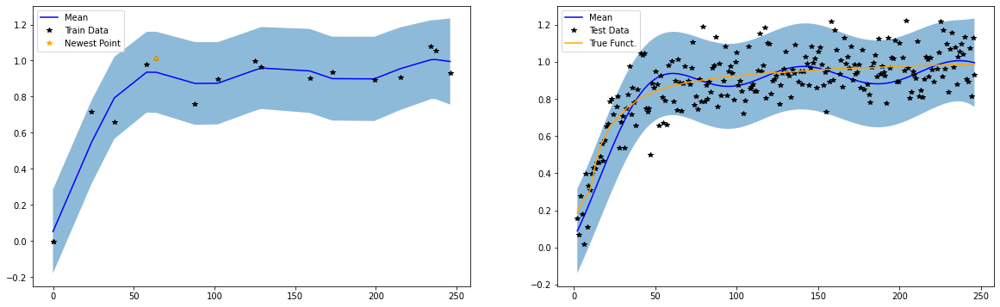

Train RMSE: 0.07422000169754028, Test RMSE: 0.12353000044822693, Noise: 0.00929

####################################################

BEFORE TRAINING
18 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


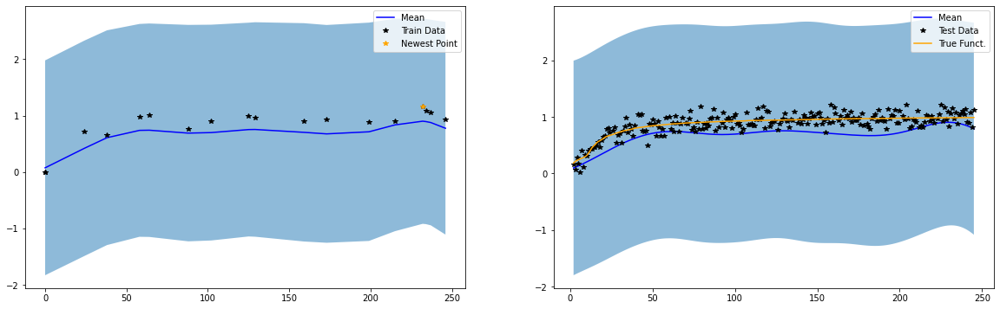

Iter 0/500 - Loss: 1.098   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.210   lengthscale: 28.777   noise: 0.011
Iter 100/500 - Loss: -0.224   lengthscale: 33.253   noise: 0.011
Iter 150/500 - Loss: -0.232   lengthscale: 37.566   noise: 0.010
Iter 200/500 - Loss: -0.234   lengthscale: 39.578   noise: 0.010
Iter 250/500 - Loss: -0.234   lengthscale: 40.183   noise: 0.010
Iter 300/500 - Loss: -0.234   lengthscale: 40.307   noise: 0.010
Iter 350/500 - Loss: -0.234   lengthscale: 40.324   noise: 0.010
Iter 400/500 - Loss: -0.234   lengthscale: 40.325   noise: 0.010
Iter 450/500 - Loss: -0.234   lengthscale: 40.325   noise: 0.010
Iter 500/500 - Loss: -0.234   lengthscale: 40.325   noise: 0.010


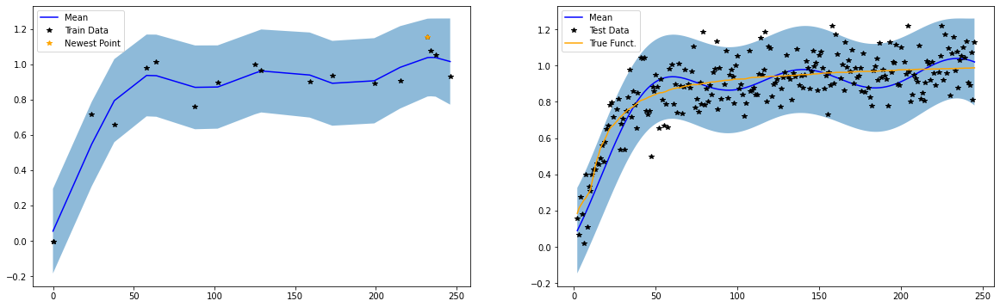

Train RMSE: 0.07778000086545944, Test RMSE: 0.12444999814033508, Noise: 0.00992

####################################################

BEFORE TRAINING
19 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


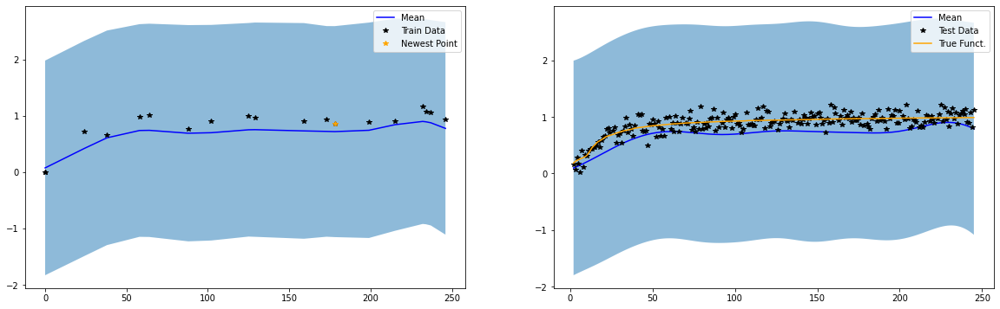

Iter 0/500 - Loss: 1.088   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.258   lengthscale: 28.844   noise: 0.010
Iter 100/500 - Loss: -0.274   lengthscale: 33.562   noise: 0.010
Iter 150/500 - Loss: -0.283   lengthscale: 37.826   noise: 0.009
Iter 200/500 - Loss: -0.284   lengthscale: 39.776   noise: 0.009
Iter 250/500 - Loss: -0.284   lengthscale: 40.349   noise: 0.009
Iter 300/500 - Loss: -0.284   lengthscale: 40.462   noise: 0.009
Iter 350/500 - Loss: -0.284   lengthscale: 40.476   noise: 0.009
Iter 400/500 - Loss: -0.284   lengthscale: 40.477   noise: 0.009
Iter 450/500 - Loss: -0.284   lengthscale: 40.477   noise: 0.009
Iter 500/500 - Loss: -0.284   lengthscale: 40.477   noise: 0.009


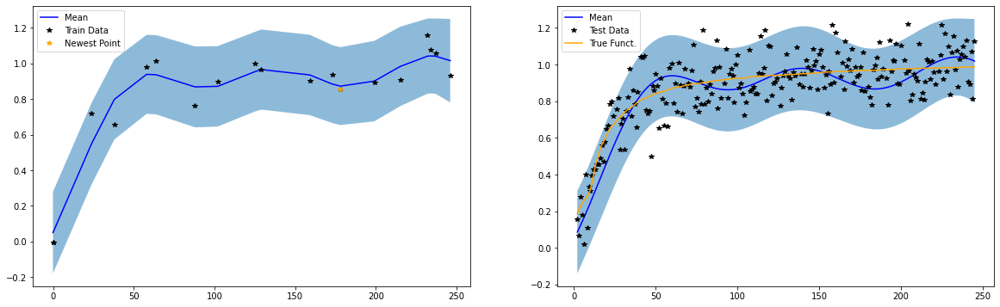

Train RMSE: 0.0750499963760376, Test RMSE: 0.12556999921798706, Noise: 0.00903

####################################################

BEFORE TRAINING
20 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


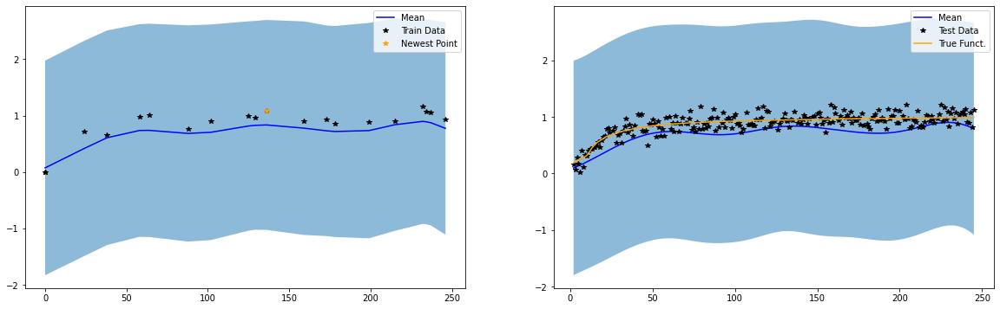

Iter 0/500 - Loss: 1.081   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.282   lengthscale: 28.872   noise: 0.010
Iter 100/500 - Loss: -0.300   lengthscale: 33.962   noise: 0.009
Iter 150/500 - Loss: -0.307   lengthscale: 37.564   noise: 0.009
Iter 200/500 - Loss: -0.308   lengthscale: 38.922   noise: 0.009
Iter 250/500 - Loss: -0.308   lengthscale: 39.222   noise: 0.009
Iter 300/500 - Loss: -0.308   lengthscale: 39.259   noise: 0.009
Iter 350/500 - Loss: -0.308   lengthscale: 39.261   noise: 0.009
Iter 400/500 - Loss: -0.308   lengthscale: 39.261   noise: 0.009
Iter 450/500 - Loss: -0.308   lengthscale: 39.261   noise: 0.009
Iter 500/500 - Loss: -0.308   lengthscale: 39.261   noise: 0.009


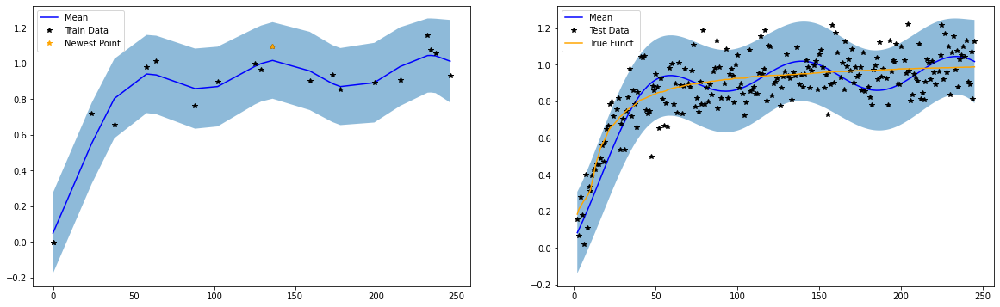

Train RMSE: 0.07450000196695328, Test RMSE: 0.12734000384807587, Noise: 0.00878



In [71]:
final_train_rmses, final_test_rmses, noise_estimates, final_true_test_rmses = train(m0_pa1_cont3, m0_pa1_cont3_noisy, 20, True)

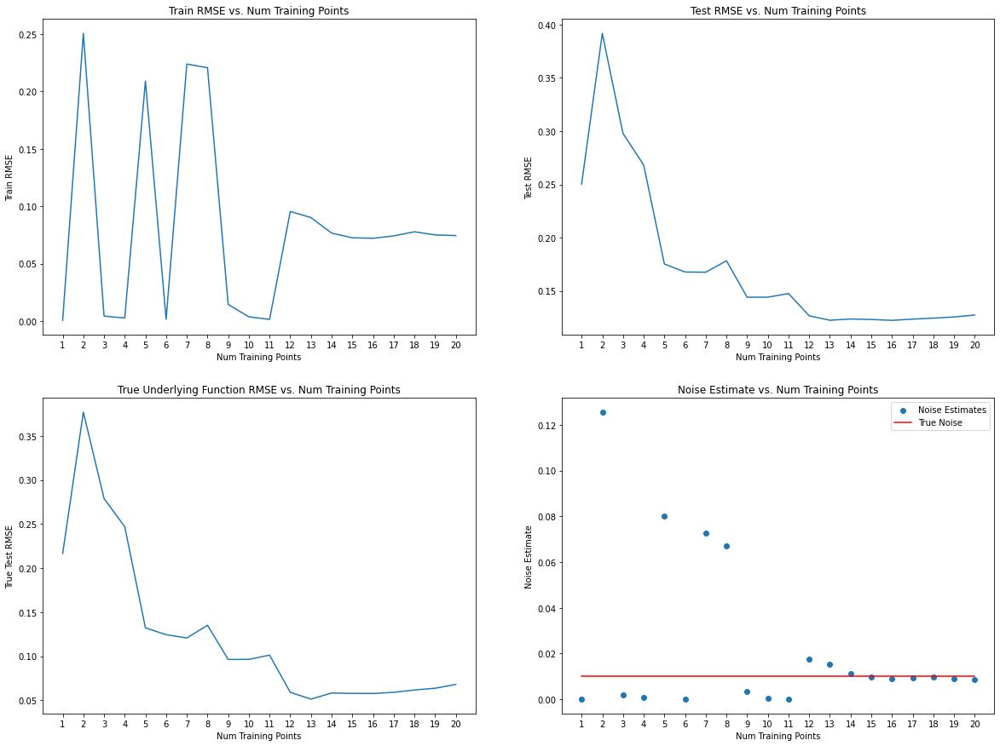

In [72]:
plot_rmses_and_noise(final_train_rmses, final_test_rmses, final_true_test_rmses, noise_estimates, 20)

## Muscle 0, contact 5, pulse amplitude 3.0

####################################################

BEFORE TRAINING
1 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


/var/folders/c0/0rqzqv5n0bg36m4j1jc_zv3w0000gn/T/ipykernel_9540/3709150696.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k*" (-> color='k'). The keyword argument will take precedence.
  ax[0].plot(newest_point[0], newest_point[1], 'k*', color = 'orange', label = 'Newest Point')


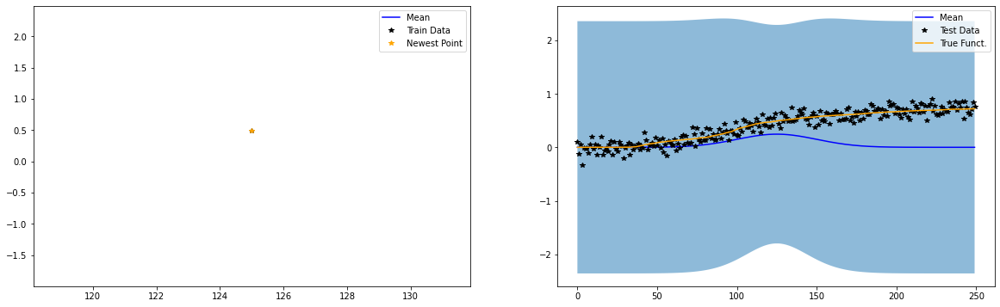

Iter 0/500 - Loss: 1.169   lengthscale: 25.000   noise: 0.644
Iter 50/500 - Loss: -1.351   lengthscale: 25.000   noise: 0.005
Iter 100/500 - Loss: -3.037   lengthscale: 25.000   noise: 0.000
Iter 150/500 - Loss: -3.543   lengthscale: 25.000   noise: 0.000
Iter 200/500 - Loss: -3.604   lengthscale: 25.000   noise: 0.000
Iter 250/500 - Loss: -3.567   lengthscale: 25.000   noise: 0.000
Iter 300/500 - Loss: -3.582   lengthscale: 25.000   noise: 0.000
Iter 350/500 - Loss: -3.667   lengthscale: 25.000   noise: 0.000
Iter 400/500 - Loss: -3.677   lengthscale: 25.000   noise: 0.000
Iter 450/500 - Loss: -3.606   lengthscale: 25.000   noise: 0.000
Iter 500/500 - Loss: -3.646   lengthscale: 25.000   noise: 0.000


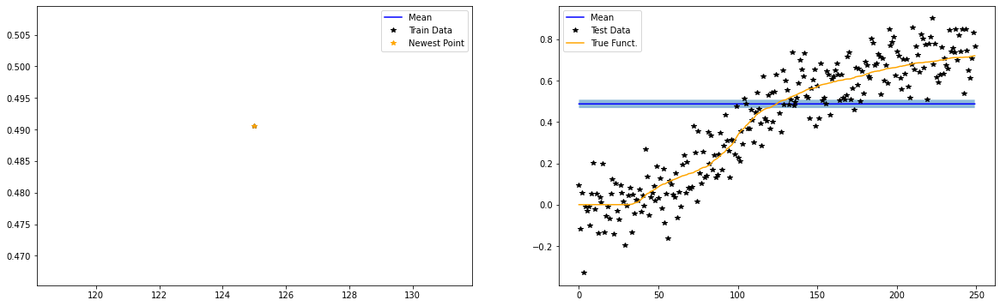

Train RMSE: 0.0030799999367445707, Test RMSE: 0.3050299882888794, Noise: 0.0001

####################################################

BEFORE TRAINING
2 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


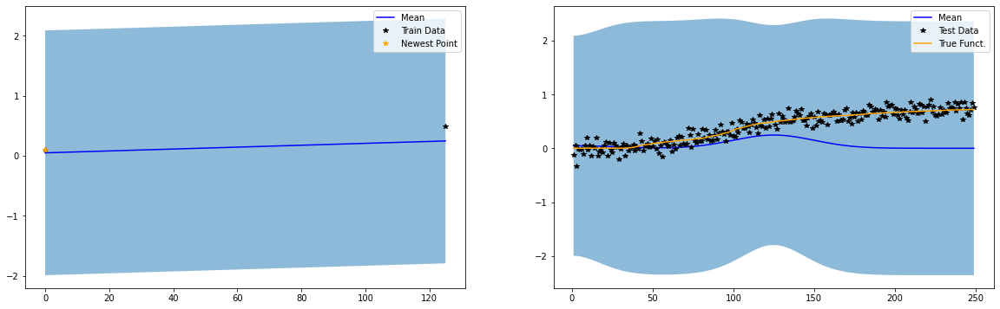

Iter 0/500 - Loss: 1.127   lengthscale: 25.076   noise: 0.644
Iter 50/500 - Loss: -0.181   lengthscale: 21.330   noise: 0.015
Iter 100/500 - Loss: -0.201   lengthscale: 20.209   noise: 0.019
Iter 150/500 - Loss: -0.201   lengthscale: 19.939   noise: 0.020
Iter 200/500 - Loss: -0.201   lengthscale: 19.746   noise: 0.020
Iter 250/500 - Loss: -0.201   lengthscale: 19.595   noise: 0.020
Iter 300/500 - Loss: -0.201   lengthscale: 19.471   noise: 0.020
Iter 350/500 - Loss: -0.201   lengthscale: 19.366   noise: 0.020
Iter 400/500 - Loss: -0.201   lengthscale: 19.276   noise: 0.020
Iter 450/500 - Loss: -0.201   lengthscale: 19.197   noise: 0.020
Iter 500/500 - Loss: -0.201   lengthscale: 19.126   noise: 0.020


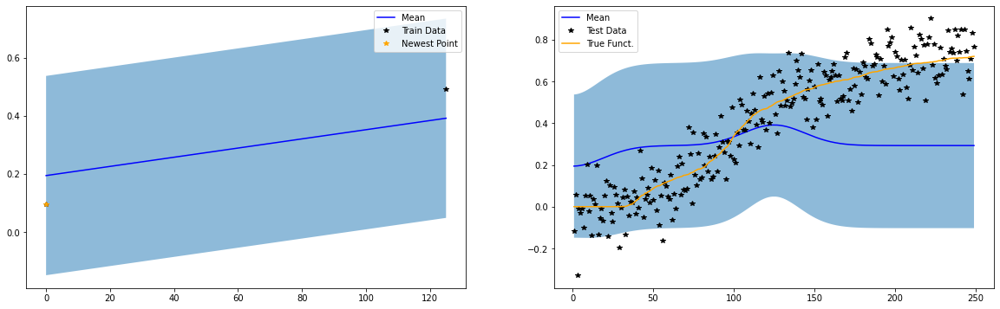

Train RMSE: 0.09916000068187714, Test RMSE: 0.2941400110721588, Noise: 0.01962

####################################################

BEFORE TRAINING
3 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


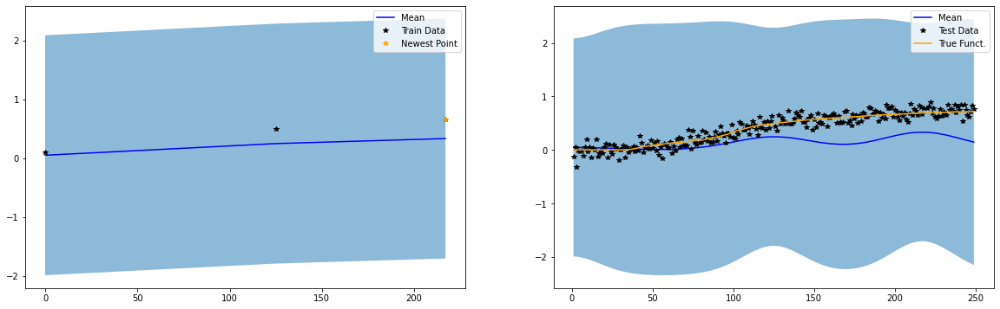

Iter 0/500 - Loss: 1.165   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.003   lengthscale: 30.097   noise: 0.023
Iter 100/500 - Loss: -0.021   lengthscale: 38.017   noise: 0.027
Iter 150/500 - Loss: -0.026   lengthscale: 46.172   noise: 0.024
Iter 200/500 - Loss: -0.034   lengthscale: 54.186   noise: 0.017
Iter 250/500 - Loss: -0.048   lengthscale: 62.913   noise: 0.009
Iter 300/500 - Loss: -0.067   lengthscale: 72.172   noise: 0.004
Iter 350/500 - Loss: -0.086   lengthscale: 80.898   noise: 0.002
Iter 400/500 - Loss: -0.102   lengthscale: 88.575   noise: 0.001
Iter 450/500 - Loss: -0.114   lengthscale: 95.215   noise: 0.001
Iter 500/500 - Loss: -0.124   lengthscale: 100.979   noise: 0.001


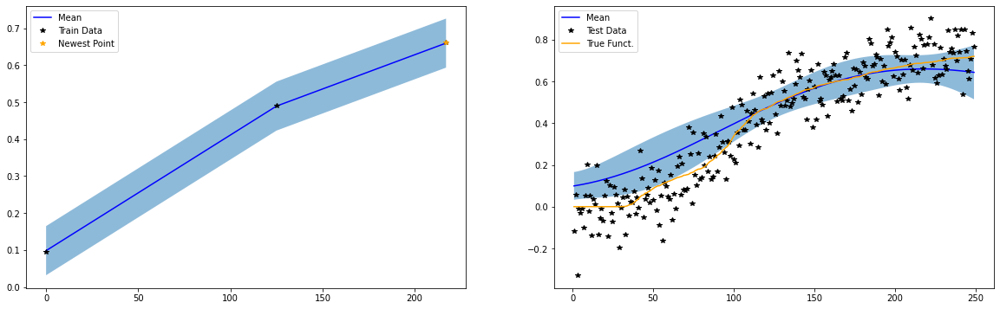

Train RMSE: 0.0023399998899549246, Test RMSE: 0.13318000733852386, Noise: 0.00056

####################################################

BEFORE TRAINING
4 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


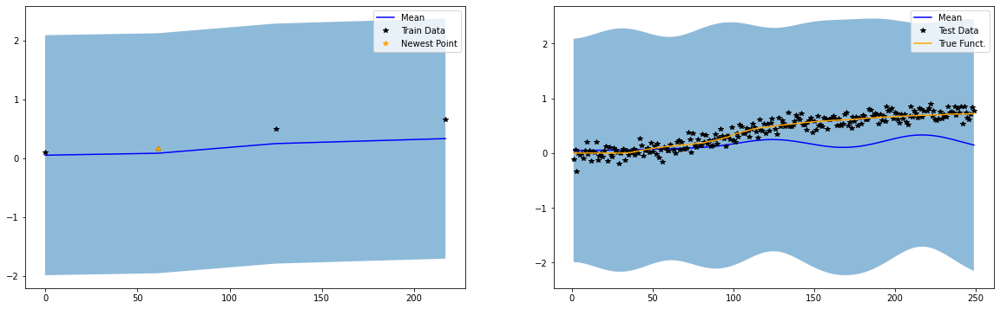

Iter 0/500 - Loss: 1.146   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.024   lengthscale: 30.964   noise: 0.021
Iter 100/500 - Loss: -0.065   lengthscale: 38.275   noise: 0.017
Iter 150/500 - Loss: -0.121   lengthscale: 46.426   noise: 0.006
Iter 200/500 - Loss: -0.188   lengthscale: 54.545   noise: 0.002
Iter 250/500 - Loss: -0.244   lengthscale: 61.794   noise: 0.001
Iter 300/500 - Loss: -0.286   lengthscale: 67.939   noise: 0.001
Iter 350/500 - Loss: -0.312   lengthscale: 72.862   noise: 0.000
Iter 400/500 - Loss: -0.325   lengthscale: 76.525   noise: 0.000
Iter 450/500 - Loss: -0.332   lengthscale: 79.033   noise: 0.000
Iter 500/500 - Loss: -0.334   lengthscale: 80.611   noise: 0.000


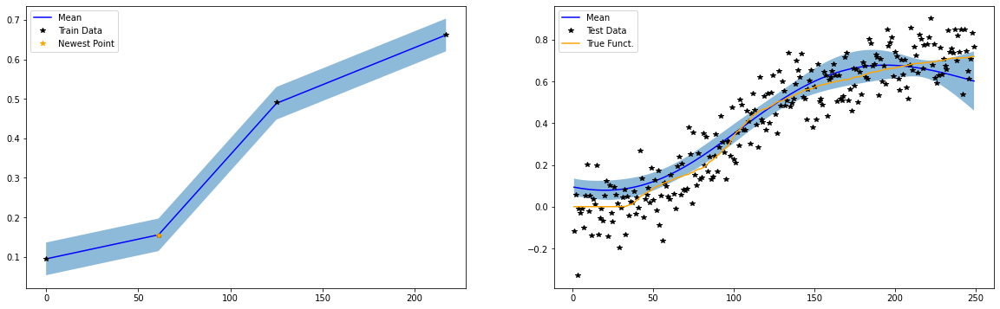

Train RMSE: 0.0015800000401213765, Test RMSE: 0.1123799979686737, Noise: 0.00022

####################################################

BEFORE TRAINING
5 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


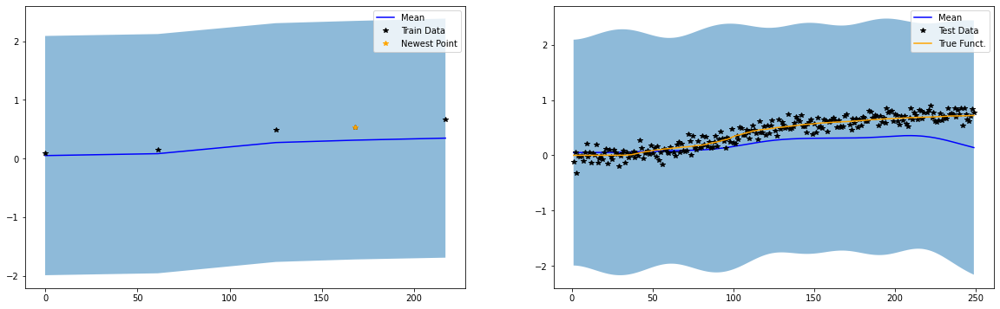

Iter 0/500 - Loss: 1.145   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.127   lengthscale: 31.009   noise: 0.015
Iter 100/500 - Loss: -0.225   lengthscale: 38.020   noise: 0.006
Iter 150/500 - Loss: -0.281   lengthscale: 44.228   noise: 0.003
Iter 200/500 - Loss: -0.311   lengthscale: 49.209   noise: 0.002
Iter 250/500 - Loss: -0.327   lengthscale: 53.015   noise: 0.002
Iter 300/500 - Loss: -0.343   lengthscale: 56.483   noise: 0.003
Iter 350/500 - Loss: -0.361   lengthscale: 60.519   noise: 0.004
Iter 400/500 - Loss: -0.377   lengthscale: 64.661   noise: 0.004
Iter 450/500 - Loss: -0.393   lengthscale: 68.691   noise: 0.004
Iter 500/500 - Loss: -0.407   lengthscale: 72.552   noise: 0.004


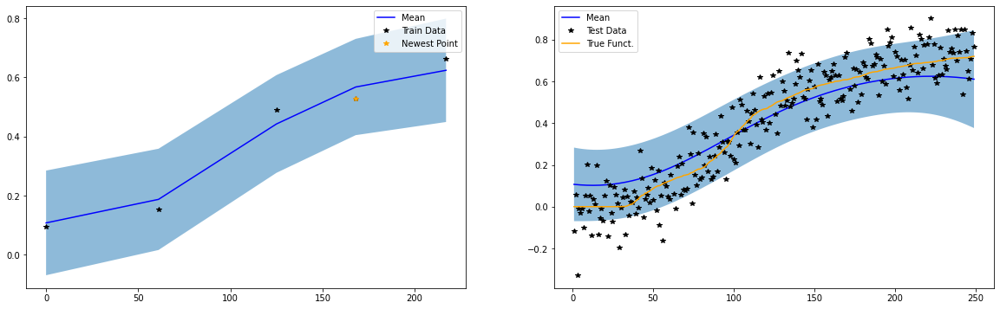

Train RMSE: 0.03633999824523926, Test RMSE: 0.12487000226974487, Noise: 0.00429

####################################################

BEFORE TRAINING
6 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


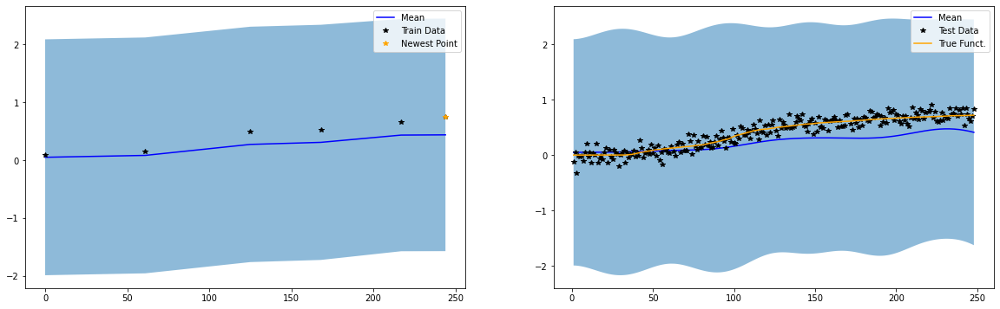

Iter 0/500 - Loss: 1.148   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.120   lengthscale: 30.909   noise: 0.013
Iter 100/500 - Loss: -0.275   lengthscale: 38.202   noise: 0.003
Iter 150/500 - Loss: -0.380   lengthscale: 44.922   noise: 0.001
Iter 200/500 - Loss: -0.460   lengthscale: 50.796   noise: 0.000
Iter 250/500 - Loss: -0.509   lengthscale: 55.468   noise: 0.000
Iter 300/500 - Loss: -0.530   lengthscale: 58.587   noise: 0.000
Iter 350/500 - Loss: -0.537   lengthscale: 60.246   noise: 0.000
Iter 400/500 - Loss: -0.538   lengthscale: 60.945   noise: 0.000
Iter 450/500 - Loss: -0.539   lengthscale: 61.176   noise: 0.000
Iter 500/500 - Loss: -0.539   lengthscale: 61.229   noise: 0.000


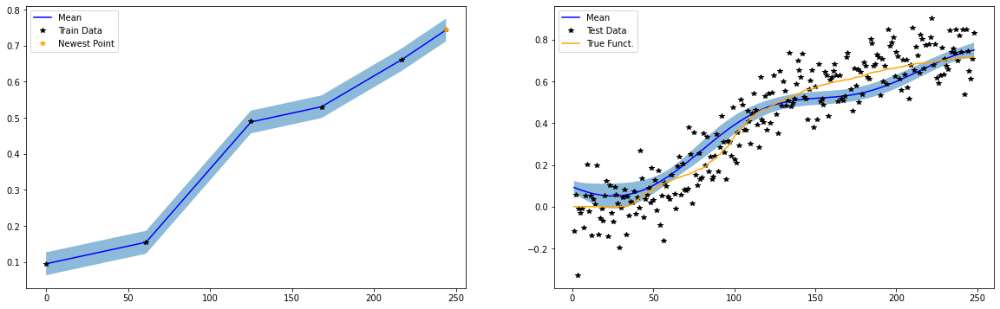

Train RMSE: 0.0014799999771639705, Test RMSE: 0.11343999952077866, Noise: 0.00013

####################################################

BEFORE TRAINING
7 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


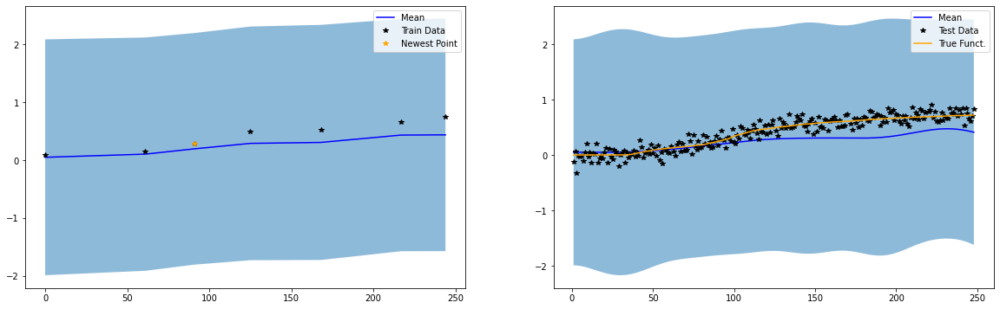

Iter 0/500 - Loss: 1.133   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.218   lengthscale: 30.799   noise: 0.011
Iter 100/500 - Loss: -0.440   lengthscale: 38.278   noise: 0.002
Iter 150/500 - Loss: -0.564   lengthscale: 44.713   noise: 0.001
Iter 200/500 - Loss: -0.612   lengthscale: 49.067   noise: 0.000
Iter 250/500 - Loss: -0.622   lengthscale: 51.313   noise: 0.000
Iter 300/500 - Loss: -0.628   lengthscale: 52.794   noise: 0.000
Iter 350/500 - Loss: -0.639   lengthscale: 54.804   noise: 0.001
Iter 400/500 - Loss: -0.649   lengthscale: 57.326   noise: 0.001
Iter 450/500 - Loss: -0.658   lengthscale: 59.764   noise: 0.001
Iter 500/500 - Loss: -0.665   lengthscale: 61.893   noise: 0.001


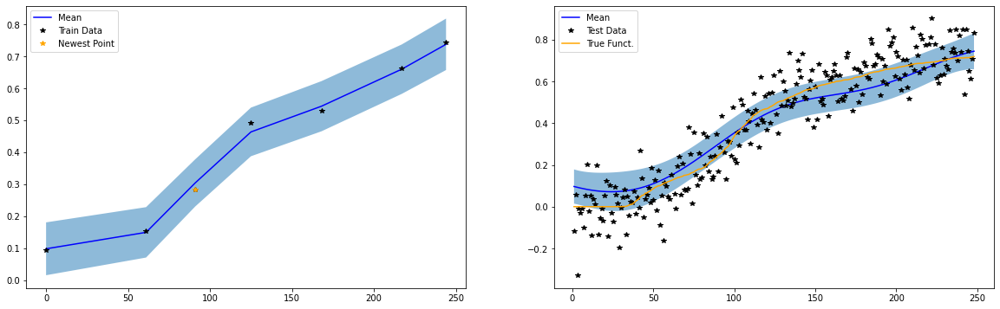

Train RMSE: 0.014440000057220459, Test RMSE: 0.1123099997639656, Noise: 0.00087

####################################################

BEFORE TRAINING
8 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


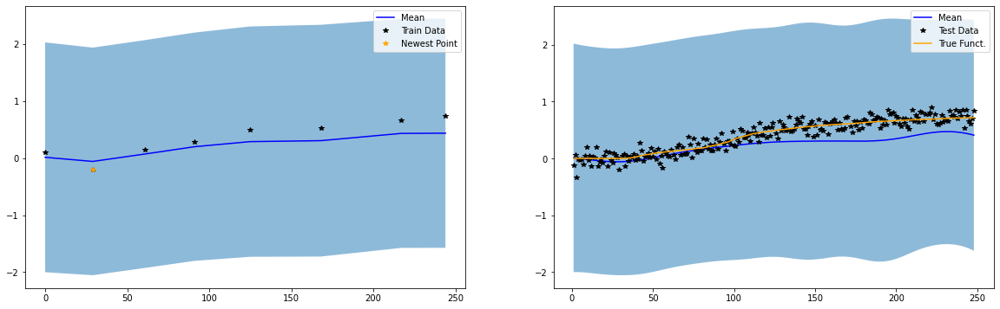

Iter 0/500 - Loss: 1.122   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.056   lengthscale: 30.783   noise: 0.013
Iter 100/500 - Loss: -0.105   lengthscale: 35.907   noise: 0.007
Iter 150/500 - Loss: -0.129   lengthscale: 40.378   noise: 0.009
Iter 200/500 - Loss: -0.148   lengthscale: 44.557   noise: 0.010
Iter 250/500 - Loss: -0.160   lengthscale: 48.028   noise: 0.010
Iter 300/500 - Loss: -0.167   lengthscale: 50.798   noise: 0.010
Iter 350/500 - Loss: -0.171   lengthscale: 52.972   noise: 0.010
Iter 400/500 - Loss: -0.173   lengthscale: 54.678   noise: 0.011
Iter 450/500 - Loss: -0.174   lengthscale: 56.025   noise: 0.011
Iter 500/500 - Loss: -0.175   lengthscale: 57.102   noise: 0.011


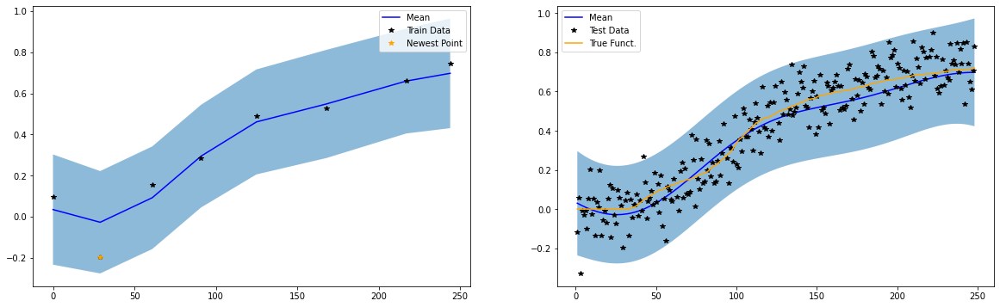

Train RMSE: 0.07063999772071838, Test RMSE: 0.10548000037670135, Noise: 0.01077

####################################################

BEFORE TRAINING
9 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


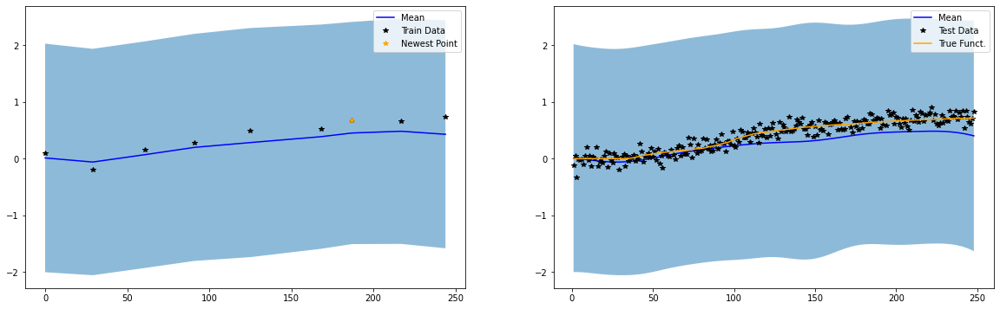

Iter 0/500 - Loss: 1.113   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.109   lengthscale: 30.774   noise: 0.011
Iter 100/500 - Loss: -0.164   lengthscale: 36.199   noise: 0.008
Iter 150/500 - Loss: -0.196   lengthscale: 40.962   noise: 0.009
Iter 200/500 - Loss: -0.216   lengthscale: 44.959   noise: 0.009
Iter 250/500 - Loss: -0.229   lengthscale: 48.252   noise: 0.009
Iter 300/500 - Loss: -0.237   lengthscale: 51.001   noise: 0.010
Iter 350/500 - Loss: -0.243   lengthscale: 53.336   noise: 0.010
Iter 400/500 - Loss: -0.247   lengthscale: 55.355   noise: 0.010
Iter 450/500 - Loss: -0.250   lengthscale: 57.128   noise: 0.010
Iter 500/500 - Loss: -0.252   lengthscale: 58.709   noise: 0.010


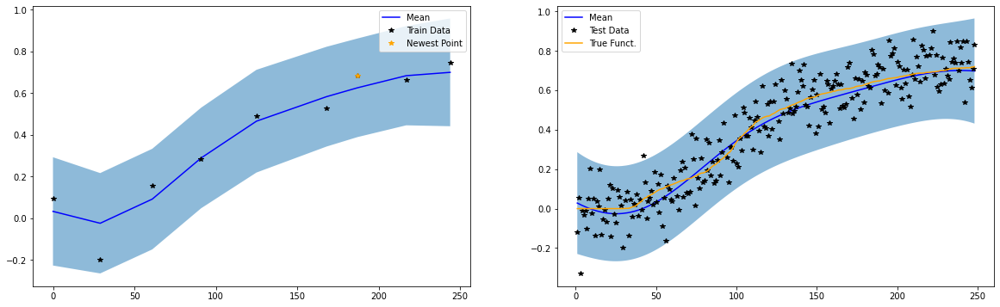

Train RMSE: 0.07229000329971313, Test RMSE: 0.10006000101566315, Noise: 0.0101

####################################################

BEFORE TRAINING
10 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


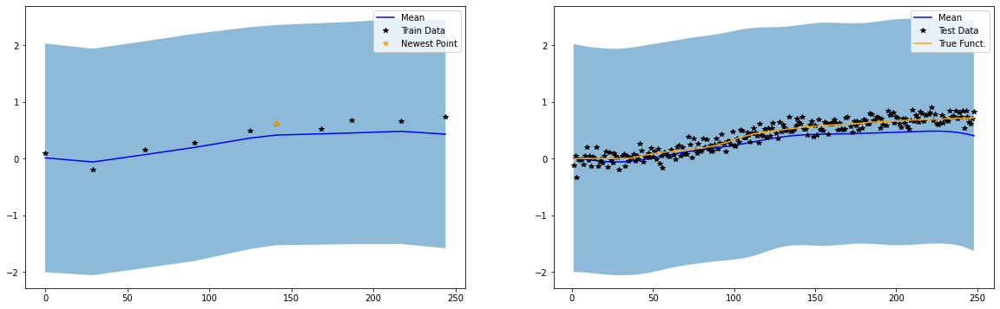

Iter 0/500 - Loss: 1.102   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.163   lengthscale: 30.727   noise: 0.011
Iter 100/500 - Loss: -0.215   lengthscale: 35.868   noise: 0.008
Iter 150/500 - Loss: -0.243   lengthscale: 40.480   noise: 0.009
Iter 200/500 - Loss: -0.266   lengthscale: 44.743   noise: 0.009
Iter 250/500 - Loss: -0.283   lengthscale: 48.513   noise: 0.009
Iter 300/500 - Loss: -0.294   lengthscale: 51.737   noise: 0.009
Iter 350/500 - Loss: -0.302   lengthscale: 54.445   noise: 0.009
Iter 400/500 - Loss: -0.307   lengthscale: 56.705   noise: 0.009
Iter 450/500 - Loss: -0.310   lengthscale: 58.594   noise: 0.009
Iter 500/500 - Loss: -0.312   lengthscale: 60.179   noise: 0.009


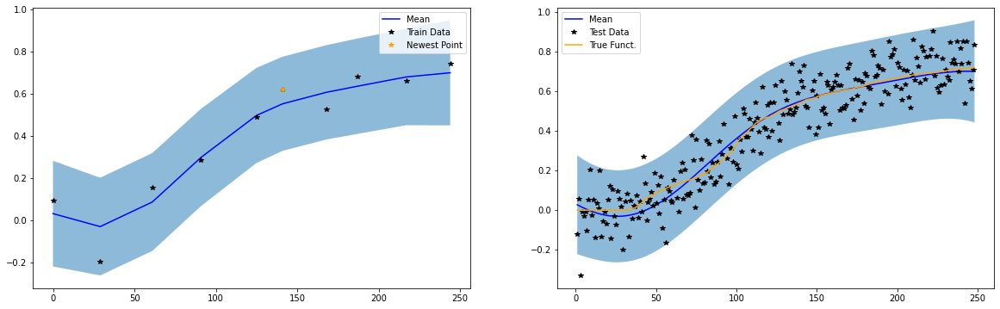

Train RMSE: 0.07216999679803848, Test RMSE: 0.09921000152826309, Noise: 0.00937

####################################################

BEFORE TRAINING
11 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


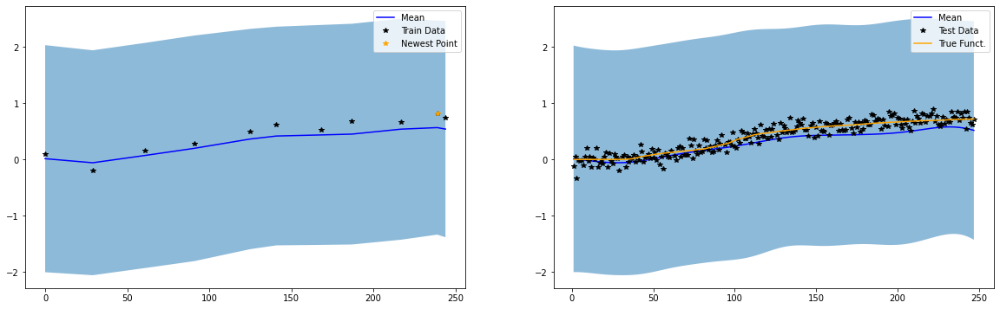

Iter 0/500 - Loss: 1.091   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.217   lengthscale: 30.712   noise: 0.010
Iter 100/500 - Loss: -0.265   lengthscale: 35.599   noise: 0.007
Iter 150/500 - Loss: -0.288   lengthscale: 39.992   noise: 0.008
Iter 200/500 - Loss: -0.308   lengthscale: 44.171   noise: 0.008
Iter 250/500 - Loss: -0.323   lengthscale: 48.011   noise: 0.008
Iter 300/500 - Loss: -0.334   lengthscale: 51.362   noise: 0.008
Iter 350/500 - Loss: -0.341   lengthscale: 54.165   noise: 0.008
Iter 400/500 - Loss: -0.346   lengthscale: 56.445   noise: 0.008
Iter 450/500 - Loss: -0.348   lengthscale: 58.275   noise: 0.008
Iter 500/500 - Loss: -0.350   lengthscale: 59.734   noise: 0.009


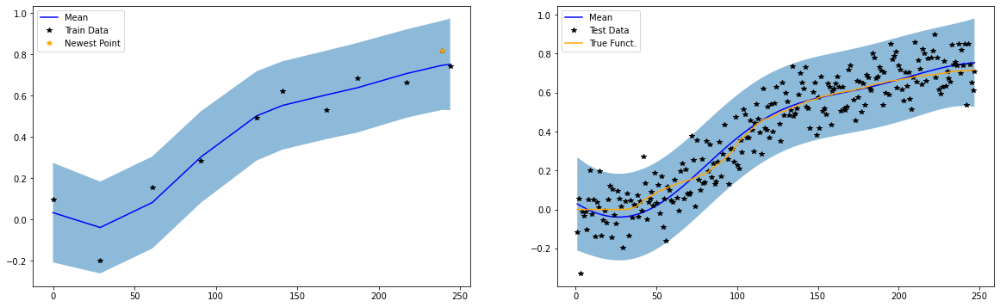

Train RMSE: 0.07011000066995621, Test RMSE: 0.09877000004053116, Noise: 0.00852

####################################################

BEFORE TRAINING
12 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


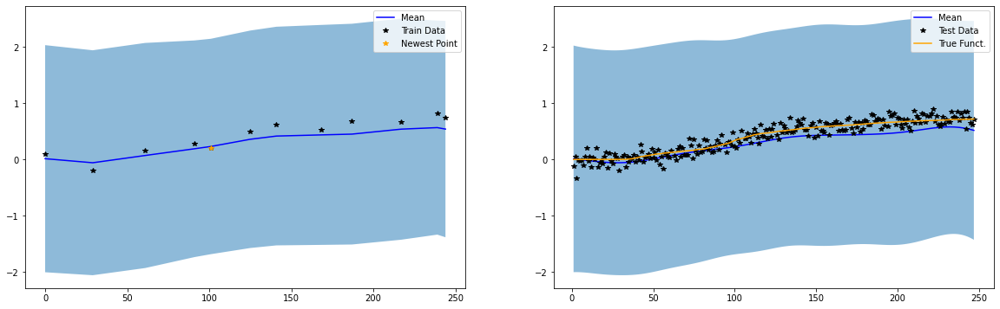

Iter 0/500 - Loss: 1.078   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.236   lengthscale: 30.582   noise: 0.010
Iter 100/500 - Loss: -0.259   lengthscale: 32.908   noise: 0.007
Iter 150/500 - Loss: -0.263   lengthscale: 35.254   noise: 0.008
Iter 200/500 - Loss: -0.271   lengthscale: 38.523   noise: 0.009
Iter 250/500 - Loss: -0.288   lengthscale: 43.430   noise: 0.010
Iter 300/500 - Loss: -0.311   lengthscale: 49.310   noise: 0.010
Iter 350/500 - Loss: -0.330   lengthscale: 54.751   noise: 0.010
Iter 400/500 - Loss: -0.343   lengthscale: 59.216   noise: 0.010
Iter 450/500 - Loss: -0.351   lengthscale: 62.794   noise: 0.010
Iter 500/500 - Loss: -0.356   lengthscale: 65.707   noise: 0.010


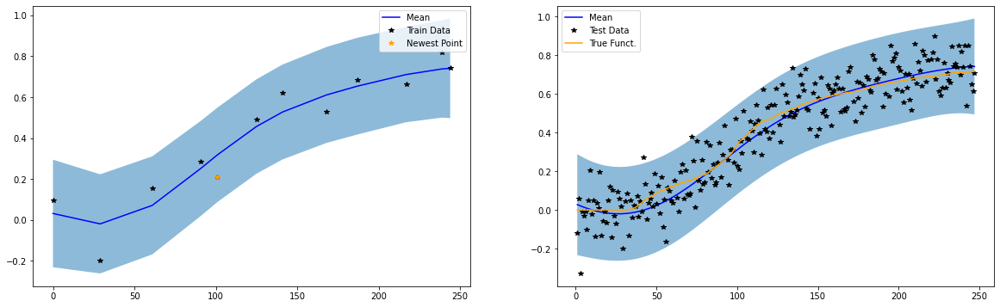

Train RMSE: 0.0822800025343895, Test RMSE: 0.09872999787330627, Noise: 0.01049

####################################################

BEFORE TRAINING
13 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


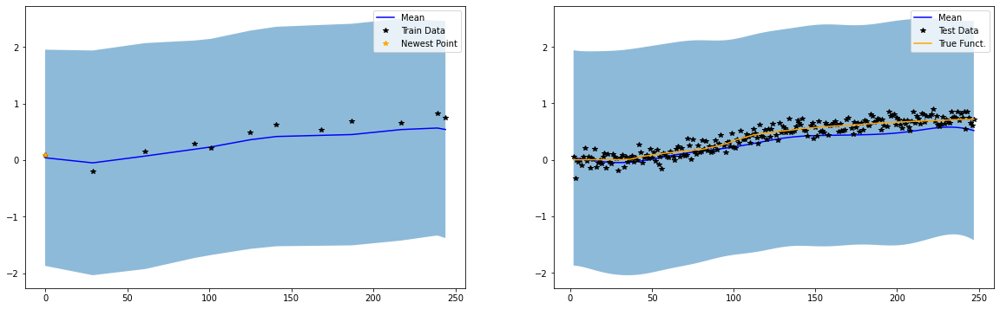

Iter 0/500 - Loss: 1.066   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.308   lengthscale: 30.583   noise: 0.009
Iter 100/500 - Loss: -0.341   lengthscale: 30.872   noise: 0.005
Iter 150/500 - Loss: -0.342   lengthscale: 29.932   noise: 0.004
Iter 200/500 - Loss: -0.343   lengthscale: 28.641   noise: 0.004
Iter 250/500 - Loss: -0.347   lengthscale: 26.508   noise: 0.003
Iter 300/500 - Loss: -0.365   lengthscale: 23.055   noise: 0.001
Iter 350/500 - Loss: -0.391   lengthscale: 21.022   noise: 0.001
Iter 400/500 - Loss: -0.420   lengthscale: 20.263   noise: 0.000
Iter 450/500 - Loss: -0.433   lengthscale: 20.105   noise: 0.000
Iter 500/500 - Loss: -0.438   lengthscale: 20.064   noise: 0.000


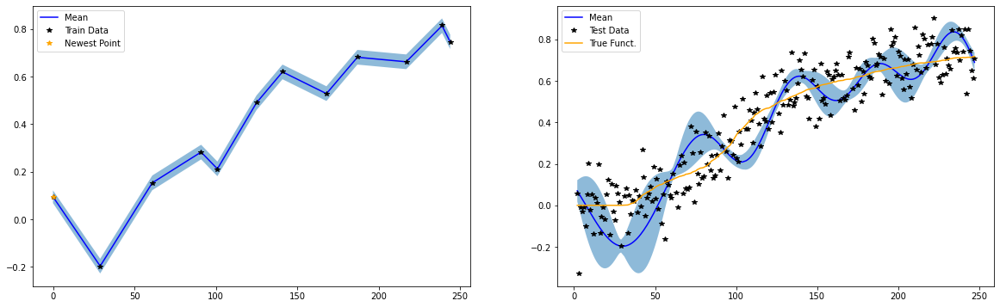

Train RMSE: 0.0014600000577047467, Test RMSE: 0.13502000272274017, Noise: 0.00012

####################################################

BEFORE TRAINING
14 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


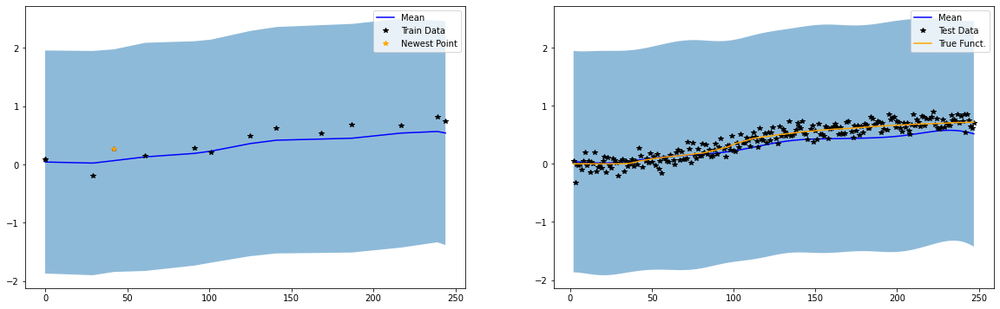

Iter 0/500 - Loss: 1.059   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.188   lengthscale: 30.514   noise: 0.012
Iter 100/500 - Loss: -0.218   lengthscale: 35.641   noise: 0.015
Iter 150/500 - Loss: -0.236   lengthscale: 40.130   noise: 0.016
Iter 200/500 - Loss: -0.253   lengthscale: 44.515   noise: 0.016
Iter 250/500 - Loss: -0.270   lengthscale: 48.897   noise: 0.016
Iter 300/500 - Loss: -0.285   lengthscale: 53.178   noise: 0.016
Iter 350/500 - Loss: -0.299   lengthscale: 57.246   noise: 0.015
Iter 400/500 - Loss: -0.310   lengthscale: 61.041   noise: 0.015
Iter 450/500 - Loss: -0.319   lengthscale: 64.561   noise: 0.015
Iter 500/500 - Loss: -0.327   lengthscale: 67.830   noise: 0.015


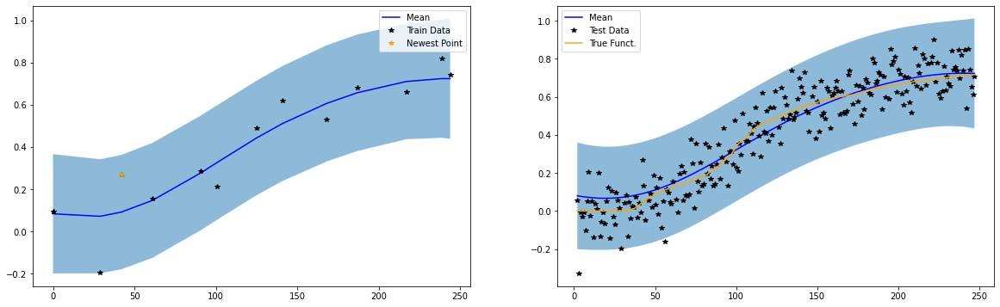

Train RMSE: 0.10377000272274017, Test RMSE: 0.1045600026845932, Noise: 0.0149

####################################################

BEFORE TRAINING
15 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


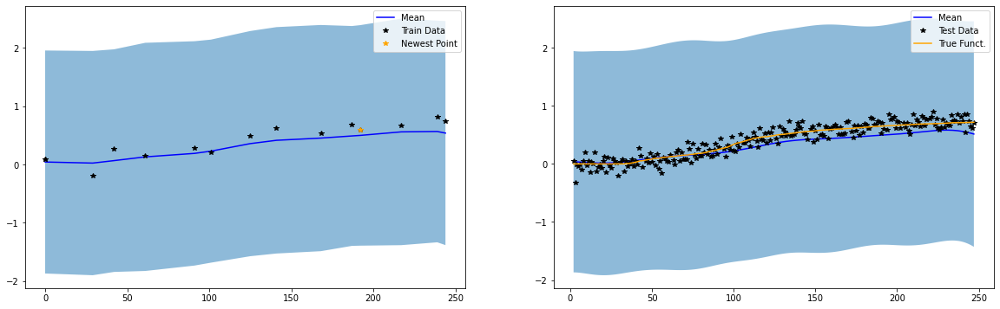

Iter 0/500 - Loss: 1.050   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.242   lengthscale: 30.493   noise: 0.011
Iter 100/500 - Loss: -0.269   lengthscale: 35.469   noise: 0.014
Iter 150/500 - Loss: -0.285   lengthscale: 39.755   noise: 0.014
Iter 200/500 - Loss: -0.299   lengthscale: 43.933   noise: 0.014
Iter 250/500 - Loss: -0.314   lengthscale: 48.184   noise: 0.014
Iter 300/500 - Loss: -0.328   lengthscale: 52.432   noise: 0.014
Iter 350/500 - Loss: -0.340   lengthscale: 56.532   noise: 0.014
Iter 400/500 - Loss: -0.351   lengthscale: 60.382   noise: 0.014
Iter 450/500 - Loss: -0.360   lengthscale: 63.948   noise: 0.014
Iter 500/500 - Loss: -0.367   lengthscale: 67.247   noise: 0.014


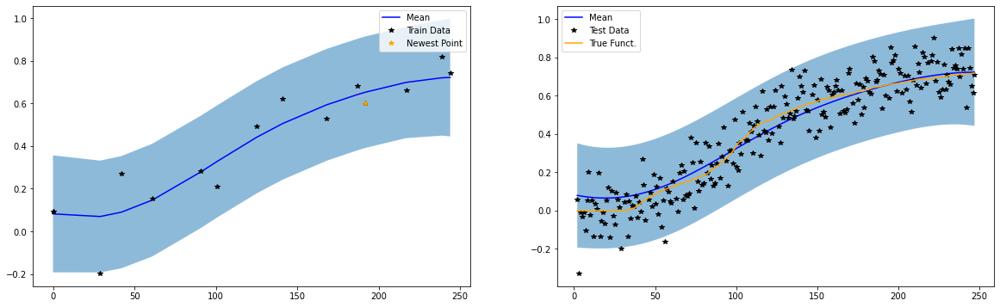

Train RMSE: 0.10130000114440918, Test RMSE: 0.1050800010561943, Noise: 0.01397

####################################################

BEFORE TRAINING
16 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


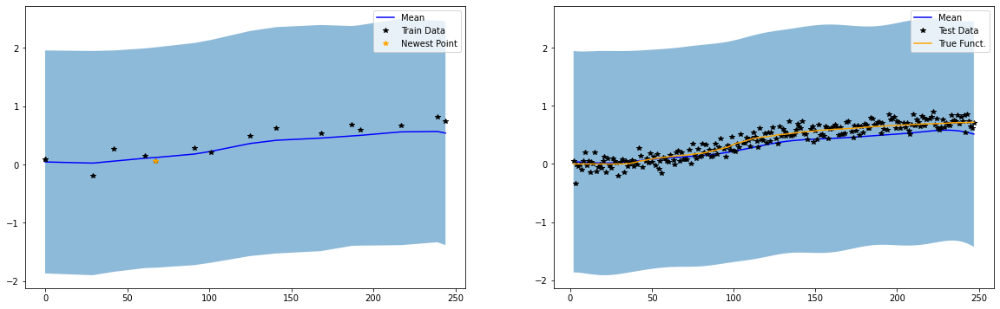

Iter 0/500 - Loss: 1.041   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.251   lengthscale: 30.592   noise: 0.012
Iter 100/500 - Loss: -0.289   lengthscale: 36.051   noise: 0.014
Iter 150/500 - Loss: -0.310   lengthscale: 40.459   noise: 0.014
Iter 200/500 - Loss: -0.326   lengthscale: 44.410   noise: 0.014
Iter 250/500 - Loss: -0.339   lengthscale: 48.161   noise: 0.014
Iter 300/500 - Loss: -0.352   lengthscale: 51.778   noise: 0.014
Iter 350/500 - Loss: -0.362   lengthscale: 55.249   noise: 0.014
Iter 400/500 - Loss: -0.371   lengthscale: 58.540   noise: 0.014
Iter 450/500 - Loss: -0.379   lengthscale: 61.633   noise: 0.014
Iter 500/500 - Loss: -0.385   lengthscale: 64.529   noise: 0.014


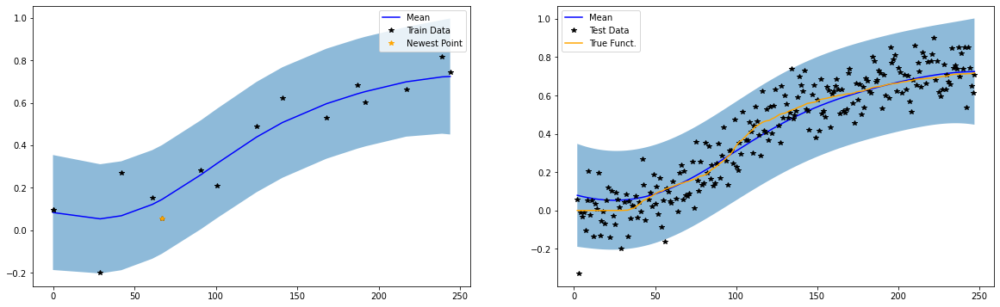

Train RMSE: 0.09997999668121338, Test RMSE: 0.10227999836206436, Noise: 0.01351

####################################################

BEFORE TRAINING
17 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


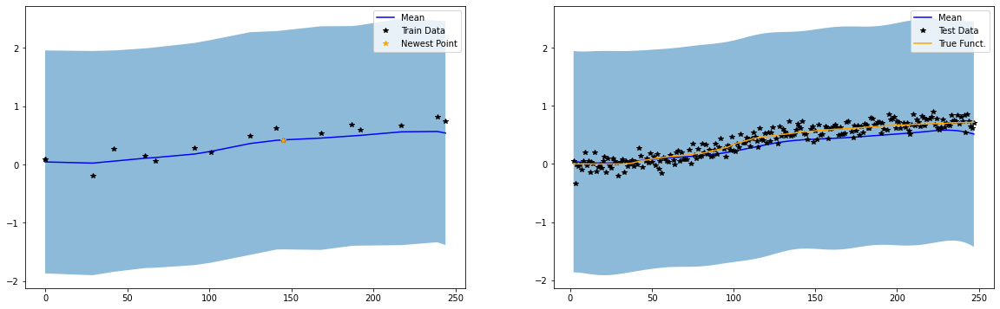

Iter 0/500 - Loss: 1.032   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.264   lengthscale: 30.581   noise: 0.012
Iter 100/500 - Loss: -0.305   lengthscale: 36.150   noise: 0.014
Iter 150/500 - Loss: -0.330   lengthscale: 40.872   noise: 0.014
Iter 200/500 - Loss: -0.349   lengthscale: 45.104   noise: 0.014
Iter 250/500 - Loss: -0.365   lengthscale: 49.021   noise: 0.014
Iter 300/500 - Loss: -0.378   lengthscale: 52.689   noise: 0.014
Iter 350/500 - Loss: -0.388   lengthscale: 56.126   noise: 0.014
Iter 400/500 - Loss: -0.398   lengthscale: 59.342   noise: 0.013
Iter 450/500 - Loss: -0.405   lengthscale: 62.352   noise: 0.013
Iter 500/500 - Loss: -0.411   lengthscale: 65.177   noise: 0.013


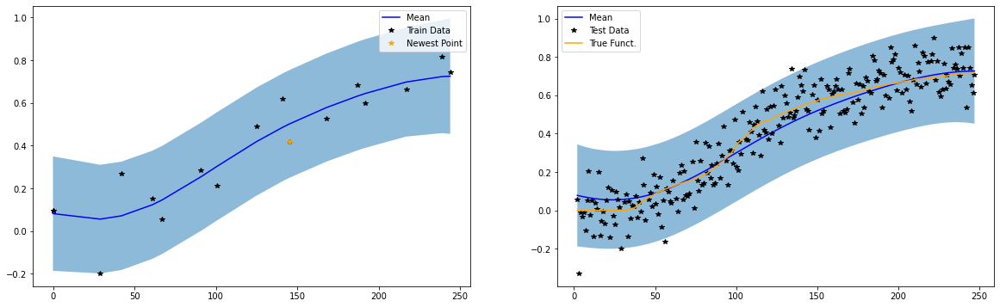

Train RMSE: 0.10007999837398529, Test RMSE: 0.10555999726057053, Noise: 0.01326

####################################################

BEFORE TRAINING
18 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


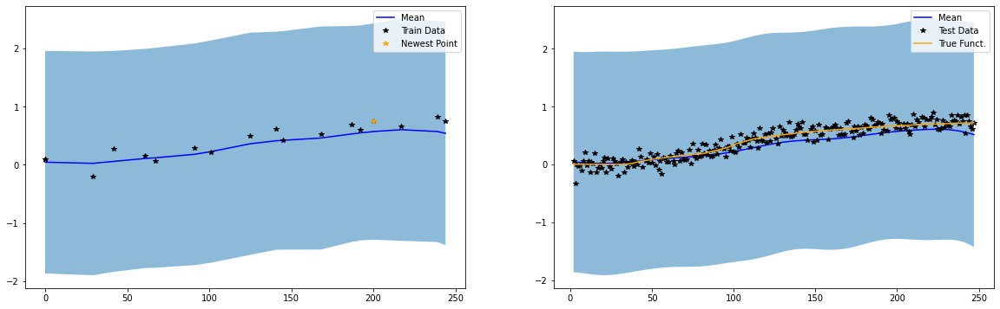

Iter 0/500 - Loss: 1.025   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.293   lengthscale: 30.586   noise: 0.011
Iter 100/500 - Loss: -0.332   lengthscale: 36.113   noise: 0.013
Iter 150/500 - Loss: -0.358   lengthscale: 40.877   noise: 0.014
Iter 200/500 - Loss: -0.378   lengthscale: 45.194   noise: 0.013
Iter 250/500 - Loss: -0.394   lengthscale: 49.199   noise: 0.013
Iter 300/500 - Loss: -0.408   lengthscale: 52.939   noise: 0.013
Iter 350/500 - Loss: -0.419   lengthscale: 56.429   noise: 0.013
Iter 400/500 - Loss: -0.429   lengthscale: 59.687   noise: 0.013
Iter 450/500 - Loss: -0.437   lengthscale: 62.736   noise: 0.013
Iter 500/500 - Loss: -0.443   lengthscale: 65.601   noise: 0.013


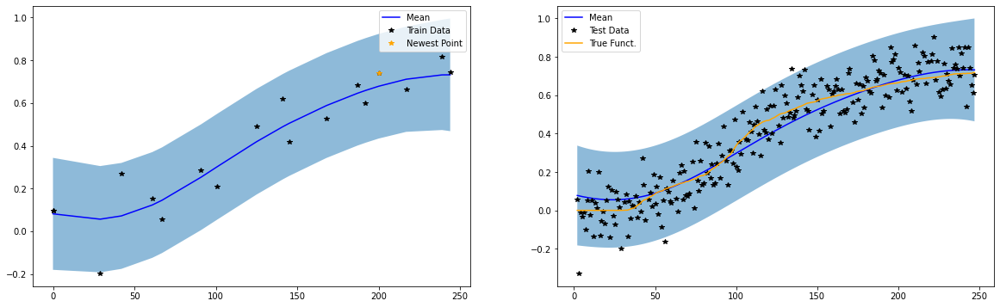

Train RMSE: 0.09849999845027924, Test RMSE: 0.1048400029540062, Noise: 0.01267

####################################################

BEFORE TRAINING
19 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


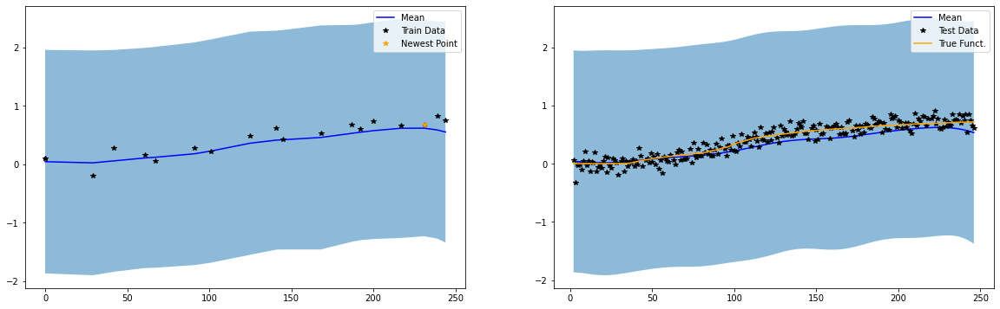

Iter 0/500 - Loss: 1.017   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.328   lengthscale: 30.569   noise: 0.011
Iter 100/500 - Loss: -0.366   lengthscale: 36.065   noise: 0.013
Iter 150/500 - Loss: -0.392   lengthscale: 40.915   noise: 0.013
Iter 200/500 - Loss: -0.412   lengthscale: 45.317   noise: 0.013
Iter 250/500 - Loss: -0.428   lengthscale: 49.380   noise: 0.013
Iter 300/500 - Loss: -0.442   lengthscale: 53.151   noise: 0.012
Iter 350/500 - Loss: -0.453   lengthscale: 56.655   noise: 0.012
Iter 400/500 - Loss: -0.462   lengthscale: 59.917   noise: 0.012
Iter 450/500 - Loss: -0.470   lengthscale: 62.964   noise: 0.012
Iter 500/500 - Loss: -0.477   lengthscale: 65.822   noise: 0.012


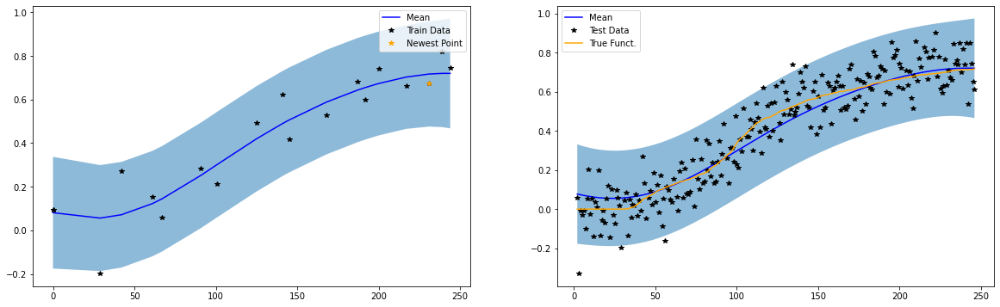

Train RMSE: 0.09696999937295914, Test RMSE: 0.10513000190258026, Noise: 0.0121

####################################################

BEFORE TRAINING
20 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


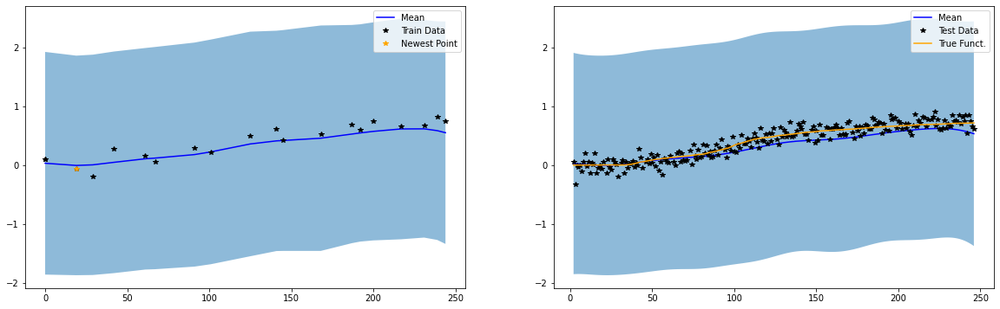

Iter 0/500 - Loss: 1.010   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.357   lengthscale: 30.471   noise: 0.010
Iter 100/500 - Loss: -0.385   lengthscale: 35.541   noise: 0.012
Iter 150/500 - Loss: -0.407   lengthscale: 40.408   noise: 0.012
Iter 200/500 - Loss: -0.425   lengthscale: 44.995   noise: 0.012
Iter 250/500 - Loss: -0.442   lengthscale: 49.305   noise: 0.012
Iter 300/500 - Loss: -0.455   lengthscale: 53.320   noise: 0.012
Iter 350/500 - Loss: -0.466   lengthscale: 57.027   noise: 0.012
Iter 400/500 - Loss: -0.475   lengthscale: 60.439   noise: 0.012
Iter 450/500 - Loss: -0.482   lengthscale: 63.587   noise: 0.012
Iter 500/500 - Loss: -0.488   lengthscale: 66.507   noise: 0.012


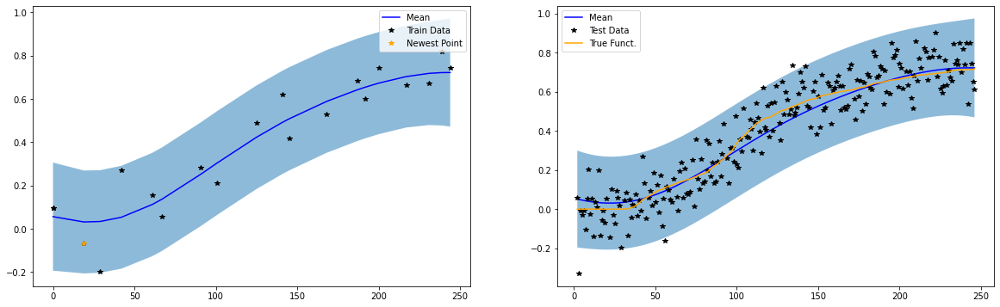

Train RMSE: 0.09657999873161316, Test RMSE: 0.10243000090122223, Noise: 0.01188



In [73]:
final_train_rmses, final_test_rmses, noise_estimates, final_true_test_rmses = train(m0_pa3_cont5, m0_pa3_cont5_noisy, 20, False)

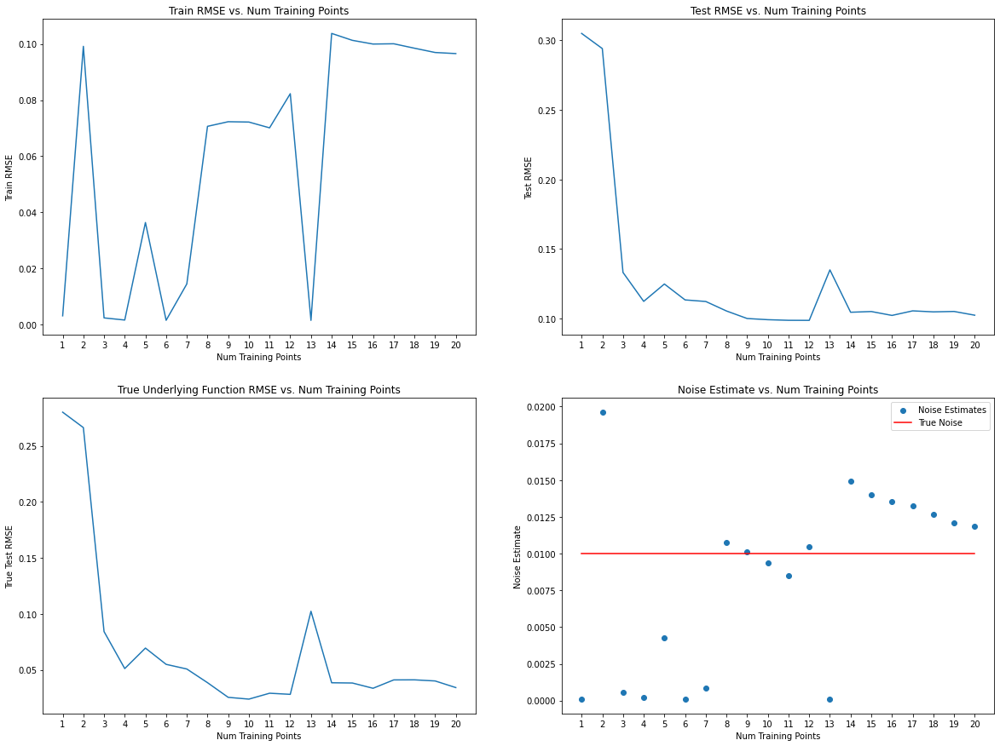

In [74]:
plot_rmses_and_noise(final_train_rmses, final_test_rmses, final_true_test_rmses, noise_estimates, 20)

####################################################

BEFORE TRAINING
1 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


/var/folders/c0/0rqzqv5n0bg36m4j1jc_zv3w0000gn/T/ipykernel_9540/3709150696.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k*" (-> color='k'). The keyword argument will take precedence.
  ax[0].plot(newest_point[0], newest_point[1], 'k*', color = 'orange', label = 'Newest Point')


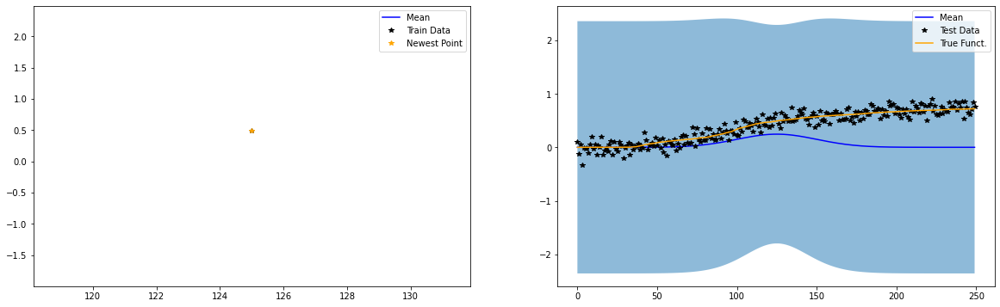

Iter 0/500 - Loss: 1.169   lengthscale: 25.000   noise: 0.644
Iter 50/500 - Loss: -1.351   lengthscale: 25.000   noise: 0.005
Iter 100/500 - Loss: -3.037   lengthscale: 25.000   noise: 0.000
Iter 150/500 - Loss: -3.543   lengthscale: 25.000   noise: 0.000
Iter 200/500 - Loss: -3.604   lengthscale: 25.000   noise: 0.000
Iter 250/500 - Loss: -3.567   lengthscale: 25.000   noise: 0.000
Iter 300/500 - Loss: -3.582   lengthscale: 25.000   noise: 0.000
Iter 350/500 - Loss: -3.667   lengthscale: 25.000   noise: 0.000
Iter 400/500 - Loss: -3.677   lengthscale: 25.000   noise: 0.000
Iter 450/500 - Loss: -3.606   lengthscale: 25.000   noise: 0.000
Iter 500/500 - Loss: -3.646   lengthscale: 25.000   noise: 0.000


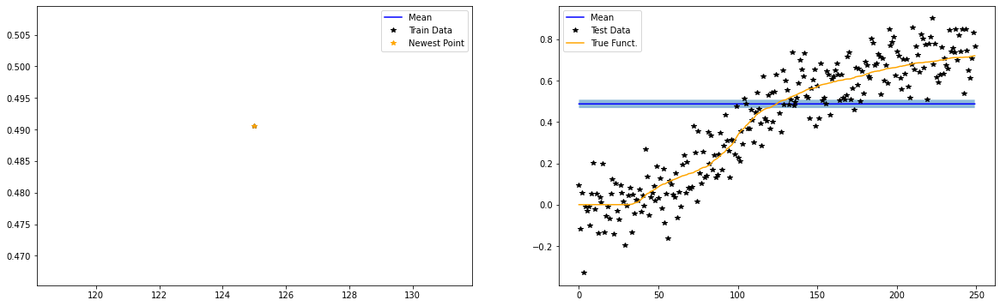

Train RMSE: 0.0030799999367445707, Test RMSE: 0.3050299882888794, Noise: 0.0001

####################################################

BEFORE TRAINING
2 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


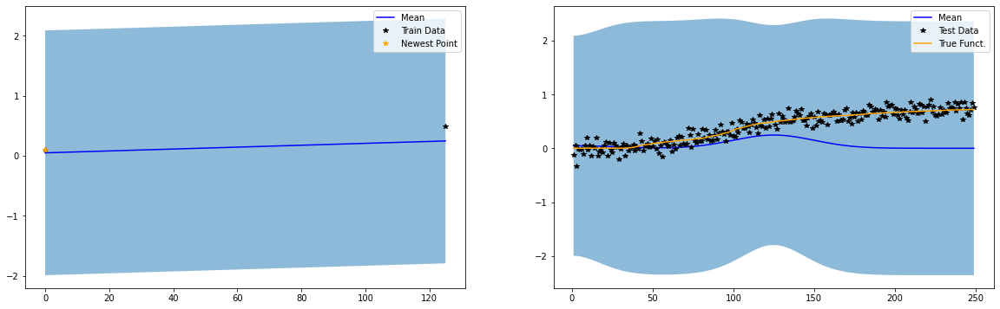

Iter 0/500 - Loss: 1.127   lengthscale: 25.076   noise: 0.644
Iter 50/500 - Loss: -0.181   lengthscale: 21.330   noise: 0.015
Iter 100/500 - Loss: -0.201   lengthscale: 20.209   noise: 0.019
Iter 150/500 - Loss: -0.201   lengthscale: 19.939   noise: 0.020
Iter 200/500 - Loss: -0.201   lengthscale: 19.746   noise: 0.020
Iter 250/500 - Loss: -0.201   lengthscale: 19.595   noise: 0.020
Iter 300/500 - Loss: -0.201   lengthscale: 19.471   noise: 0.020
Iter 350/500 - Loss: -0.201   lengthscale: 19.366   noise: 0.020
Iter 400/500 - Loss: -0.201   lengthscale: 19.276   noise: 0.020
Iter 450/500 - Loss: -0.201   lengthscale: 19.197   noise: 0.020
Iter 500/500 - Loss: -0.201   lengthscale: 19.126   noise: 0.020


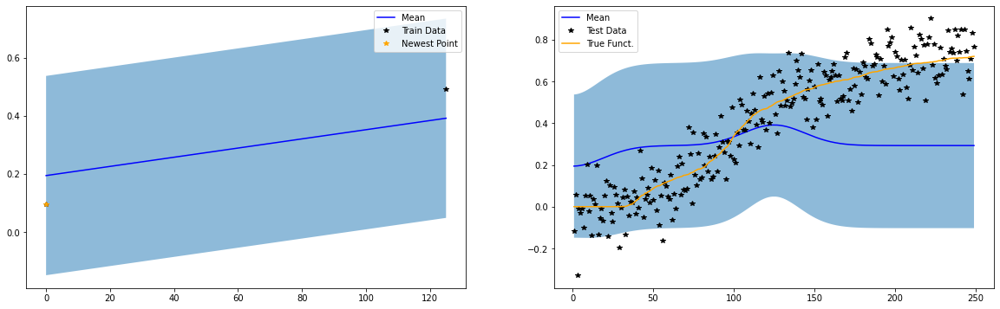

Train RMSE: 0.09916000068187714, Test RMSE: 0.2941400110721588, Noise: 0.01962

####################################################

BEFORE TRAINING
3 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


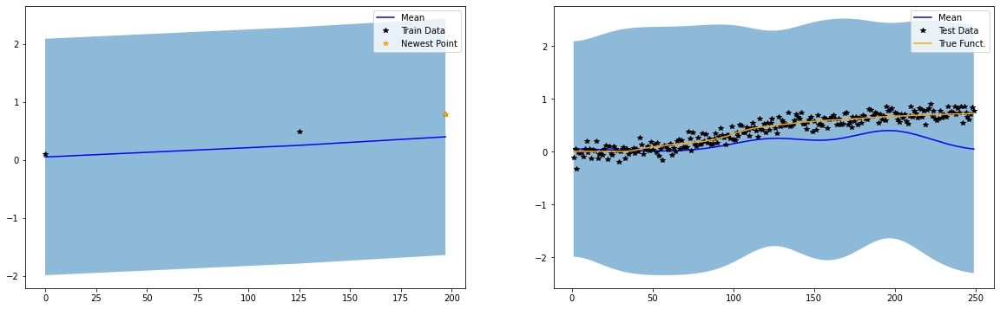

Iter 0/500 - Loss: 1.186   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.165   lengthscale: 29.028   noise: 0.035
Iter 100/500 - Loss: 0.156   lengthscale: 35.413   noise: 0.039
Iter 150/500 - Loss: 0.152   lengthscale: 42.362   noise: 0.034
Iter 200/500 - Loss: 0.147   lengthscale: 49.733   noise: 0.025
Iter 250/500 - Loss: 0.136   lengthscale: 58.166   noise: 0.015
Iter 300/500 - Loss: 0.120   lengthscale: 67.474   noise: 0.008
Iter 350/500 - Loss: 0.102   lengthscale: 76.576   noise: 0.004
Iter 400/500 - Loss: 0.085   lengthscale: 84.789   noise: 0.002
Iter 450/500 - Loss: 0.071   lengthscale: 92.011   noise: 0.001
Iter 500/500 - Loss: 0.061   lengthscale: 98.373   noise: 0.001


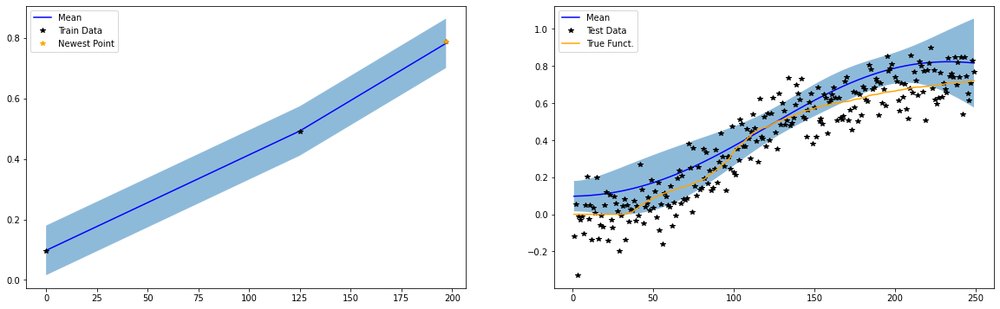

Train RMSE: 0.00343999988399446, Test RMSE: 0.13079999387264252, Noise: 0.00085

####################################################

BEFORE TRAINING
4 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


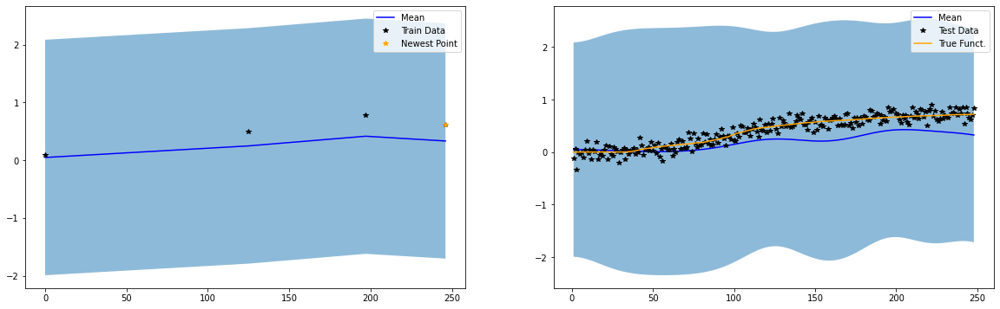

Iter 0/500 - Loss: 1.187   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.044   lengthscale: 30.279   noise: 0.024
Iter 100/500 - Loss: 0.006   lengthscale: 36.789   noise: 0.016
Iter 150/500 - Loss: -0.026   lengthscale: 43.465   noise: 0.007
Iter 200/500 - Loss: -0.051   lengthscale: 49.677   noise: 0.003
Iter 250/500 - Loss: -0.067   lengthscale: 54.926   noise: 0.002
Iter 300/500 - Loss: -0.076   lengthscale: 59.025   noise: 0.002
Iter 350/500 - Loss: -0.080   lengthscale: 61.937   noise: 0.001
Iter 400/500 - Loss: -0.082   lengthscale: 63.796   noise: 0.001
Iter 450/500 - Loss: -0.082   lengthscale: 64.866   noise: 0.001
Iter 500/500 - Loss: -0.082   lengthscale: 65.431   noise: 0.001


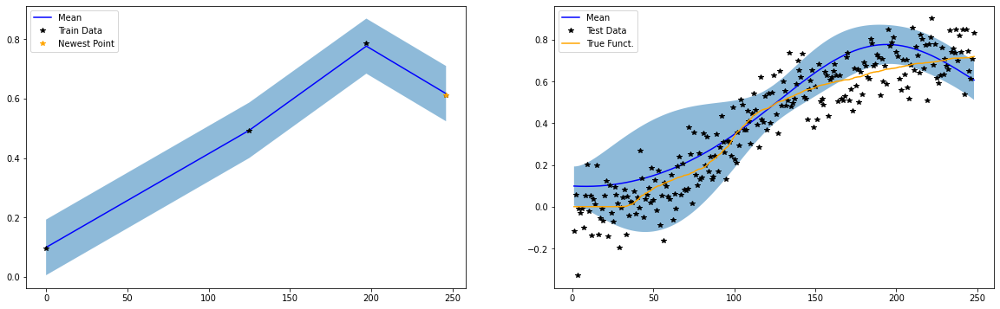

Train RMSE: 0.006310000084340572, Test RMSE: 0.1262899935245514, Noise: 0.0011

####################################################

BEFORE TRAINING
5 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


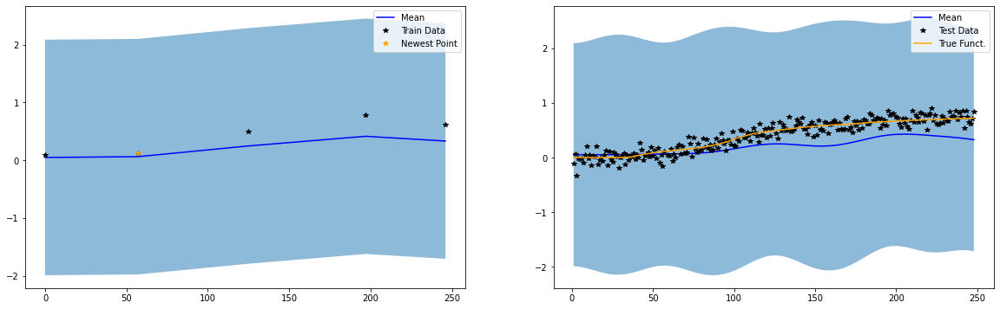

Iter 0/500 - Loss: 1.167   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.069   lengthscale: 31.159   noise: 0.022
Iter 100/500 - Loss: -0.022   lengthscale: 38.027   noise: 0.008
Iter 150/500 - Loss: -0.098   lengthscale: 44.628   noise: 0.003
Iter 200/500 - Loss: -0.161   lengthscale: 50.734   noise: 0.001
Iter 250/500 - Loss: -0.213   lengthscale: 56.288   noise: 0.001
Iter 300/500 - Loss: -0.253   lengthscale: 61.244   noise: 0.000
Iter 350/500 - Loss: -0.283   lengthscale: 65.550   noise: 0.000
Iter 400/500 - Loss: -0.303   lengthscale: 69.181   noise: 0.000
Iter 450/500 - Loss: -0.316   lengthscale: 72.155   noise: 0.000
Iter 500/500 - Loss: -0.324   lengthscale: 74.524   noise: 0.000


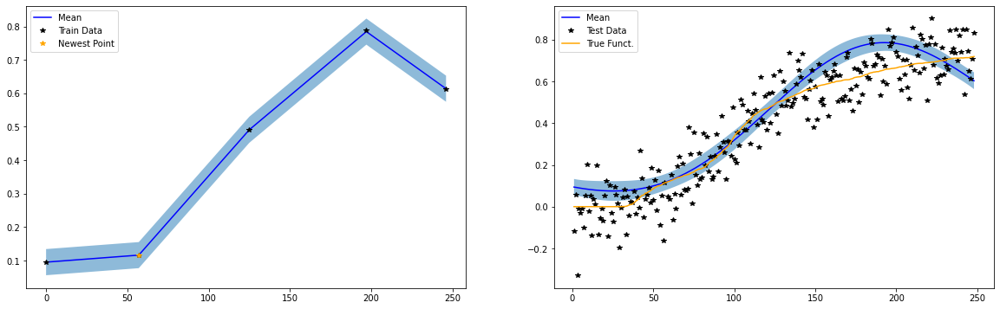

Train RMSE: 0.0013699999544769526, Test RMSE: 0.12240999937057495, Noise: 0.00019

####################################################

BEFORE TRAINING
6 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


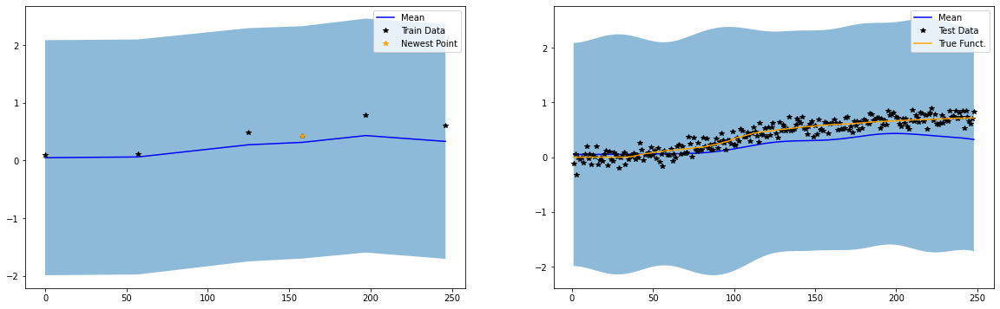

Iter 0/500 - Loss: 1.150   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.011   lengthscale: 30.811   noise: 0.019
Iter 100/500 - Loss: -0.061   lengthscale: 36.686   noise: 0.013
Iter 150/500 - Loss: -0.078   lengthscale: 41.313   noise: 0.016
Iter 200/500 - Loss: -0.095   lengthscale: 46.079   noise: 0.017
Iter 250/500 - Loss: -0.112   lengthscale: 50.745   noise: 0.017
Iter 300/500 - Loss: -0.126   lengthscale: 55.217   noise: 0.017
Iter 350/500 - Loss: -0.139   lengthscale: 59.441   noise: 0.016
Iter 400/500 - Loss: -0.149   lengthscale: 63.388   noise: 0.016
Iter 450/500 - Loss: -0.158   lengthscale: 67.041   noise: 0.016
Iter 500/500 - Loss: -0.165   lengthscale: 70.395   noise: 0.015


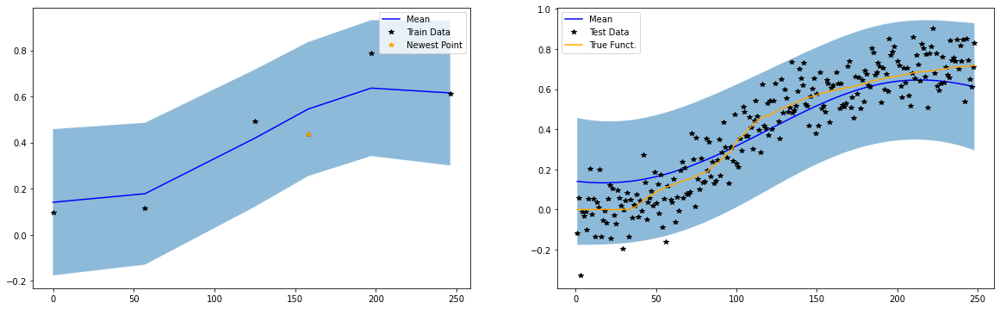

Train RMSE: 0.08765000104904175, Test RMSE: 0.1294099986553192, Noise: 0.01538

####################################################

BEFORE TRAINING
7 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


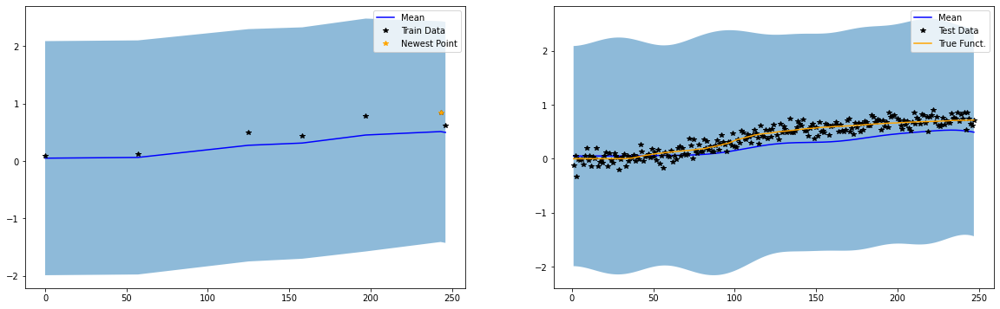

Iter 0/500 - Loss: 1.138   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: 0.019   lengthscale: 30.890   noise: 0.019
Iter 100/500 - Loss: -0.023   lengthscale: 36.870   noise: 0.018
Iter 150/500 - Loss: -0.044   lengthscale: 41.633   noise: 0.018
Iter 200/500 - Loss: -0.060   lengthscale: 45.886   noise: 0.018
Iter 250/500 - Loss: -0.074   lengthscale: 49.916   noise: 0.018
Iter 300/500 - Loss: -0.087   lengthscale: 53.822   noise: 0.018
Iter 350/500 - Loss: -0.098   lengthscale: 57.626   noise: 0.018
Iter 400/500 - Loss: -0.109   lengthscale: 61.323   noise: 0.018
Iter 450/500 - Loss: -0.118   lengthscale: 64.897   noise: 0.018
Iter 500/500 - Loss: -0.127   lengthscale: 68.330   noise: 0.017


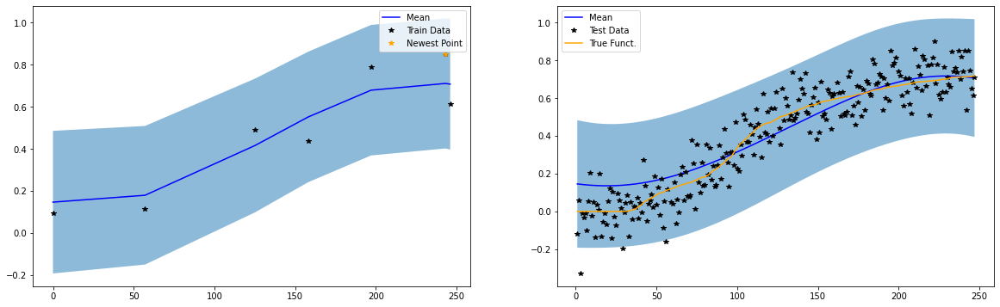

Train RMSE: 0.09718000143766403, Test RMSE: 0.12414000183343887, Noise: 0.01737

####################################################

BEFORE TRAINING
8 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


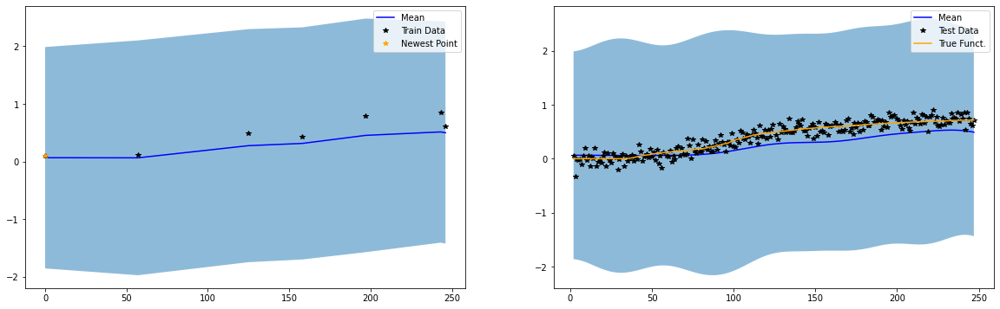

Iter 0/500 - Loss: 1.113   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.093   lengthscale: 30.952   noise: 0.013
Iter 100/500 - Loss: -0.128   lengthscale: 36.605   noise: 0.011
Iter 150/500 - Loss: -0.143   lengthscale: 40.905   noise: 0.012
Iter 200/500 - Loss: -0.155   lengthscale: 44.760   noise: 0.013
Iter 250/500 - Loss: -0.166   lengthscale: 48.623   noise: 0.013
Iter 300/500 - Loss: -0.178   lengthscale: 52.605   noise: 0.014
Iter 350/500 - Loss: -0.189   lengthscale: 56.668   noise: 0.014
Iter 400/500 - Loss: -0.200   lengthscale: 60.731   noise: 0.014
Iter 450/500 - Loss: -0.211   lengthscale: 64.718   noise: 0.014
Iter 500/500 - Loss: -0.220   lengthscale: 68.574   noise: 0.014


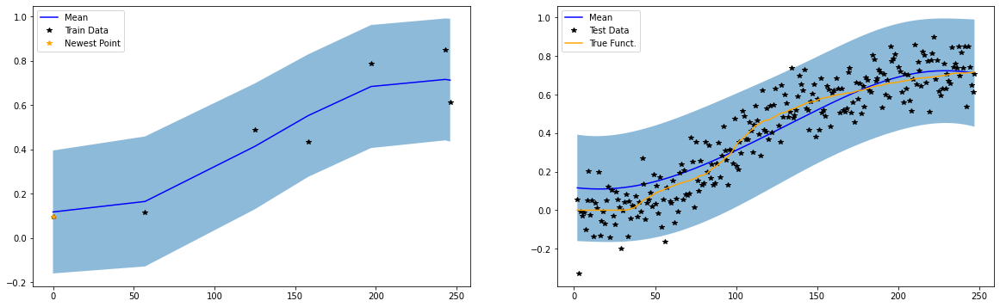

Train RMSE: 0.08778999745845795, Test RMSE: 0.11740999668836594, Noise: 0.01366

####################################################

BEFORE TRAINING
9 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


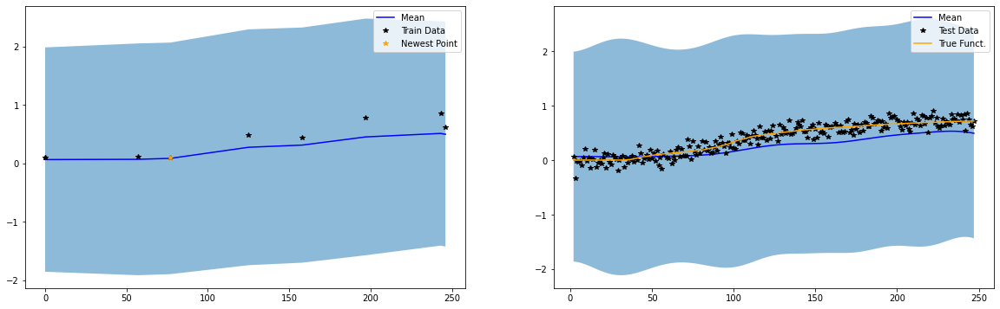

Iter 0/500 - Loss: 1.101   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.129   lengthscale: 30.848   noise: 0.012
Iter 100/500 - Loss: -0.156   lengthscale: 35.919   noise: 0.011
Iter 150/500 - Loss: -0.171   lengthscale: 40.392   noise: 0.012
Iter 200/500 - Loss: -0.189   lengthscale: 45.221   noise: 0.012
Iter 250/500 - Loss: -0.208   lengthscale: 50.312   noise: 0.013
Iter 300/500 - Loss: -0.227   lengthscale: 55.303   noise: 0.013
Iter 350/500 - Loss: -0.243   lengthscale: 60.011   noise: 0.013
Iter 400/500 - Loss: -0.257   lengthscale: 64.381   noise: 0.013
Iter 450/500 - Loss: -0.268   lengthscale: 68.407   noise: 0.012
Iter 500/500 - Loss: -0.277   lengthscale: 72.097   noise: 0.012


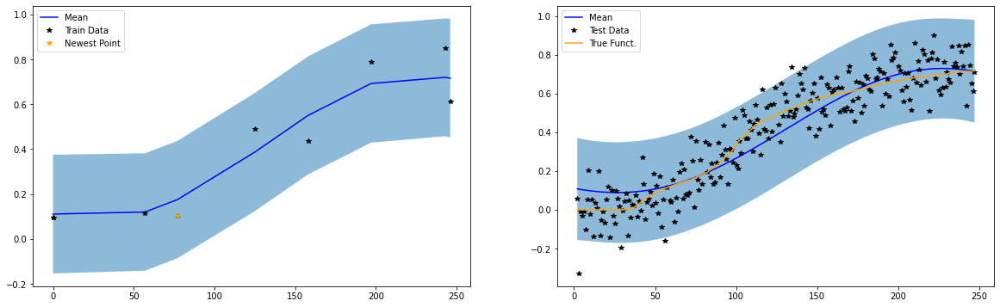

Train RMSE: 0.08598999679088593, Test RMSE: 0.11581999808549881, Noise: 0.01236

####################################################

BEFORE TRAINING
10 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


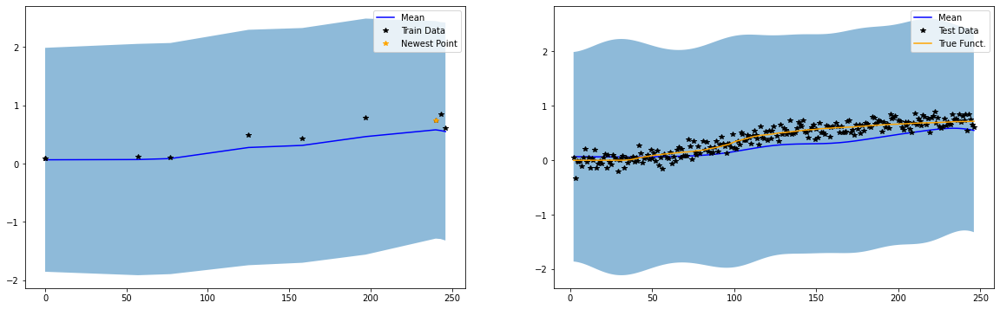

Iter 0/500 - Loss: 1.082   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.236   lengthscale: 30.831   noise: 0.010
Iter 100/500 - Loss: -0.262   lengthscale: 35.336   noise: 0.008
Iter 150/500 - Loss: -0.269   lengthscale: 38.668   noise: 0.009
Iter 200/500 - Loss: -0.277   lengthscale: 42.360   noise: 0.009
Iter 250/500 - Loss: -0.291   lengthscale: 47.162   noise: 0.010
Iter 300/500 - Loss: -0.309   lengthscale: 52.668   noise: 0.011
Iter 350/500 - Loss: -0.326   lengthscale: 58.168   noise: 0.011
Iter 400/500 - Loss: -0.342   lengthscale: 63.314   noise: 0.011
Iter 450/500 - Loss: -0.355   lengthscale: 68.009   noise: 0.011
Iter 500/500 - Loss: -0.365   lengthscale: 72.248   noise: 0.010


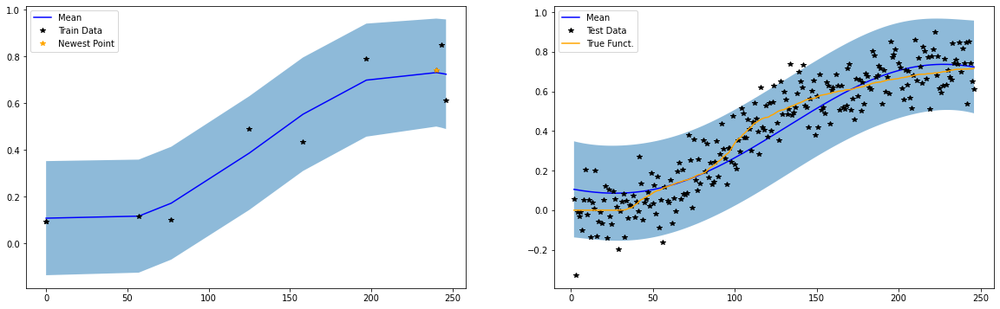

Train RMSE: 0.08083000034093857, Test RMSE: 0.11580000072717667, Noise: 0.01044

####################################################

BEFORE TRAINING
11 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


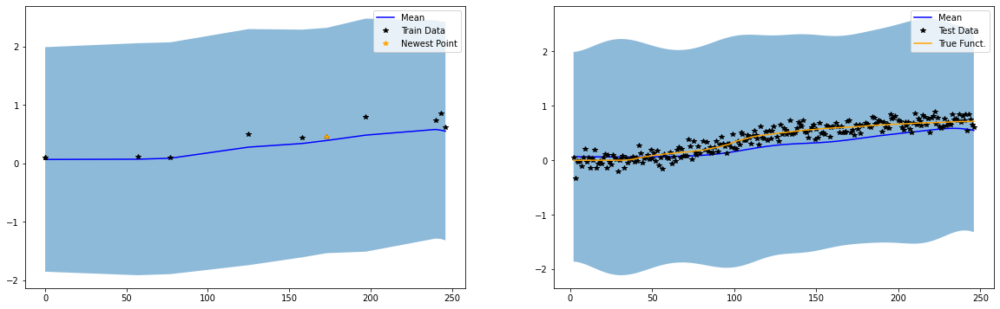

Iter 0/500 - Loss: 1.070   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.293   lengthscale: 30.693   noise: 0.009
Iter 100/500 - Loss: -0.320   lengthscale: 33.989   noise: 0.007
Iter 150/500 - Loss: -0.320   lengthscale: 34.637   noise: 0.007
Iter 200/500 - Loss: -0.320   lengthscale: 34.677   noise: 0.007
Iter 250/500 - Loss: -0.320   lengthscale: 34.676   noise: 0.007
Iter 300/500 - Loss: -0.320   lengthscale: 34.675   noise: 0.007
Iter 350/500 - Loss: -0.320   lengthscale: 34.675   noise: 0.007
Iter 400/500 - Loss: -0.320   lengthscale: 34.675   noise: 0.007
Iter 450/500 - Loss: -0.320   lengthscale: 34.675   noise: 0.007
Iter 500/500 - Loss: -0.320   lengthscale: 34.675   noise: 0.007


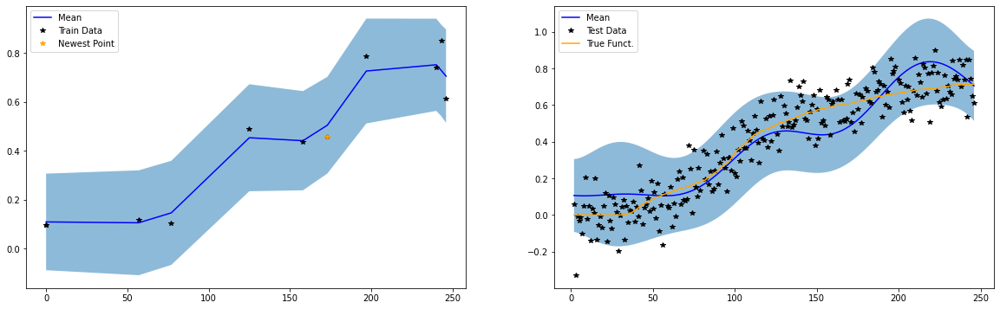

Train RMSE: 0.05485000088810921, Test RMSE: 0.1273300051689148, Noise: 0.00664

####################################################

BEFORE TRAINING
12 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


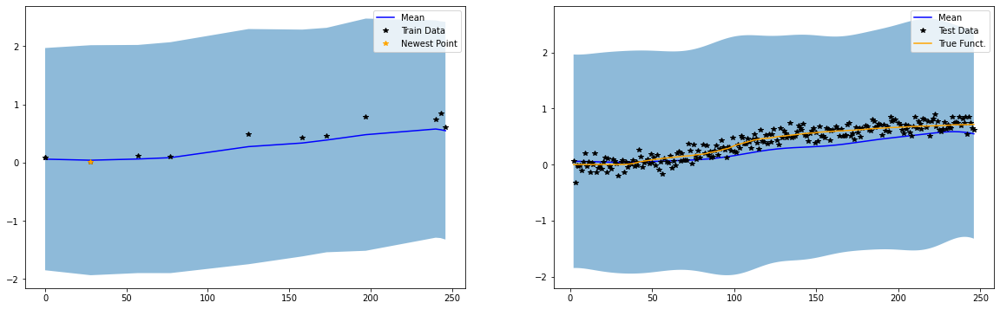

Iter 0/500 - Loss: 1.064   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.326   lengthscale: 30.775   noise: 0.009
Iter 100/500 - Loss: -0.362   lengthscale: 35.128   noise: 0.007
Iter 150/500 - Loss: -0.366   lengthscale: 37.432   noise: 0.007
Iter 200/500 - Loss: -0.368   lengthscale: 38.933   noise: 0.007
Iter 250/500 - Loss: -0.369   lengthscale: 40.178   noise: 0.008
Iter 300/500 - Loss: -0.369   lengthscale: 41.392   noise: 0.008
Iter 350/500 - Loss: -0.370   lengthscale: 42.743   noise: 0.008
Iter 400/500 - Loss: -0.372   lengthscale: 44.413   noise: 0.009
Iter 450/500 - Loss: -0.374   lengthscale: 46.604   noise: 0.009
Iter 500/500 - Loss: -0.378   lengthscale: 49.475   noise: 0.010


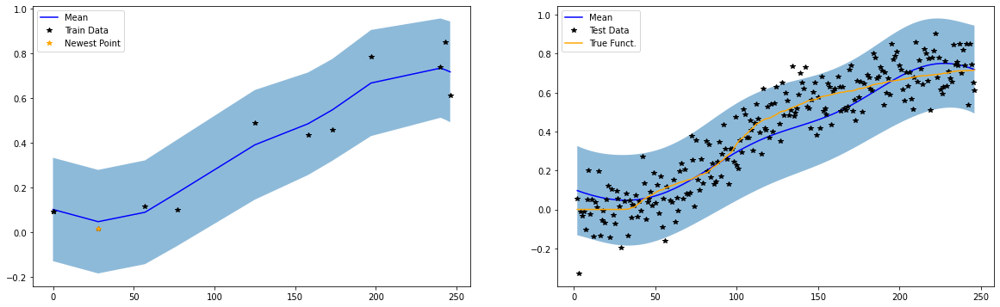

Train RMSE: 0.07554999738931656, Test RMSE: 0.11580000072717667, Noise: 0.00954

####################################################

BEFORE TRAINING
13 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


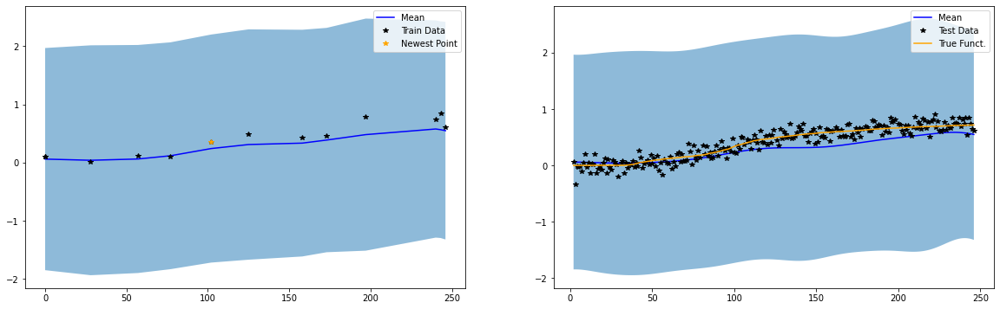

Iter 0/500 - Loss: 1.059   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.378   lengthscale: 30.728   noise: 0.008
Iter 100/500 - Loss: -0.428   lengthscale: 35.501   noise: 0.006
Iter 150/500 - Loss: -0.432   lengthscale: 37.673   noise: 0.006
Iter 200/500 - Loss: -0.433   lengthscale: 38.811   noise: 0.006
Iter 250/500 - Loss: -0.433   lengthscale: 39.522   noise: 0.006
Iter 300/500 - Loss: -0.433   lengthscale: 40.004   noise: 0.006
Iter 350/500 - Loss: -0.433   lengthscale: 40.345   noise: 0.006
Iter 400/500 - Loss: -0.433   lengthscale: 40.593   noise: 0.007
Iter 450/500 - Loss: -0.433   lengthscale: 40.777   noise: 0.007
Iter 500/500 - Loss: -0.433   lengthscale: 40.913   noise: 0.007


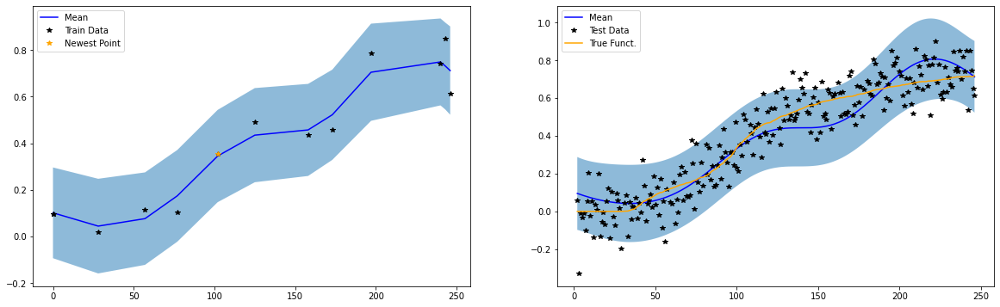

Train RMSE: 0.05973999947309494, Test RMSE: 0.11714000254869461, Noise: 0.00661

####################################################

BEFORE TRAINING
14 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


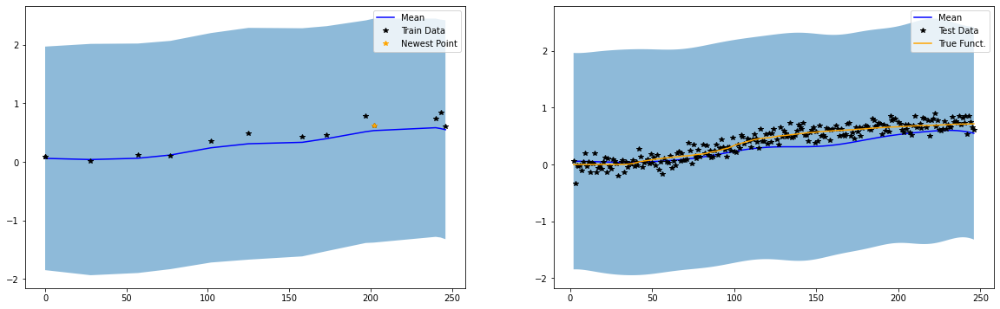

Iter 0/500 - Loss: 1.050   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.392   lengthscale: 30.716   noise: 0.009
Iter 100/500 - Loss: -0.436   lengthscale: 36.462   noise: 0.008
Iter 150/500 - Loss: -0.453   lengthscale: 40.411   noise: 0.008
Iter 200/500 - Loss: -0.463   lengthscale: 43.494   noise: 0.008
Iter 250/500 - Loss: -0.469   lengthscale: 46.089   noise: 0.008
Iter 300/500 - Loss: -0.474   lengthscale: 48.378   noise: 0.008
Iter 350/500 - Loss: -0.477   lengthscale: 50.466   noise: 0.008
Iter 400/500 - Loss: -0.480   lengthscale: 52.420   noise: 0.009
Iter 450/500 - Loss: -0.483   lengthscale: 54.289   noise: 0.009
Iter 500/500 - Loss: -0.485   lengthscale: 56.113   noise: 0.009


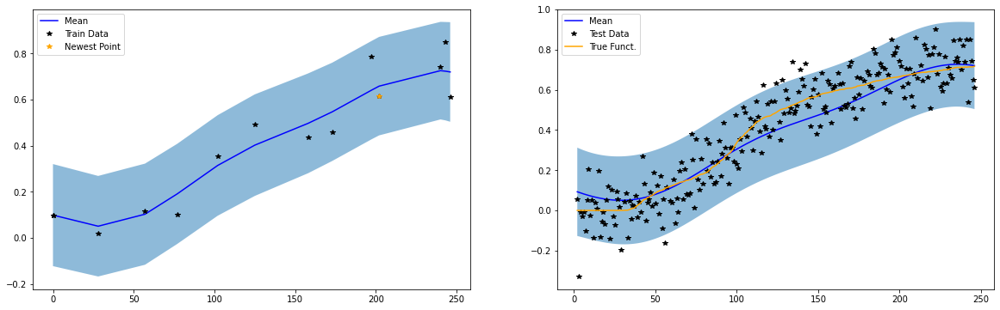

Train RMSE: 0.07656999677419662, Test RMSE: 0.11445000022649765, Noise: 0.00881

####################################################

BEFORE TRAINING
15 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


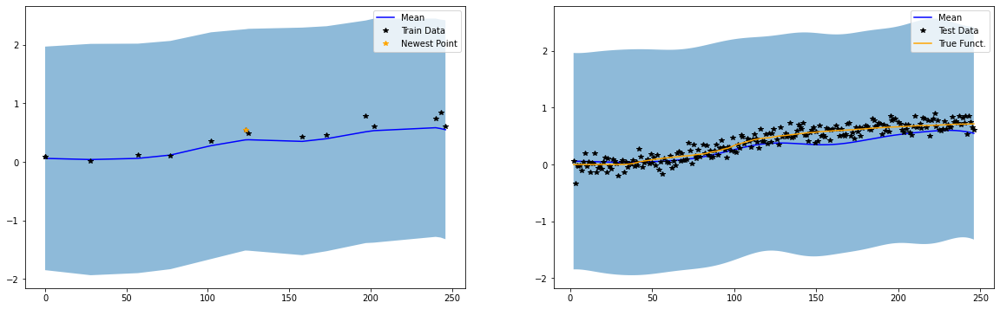

Iter 0/500 - Loss: 1.043   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.428   lengthscale: 30.626   noise: 0.008
Iter 100/500 - Loss: -0.462   lengthscale: 35.886   noise: 0.007
Iter 150/500 - Loss: -0.471   lengthscale: 39.029   noise: 0.007
Iter 200/500 - Loss: -0.474   lengthscale: 41.105   noise: 0.008
Iter 250/500 - Loss: -0.476   lengthscale: 42.603   noise: 0.008
Iter 300/500 - Loss: -0.476   lengthscale: 43.753   noise: 0.008
Iter 350/500 - Loss: -0.477   lengthscale: 44.678   noise: 0.008
Iter 400/500 - Loss: -0.477   lengthscale: 45.448   noise: 0.008
Iter 450/500 - Loss: -0.477   lengthscale: 46.108   noise: 0.008
Iter 500/500 - Loss: -0.478   lengthscale: 46.686   noise: 0.008


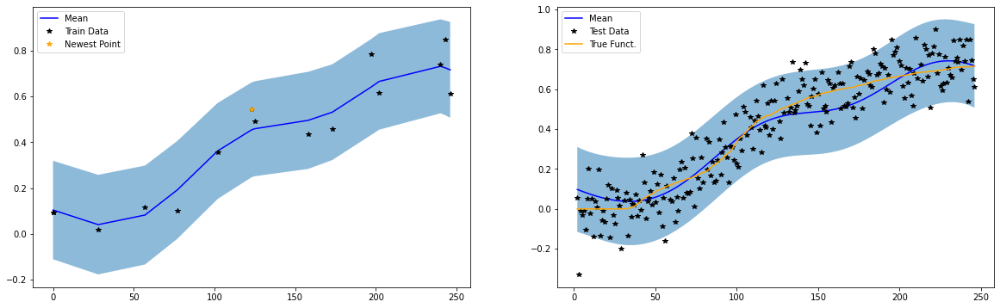

Train RMSE: 0.0724399983882904, Test RMSE: 0.10909999907016754, Noise: 0.00821

####################################################

BEFORE TRAINING
16 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


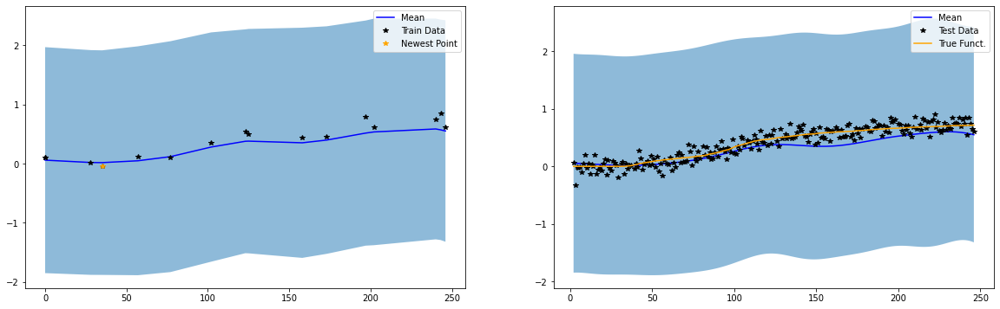

Iter 0/500 - Loss: 1.035   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.455   lengthscale: 30.662   noise: 0.008
Iter 100/500 - Loss: -0.493   lengthscale: 36.011   noise: 0.007
Iter 150/500 - Loss: -0.504   lengthscale: 39.488   noise: 0.007
Iter 200/500 - Loss: -0.509   lengthscale: 41.909   noise: 0.007
Iter 250/500 - Loss: -0.511   lengthscale: 43.659   noise: 0.007
Iter 300/500 - Loss: -0.512   lengthscale: 44.948   noise: 0.007
Iter 350/500 - Loss: -0.513   lengthscale: 45.909   noise: 0.008
Iter 400/500 - Loss: -0.513   lengthscale: 46.629   noise: 0.008
Iter 450/500 - Loss: -0.513   lengthscale: 47.169   noise: 0.008
Iter 500/500 - Loss: -0.513   lengthscale: 47.571   noise: 0.008


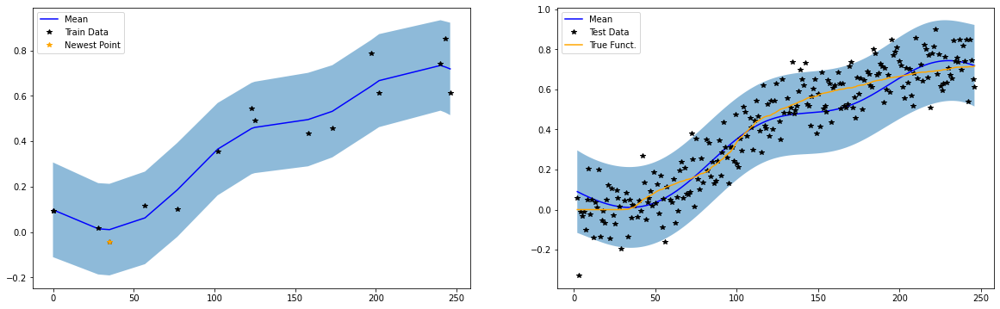

Train RMSE: 0.0710500031709671, Test RMSE: 0.10818000137805939, Noise: 0.0077

####################################################

BEFORE TRAINING
17 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


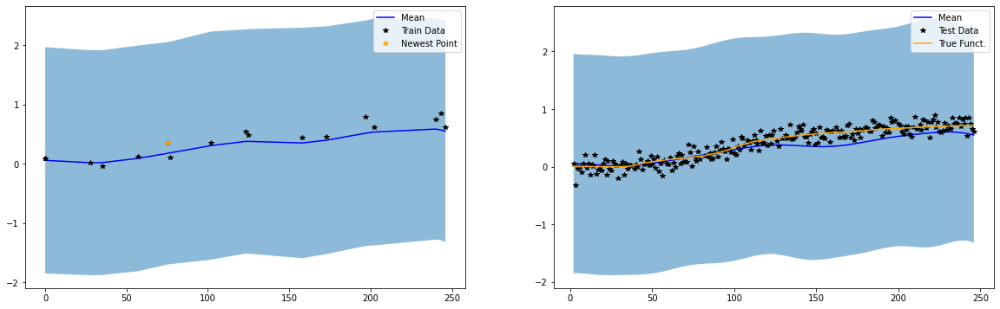

Iter 0/500 - Loss: 1.028   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.407   lengthscale: 30.644   noise: 0.009
Iter 100/500 - Loss: -0.442   lengthscale: 36.291   noise: 0.009
Iter 150/500 - Loss: -0.460   lengthscale: 40.430   noise: 0.009
Iter 200/500 - Loss: -0.469   lengthscale: 43.658   noise: 0.009
Iter 250/500 - Loss: -0.475   lengthscale: 46.173   noise: 0.009
Iter 300/500 - Loss: -0.478   lengthscale: 48.118   noise: 0.010
Iter 350/500 - Loss: -0.479   lengthscale: 49.619   noise: 0.010
Iter 400/500 - Loss: -0.480   lengthscale: 50.780   noise: 0.010
Iter 450/500 - Loss: -0.480   lengthscale: 51.682   noise: 0.010
Iter 500/500 - Loss: -0.481   lengthscale: 52.382   noise: 0.010


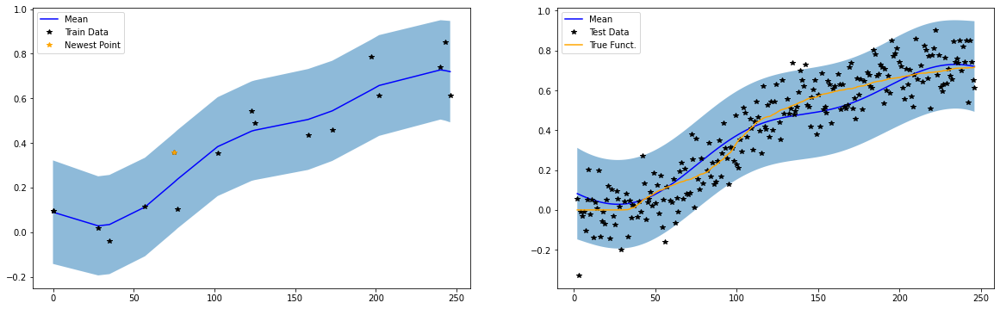

Train RMSE: 0.08268000185489655, Test RMSE: 0.10964000225067139, Noise: 0.00971

####################################################

BEFORE TRAINING
18 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


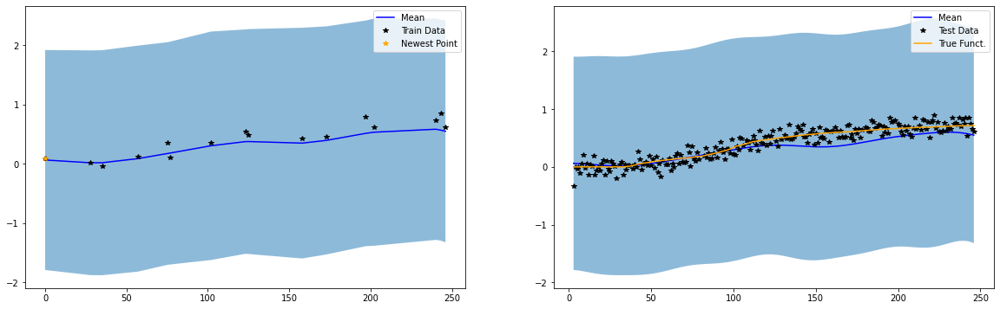

Iter 0/500 - Loss: 1.020   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.454   lengthscale: 30.650   noise: 0.009
Iter 100/500 - Loss: -0.488   lengthscale: 36.273   noise: 0.009
Iter 150/500 - Loss: -0.504   lengthscale: 40.387   noise: 0.009
Iter 200/500 - Loss: -0.513   lengthscale: 43.584   noise: 0.009
Iter 250/500 - Loss: -0.518   lengthscale: 46.052   noise: 0.009
Iter 300/500 - Loss: -0.521   lengthscale: 47.931   noise: 0.009
Iter 350/500 - Loss: -0.522   lengthscale: 49.349   noise: 0.009
Iter 400/500 - Loss: -0.523   lengthscale: 50.414   noise: 0.009
Iter 450/500 - Loss: -0.523   lengthscale: 51.211   noise: 0.009
Iter 500/500 - Loss: -0.524   lengthscale: 51.803   noise: 0.009


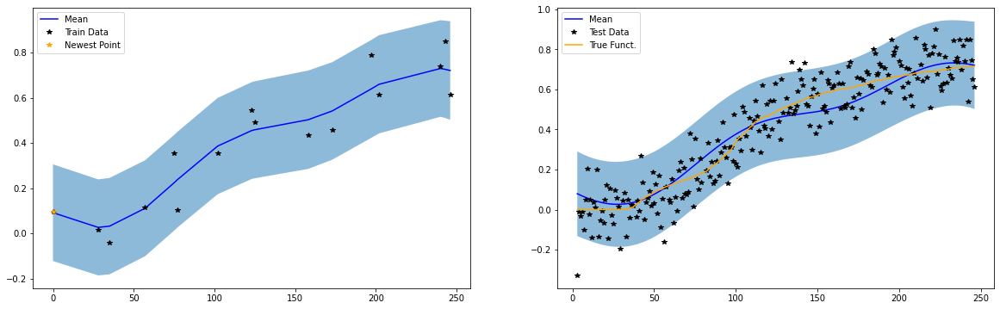

Train RMSE: 0.07976999878883362, Test RMSE: 0.11007999628782272, Noise: 0.00893

####################################################

BEFORE TRAINING
19 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


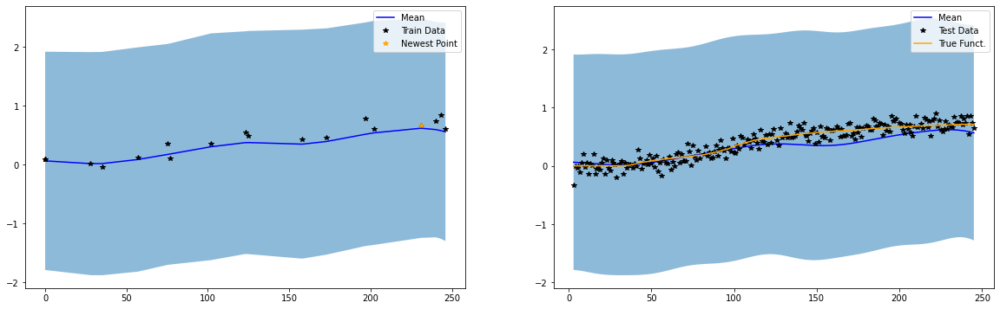

Iter 0/500 - Loss: 1.012   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.482   lengthscale: 30.614   noise: 0.008
Iter 100/500 - Loss: -0.516   lengthscale: 36.248   noise: 0.009
Iter 150/500 - Loss: -0.534   lengthscale: 40.611   noise: 0.008
Iter 200/500 - Loss: -0.545   lengthscale: 44.082   noise: 0.009
Iter 250/500 - Loss: -0.551   lengthscale: 46.801   noise: 0.009
Iter 300/500 - Loss: -0.555   lengthscale: 48.902   noise: 0.009
Iter 350/500 - Loss: -0.557   lengthscale: 50.518   noise: 0.009
Iter 400/500 - Loss: -0.558   lengthscale: 51.760   noise: 0.009
Iter 450/500 - Loss: -0.558   lengthscale: 52.717   noise: 0.009
Iter 500/500 - Loss: -0.558   lengthscale: 53.453   noise: 0.009


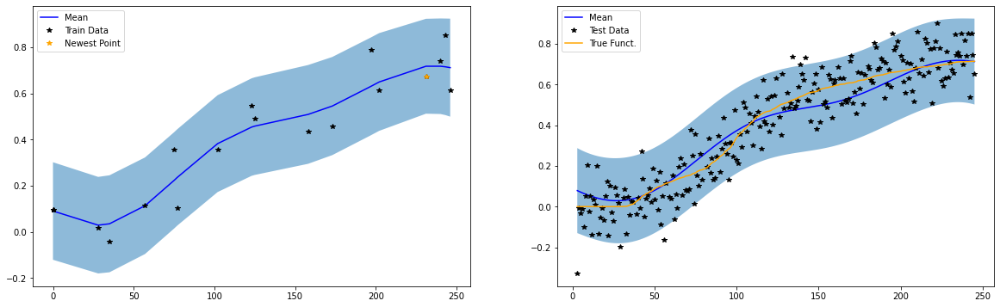

Train RMSE: 0.07987000048160553, Test RMSE: 0.10993999987840652, Noise: 0.00872

####################################################

BEFORE TRAINING
20 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


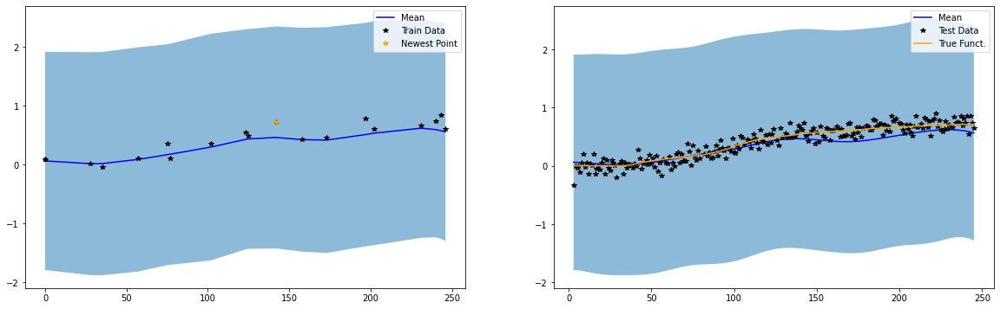

Iter 0/500 - Loss: 1.010   lengthscale: 25.100   noise: 0.644
Iter 50/500 - Loss: -0.403   lengthscale: 30.494   noise: 0.010
Iter 100/500 - Loss: -0.427   lengthscale: 35.525   noise: 0.011
Iter 150/500 - Loss: -0.444   lengthscale: 40.094   noise: 0.011
Iter 200/500 - Loss: -0.457   lengthscale: 44.187   noise: 0.011
Iter 250/500 - Loss: -0.466   lengthscale: 47.726   noise: 0.011
Iter 300/500 - Loss: -0.472   lengthscale: 50.702   noise: 0.011
Iter 350/500 - Loss: -0.476   lengthscale: 53.175   noise: 0.011
Iter 400/500 - Loss: -0.479   lengthscale: 55.228   noise: 0.011
Iter 450/500 - Loss: -0.480   lengthscale: 56.940   noise: 0.011
Iter 500/500 - Loss: -0.481   lengthscale: 58.376   noise: 0.011


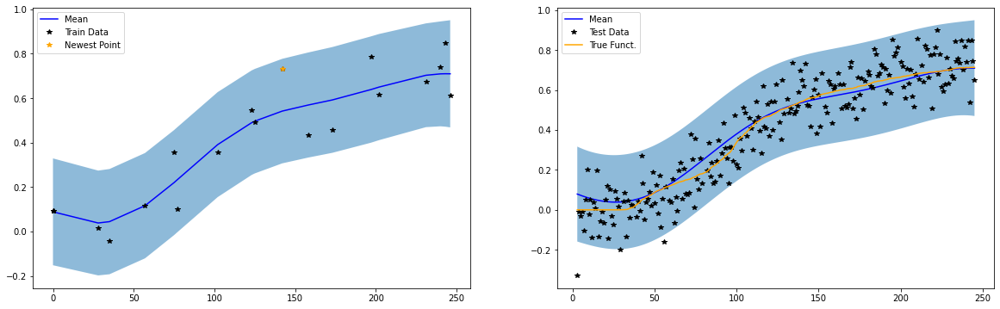

Train RMSE: 0.09334000200033188, Test RMSE: 0.10535000264644623, Noise: 0.01139



In [75]:
final_train_rmses, final_test_rmses, noise_estimates, final_true_test_rmses = train(m0_pa3_cont5, m0_pa3_cont5_noisy, 20, True)

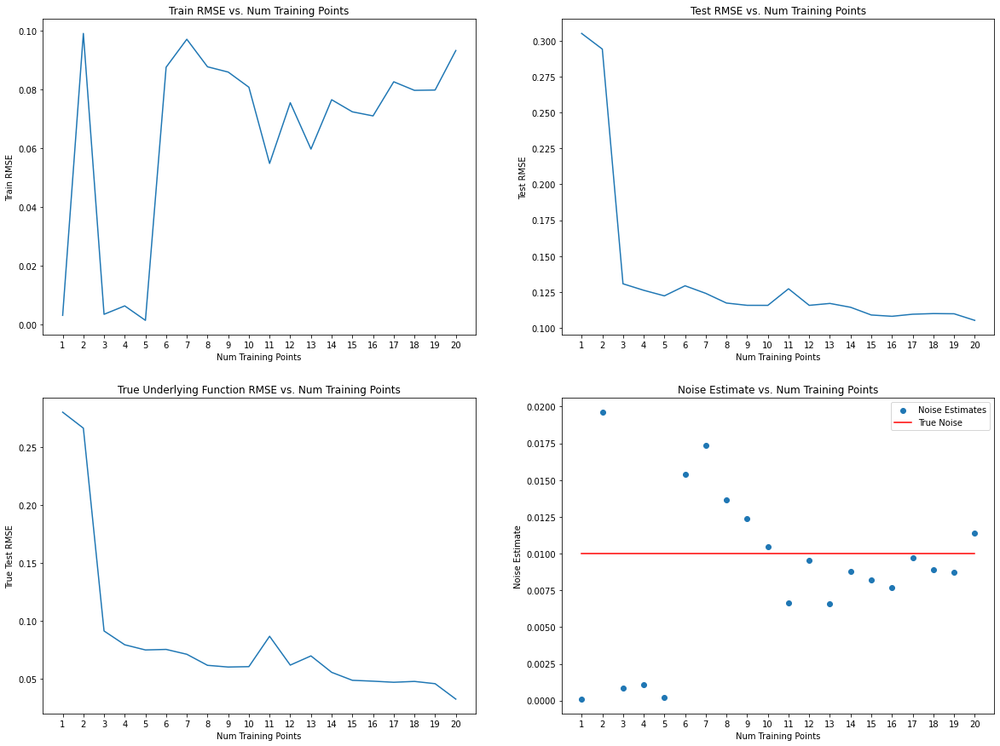

In [76]:
plot_rmses_and_noise(final_train_rmses, final_test_rmses, final_true_test_rmses, noise_estimates, 20)

# Results
 - Muscle 2, Contact 8, Pulse Amplitude 2.0: 7 points
 - Muscle 0, contact 3, pulse amplitude 1.0: 8 points
 - Muscle 0, contact 5, pulse amplitude 3.0: 8 points

## Quantifying tradeoff between sample size and accuracy